In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import random

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from cluster_filter import cfilter, cassign

from External.ICT.calculate_ICT import calculate_ICT, calculate_sub_ICTs
from External.clustering import centers, k_means_pp
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.create_k_nearest import patch_together

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest"
metric = "euclidean"
dataset = "non_convex"
ICT_algorithm = "cluster_all"


min_cluster_size = 12
small_behavior = "reassign"

# image loading
n = number_of_nodes = 1000
Random = True
image_name = "image"

# for the filename
parameters = "2-0_5-1000"

In [6]:
def load_image(filename):
    a=plt.imread(filename+'.png')
    rgb_weights = [0.2989, 0.5870, 0.1140]
    
    grayscale_image = np.dot(a[...,:3], rgb_weights)>0
    
    return grayscale_image
    
    
def sample_points_from_image(n,img,Random=True):
    if not Random:
        random.seed(42)
    non_zero = np.where(img!=0)
    # non_zero=np.vstack((non_zero[0],non_zero[1])).T
    
    
    idx = random.sample(range(len(non_zero[0])),n)
    
    x_coord = non_zero[0][idx]
    y_coord = non_zero[1][idx]
    return x_coord,y_coord

In [7]:
# Compute the position array
img = load_image(image_name)
position = np.array(sample_points_from_image(n,img,Random)).T
position = StandardScaler().fit_transform(position)

sklearn is done: 0.3877694606781006
My own part is done: 0.0012257099151611328


  0%|          | 0/1 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/6423 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6423 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 6423 -> 5839
update Arr 5839 -> 5294
update Arr 5294 -> 4803
update Arr 4803 -> 4365
update Arr 4365 -> 3968
update Arr 3968 -> 3604
update Arr 3604 -> 3272
update Arr 3272 -> 2969
update Arr 2969 -> 2697
update Arr 2697 -> 2450
update Arr 2450 -> 2227
update Arr 2227 -> 2024
update Arr 2024 -> 1836
update Arr 1836 -> 1669
update Arr 1669 -> 1515
update Arr 1515 -> 1376
update Arr 1376 -> 1249
update Arr 1249 -> 1134
update Arr 1134 -> 1025
update Arr 1025 -> 1009
update Arr 1009 -> 1005
update Arr 1005 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 999


create edgeId array:   0%|          | 0/999 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/999 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 999 -> 999
added 318 edges early
added 680 edges early


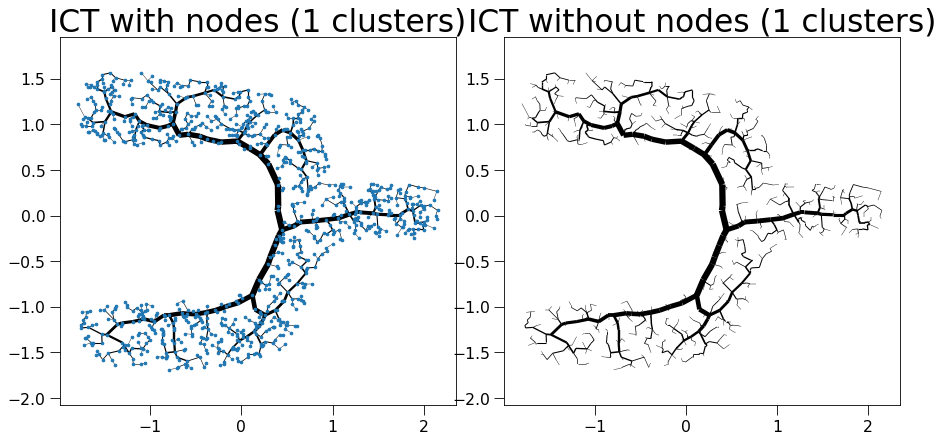

sklearn is done: 0.026277542114257812
My own part is done: 0.00034427642822265625


  0%|          | 0/2 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/2216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/346 [00:00<?, ?it/s]

update Arr 2216 -> 2010
update Arr 2010 -> 1818
update Arr 1818 -> 1649
update Arr 1649 -> 1495
update Arr 1495 -> 1355
update Arr 1355 -> 1230
update Arr 1230 -> 1117
update Arr 1117 -> 1013
update Arr 1013 -> 914
update Arr 914 -> 829
update Arr 829 -> 749
update Arr 749 -> 679
update Arr 679 -> 616
update Arr 616 -> 558
update Arr 558 -> 502
update Arr 502 -> 447
update Arr 447 -> 404
update Arr 404 -> 363
update Arr 363 -> 356
update Arr 356 -> 352
update Arr 352 -> 349
update Arr 349 -> 347
update Arr 347 -> 346
Final k: 11


create edgeId array:   0%|          | 0/4218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/652 [00:00<?, ?it/s]

update Arr 4218 -> 3822
update Arr 3822 -> 3473
update Arr 3473 -> 3153
update Arr 3153 -> 2859
update Arr 2859 -> 2592
update Arr 2592 -> 2356
update Arr 2356 -> 2138
update Arr 2138 -> 1943
update Arr 1943 -> 1764
update Arr 1764 -> 1602
update Arr 1602 -> 1456
update Arr 1456 -> 1323
update Arr 1323 -> 1201
update Arr 1201 -> 1090
update Arr 1090 -> 990
update Arr 990 -> 892
update Arr 892 -> 808
update Arr 808 -> 731
update Arr 731 -> 661
update Arr 661 -> 658
update Arr 658 -> 655
update Arr 655 -> 653
update Arr 653 -> 652


Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1002 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1002 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1002 -> 1002
added 305 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 655 edges early


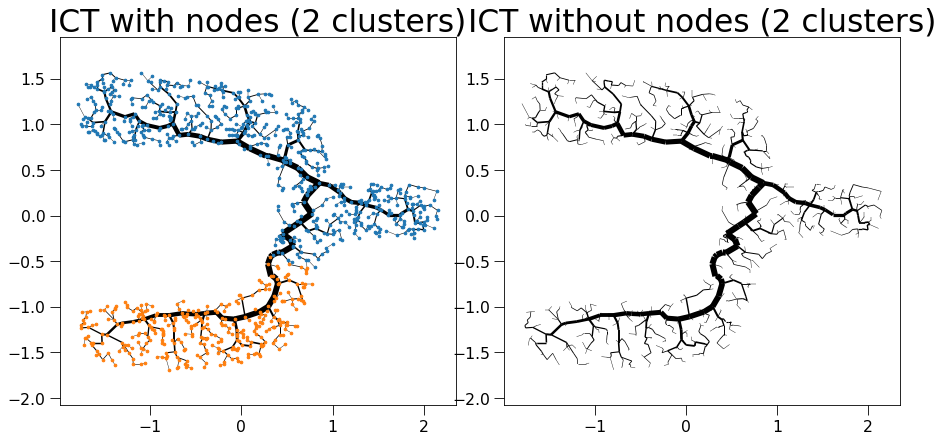

sklearn is done: 0.03187704086303711
My own part is done: 0.0006005764007568359


  0%|          | 0/3 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/2065 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2065 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/322 [00:00<?, ?it/s]

update Arr 2065 -> 1876
update Arr 1876 -> 1698
update Arr 1698 -> 1541
update Arr 1541 -> 1392
update Arr 1392 -> 1264
update Arr 1264 -> 1148
update Arr 1148 -> 1040
update Arr 1040 -> 943
update Arr 943 -> 851
update Arr 851 -> 769
update Arr 769 -> 698
update Arr 698 -> 631
update Arr 631 -> 567
update Arr 567 -> 513
update Arr 513 -> 456
update Arr 456 -> 410
update Arr 410 -> 370
update Arr 370 -> 332
update Arr 332 -> 328
update Arr 328 -> 325
update Arr 325 -> 323
update Arr 323 -> 322
Final k: 11


create edgeId array:   0%|          | 0/2408 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2408 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/370 [00:00<?, ?it/s]

update Arr 2408 -> 2186
update Arr 2186 -> 1974
update Arr 1974 -> 1776
update Arr 1776 -> 1598
update Arr 1598 -> 1451
update Arr 1451 -> 1316
update Arr 1316 -> 1190
update Arr 1190 -> 1079
update Arr 1079 -> 980
update Arr 980 -> 888
update Arr 888 -> 805
update Arr 805 -> 721
update Arr 721 -> 655
update Arr 655 -> 590
update Arr 590 -> 535
update Arr 535 -> 481
update Arr 481 -> 436
update Arr 436 -> 389
update Arr 389 -> 380
update Arr 380 -> 376
update Arr 376 -> 373
update Arr 373 -> 370
Final k: 11


create edgeId array:   0%|          | 0/1979 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1979 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/305 [00:00<?, ?it/s]

update Arr 1979 -> 1790
update Arr 1790 -> 1625
update Arr 1625 -> 1465
update Arr 1465 -> 1330
update Arr 1330 -> 1207
update Arr 1207 -> 1090
update Arr 1090 -> 979
update Arr 979 -> 885
update Arr 885 -> 804
update Arr 804 -> 727
update Arr 727 -> 655
update Arr 655 -> 594
update Arr 594 -> 536
update Arr 536 -> 485
update Arr 485 -> 439
update Arr 439 -> 398
update Arr 398 -> 353
update Arr 353 -> 320
update Arr 320 -> 313
update Arr 313 -> 311
update Arr 311 -> 308
update Arr 308 -> 306
update Arr 306 -> 305


Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1005 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1005 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1005 -> 1004
added 300 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 663 edges early


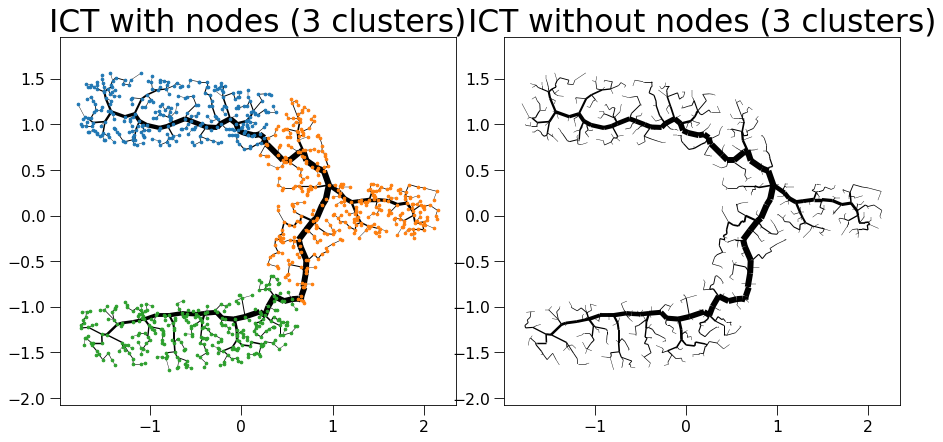

sklearn is done: 0.0418550968170166
My own part is done: 0.00052642822265625


  0%|          | 0/4 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1910 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1910 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/295 [00:00<?, ?it/s]

update Arr 1910 -> 1734
update Arr 1734 -> 1548
update Arr 1548 -> 1387
update Arr 1387 -> 1258
update Arr 1258 -> 1140
update Arr 1140 -> 1032
update Arr 1032 -> 935
update Arr 935 -> 848
update Arr 848 -> 766
update Arr 766 -> 696
update Arr 696 -> 630
update Arr 630 -> 572
update Arr 572 -> 516
update Arr 516 -> 466
update Arr 466 -> 418
update Arr 418 -> 374
update Arr 374 -> 335
update Arr 335 -> 305
update Arr 305 -> 300
update Arr 300 -> 298
update Arr 298 -> 296
update Arr 296 -> 295
Final k: 11


create edgeId array:   0%|          | 0/1301 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1301 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/195 [00:00<?, ?it/s]

update Arr 1301 -> 1180
update Arr 1180 -> 1065
update Arr 1065 -> 967
update Arr 967 -> 878
update Arr 878 -> 797
update Arr 797 -> 721
update Arr 721 -> 654
update Arr 654 -> 592
update Arr 592 -> 537
update Arr 537 -> 483
update Arr 483 -> 437
update Arr 437 -> 392
update Arr 392 -> 354
update Arr 354 -> 319
update Arr 319 -> 284
update Arr 284 -> 253
update Arr 253 -> 229
update Arr 229 -> 204
update Arr 204 -> 202
update Arr 202 -> 198
update Arr 198 -> 196
update Arr 196 -> 195
Final k: 11


create edgeId array:   0%|          | 0/2010 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2010 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/313 [00:00<?, ?it/s]

update Arr 2010 -> 1825
update Arr 1825 -> 1653
update Arr 1653 -> 1496
update Arr 1496 -> 1350
update Arr 1350 -> 1226
update Arr 1226 -> 1114
update Arr 1114 -> 1010
update Arr 1010 -> 916
update Arr 916 -> 832
update Arr 832 -> 755
update Arr 755 -> 678
update Arr 678 -> 616
update Arr 616 -> 558
update Arr 558 -> 496
update Arr 496 -> 439
update Arr 439 -> 396
update Arr 396 -> 359
update Arr 359 -> 323
update Arr 323 -> 319
update Arr 319 -> 316
update Arr 316 -> 314
update Arr 314 -> 313
Final k: 11


create edgeId array:   0%|          | 0/1249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/193 [00:00<?, ?it/s]

update Arr 1249 -> 1133
update Arr 1133 -> 1025
update Arr 1025 -> 922
update Arr 922 -> 838
update Arr 838 -> 758
update Arr 758 -> 681
update Arr 681 -> 617
update Arr 617 -> 560
update Arr 560 -> 501
update Arr 501 -> 454
update Arr 454 -> 409
update Arr 409 -> 370
update Arr 370 -> 331
update Arr 331 -> 293
update Arr 293 -> 266
update Arr 266 -> 236
update Arr 236 -> 214
update Arr 214 -> 203
update Arr 203 -> 197
update Arr 197 -> 196
update Arr 196 -> 194
update Arr 194 -> 193


Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1008 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1008 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1008 -> 1006
added 296 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 100

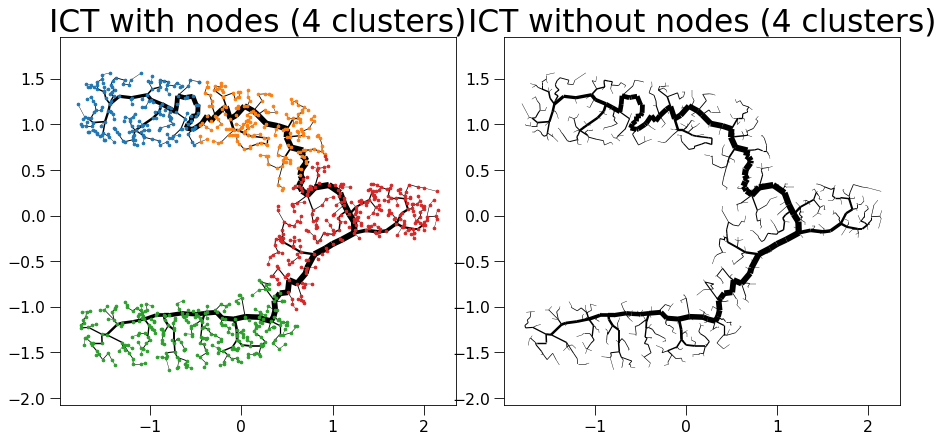

sklearn is done: 0.051184654235839844
My own part is done: 0.0007593631744384766


  0%|          | 0/5 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1332 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1332 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 1332 -> 1205
update Arr 1205 -> 1086
update Arr 1086 -> 976
update Arr 976 -> 887
update Arr 887 -> 800
update Arr 800 -> 727
update Arr 727 -> 655
update Arr 655 -> 593
update Arr 593 -> 537
update Arr 537 -> 487
update Arr 487 -> 442
update Arr 442 -> 395
update Arr 395 -> 355
update Arr 355 -> 318
update Arr 318 -> 287
update Arr 287 -> 258
update Arr 258 -> 230
update Arr 230 -> 210
update Arr 210 -> 208
update Arr 208 -> 204
update Arr 204 -> 203
update Arr 203 -> 202
Final k: 11


create edgeId array:   0%|          | 0/1186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/184 [00:00<?, ?it/s]

update Arr 1186 -> 1076
update Arr 1076 -> 969
update Arr 969 -> 876
update Arr 876 -> 793
update Arr 793 -> 719
update Arr 719 -> 650
update Arr 650 -> 584
update Arr 584 -> 530
update Arr 530 -> 474
update Arr 474 -> 428
update Arr 428 -> 385
update Arr 385 -> 346
update Arr 346 -> 310
update Arr 310 -> 277
update Arr 277 -> 244
update Arr 244 -> 217
update Arr 217 -> 194
update Arr 194 -> 190
update Arr 190 -> 187
update Arr 187 -> 185
update Arr 185 -> 184
Final k: 11


create edgeId array:   0%|          | 0/1294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/200 [00:00<?, ?it/s]

update Arr 1294 -> 1169
update Arr 1169 -> 1062
update Arr 1062 -> 965
update Arr 965 -> 877
update Arr 877 -> 793
update Arr 793 -> 720
update Arr 720 -> 650
update Arr 650 -> 588
update Arr 588 -> 526
update Arr 526 -> 477
update Arr 477 -> 431
update Arr 431 -> 390
update Arr 390 -> 352
update Arr 352 -> 319
update Arr 319 -> 286
update Arr 286 -> 259
update Arr 259 -> 229
update Arr 229 -> 210
update Arr 210 -> 207
update Arr 207 -> 207
update Arr 207 -> 203
update Arr 203 -> 201
update Arr 201 -> 200
Final k: 11


create edgeId array:   0%|          | 0/1443 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1443 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/221 [00:00<?, ?it/s]

update Arr 1443 -> 1311
update Arr 1311 -> 1190
update Arr 1190 -> 1062
update Arr 1062 -> 962
update Arr 962 -> 868
update Arr 868 -> 786
update Arr 786 -> 710
update Arr 710 -> 642
update Arr 642 -> 577
update Arr 577 -> 523
update Arr 523 -> 471
update Arr 471 -> 423
update Arr 423 -> 384
update Arr 384 -> 349
update Arr 349 -> 317
update Arr 317 -> 286
update Arr 286 -> 259
update Arr 259 -> 234
update Arr 234 -> 230
update Arr 230 -> 227
update Arr 227 -> 224
update Arr 224 -> 222
update Arr 222 -> 221
Final k: 11


create edgeId array:   0%|          | 0/1200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/188 [00:00<?, ?it/s]

update Arr 1200 -> 1090
update Arr 1090 -> 983
update Arr 983 -> 888
update Arr 888 -> 802
update Arr 802 -> 726
update Arr 726 -> 659
update Arr 659 -> 596
update Arr 596 -> 538
update Arr 538 -> 488
update Arr 488 -> 435
update Arr 435 -> 390
update Arr 390 -> 351
update Arr 351 -> 319
update Arr 319 -> 286
update Arr 286 -> 257
update Arr 257 -> 220
update Arr 220 -> 198
update Arr 198 -> 194
update Arr 194 -> 191
update Arr 191 -> 188


Patching the components together:   0%|          | 0/5 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1008 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1008 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1008 -> 1008
added 294 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 ->

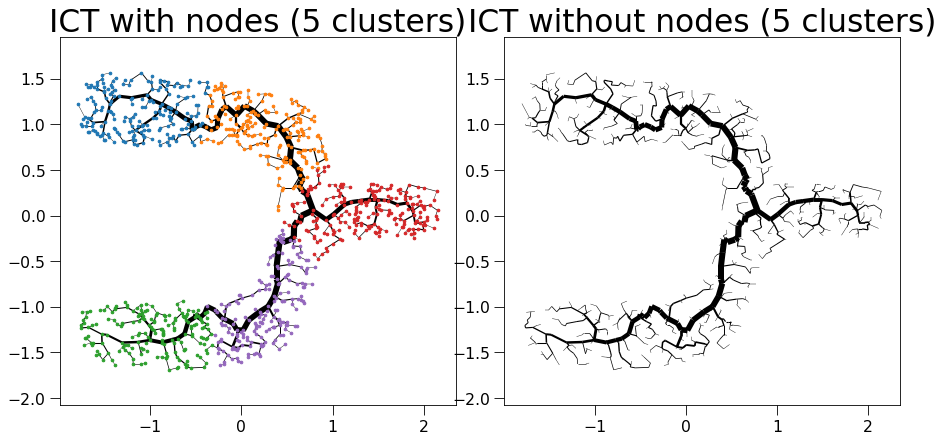

sklearn is done: 0.06128120422363281
My own part is done: 0.0009365081787109375


  0%|          | 0/6 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/185 [00:00<?, ?it/s]

update Arr 1226 -> 1108
update Arr 1108 -> 996
update Arr 996 -> 895
update Arr 895 -> 789
update Arr 789 -> 717
update Arr 717 -> 649
update Arr 649 -> 588
update Arr 588 -> 530
update Arr 530 -> 474
update Arr 474 -> 429
update Arr 429 -> 388
update Arr 388 -> 352
update Arr 352 -> 313
update Arr 313 -> 277
update Arr 277 -> 248
update Arr 248 -> 220
update Arr 220 -> 199
update Arr 199 -> 194
update Arr 194 -> 192
update Arr 192 -> 188
update Arr 188 -> 186
update Arr 186 -> 185
Final k: 11


create edgeId array:   0%|          | 0/1025 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1025 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 1025 -> 927
update Arr 927 -> 838
update Arr 838 -> 750
update Arr 750 -> 681
update Arr 681 -> 616
update Arr 616 -> 555
update Arr 555 -> 500
update Arr 500 -> 454
update Arr 454 -> 410
update Arr 410 -> 369
update Arr 369 -> 332
update Arr 332 -> 299
update Arr 299 -> 268
update Arr 268 -> 236
update Arr 236 -> 213
update Arr 213 -> 183
update Arr 183 -> 169
update Arr 169 -> 165
update Arr 165 -> 160
update Arr 160 -> 160
update Arr 160 -> 159
Final k: 11


create edgeId array:   0%|          | 0/1249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/193 [00:00<?, ?it/s]

update Arr 1249 -> 1133
update Arr 1133 -> 1025
update Arr 1025 -> 922
update Arr 922 -> 838
update Arr 838 -> 758
update Arr 758 -> 681
update Arr 681 -> 617
update Arr 617 -> 560
update Arr 560 -> 501
update Arr 501 -> 454
update Arr 454 -> 409
update Arr 409 -> 370
update Arr 370 -> 331
update Arr 331 -> 293
update Arr 293 -> 266
update Arr 266 -> 236
update Arr 236 -> 214
update Arr 214 -> 203
update Arr 203 -> 197
update Arr 197 -> 196
update Arr 196 -> 194
update Arr 194 -> 193
Final k: 11


create edgeId array:   0%|          | 0/981 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/981 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 981 -> 888
update Arr 888 -> 803
update Arr 803 -> 727
update Arr 727 -> 654
update Arr 654 -> 589
update Arr 589 -> 530
update Arr 530 -> 477
update Arr 477 -> 430
update Arr 430 -> 385
update Arr 385 -> 346
update Arr 346 -> 314
update Arr 314 -> 282
update Arr 282 -> 253
update Arr 253 -> 227
update Arr 227 -> 205
update Arr 205 -> 184
update Arr 184 -> 165
update Arr 165 -> 159
update Arr 159 -> 153
update Arr 153 -> 152
update Arr 152 -> 150
update Arr 150 -> 149
Final k: 11


create edgeId array:   0%|          | 0/890 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/890 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 890 -> 806
update Arr 806 -> 726
update Arr 726 -> 655
update Arr 655 -> 594
update Arr 594 -> 534
update Arr 534 -> 479
update Arr 479 -> 433
update Arr 433 -> 386
update Arr 386 -> 345
update Arr 345 -> 313
update Arr 313 -> 283
update Arr 283 -> 256
update Arr 256 -> 232
update Arr 232 -> 203
update Arr 203 -> 184
update Arr 184 -> 163
update Arr 163 -> 146
update Arr 146 -> 140
update Arr 140 -> 139
update Arr 139 -> 137
update Arr 137 -> 136
Final k: 11


create edgeId array:   0%|          | 0/1096 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1096 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/172 [00:00<?, ?it/s]

update Arr 1096 -> 995
update Arr 995 -> 890
update Arr 890 -> 805
update Arr 805 -> 727
update Arr 727 -> 658
update Arr 658 -> 597
update Arr 597 -> 538
update Arr 538 -> 489
update Arr 489 -> 442
update Arr 442 -> 399
update Arr 399 -> 361
update Arr 361 -> 328
update Arr 328 -> 293
update Arr 293 -> 263
update Arr 263 -> 238
update Arr 238 -> 214
update Arr 214 -> 193
update Arr 193 -> 182
update Arr 182 -> 178
update Arr 178 -> 178
update Arr 178 -> 175
update Arr 175 -> 172


Patching the components together:   0%|          | 0/6 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1011 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1011 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1011 -> 1009
added 290 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 ->

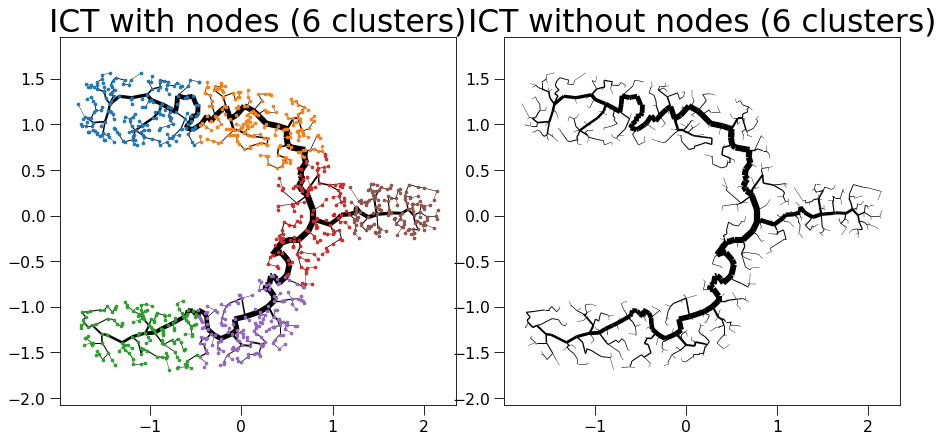

sklearn is done: 0.06508255004882812
My own part is done: 0.00044465065002441406


  0%|          | 0/7 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/1032 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1032 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 1032 -> 929
update Arr 929 -> 843
update Arr 843 -> 747
update Arr 747 -> 676
update Arr 676 -> 612
update Arr 612 -> 555
update Arr 555 -> 503
update Arr 503 -> 452
update Arr 452 -> 407
update Arr 407 -> 365
update Arr 365 -> 331
update Arr 331 -> 296
update Arr 296 -> 267
update Arr 267 -> 238
update Arr 238 -> 214
update Arr 214 -> 191
update Arr 191 -> 169
update Arr 169 -> 161
update Arr 161 -> 160
update Arr 160 -> 160
update Arr 160 -> 159
Final k: 11


create edgeId array:   0%|          | 0/896 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/896 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 896 -> 796
update Arr 796 -> 720
update Arr 720 -> 651
update Arr 651 -> 586
update Arr 586 -> 531
update Arr 531 -> 482
update Arr 482 -> 438
update Arr 438 -> 398
update Arr 398 -> 356
update Arr 356 -> 319
update Arr 319 -> 289
update Arr 289 -> 261
update Arr 261 -> 236
update Arr 236 -> 206
update Arr 206 -> 177
update Arr 177 -> 155
update Arr 155 -> 145
update Arr 145 -> 141
update Arr 141 -> 137
update Arr 137 -> 136
update Arr 136 -> 135
Final k: 11


create edgeId array:   0%|          | 0/724 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/724 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 724 -> 658
update Arr 658 -> 598
update Arr 598 -> 532
update Arr 532 -> 470
update Arr 470 -> 425
update Arr 425 -> 385
update Arr 385 -> 347
update Arr 347 -> 313
update Arr 313 -> 282
update Arr 282 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 185
update Arr 185 -> 166
update Arr 166 -> 146
update Arr 146 -> 131
update Arr 131 -> 119
update Arr 119 -> 114
update Arr 114 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/1057 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1057 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/163 [00:00<?, ?it/s]

update Arr 1057 -> 953
update Arr 953 -> 850
update Arr 850 -> 763
update Arr 763 -> 692
update Arr 692 -> 626
update Arr 626 -> 565
update Arr 565 -> 509
update Arr 509 -> 462
update Arr 462 -> 417
update Arr 417 -> 378
update Arr 378 -> 340
update Arr 340 -> 309
update Arr 309 -> 280
update Arr 280 -> 251
update Arr 251 -> 222
update Arr 222 -> 197
update Arr 197 -> 178
update Arr 178 -> 173
update Arr 173 -> 169
update Arr 169 -> 166
update Arr 166 -> 164
update Arr 164 -> 163
Final k: 11


create edgeId array:   0%|          | 0/988 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/988 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 988 -> 892
update Arr 892 -> 803
update Arr 803 -> 726
update Arr 726 -> 657
update Arr 657 -> 592
update Arr 592 -> 531
update Arr 531 -> 476
update Arr 476 -> 431
update Arr 431 -> 391
update Arr 391 -> 346
update Arr 346 -> 310
update Arr 310 -> 279
update Arr 279 -> 251
update Arr 251 -> 227
update Arr 227 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 159
update Arr 159 -> 157
update Arr 157 -> 156
update Arr 156 -> 154
update Arr 154 -> 153
Final k: 11


create edgeId array:   0%|          | 0/781 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/781 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/118 [00:00<?, ?it/s]

update Arr 781 -> 704
update Arr 704 -> 638
update Arr 638 -> 574
update Arr 574 -> 521
update Arr 521 -> 468
update Arr 468 -> 422
update Arr 422 -> 382
update Arr 382 -> 345
update Arr 345 -> 303
update Arr 303 -> 269
update Arr 269 -> 243
update Arr 243 -> 218
update Arr 218 -> 198
update Arr 198 -> 177
update Arr 177 -> 158
update Arr 158 -> 143
update Arr 143 -> 128
update Arr 128 -> 121
update Arr 121 -> 121
update Arr 121 -> 119
update Arr 119 -> 118
Final k: 11


create edgeId array:   0%|          | 0/1007 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1007 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/154 [00:00<?, ?it/s]

update Arr 1007 -> 915
update Arr 915 -> 819
update Arr 819 -> 744
update Arr 744 -> 673
update Arr 673 -> 609
update Arr 609 -> 550
update Arr 550 -> 497
update Arr 497 -> 449
update Arr 449 -> 408
update Arr 408 -> 362
update Arr 362 -> 324
update Arr 324 -> 284
update Arr 284 -> 251
update Arr 251 -> 225
update Arr 225 -> 203
update Arr 203 -> 181
update Arr 181 -> 162
update Arr 162 -> 160
update Arr 160 -> 157
update Arr 157 -> 155
update Arr 155 -> 154


Patching the components together:   0%|          | 0/7 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1009 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1009 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1009 -> 1008
added 276 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 ->

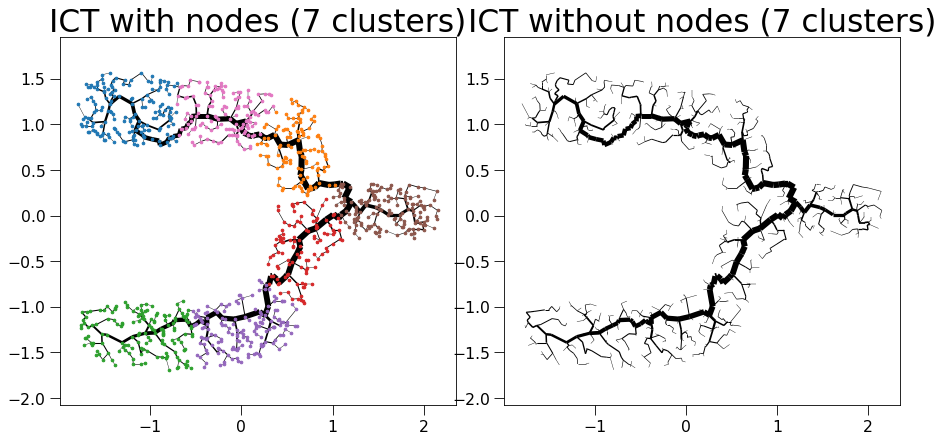

sklearn is done: 0.07210516929626465
My own part is done: 0.000453948974609375


  0%|          | 0/8 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/890 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/890 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 890 -> 806
update Arr 806 -> 726
update Arr 726 -> 655
update Arr 655 -> 594
update Arr 594 -> 534
update Arr 534 -> 479
update Arr 479 -> 433
update Arr 433 -> 386
update Arr 386 -> 345
update Arr 345 -> 313
update Arr 313 -> 283
update Arr 283 -> 256
update Arr 256 -> 232
update Arr 232 -> 203
update Arr 203 -> 184
update Arr 184 -> 163
update Arr 163 -> 146
update Arr 146 -> 140
update Arr 140 -> 139
update Arr 139 -> 137
update Arr 137 -> 136
Final k: 11


create edgeId array:   0%|          | 0/796 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/796 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/123 [00:00<?, ?it/s]

update Arr 796 -> 712
update Arr 712 -> 635
update Arr 635 -> 559
update Arr 559 -> 506
update Arr 506 -> 457
update Arr 457 -> 415
update Arr 415 -> 377
update Arr 377 -> 342
update Arr 342 -> 310
update Arr 310 -> 281
update Arr 281 -> 254
update Arr 254 -> 219
update Arr 219 -> 195
update Arr 195 -> 176
update Arr 176 -> 156
update Arr 156 -> 141
update Arr 141 -> 133
update Arr 133 -> 128
update Arr 128 -> 125
update Arr 125 -> 124
update Arr 124 -> 123
Final k: 11


create edgeId array:   0%|          | 0/888 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/888 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/134 [00:00<?, ?it/s]

update Arr 888 -> 795
update Arr 795 -> 718
update Arr 718 -> 644
update Arr 644 -> 583
update Arr 583 -> 525
update Arr 525 -> 475
update Arr 475 -> 430
update Arr 430 -> 387
update Arr 387 -> 348
update Arr 348 -> 316
update Arr 316 -> 286
update Arr 286 -> 254
update Arr 254 -> 230
update Arr 230 -> 203
update Arr 203 -> 182
update Arr 182 -> 162
update Arr 162 -> 147
update Arr 147 -> 144
update Arr 144 -> 140
update Arr 140 -> 137
update Arr 137 -> 135
update Arr 135 -> 134
Final k: 11


create edgeId array:   0%|          | 0/691 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/691 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/104 [00:00<?, ?it/s]

update Arr 691 -> 628
update Arr 628 -> 553
update Arr 553 -> 499
update Arr 499 -> 452
update Arr 452 -> 406
update Arr 406 -> 369
update Arr 369 -> 331
update Arr 331 -> 299
update Arr 299 -> 267
update Arr 267 -> 238
update Arr 238 -> 215
update Arr 215 -> 182
update Arr 182 -> 161
update Arr 161 -> 145
update Arr 145 -> 128
update Arr 128 -> 114
update Arr 114 -> 108
update Arr 108 -> 107
update Arr 107 -> 105
update Arr 105 -> 104
Final k: 11


create edgeId array:   0%|          | 0/702 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/702 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 702 -> 638
update Arr 638 -> 575
update Arr 575 -> 516
update Arr 516 -> 466
update Arr 466 -> 419
update Arr 419 -> 378
update Arr 378 -> 335
update Arr 335 -> 303
update Arr 303 -> 272
update Arr 272 -> 245
update Arr 245 -> 217
update Arr 217 -> 196
update Arr 196 -> 175
update Arr 175 -> 158
update Arr 158 -> 135
update Arr 135 -> 122
update Arr 122 -> 117
update Arr 117 -> 113
update Arr 113 -> 110
update Arr 110 -> 108
update Arr 108 -> 107
Final k: 11


create edgeId array:   0%|          | 0/1036 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1036 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/160 [00:00<?, ?it/s]

update Arr 1036 -> 932
update Arr 932 -> 842
update Arr 842 -> 755
update Arr 755 -> 684
update Arr 684 -> 617
update Arr 617 -> 554
update Arr 554 -> 502
update Arr 502 -> 444
update Arr 444 -> 403
update Arr 403 -> 366
update Arr 366 -> 329
update Arr 329 -> 297
update Arr 297 -> 263
update Arr 263 -> 235
update Arr 235 -> 211
update Arr 211 -> 187
update Arr 187 -> 170
update Arr 170 -> 166
update Arr 166 -> 163
update Arr 163 -> 161
update Arr 161 -> 160
Final k: 11


create edgeId array:   0%|          | 0/709 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/709 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 709 -> 633
update Arr 633 -> 563
update Arr 563 -> 503
update Arr 503 -> 457
update Arr 457 -> 413
update Arr 413 -> 372
update Arr 372 -> 336
update Arr 336 -> 300
update Arr 300 -> 267
update Arr 267 -> 241
update Arr 241 -> 218
update Arr 218 -> 198
update Arr 198 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 129
update Arr 129 -> 118
update Arr 118 -> 114
update Arr 114 -> 111
update Arr 111 -> 109
update Arr 109 -> 108
Final k: 11


create edgeId array:   0%|          | 0/781 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/781 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/120 [00:00<?, ?it/s]

update Arr 781 -> 689
update Arr 689 -> 615
update Arr 615 -> 557
update Arr 557 -> 503
update Arr 503 -> 453
update Arr 453 -> 409
update Arr 409 -> 371
update Arr 371 -> 337
update Arr 337 -> 302
update Arr 302 -> 274
update Arr 274 -> 243
update Arr 243 -> 218
update Arr 218 -> 198
update Arr 198 -> 179
update Arr 179 -> 158
update Arr 158 -> 139
update Arr 139 -> 130
update Arr 130 -> 126
update Arr 126 -> 122
update Arr 122 -> 121
update Arr 121 -> 120


Patching the components together:   0%|          | 0/8 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1018 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1018 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1018 -> 1009
added 279 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
add

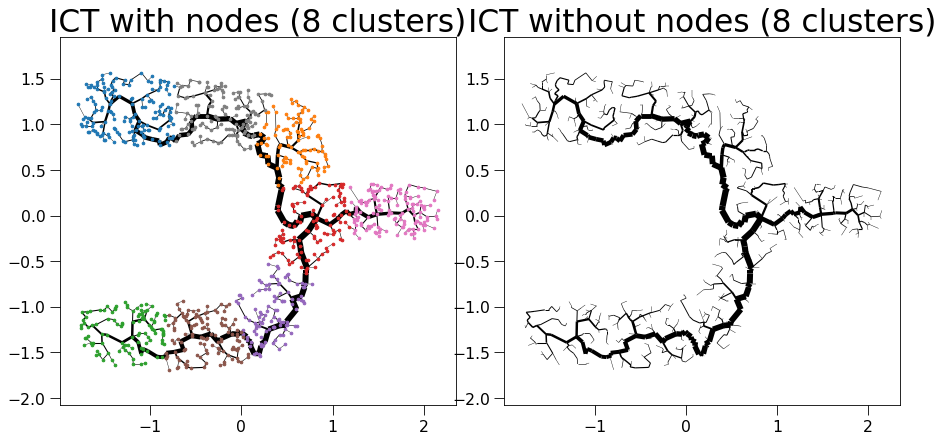

sklearn is done: 0.06110095977783203
My own part is done: 0.00047850608825683594


  0%|          | 0/9 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/974 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/974 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 974 -> 884
update Arr 884 -> 803
update Arr 803 -> 723
update Arr 723 -> 657
update Arr 657 -> 595
update Arr 595 -> 537
update Arr 537 -> 487
update Arr 487 -> 436
update Arr 436 -> 394
update Arr 394 -> 358
update Arr 358 -> 323
update Arr 323 -> 292
update Arr 292 -> 263
update Arr 263 -> 235
update Arr 235 -> 213
update Arr 213 -> 185
update Arr 185 -> 164
update Arr 164 -> 159
update Arr 159 -> 155
update Arr 155 -> 152
update Arr 152 -> 150
update Arr 150 -> 149
Final k: 11


create edgeId array:   0%|          | 0/723 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/723 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 723 -> 643
update Arr 643 -> 578
update Arr 578 -> 512
update Arr 512 -> 458
update Arr 458 -> 412
update Arr 412 -> 373
update Arr 373 -> 338
update Arr 338 -> 305
update Arr 305 -> 270
update Arr 270 -> 245
update Arr 245 -> 220
update Arr 220 -> 198
update Arr 198 -> 176
update Arr 176 -> 154
update Arr 154 -> 137
update Arr 137 -> 124
update Arr 124 -> 114
update Arr 114 -> 113
update Arr 113 -> 110
update Arr 110 -> 108
update Arr 108 -> 107
Final k: 11


create edgeId array:   0%|          | 0/780 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/780 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/120 [00:00<?, ?it/s]

update Arr 780 -> 702
update Arr 702 -> 627
update Arr 627 -> 565
update Arr 565 -> 511
update Arr 511 -> 464
update Arr 464 -> 421
update Arr 421 -> 382
update Arr 382 -> 341
update Arr 341 -> 309
update Arr 309 -> 278
update Arr 278 -> 250
update Arr 250 -> 226
update Arr 226 -> 202
update Arr 202 -> 183
update Arr 183 -> 155
update Arr 155 -> 135
update Arr 135 -> 128
update Arr 128 -> 126
update Arr 126 -> 123
update Arr 123 -> 120
Final k: 11


create edgeId array:   0%|          | 0/657 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/657 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 657 -> 591
update Arr 591 -> 524
update Arr 524 -> 476
update Arr 476 -> 431
update Arr 431 -> 385
update Arr 385 -> 346
update Arr 346 -> 311
update Arr 311 -> 281
update Arr 281 -> 247
update Arr 247 -> 223
update Arr 223 -> 198
update Arr 198 -> 174
update Arr 174 -> 157
update Arr 157 -> 141
update Arr 141 -> 120
update Arr 120 -> 111
update Arr 111 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
Final k: 11


create edgeId array:   0%|          | 0/672 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/672 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 672 -> 607
update Arr 607 -> 551
update Arr 551 -> 497
update Arr 497 -> 449
update Arr 449 -> 401
update Arr 401 -> 362
update Arr 362 -> 326
update Arr 326 -> 292
update Arr 292 -> 254
update Arr 254 -> 229
update Arr 229 -> 207
update Arr 207 -> 185
update Arr 185 -> 163
update Arr 163 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 111
update Arr 111 -> 108
update Arr 108 -> 105
update Arr 105 -> 103
update Arr 103 -> 102
Final k: 11


create edgeId array:   0%|          | 0/726 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/726 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 726 -> 652
update Arr 652 -> 592
update Arr 592 -> 536
update Arr 536 -> 485
update Arr 485 -> 437
update Arr 437 -> 394
update Arr 394 -> 351
update Arr 351 -> 317
update Arr 317 -> 284
update Arr 284 -> 256
update Arr 256 -> 229
update Arr 229 -> 204
update Arr 204 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 116
update Arr 116 -> 114
update Arr 114 -> 112
update Arr 112 -> 111
Final k: 11


create edgeId array:   0%|          | 0/749 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/749 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 749 -> 678
update Arr 678 -> 605
update Arr 605 -> 543
update Arr 543 -> 480
update Arr 480 -> 434
update Arr 434 -> 393
update Arr 393 -> 353
update Arr 353 -> 320
update Arr 320 -> 288
update Arr 288 -> 259
update Arr 259 -> 228
update Arr 228 -> 203
update Arr 203 -> 179
update Arr 179 -> 157
update Arr 157 -> 138
update Arr 138 -> 124
update Arr 124 -> 122
update Arr 122 -> 118
update Arr 118 -> 114
update Arr 114 -> 113
update Arr 113 -> 112
Final k: 11


create edgeId array:   0%|          | 0/613 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/613 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 613 -> 544
update Arr 544 -> 493
update Arr 493 -> 440
update Arr 440 -> 399
update Arr 399 -> 357
update Arr 357 -> 324
update Arr 324 -> 293
update Arr 293 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 190
update Arr 190 -> 170
update Arr 170 -> 154
update Arr 154 -> 130
update Arr 130 -> 112
update Arr 112 -> 103
update Arr 103 -> 101
update Arr 101 -> 100
update Arr 100 -> 100
update Arr 100 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/620 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/620 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 620 -> 562
update Arr 562 -> 497
update Arr 497 -> 450
update Arr 450 -> 407
update Arr 407 -> 364
update Arr 364 -> 326
update Arr 326 -> 290
update Arr 290 -> 262
update Arr 262 -> 232
update Arr 232 -> 210
update Arr 210 -> 190
update Arr 190 -> 172
update Arr 172 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 110
update Arr 110 -> 105
update Arr 105 -> 101
update Arr 101 -> 98
update Arr 98 -> 96
update Arr 96 -> 95


Patching the components together:   0%|          | 0/9 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1018 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1018 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1018 -> 1008
added 273 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
up

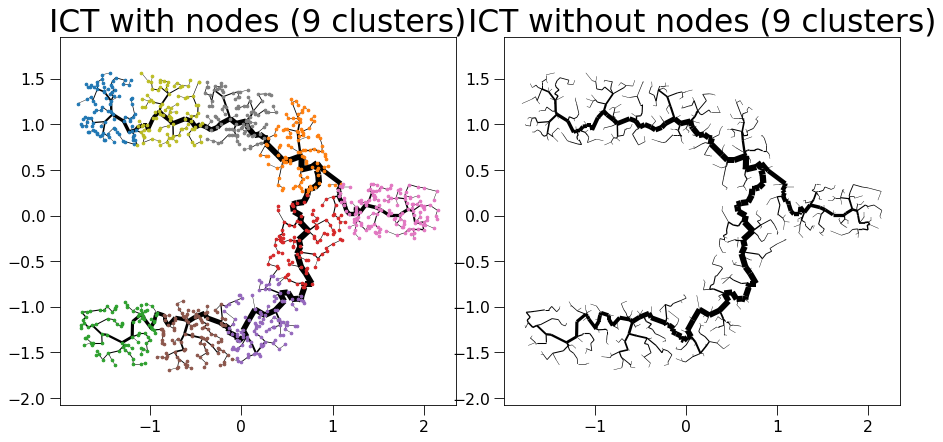

sklearn is done: 0.08942627906799316
My own part is done: 0.0008003711700439453


  0%|          | 0/10 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/651 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/651 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 651 -> 588
update Arr 588 -> 530
update Arr 530 -> 472
update Arr 472 -> 428
update Arr 428 -> 387
update Arr 387 -> 349
update Arr 349 -> 315
update Arr 315 -> 285
update Arr 285 -> 257
update Arr 257 -> 231
update Arr 231 -> 209
update Arr 209 -> 185
update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 136
update Arr 136 -> 118
update Arr 118 -> 110
update Arr 110 -> 106
update Arr 106 -> 103
update Arr 103 -> 101
update Arr 101 -> 100
Final k: 11


create edgeId array:   0%|          | 0/613 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/613 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 613 -> 555
update Arr 555 -> 504
update Arr 504 -> 457
update Arr 457 -> 410
update Arr 410 -> 369
update Arr 369 -> 330
update Arr 330 -> 299
update Arr 299 -> 268
update Arr 268 -> 242
update Arr 242 -> 209
update Arr 209 -> 188
update Arr 188 -> 165
update Arr 165 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 106
update Arr 106 -> 101
update Arr 101 -> 99
update Arr 99 -> 95
update Arr 95 -> 93
update Arr 93 -> 92
Final k: 11


create edgeId array:   0%|          | 0/657 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/657 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 657 -> 591
update Arr 591 -> 524
update Arr 524 -> 476
update Arr 476 -> 431
update Arr 431 -> 385
update Arr 385 -> 346
update Arr 346 -> 311
update Arr 311 -> 281
update Arr 281 -> 247
update Arr 247 -> 223
update Arr 223 -> 198
update Arr 198 -> 174
update Arr 174 -> 157
update Arr 157 -> 141
update Arr 141 -> 120
update Arr 120 -> 111
update Arr 111 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
Final k: 11


create edgeId array:   0%|          | 0/785 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/785 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 785 -> 704
update Arr 704 -> 630
update Arr 630 -> 572
update Arr 572 -> 517
update Arr 517 -> 464
update Arr 464 -> 416
update Arr 416 -> 378
update Arr 378 -> 340
update Arr 340 -> 306
update Arr 306 -> 268
update Arr 268 -> 242
update Arr 242 -> 213
update Arr 213 -> 184
update Arr 184 -> 162
update Arr 162 -> 142
update Arr 142 -> 129
update Arr 129 -> 125
update Arr 125 -> 122
update Arr 122 -> 120
update Arr 120 -> 119
Final k: 11


create edgeId array:   0%|          | 0/613 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/613 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 613 -> 544
update Arr 544 -> 493
update Arr 493 -> 440
update Arr 440 -> 399
update Arr 399 -> 357
update Arr 357 -> 324
update Arr 324 -> 293
update Arr 293 -> 265
update Arr 265 -> 237
update Arr 237 -> 215
update Arr 215 -> 190
update Arr 190 -> 170
update Arr 170 -> 154
update Arr 154 -> 130
update Arr 130 -> 112
update Arr 112 -> 103
update Arr 103 -> 101
update Arr 101 -> 100
update Arr 100 -> 100
update Arr 100 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/691 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/691 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/104 [00:00<?, ?it/s]

update Arr 691 -> 624
update Arr 624 -> 564
update Arr 564 -> 478
update Arr 478 -> 434
update Arr 434 -> 393
update Arr 393 -> 353
update Arr 353 -> 319
update Arr 319 -> 284
update Arr 284 -> 255
update Arr 255 -> 228
update Arr 228 -> 203
update Arr 203 -> 179
update Arr 179 -> 159
update Arr 159 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 110
update Arr 110 -> 107
update Arr 107 -> 105
update Arr 105 -> 104
Final k: 11


create edgeId array:   0%|          | 0/674 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/674 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/103 [00:00<?, ?it/s]

update Arr 674 -> 609
update Arr 609 -> 550
update Arr 550 -> 499
update Arr 499 -> 450
update Arr 450 -> 404
update Arr 404 -> 362
update Arr 362 -> 327
update Arr 327 -> 293
update Arr 293 -> 262
update Arr 262 -> 236
update Arr 236 -> 213
update Arr 213 -> 192
update Arr 192 -> 166
update Arr 166 -> 144
update Arr 144 -> 130
update Arr 130 -> 117
update Arr 117 -> 111
update Arr 111 -> 108
update Arr 108 -> 106
update Arr 106 -> 104
update Arr 104 -> 103
Final k: 11


create edgeId array:   0%|          | 0/620 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/620 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 620 -> 562
update Arr 562 -> 497
update Arr 497 -> 450
update Arr 450 -> 407
update Arr 407 -> 364
update Arr 364 -> 326
update Arr 326 -> 290
update Arr 290 -> 262
update Arr 262 -> 232
update Arr 232 -> 210
update Arr 210 -> 190
update Arr 190 -> 172
update Arr 172 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 110
update Arr 110 -> 105
update Arr 105 -> 101
update Arr 101 -> 98
update Arr 98 -> 96
update Arr 96 -> 95
Final k: 11


create edgeId array:   0%|          | 0/500 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/500 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 500 -> 454
update Arr 454 -> 402
update Arr 402 -> 357
update Arr 357 -> 321
update Arr 321 -> 291
update Arr 291 -> 263
update Arr 263 -> 237
update Arr 237 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 155
update Arr 155 -> 136
update Arr 136 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 86
update Arr 86 -> 84
update Arr 84 -> 81
update Arr 81 -> 78
Final k: 11


create edgeId array:   0%|          | 0/707 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/707 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/104 [00:00<?, ?it/s]

update Arr 707 -> 639
update Arr 639 -> 574
update Arr 574 -> 514
update Arr 514 -> 461
update Arr 461 -> 412
update Arr 412 -> 371
update Arr 371 -> 331
update Arr 331 -> 295
update Arr 295 -> 268
update Arr 268 -> 242
update Arr 242 -> 219
update Arr 219 -> 199
update Arr 199 -> 178
update Arr 178 -> 159
update Arr 159 -> 140
update Arr 140 -> 121
update Arr 121 -> 113
update Arr 113 -> 110
update Arr 110 -> 106
update Arr 106 -> 104


Patching the components together:   0%|          | 0/10 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1021 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1021 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1021 -> 1009
added 287 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
up

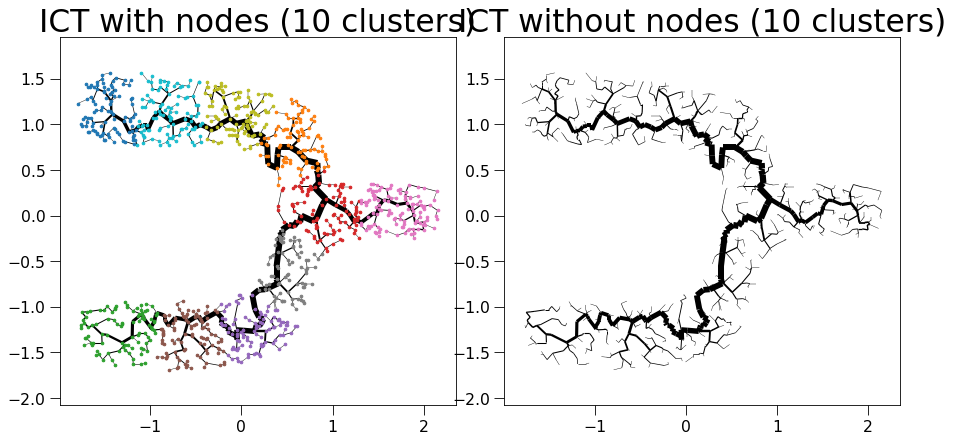

sklearn is done: 0.07936930656433105
My own part is done: 0.0008437633514404297


  0%|          | 0/11 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/645 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/645 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 645 -> 577
update Arr 577 -> 522
update Arr 522 -> 463
update Arr 463 -> 419
update Arr 419 -> 377
update Arr 377 -> 342
update Arr 342 -> 309
update Arr 309 -> 274
update Arr 274 -> 249
update Arr 249 -> 224
update Arr 224 -> 201
update Arr 201 -> 177
update Arr 177 -> 155
update Arr 155 -> 138
update Arr 138 -> 124
update Arr 124 -> 105
update Arr 105 -> 103
update Arr 103 -> 102
update Arr 102 -> 100
update Arr 100 -> 99
Final k: 11


create edgeId array:   0%|          | 0/638 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/638 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 638 -> 567
update Arr 567 -> 513
update Arr 513 -> 464
update Arr 464 -> 420
update Arr 420 -> 376
update Arr 376 -> 341
update Arr 341 -> 301
update Arr 301 -> 272
update Arr 272 -> 247
update Arr 247 -> 221
update Arr 221 -> 196
update Arr 196 -> 172
update Arr 172 -> 154
update Arr 154 -> 137
update Arr 137 -> 119
update Arr 119 -> 109
update Arr 109 -> 105
update Arr 105 -> 102
update Arr 102 -> 100
update Arr 100 -> 99
Final k: 11


create edgeId array:   0%|          | 0/595 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/595 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 595 -> 539
update Arr 539 -> 483
update Arr 483 -> 430
update Arr 430 -> 389
update Arr 389 -> 348
update Arr 348 -> 308
update Arr 308 -> 267
update Arr 267 -> 242
update Arr 242 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 141
update Arr 141 -> 123
update Arr 123 -> 108
update Arr 108 -> 96
update Arr 96 -> 94
update Arr 94 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
Final k: 11


create edgeId array:   0%|          | 0/634 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/634 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 634 -> 570
update Arr 570 -> 515
update Arr 515 -> 468
update Arr 468 -> 425
update Arr 425 -> 381
update Arr 381 -> 340
update Arr 340 -> 304
update Arr 304 -> 271
update Arr 271 -> 244
update Arr 244 -> 216
update Arr 216 -> 194
update Arr 194 -> 174
update Arr 174 -> 153
update Arr 153 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 107
update Arr 107 -> 103
update Arr 103 -> 100
update Arr 100 -> 98
update Arr 98 -> 97
Final k: 11


create edgeId array:   0%|          | 0/497 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/497 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 497 -> 444
update Arr 444 -> 388
update Arr 388 -> 343
update Arr 343 -> 311
update Arr 311 -> 278
update Arr 278 -> 244
update Arr 244 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 160
update Arr 160 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 85
update Arr 85 -> 81
update Arr 81 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
Final k: 11


create edgeId array:   0%|          | 0/712 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/712 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 712 -> 641
update Arr 641 -> 580
update Arr 580 -> 515
update Arr 515 -> 452
update Arr 452 -> 406
update Arr 406 -> 368
update Arr 368 -> 334
update Arr 334 -> 296
update Arr 296 -> 269
update Arr 269 -> 243
update Arr 243 -> 216
update Arr 216 -> 196
update Arr 196 -> 174
update Arr 174 -> 152
update Arr 152 -> 130
update Arr 130 -> 118
update Arr 118 -> 114
update Arr 114 -> 110
update Arr 110 -> 109
update Arr 109 -> 108
Final k: 11


create edgeId array:   0%|          | 0/543 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/543 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 543 -> 490
update Arr 490 -> 434
update Arr 434 -> 385
update Arr 385 -> 348
update Arr 348 -> 308
update Arr 308 -> 275
update Arr 275 -> 249
update Arr 249 -> 223
update Arr 223 -> 197
update Arr 197 -> 177
update Arr 177 -> 155
update Arr 155 -> 139
update Arr 139 -> 117
update Arr 117 -> 101
update Arr 101 -> 90
update Arr 90 -> 87
update Arr 87 -> 85
update Arr 85 -> 84
update Arr 84 -> 84
Final k: 11


create edgeId array:   0%|          | 0/516 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/516 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 516 -> 466
update Arr 466 -> 419
update Arr 419 -> 379
update Arr 379 -> 343
update Arr 343 -> 308
update Arr 308 -> 277
update Arr 277 -> 248
update Arr 248 -> 222
update Arr 222 -> 196
update Arr 196 -> 174
update Arr 174 -> 157
update Arr 157 -> 142
update Arr 142 -> 128
update Arr 128 -> 113
update Arr 113 -> 102
update Arr 102 -> 89
update Arr 89 -> 86
update Arr 86 -> 85
update Arr 85 -> 82
update Arr 82 -> 79
update Arr 79 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/723 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/723 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 723 -> 643
update Arr 643 -> 578
update Arr 578 -> 512
update Arr 512 -> 458
update Arr 458 -> 412
update Arr 412 -> 373
update Arr 373 -> 338
update Arr 338 -> 305
update Arr 305 -> 270
update Arr 270 -> 245
update Arr 245 -> 220
update Arr 220 -> 198
update Arr 198 -> 176
update Arr 176 -> 154
update Arr 154 -> 137
update Arr 137 -> 124
update Arr 124 -> 114
update Arr 114 -> 113
update Arr 113 -> 110
update Arr 110 -> 108
update Arr 108 -> 107
Final k: 11


create edgeId array:   0%|          | 0/510 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/510 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 510 -> 462
update Arr 462 -> 406
update Arr 406 -> 369
update Arr 369 -> 333
update Arr 333 -> 302
update Arr 302 -> 270
update Arr 270 -> 242
update Arr 242 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 122
update Arr 122 -> 99
update Arr 99 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/532 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/532 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 532 -> 478
update Arr 478 -> 425
update Arr 425 -> 370
update Arr 370 -> 335
update Arr 335 -> 294
update Arr 294 -> 267
update Arr 267 -> 242
update Arr 242 -> 219
update Arr 219 -> 199
update Arr 199 -> 176
update Arr 176 -> 158
update Arr 158 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 91
update Arr 91 -> 90
update Arr 90 -> 86
update Arr 86 -> 81
update Arr 81 -> 81
update Arr 81 -> 80


Patching the components together:   0%|          | 0/11 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1022 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1022 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1022 -> 1008
added 277 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
added 2 edges early
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
up

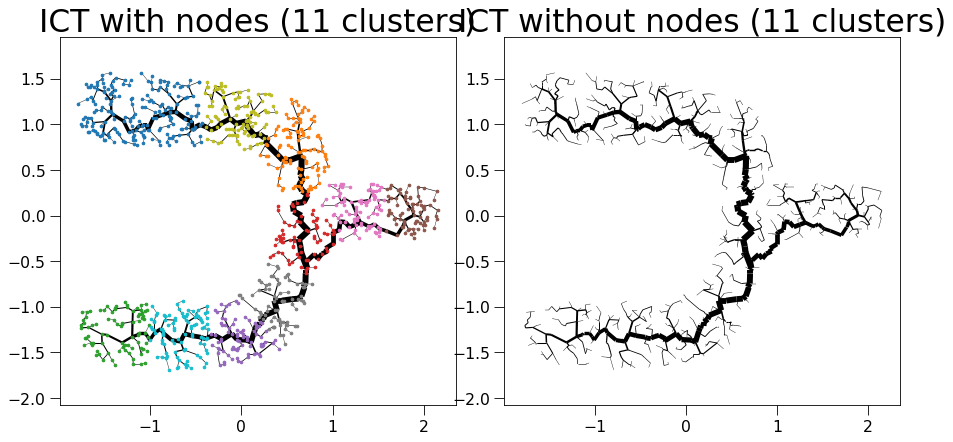

sklearn is done: 0.07855701446533203
My own part is done: 0.0005402565002441406


  0%|          | 0/12 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/580 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/580 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 580 -> 516
update Arr 516 -> 456
update Arr 456 -> 413
update Arr 413 -> 374
update Arr 374 -> 336
update Arr 336 -> 303
update Arr 303 -> 269
update Arr 269 -> 244
update Arr 244 -> 218
update Arr 218 -> 198
update Arr 198 -> 179
update Arr 179 -> 159
update Arr 159 -> 144
update Arr 144 -> 127
update Arr 127 -> 109
update Arr 109 -> 98
update Arr 98 -> 94
update Arr 94 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
Final k: 11


create edgeId array:   0%|          | 0/637 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/637 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 637 -> 574
update Arr 574 -> 513
update Arr 513 -> 453
update Arr 453 -> 409
update Arr 409 -> 371
update Arr 371 -> 336
update Arr 336 -> 305
update Arr 305 -> 276
update Arr 276 -> 244
update Arr 244 -> 221
update Arr 221 -> 198
update Arr 198 -> 179
update Arr 179 -> 161
update Arr 161 -> 142
update Arr 142 -> 125
update Arr 125 -> 112
update Arr 112 -> 108
update Arr 108 -> 104
update Arr 104 -> 101
update Arr 101 -> 99
update Arr 99 -> 98
Final k: 11


create edgeId array:   0%|          | 0/591 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/591 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 591 -> 534
update Arr 534 -> 470
update Arr 470 -> 424
update Arr 424 -> 380
update Arr 380 -> 342
update Arr 342 -> 304
update Arr 304 -> 275
update Arr 275 -> 245
update Arr 245 -> 218
update Arr 218 -> 198
update Arr 198 -> 177
update Arr 177 -> 156
update Arr 156 -> 136
update Arr 136 -> 116
update Arr 116 -> 104
update Arr 104 -> 99
update Arr 99 -> 95
update Arr 95 -> 92
update Arr 92 -> 90
update Arr 90 -> 89
Final k: 11


create edgeId array:   0%|          | 0/480 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/480 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 480 -> 426
update Arr 426 -> 384
update Arr 384 -> 349
update Arr 349 -> 308
update Arr 308 -> 273
update Arr 273 -> 242
update Arr 242 -> 217
update Arr 217 -> 187
update Arr 187 -> 165
update Arr 165 -> 142
update Arr 142 -> 125
update Arr 125 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 80
update Arr 80 -> 74
update Arr 74 -> 72
update Arr 72 -> 72
update Arr 72 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/492 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/492 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 492 -> 440
update Arr 440 -> 398
update Arr 398 -> 358
update Arr 358 -> 325
update Arr 325 -> 295
update Arr 295 -> 267
update Arr 267 -> 242
update Arr 242 -> 216
update Arr 216 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 119
update Arr 119 -> 104
update Arr 104 -> 91
update Arr 91 -> 86
update Arr 86 -> 86
update Arr 86 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/614 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/614 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 614 -> 554
update Arr 554 -> 499
update Arr 499 -> 441
update Arr 441 -> 400
update Arr 400 -> 356
update Arr 356 -> 323
update Arr 323 -> 291
update Arr 291 -> 264
update Arr 264 -> 231
update Arr 231 -> 209
update Arr 209 -> 185
update Arr 185 -> 155
update Arr 155 -> 137
update Arr 137 -> 121
update Arr 121 -> 105
update Arr 105 -> 101
update Arr 101 -> 98
update Arr 98 -> 95
update Arr 95 -> 95
update Arr 95 -> 94
Final k: 11


create edgeId array:   0%|          | 0/454 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/454 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 454 -> 406
update Arr 406 -> 363
update Arr 363 -> 329
update Arr 329 -> 294
update Arr 294 -> 266
update Arr 266 -> 235
update Arr 235 -> 209
update Arr 209 -> 185
update Arr 185 -> 163
update Arr 163 -> 147
update Arr 147 -> 133
update Arr 133 -> 116
update Arr 116 -> 104
update Arr 104 -> 86
update Arr 86 -> 75
update Arr 75 -> 73
update Arr 73 -> 69
update Arr 69 -> 68
update Arr 68 -> 67
Final k: 11


create edgeId array:   0%|          | 0/593 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/593 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/90 [00:00<?, ?it/s]

update Arr 593 -> 538
update Arr 538 -> 477
update Arr 477 -> 423
update Arr 423 -> 378
update Arr 378 -> 339
update Arr 339 -> 305
update Arr 305 -> 275
update Arr 275 -> 247
update Arr 247 -> 220
update Arr 220 -> 199
update Arr 199 -> 177
update Arr 177 -> 157
update Arr 157 -> 141
update Arr 141 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 98
update Arr 98 -> 96
update Arr 96 -> 93
update Arr 93 -> 91
update Arr 91 -> 90
Final k: 11


create edgeId array:   0%|          | 0/690 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/690 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 690 -> 620
update Arr 620 -> 555
update Arr 555 -> 500
update Arr 500 -> 450
update Arr 450 -> 409
update Arr 409 -> 371
update Arr 371 -> 337
update Arr 337 -> 301
update Arr 301 -> 273
update Arr 273 -> 247
update Arr 247 -> 215
update Arr 215 -> 194
update Arr 194 -> 173
update Arr 173 -> 152
update Arr 152 -> 137
update Arr 137 -> 119
update Arr 119 -> 111
update Arr 111 -> 108
update Arr 108 -> 104
update Arr 104 -> 102
Final k: 11


create edgeId array:   0%|          | 0/354 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/354 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 354 -> 310
update Arr 310 -> 279
update Arr 279 -> 250
update Arr 250 -> 215
update Arr 215 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 135
update Arr 135 -> 118
update Arr 118 -> 106
update Arr 106 -> 89
update Arr 89 -> 73
update Arr 73 -> 66
update Arr 66 -> 62
update Arr 62 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/510 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/510 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 510 -> 462
update Arr 462 -> 406
update Arr 406 -> 369
update Arr 369 -> 333
update Arr 333 -> 302
update Arr 302 -> 270
update Arr 270 -> 242
update Arr 242 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 122
update Arr 122 -> 99
update Arr 99 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/554 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/554 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 554 -> 501
update Arr 501 -> 455
update Arr 455 -> 407
update Arr 407 -> 352
update Arr 352 -> 319
update Arr 319 -> 287
update Arr 287 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 189
update Arr 189 -> 168
update Arr 168 -> 151
update Arr 151 -> 134
update Arr 134 -> 120
update Arr 120 -> 103
update Arr 103 -> 93
update Arr 93 -> 89
update Arr 89 -> 85
update Arr 85 -> 84
update Arr 84 -> 83


Patching the components together:   0%|          | 0/12 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1018 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1018 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1018 -> 1009
added 276 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 100

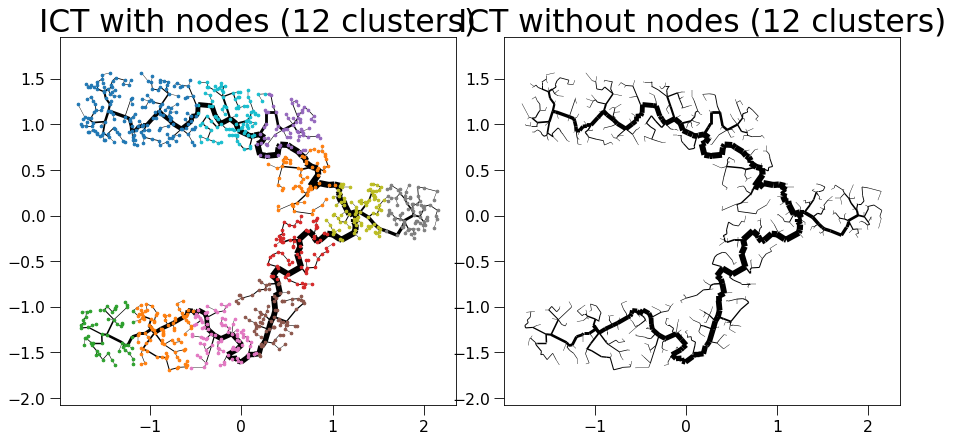

sklearn is done: 0.07912993431091309
My own part is done: 0.0008254051208496094


  0%|          | 0/13 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/419 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/419 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 419 -> 375
update Arr 375 -> 328
update Arr 328 -> 290
update Arr 290 -> 259
update Arr 259 -> 231
update Arr 231 -> 205
update Arr 205 -> 186
update Arr 186 -> 163
update Arr 163 -> 145
update Arr 145 -> 130
update Arr 130 -> 114
update Arr 114 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 472 -> 427
update Arr 427 -> 388
update Arr 388 -> 338
update Arr 338 -> 302
update Arr 302 -> 272
update Arr 272 -> 245
update Arr 245 -> 220
update Arr 220 -> 198
update Arr 198 -> 178
update Arr 178 -> 156
update Arr 156 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 96
update Arr 96 -> 81
update Arr 81 -> 79
update Arr 79 -> 76
update Arr 76 -> 73
Final k: 11


create edgeId array:   0%|          | 0/619 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/619 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/96 [00:00<?, ?it/s]

update Arr 619 -> 561
update Arr 561 -> 499
update Arr 499 -> 450
update Arr 450 -> 408
update Arr 408 -> 367
update Arr 367 -> 333
update Arr 333 -> 301
update Arr 301 -> 271
update Arr 271 -> 245
update Arr 245 -> 221
update Arr 221 -> 187
update Arr 187 -> 169
update Arr 169 -> 153
update Arr 153 -> 132
update Arr 132 -> 113
update Arr 113 -> 102
update Arr 102 -> 100
update Arr 100 -> 99
update Arr 99 -> 97
update Arr 97 -> 96
Final k: 11


create edgeId array:   0%|          | 0/591 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/591 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 591 -> 534
update Arr 534 -> 470
update Arr 470 -> 424
update Arr 424 -> 380
update Arr 380 -> 342
update Arr 342 -> 304
update Arr 304 -> 275
update Arr 275 -> 245
update Arr 245 -> 218
update Arr 218 -> 198
update Arr 198 -> 177
update Arr 177 -> 156
update Arr 156 -> 136
update Arr 136 -> 116
update Arr 116 -> 104
update Arr 104 -> 99
update Arr 99 -> 95
update Arr 95 -> 92
update Arr 92 -> 90
update Arr 90 -> 89
Final k: 11


create edgeId array:   0%|          | 0/510 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/510 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 510 -> 462
update Arr 462 -> 406
update Arr 406 -> 369
update Arr 369 -> 333
update Arr 333 -> 302
update Arr 302 -> 270
update Arr 270 -> 242
update Arr 242 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 122
update Arr 122 -> 99
update Arr 99 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/519 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/519 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 519 -> 465
update Arr 465 -> 418
update Arr 418 -> 375
update Arr 375 -> 340
update Arr 340 -> 305
update Arr 305 -> 277
update Arr 277 -> 247
update Arr 247 -> 224
update Arr 224 -> 202
update Arr 202 -> 183
update Arr 183 -> 161
update Arr 161 -> 141
update Arr 141 -> 125
update Arr 125 -> 112
update Arr 112 -> 100
update Arr 100 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/554 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/554 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 554 -> 497
update Arr 497 -> 437
update Arr 437 -> 396
update Arr 396 -> 353
update Arr 353 -> 316
update Arr 316 -> 287
update Arr 287 -> 259
update Arr 259 -> 233
update Arr 233 -> 211
update Arr 211 -> 182
update Arr 182 -> 163
update Arr 163 -> 146
update Arr 146 -> 131
update Arr 131 -> 119
update Arr 119 -> 106
update Arr 106 -> 95
update Arr 95 -> 91
update Arr 91 -> 88
update Arr 88 -> 86
update Arr 86 -> 85
Final k: 11


create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 388 -> 350
update Arr 350 -> 315
update Arr 315 -> 282
update Arr 282 -> 245
update Arr 245 -> 219
update Arr 219 -> 185
update Arr 185 -> 166
update Arr 166 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 94
update Arr 94 -> 78
update Arr 78 -> 71
update Arr 71 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/380 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/380 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 380 -> 332
update Arr 332 -> 300
update Arr 300 -> 267
update Arr 267 -> 241
update Arr 241 -> 215
update Arr 215 -> 192
update Arr 192 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 103
update Arr 103 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 59
update Arr 59 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 476 -> 427
update Arr 427 -> 380
update Arr 380 -> 341
update Arr 341 -> 307
update Arr 307 -> 275
update Arr 275 -> 246
update Arr 246 -> 218
update Arr 218 -> 197
update Arr 197 -> 177
update Arr 177 -> 154
update Arr 154 -> 135
update Arr 135 -> 119
update Arr 119 -> 106
update Arr 106 -> 90
update Arr 90 -> 78
update Arr 78 -> 76
update Arr 76 -> 72
update Arr 72 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/567 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/567 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 567 -> 514
update Arr 514 -> 457
update Arr 457 -> 414
update Arr 414 -> 374
update Arr 374 -> 339
update Arr 339 -> 305
update Arr 305 -> 277
update Arr 277 -> 248
update Arr 248 -> 225
update Arr 225 -> 202
update Arr 202 -> 182
update Arr 182 -> 160
update Arr 160 -> 140
update Arr 140 -> 125
update Arr 125 -> 113
update Arr 113 -> 100
update Arr 100 -> 96
update Arr 96 -> 92
update Arr 92 -> 89
update Arr 89 -> 87
update Arr 87 -> 86
Final k: 11


create edgeId array:   0%|          | 0/530 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/530 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 530 -> 472
update Arr 472 -> 420
update Arr 420 -> 380
update Arr 380 -> 341
update Arr 341 -> 305
update Arr 305 -> 275
update Arr 275 -> 246
update Arr 246 -> 223
update Arr 223 -> 201
update Arr 201 -> 180
update Arr 180 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 116
update Arr 116 -> 100
update Arr 100 -> 84
update Arr 84 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/529 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/529 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 529 -> 476
update Arr 476 -> 426
update Arr 426 -> 378
update Arr 378 -> 337
update Arr 337 -> 301
update Arr 301 -> 265
update Arr 265 -> 239
update Arr 239 -> 214
update Arr 214 -> 191
update Arr 191 -> 169
update Arr 169 -> 144
update Arr 144 -> 127
update Arr 127 -> 112
update Arr 112 -> 98
update Arr 98 -> 89
update Arr 89 -> 85
update Arr 85 -> 82
update Arr 82 -> 80
update Arr 80 -> 79


Patching the components together:   0%|          | 0/13 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1022 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1022 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1022 -> 1008
added 274 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1004
added 4 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1000
added 3 edges early
update Arr 1000 -> 999
added 543 edges early


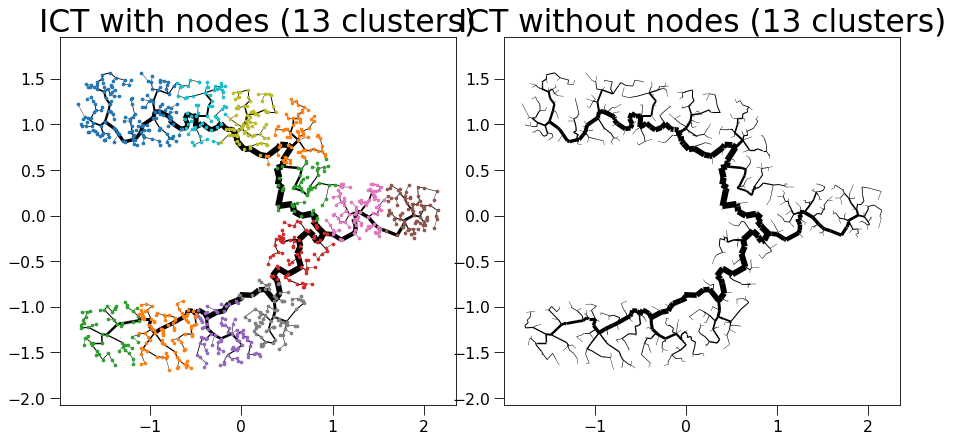

sklearn is done: 0.08169293403625488
My own part is done: 0.0009002685546875


  0%|          | 0/14 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/338 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/338 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 338 -> 299
update Arr 299 -> 269
update Arr 269 -> 236
update Arr 236 -> 205
update Arr 205 -> 186
update Arr 186 -> 167
update Arr 167 -> 150
update Arr 150 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 62
update Arr 62 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/583 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/583 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/87 [00:00<?, ?it/s]

update Arr 583 -> 528
update Arr 528 -> 466
update Arr 466 -> 423
update Arr 423 -> 382
update Arr 382 -> 344
update Arr 344 -> 311
update Arr 311 -> 280
update Arr 280 -> 249
update Arr 249 -> 223
update Arr 223 -> 201
update Arr 201 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 130
update Arr 130 -> 116
update Arr 116 -> 99
update Arr 99 -> 93
update Arr 93 -> 90
update Arr 90 -> 90
update Arr 90 -> 88
update Arr 88 -> 87
Final k: 11


create edgeId array:   0%|          | 0/553 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/553 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 553 -> 495
update Arr 495 -> 437
update Arr 437 -> 396
update Arr 396 -> 359
update Arr 359 -> 323
update Arr 323 -> 283
update Arr 283 -> 253
update Arr 253 -> 229
update Arr 229 -> 208
update Arr 208 -> 189
update Arr 189 -> 170
update Arr 170 -> 153
update Arr 153 -> 131
update Arr 131 -> 119
update Arr 119 -> 103
update Arr 103 -> 94
update Arr 94 -> 90
update Arr 90 -> 87
update Arr 87 -> 85
update Arr 85 -> 84
Final k: 11


create edgeId array:   0%|          | 0/512 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/512 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 512 -> 457
update Arr 457 -> 398
update Arr 398 -> 358
update Arr 358 -> 319
update Arr 319 -> 284
update Arr 284 -> 256
update Arr 256 -> 230
update Arr 230 -> 203
update Arr 203 -> 184
update Arr 184 -> 163
update Arr 163 -> 143
update Arr 143 -> 129
update Arr 129 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 86
update Arr 86 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/579 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/579 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 579 -> 523
update Arr 523 -> 461
update Arr 461 -> 417
update Arr 417 -> 378
update Arr 378 -> 341
update Arr 341 -> 309
update Arr 309 -> 272
update Arr 272 -> 247
update Arr 247 -> 220
update Arr 220 -> 197
update Arr 197 -> 174
update Arr 174 -> 148
update Arr 148 -> 130
update Arr 130 -> 114
update Arr 114 -> 101
update Arr 101 -> 96
update Arr 96 -> 92
update Arr 92 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
Final k: 11


create edgeId array:   0%|          | 0/537 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/537 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 537 -> 479
update Arr 479 -> 434
update Arr 434 -> 394
update Arr 394 -> 354
update Arr 354 -> 314
update Arr 314 -> 278
update Arr 278 -> 247
update Arr 247 -> 224
update Arr 224 -> 203
update Arr 203 -> 183
update Arr 183 -> 165
update Arr 165 -> 145
update Arr 145 -> 131
update Arr 131 -> 116
update Arr 116 -> 100
update Arr 100 -> 84
update Arr 84 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/550 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/550 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 550 -> 496
update Arr 496 -> 438
update Arr 438 -> 382
update Arr 382 -> 346
update Arr 346 -> 310
update Arr 310 -> 278
update Arr 278 -> 248
update Arr 248 -> 223
update Arr 223 -> 199
update Arr 199 -> 175
update Arr 175 -> 158
update Arr 158 -> 141
update Arr 141 -> 127
update Arr 127 -> 110
update Arr 110 -> 98
update Arr 98 -> 94
update Arr 94 -> 89
update Arr 89 -> 87
update Arr 87 -> 85
update Arr 85 -> 84
Final k: 11


create edgeId array:   0%|          | 0/337 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/337 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 337 -> 294
update Arr 294 -> 260
update Arr 260 -> 234
update Arr 234 -> 206
update Arr 206 -> 187
update Arr 187 -> 169
update Arr 169 -> 142
update Arr 142 -> 129
update Arr 129 -> 114
update Arr 114 -> 103
update Arr 103 -> 87
update Arr 87 -> 73
update Arr 73 -> 60
update Arr 60 -> 58
update Arr 58 -> 55
update Arr 55 -> 52
Final k: 11


create edgeId array:   0%|          | 0/510 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/510 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 510 -> 462
update Arr 462 -> 406
update Arr 406 -> 369
update Arr 369 -> 333
update Arr 333 -> 302
update Arr 302 -> 270
update Arr 270 -> 242
update Arr 242 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 122
update Arr 122 -> 99
update Arr 99 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/395 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/395 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 395 -> 353
update Arr 353 -> 291
update Arr 291 -> 261
update Arr 261 -> 234
update Arr 234 -> 210
update Arr 210 -> 189
update Arr 189 -> 167
update Arr 167 -> 148
update Arr 148 -> 130
update Arr 130 -> 118
update Arr 118 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/512 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/512 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 512 -> 458
update Arr 458 -> 409
update Arr 409 -> 366
update Arr 366 -> 327
update Arr 327 -> 292
update Arr 292 -> 265
update Arr 265 -> 238
update Arr 238 -> 216
update Arr 216 -> 190
update Arr 190 -> 169
update Arr 169 -> 140
update Arr 140 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 85
update Arr 85 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 319 -> 282
update Arr 282 -> 250
update Arr 250 -> 226
update Arr 226 -> 198
update Arr 198 -> 175
update Arr 175 -> 156
update Arr 156 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 69
update Arr 69 -> 59
update Arr 59 -> 55
update Arr 55 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/432 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/432 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 432 -> 392
update Arr 392 -> 350
update Arr 350 -> 316
update Arr 316 -> 282
update Arr 282 -> 248
update Arr 248 -> 223
update Arr 223 -> 200
update Arr 200 -> 180
update Arr 180 -> 160
update Arr 160 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 73
update Arr 73 -> 70
update Arr 70 -> 68
update Arr 68 -> 67
Final k: 11


create edgeId array:   0%|          | 0/425 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/425 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/64 [00:00<?, ?it/s]

update Arr 425 -> 379
update Arr 379 -> 330
update Arr 330 -> 296
update Arr 296 -> 267
update Arr 267 -> 242
update Arr 242 -> 214
update Arr 214 -> 189
update Arr 189 -> 169
update Arr 169 -> 148
update Arr 148 -> 134
update Arr 134 -> 116
update Arr 116 -> 100
update Arr 100 -> 85
update Arr 85 -> 71
update Arr 71 -> 69
update Arr 69 -> 67
update Arr 67 -> 64


Patching the components together:   0%|          | 0/14 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1023 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1023 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1023 -> 1009
added 291 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1002
added 3 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 999
added 4 edges early
added 522 edges early


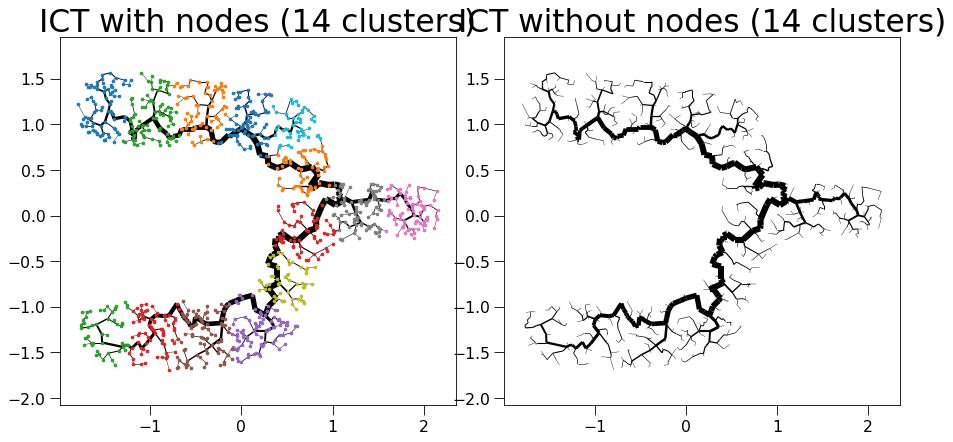

sklearn is done: 0.0927278995513916
My own part is done: 0.0007424354553222656


  0%|          | 0/15 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/528 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/528 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 528 -> 470
update Arr 470 -> 425
update Arr 425 -> 368
update Arr 368 -> 333
update Arr 333 -> 300
update Arr 300 -> 264
update Arr 264 -> 236
update Arr 236 -> 206
update Arr 206 -> 185
update Arr 185 -> 167
update Arr 167 -> 148
update Arr 148 -> 133
update Arr 133 -> 118
update Arr 118 -> 103
update Arr 103 -> 93
update Arr 93 -> 86
update Arr 86 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/601 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/601 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/90 [00:00<?, ?it/s]

update Arr 601 -> 538
update Arr 538 -> 475
update Arr 475 -> 425
update Arr 425 -> 382
update Arr 382 -> 345
update Arr 345 -> 308
update Arr 308 -> 279
update Arr 279 -> 253
update Arr 253 -> 227
update Arr 227 -> 204
update Arr 204 -> 180
update Arr 180 -> 156
update Arr 156 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 100
update Arr 100 -> 96
update Arr 96 -> 93
update Arr 93 -> 90
Final k: 11


create edgeId array:   0%|          | 0/504 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/504 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 504 -> 456
update Arr 456 -> 414
update Arr 414 -> 373
update Arr 373 -> 338
update Arr 338 -> 303
update Arr 303 -> 272
update Arr 272 -> 247
update Arr 247 -> 223
update Arr 223 -> 197
update Arr 197 -> 179
update Arr 179 -> 161
update Arr 161 -> 141
update Arr 141 -> 127
update Arr 127 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 83
update Arr 83 -> 81
update Arr 81 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
Final k: 11


create edgeId array:   0%|          | 0/400 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/400 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 400 -> 362
update Arr 362 -> 321
update Arr 321 -> 277
update Arr 277 -> 243
update Arr 243 -> 220
update Arr 220 -> 193
update Arr 193 -> 175
update Arr 175 -> 157
update Arr 157 -> 141
update Arr 141 -> 125
update Arr 125 -> 111
update Arr 111 -> 97
update Arr 97 -> 77
update Arr 77 -> 66
update Arr 66 -> 64
update Arr 64 -> 60
update Arr 60 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/390 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/390 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 390 -> 342
update Arr 342 -> 307
update Arr 307 -> 279
update Arr 279 -> 250
update Arr 250 -> 226
update Arr 226 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 150
update Arr 150 -> 136
update Arr 136 -> 123
update Arr 123 -> 110
update Arr 110 -> 97
update Arr 97 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 67
update Arr 67 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/505 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/505 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 505 -> 450
update Arr 450 -> 393
update Arr 393 -> 356
update Arr 356 -> 321
update Arr 321 -> 291
update Arr 291 -> 259
update Arr 259 -> 232
update Arr 232 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 117
update Arr 117 -> 103
update Arr 103 -> 89
update Arr 89 -> 82
update Arr 82 -> 81
update Arr 81 -> 77
update Arr 77 -> 76
update Arr 76 -> 75
Final k: 11


create edgeId array:   0%|          | 0/330 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/330 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 330 -> 295
update Arr 295 -> 263
update Arr 263 -> 239
update Arr 239 -> 213
update Arr 213 -> 180
update Arr 180 -> 162
update Arr 162 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 92
update Arr 92 -> 83
update Arr 83 -> 68
update Arr 68 -> 59
update Arr 59 -> 56
update Arr 56 -> 54
update Arr 54 -> 51
update Arr 51 -> 48
Final k: 11


create edgeId array:   0%|          | 0/324 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/324 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 324 -> 292
update Arr 292 -> 265
update Arr 265 -> 240
update Arr 240 -> 212
update Arr 212 -> 191
update Arr 191 -> 171
update Arr 171 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 112
update Arr 112 -> 101
update Arr 101 -> 85
update Arr 85 -> 71
update Arr 71 -> 58
update Arr 58 -> 56
update Arr 56 -> 53
update Arr 53 -> 50
Final k: 11


create edgeId array:   0%|          | 0/381 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/381 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 381 -> 333
update Arr 333 -> 297
update Arr 297 -> 260
update Arr 260 -> 235
update Arr 235 -> 209
update Arr 209 -> 188
update Arr 188 -> 168
update Arr 168 -> 152
update Arr 152 -> 136
update Arr 136 -> 121
update Arr 121 -> 109
update Arr 109 -> 97
update Arr 97 -> 85
update Arr 85 -> 75
update Arr 75 -> 67
update Arr 67 -> 64
update Arr 64 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/386 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/386 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 386 -> 341
update Arr 341 -> 297
update Arr 297 -> 267
update Arr 267 -> 241
update Arr 241 -> 211
update Arr 211 -> 183
update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 131
update Arr 131 -> 118
update Arr 118 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 70
update Arr 70 -> 64
update Arr 64 -> 62
update Arr 62 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/313 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/313 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 313 -> 276
update Arr 276 -> 249
update Arr 249 -> 219
update Arr 219 -> 197
update Arr 197 -> 176
update Arr 176 -> 156
update Arr 156 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/441 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/441 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 441 -> 395
update Arr 395 -> 350
update Arr 350 -> 317
update Arr 317 -> 284
update Arr 284 -> 256
update Arr 256 -> 230
update Arr 230 -> 209
update Arr 209 -> 189
update Arr 189 -> 170
update Arr 170 -> 150
update Arr 150 -> 134
update Arr 134 -> 115
update Arr 115 -> 98
update Arr 98 -> 86
update Arr 86 -> 75
update Arr 75 -> 69
update Arr 69 -> 66
update Arr 66 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/403 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/403 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 403 -> 349
update Arr 349 -> 316
update Arr 316 -> 280
update Arr 280 -> 247
update Arr 247 -> 223
update Arr 223 -> 202
update Arr 202 -> 183
update Arr 183 -> 164
update Arr 164 -> 146
update Arr 146 -> 129
update Arr 129 -> 117
update Arr 117 -> 100
update Arr 100 -> 84
update Arr 84 -> 74
update Arr 74 -> 69
update Arr 69 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/545 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/545 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 545 -> 491
update Arr 491 -> 443
update Arr 443 -> 386
update Arr 386 -> 346
update Arr 346 -> 314
update Arr 314 -> 285
update Arr 285 -> 254
update Arr 254 -> 228
update Arr 228 -> 202
update Arr 202 -> 177
update Arr 177 -> 159
update Arr 159 -> 144
update Arr 144 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 93
update Arr 93 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 83
Final k: 11


create edgeId array:   0%|          | 0/565 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/565 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 565 -> 506
update Arr 506 -> 454
update Arr 454 -> 408
update Arr 408 -> 367
update Arr 367 -> 333
update Arr 333 -> 301
update Arr 301 -> 273
update Arr 273 -> 247
update Arr 247 -> 223
update Arr 223 -> 198
update Arr 198 -> 176
update Arr 176 -> 155
update Arr 155 -> 132
update Arr 132 -> 115
update Arr 115 -> 99
update Arr 99 -> 92
update Arr 92 -> 90
update Arr 90 -> 87
update Arr 87 -> 85
update Arr 85 -> 84


Patching the components together:   0%|          | 0/15 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1026 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1026 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1026 -> 1009
added 282 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1001
added 3 edges early
update Arr 1001 -> 999
added 3 edges early
added 534 edges early


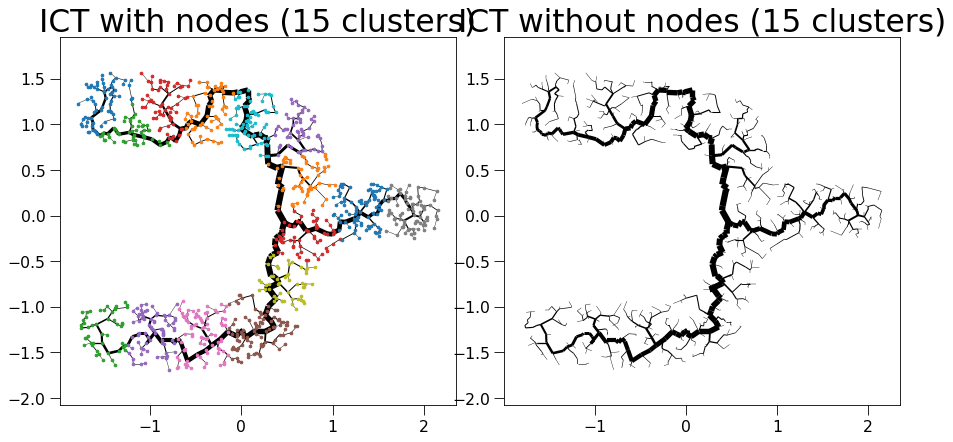

sklearn is done: 0.09782528877258301
My own part is done: 0.0010309219360351562


  0%|          | 0/16 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/538 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/538 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 538 -> 480
update Arr 480 -> 424
update Arr 424 -> 368
update Arr 368 -> 329
update Arr 329 -> 298
update Arr 298 -> 264
update Arr 264 -> 239
update Arr 239 -> 215
update Arr 215 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 109
update Arr 109 -> 96
update Arr 96 -> 85
update Arr 85 -> 84
update Arr 84 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/445 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/445 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 445 -> 404
update Arr 404 -> 356
update Arr 356 -> 317
update Arr 317 -> 272
update Arr 272 -> 245
update Arr 245 -> 221
update Arr 221 -> 196
update Arr 196 -> 177
update Arr 177 -> 160
update Arr 160 -> 145
update Arr 145 -> 128
update Arr 128 -> 113
update Arr 113 -> 97
update Arr 97 -> 85
update Arr 85 -> 73
update Arr 73 -> 71
update Arr 71 -> 69
update Arr 69 -> 67
update Arr 67 -> 66
Final k: 11


create edgeId array:   0%|          | 0/353 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/353 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 353 -> 318
update Arr 318 -> 285
update Arr 285 -> 255
update Arr 255 -> 231
update Arr 231 -> 206
update Arr 206 -> 184
update Arr 184 -> 167
update Arr 167 -> 149
update Arr 149 -> 133
update Arr 133 -> 118
update Arr 118 -> 98
update Arr 98 -> 85
update Arr 85 -> 70
update Arr 70 -> 61
update Arr 61 -> 60
update Arr 60 -> 60
update Arr 60 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/486 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/486 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 486 -> 430
update Arr 430 -> 381
update Arr 381 -> 344
update Arr 344 -> 307
update Arr 307 -> 279
update Arr 279 -> 249
update Arr 249 -> 226
update Arr 226 -> 201
update Arr 201 -> 180
update Arr 180 -> 159
update Arr 159 -> 138
update Arr 138 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 82
update Arr 82 -> 80
update Arr 80 -> 77
update Arr 77 -> 75
update Arr 75 -> 74
Final k: 11


create edgeId array:   0%|          | 0/472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 472 -> 429
update Arr 429 -> 389
update Arr 389 -> 335
update Arr 335 -> 297
update Arr 297 -> 269
update Arr 269 -> 242
update Arr 242 -> 218
update Arr 218 -> 192
update Arr 192 -> 170
update Arr 170 -> 151
update Arr 151 -> 132
update Arr 132 -> 103
update Arr 103 -> 85
update Arr 85 -> 77
update Arr 77 -> 76
update Arr 76 -> 73
update Arr 73 -> 72
update Arr 72 -> 71
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 291 -> 262
update Arr 262 -> 229
update Arr 229 -> 204
update Arr 204 -> 180
update Arr 180 -> 154
update Arr 154 -> 135
update Arr 135 -> 120
update Arr 120 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 70
update Arr 70 -> 60
update Arr 60 -> 55
update Arr 55 -> 55
update Arr 55 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 476 -> 425
update Arr 425 -> 376
update Arr 376 -> 339
update Arr 339 -> 305
update Arr 305 -> 277
update Arr 277 -> 244
update Arr 244 -> 221
update Arr 221 -> 198
update Arr 198 -> 175
update Arr 175 -> 157
update Arr 157 -> 142
update Arr 142 -> 128
update Arr 128 -> 113
update Arr 113 -> 97
update Arr 97 -> 85
update Arr 85 -> 80
update Arr 80 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/393 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/393 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 393 -> 348
update Arr 348 -> 303
update Arr 303 -> 273
update Arr 273 -> 242
update Arr 242 -> 218
update Arr 218 -> 197
update Arr 197 -> 177
update Arr 177 -> 159
update Arr 159 -> 144
update Arr 144 -> 126
update Arr 126 -> 114
update Arr 114 -> 97
update Arr 97 -> 84
update Arr 84 -> 71
update Arr 71 -> 65
update Arr 65 -> 63
update Arr 63 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/355 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/355 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 355 -> 317
update Arr 317 -> 278
update Arr 278 -> 238
update Arr 238 -> 216
update Arr 216 -> 195
update Arr 195 -> 176
update Arr 176 -> 156
update Arr 156 -> 137
update Arr 137 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 83
update Arr 83 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/457 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/457 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 457 -> 411
update Arr 411 -> 351
update Arr 351 -> 318
update Arr 318 -> 289
update Arr 289 -> 258
update Arr 258 -> 230
update Arr 230 -> 209
update Arr 209 -> 188
update Arr 188 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 124
update Arr 124 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 75
update Arr 75 -> 74
update Arr 74 -> 74
update Arr 74 -> 71
update Arr 71 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/439 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/439 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 439 -> 398
update Arr 398 -> 354
update Arr 354 -> 321
update Arr 321 -> 291
update Arr 291 -> 263
update Arr 263 -> 234
update Arr 234 -> 212
update Arr 212 -> 185
update Arr 185 -> 166
update Arr 166 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 101
update Arr 101 -> 86
update Arr 86 -> 76
update Arr 76 -> 74
update Arr 74 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/376 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/376 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 376 -> 333
update Arr 333 -> 285
update Arr 285 -> 255
update Arr 255 -> 231
update Arr 231 -> 202
update Arr 202 -> 183
update Arr 183 -> 166
update Arr 166 -> 149
update Arr 149 -> 127
update Arr 127 -> 111
update Arr 111 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 71
update Arr 71 -> 65
update Arr 65 -> 62
update Arr 62 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/399 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/399 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 399 -> 354
update Arr 354 -> 303
update Arr 303 -> 274
update Arr 274 -> 246
update Arr 246 -> 213
update Arr 213 -> 191
update Arr 191 -> 170
update Arr 170 -> 150
update Arr 150 -> 135
update Arr 135 -> 120
update Arr 120 -> 109
update Arr 109 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 66
update Arr 66 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 273 -> 247
update Arr 247 -> 221
update Arr 221 -> 199
update Arr 199 -> 173
update Arr 173 -> 154
update Arr 154 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 70
update Arr 70 -> 63
update Arr 63 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/375 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/375 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 375 -> 334
update Arr 334 -> 298
update Arr 298 -> 266
update Arr 266 -> 239
update Arr 239 -> 214
update Arr 214 -> 194
update Arr 194 -> 170
update Arr 170 -> 140
update Arr 140 -> 125
update Arr 125 -> 106
update Arr 106 -> 96
update Arr 96 -> 84
update Arr 84 -> 69
update Arr 69 -> 66
update Arr 66 -> 61
update Arr 61 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/470 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/470 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 470 -> 421
update Arr 421 -> 378
update Arr 378 -> 340
update Arr 340 -> 307
update Arr 307 -> 274
update Arr 274 -> 246
update Arr 246 -> 209
update Arr 209 -> 187
update Arr 187 -> 163
update Arr 163 -> 144
update Arr 144 -> 130
update Arr 130 -> 110
update Arr 110 -> 94
update Arr 94 -> 83
update Arr 83 -> 78
update Arr 78 -> 75
update Arr 75 -> 72
update Arr 72 -> 70
update Arr 70 -> 69


Patching the components together:   0%|          | 0/16 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1029 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1029 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1029 -> 1009
added 283 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
added 2 edges early
update Arr 1006 -> 1005
update Arr 1005 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 2 edges early
added 509 edges early


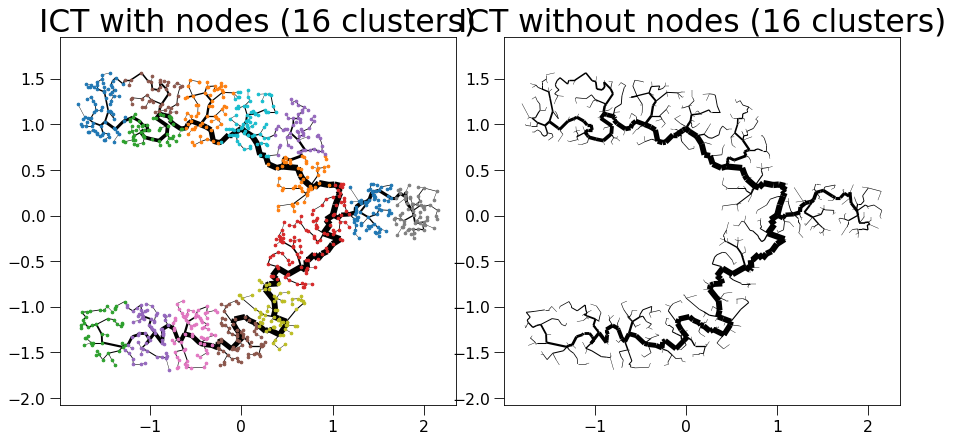

sklearn is done: 0.10877013206481934
My own part is done: 0.0008599758148193359


  0%|          | 0/17 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 397 -> 348
update Arr 348 -> 313
update Arr 313 -> 283
update Arr 283 -> 256
update Arr 256 -> 228
update Arr 228 -> 203
update Arr 203 -> 183
update Arr 183 -> 165
update Arr 165 -> 146
update Arr 146 -> 130
update Arr 130 -> 110
update Arr 110 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 66
update Arr 66 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/367 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/367 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 367 -> 328
update Arr 328 -> 275
update Arr 275 -> 243
update Arr 243 -> 220
update Arr 220 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 139
update Arr 139 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 88
update Arr 88 -> 70
update Arr 70 -> 61
update Arr 61 -> 58
update Arr 58 -> 57
update Arr 57 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/425 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/425 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/64 [00:00<?, ?it/s]

update Arr 425 -> 379
update Arr 379 -> 330
update Arr 330 -> 296
update Arr 296 -> 267
update Arr 267 -> 242
update Arr 242 -> 214
update Arr 214 -> 189
update Arr 189 -> 169
update Arr 169 -> 148
update Arr 148 -> 134
update Arr 134 -> 116
update Arr 116 -> 100
update Arr 100 -> 85
update Arr 85 -> 71
update Arr 71 -> 69
update Arr 69 -> 67
update Arr 67 -> 64
Final k: 11


create edgeId array:   0%|          | 0/349 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/349 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 349 -> 299
update Arr 299 -> 265
update Arr 265 -> 237
update Arr 237 -> 214
update Arr 214 -> 192
update Arr 192 -> 173
update Arr 173 -> 156
update Arr 156 -> 138
update Arr 138 -> 119
update Arr 119 -> 108
update Arr 108 -> 92
update Arr 92 -> 82
update Arr 82 -> 69
update Arr 69 -> 64
update Arr 64 -> 60
update Arr 60 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/575 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/575 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 575 -> 519
update Arr 519 -> 450
update Arr 450 -> 408
update Arr 408 -> 369
update Arr 369 -> 330
update Arr 330 -> 298
update Arr 298 -> 270
update Arr 270 -> 242
update Arr 242 -> 219
update Arr 219 -> 184
update Arr 184 -> 163
update Arr 163 -> 140
update Arr 140 -> 126
update Arr 126 -> 112
update Arr 112 -> 100
update Arr 100 -> 95
update Arr 95 -> 91
update Arr 91 -> 88
update Arr 88 -> 86
update Arr 86 -> 85
Final k: 11


create edgeId array:   0%|          | 0/537 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/537 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 537 -> 479
update Arr 479 -> 423
update Arr 423 -> 371
update Arr 371 -> 336
update Arr 336 -> 299
update Arr 299 -> 271
update Arr 271 -> 245
update Arr 245 -> 218
update Arr 218 -> 196
update Arr 196 -> 178
update Arr 178 -> 161
update Arr 161 -> 142
update Arr 142 -> 125
update Arr 125 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 83
update Arr 83 -> 80
update Arr 80 -> 78
update Arr 78 -> 77
Final k: 11


create edgeId array:   0%|          | 0/287 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/287 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 287 -> 260
update Arr 260 -> 227
update Arr 227 -> 197
update Arr 197 -> 175
update Arr 175 -> 152
update Arr 152 -> 132
update Arr 132 -> 115
update Arr 115 -> 103
update Arr 103 -> 89
update Arr 89 -> 80
update Arr 80 -> 64
update Arr 64 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
update Arr 51 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/337 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/337 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 337 -> 294
update Arr 294 -> 260
update Arr 260 -> 234
update Arr 234 -> 206
update Arr 206 -> 187
update Arr 187 -> 169
update Arr 169 -> 142
update Arr 142 -> 129
update Arr 129 -> 114
update Arr 114 -> 103
update Arr 103 -> 87
update Arr 87 -> 73
update Arr 73 -> 60
update Arr 60 -> 58
update Arr 58 -> 55
update Arr 55 -> 52
Final k: 11


create edgeId array:   0%|          | 0/510 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/510 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 510 -> 462
update Arr 462 -> 406
update Arr 406 -> 369
update Arr 369 -> 333
update Arr 333 -> 302
update Arr 302 -> 270
update Arr 270 -> 242
update Arr 242 -> 217
update Arr 217 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 122
update Arr 122 -> 99
update Arr 99 -> 84
update Arr 84 -> 82
update Arr 82 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
Final k: 11


create edgeId array:   0%|          | 0/344 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/344 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 344 -> 306
update Arr 306 -> 264
update Arr 264 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 128
update Arr 128 -> 111
update Arr 111 -> 100
update Arr 100 -> 90
update Arr 90 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 56
update Arr 56 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/354 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/354 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 354 -> 315
update Arr 315 -> 271
update Arr 271 -> 243
update Arr 243 -> 220
update Arr 220 -> 195
update Arr 195 -> 172
update Arr 172 -> 150
update Arr 150 -> 133
update Arr 133 -> 118
update Arr 118 -> 101
update Arr 101 -> 84
update Arr 84 -> 75
update Arr 75 -> 66
update Arr 66 -> 60
update Arr 60 -> 57
update Arr 57 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
Final k: 11


create edgeId array:   0%|          | 0/468 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/468 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 468 -> 419
update Arr 419 -> 370
update Arr 370 -> 330
update Arr 330 -> 296
update Arr 296 -> 265
update Arr 265 -> 238
update Arr 238 -> 213
update Arr 213 -> 190
update Arr 190 -> 172
update Arr 172 -> 153
update Arr 153 -> 136
update Arr 136 -> 119
update Arr 119 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
Final k: 11


create edgeId array:   0%|          | 0/387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 387 -> 338
update Arr 338 -> 304
update Arr 304 -> 274
update Arr 274 -> 249
update Arr 249 -> 224
update Arr 224 -> 199
update Arr 199 -> 175
update Arr 175 -> 158
update Arr 158 -> 140
update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 81
update Arr 81 -> 68
update Arr 68 -> 66
update Arr 66 -> 62
update Arr 62 -> 58
update Arr 58 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 300 -> 271
update Arr 271 -> 235
update Arr 235 -> 203
update Arr 203 -> 181
update Arr 181 -> 161
update Arr 161 -> 141
update Arr 141 -> 128
update Arr 128 -> 115
update Arr 115 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 48
update Arr 48 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 397 -> 353
update Arr 353 -> 291
update Arr 291 -> 261
update Arr 261 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 168
update Arr 168 -> 150
update Arr 150 -> 135
update Arr 135 -> 120
update Arr 120 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 258 -> 227
update Arr 227 -> 187
update Arr 187 -> 168
update Arr 168 -> 152
update Arr 152 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 89
update Arr 89 -> 74
update Arr 74 -> 64
update Arr 64 -> 55
update Arr 55 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/338 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/338 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 338 -> 299
update Arr 299 -> 269
update Arr 269 -> 236
update Arr 236 -> 205
update Arr 205 -> 186
update Arr 186 -> 167
update Arr 167 -> 150
update Arr 150 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 62
update Arr 62 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47


Patching the components together:   0%|          | 0/17 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1031 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1031 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1031 -> 1007
added 285 edges early
update Arr 1007 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1003
update Arr 1003 -> 1000
added 3 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 509 edges early


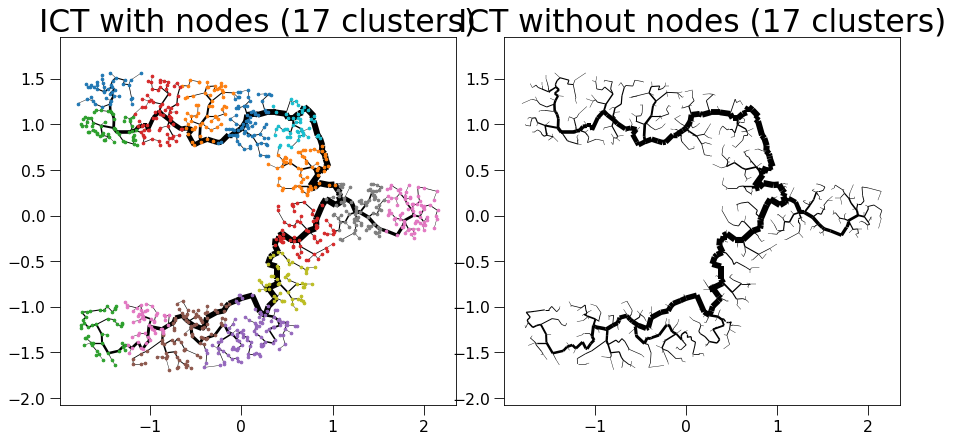

sklearn is done: 0.10489487648010254
My own part is done: 0.0009827613830566406


  0%|          | 0/18 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/422 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/422 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 422 -> 382
update Arr 382 -> 334
update Arr 334 -> 298
update Arr 298 -> 266
update Arr 266 -> 240
update Arr 240 -> 215
update Arr 215 -> 194
update Arr 194 -> 175
update Arr 175 -> 155
update Arr 155 -> 137
update Arr 137 -> 120
update Arr 120 -> 108
update Arr 108 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 68
update Arr 68 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
Final k: 11


create edgeId array:   0%|          | 0/301 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/301 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 301 -> 262
update Arr 262 -> 236
update Arr 236 -> 211
update Arr 211 -> 187
update Arr 187 -> 169
update Arr 169 -> 150
update Arr 150 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 95
update Arr 95 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 55
update Arr 55 -> 50
update Arr 50 -> 49
update Arr 49 -> 46
Final k: 11


create edgeId array:   0%|          | 0/457 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/457 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 457 -> 404
update Arr 404 -> 342
update Arr 342 -> 305
update Arr 305 -> 276
update Arr 276 -> 246
update Arr 246 -> 222
update Arr 222 -> 195
update Arr 195 -> 175
update Arr 175 -> 156
update Arr 156 -> 134
update Arr 134 -> 121
update Arr 121 -> 104
update Arr 104 -> 87
update Arr 87 -> 78
update Arr 78 -> 73
update Arr 73 -> 72
update Arr 72 -> 70
update Arr 70 -> 68
update Arr 68 -> 67
Final k: 11


create edgeId array:   0%|          | 0/325 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/325 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 325 -> 295
update Arr 295 -> 268
update Arr 268 -> 243
update Arr 243 -> 215
update Arr 215 -> 190
update Arr 190 -> 170
update Arr 170 -> 153
update Arr 153 -> 137
update Arr 137 -> 123
update Arr 123 -> 106
update Arr 106 -> 93
update Arr 93 -> 81
update Arr 81 -> 71
update Arr 71 -> 58
update Arr 58 -> 56
update Arr 56 -> 53
update Arr 53 -> 50
Final k: 11


create edgeId array:   0%|          | 0/386 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/386 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 386 -> 341
update Arr 341 -> 297
update Arr 297 -> 267
update Arr 267 -> 241
update Arr 241 -> 211
update Arr 211 -> 183
update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 131
update Arr 131 -> 118
update Arr 118 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 70
update Arr 70 -> 64
update Arr 64 -> 62
update Arr 62 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 388 -> 344
update Arr 344 -> 310
update Arr 310 -> 275
update Arr 275 -> 247
update Arr 247 -> 220
update Arr 220 -> 197
update Arr 197 -> 176
update Arr 176 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 68
update Arr 68 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 453 -> 410
update Arr 410 -> 372
update Arr 372 -> 337
update Arr 337 -> 304
update Arr 304 -> 275
update Arr 275 -> 249
update Arr 249 -> 220
update Arr 220 -> 197
update Arr 197 -> 178
update Arr 178 -> 160
update Arr 160 -> 141
update Arr 141 -> 118
update Arr 118 -> 103
update Arr 103 -> 90
update Arr 90 -> 79
update Arr 79 -> 73
update Arr 73 -> 72
update Arr 72 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/271 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/271 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 271 -> 237
update Arr 237 -> 211
update Arr 211 -> 191
update Arr 191 -> 173
update Arr 173 -> 156
update Arr 156 -> 137
update Arr 137 -> 120
update Arr 120 -> 106
update Arr 106 -> 96
update Arr 96 -> 86
update Arr 86 -> 73
update Arr 73 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 44
update Arr 44 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/363 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/363 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 363 -> 325
update Arr 325 -> 293
update Arr 293 -> 259
update Arr 259 -> 229
update Arr 229 -> 208
update Arr 208 -> 188
update Arr 188 -> 163
update Arr 163 -> 141
update Arr 141 -> 124
update Arr 124 -> 112
update Arr 112 -> 95
update Arr 95 -> 86
update Arr 86 -> 74
update Arr 74 -> 64
update Arr 64 -> 61
update Arr 61 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/416 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/416 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 416 -> 374
update Arr 374 -> 338
update Arr 338 -> 306
update Arr 306 -> 278
update Arr 278 -> 247
update Arr 247 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 159
update Arr 159 -> 139
update Arr 139 -> 120
update Arr 120 -> 106
update Arr 106 -> 89
update Arr 89 -> 72
update Arr 72 -> 71
update Arr 71 -> 71
update Arr 71 -> 67
update Arr 67 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/297 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/297 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 297 -> 268
update Arr 268 -> 238
update Arr 238 -> 208
update Arr 208 -> 186
update Arr 186 -> 163
update Arr 163 -> 143
update Arr 143 -> 126
update Arr 126 -> 114
update Arr 114 -> 100
update Arr 100 -> 89
update Arr 89 -> 71
update Arr 71 -> 61
update Arr 61 -> 56
update Arr 56 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/330 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/330 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 330 -> 299
update Arr 299 -> 261
update Arr 261 -> 229
update Arr 229 -> 201
update Arr 201 -> 181
update Arr 181 -> 161
update Arr 161 -> 144
update Arr 144 -> 128
update Arr 128 -> 111
update Arr 111 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 71
update Arr 71 -> 63
update Arr 63 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/381 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/381 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 381 -> 328
update Arr 328 -> 291
update Arr 291 -> 260
update Arr 260 -> 231
update Arr 231 -> 207
update Arr 207 -> 185
update Arr 185 -> 167
update Arr 167 -> 148
update Arr 148 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 95
update Arr 95 -> 75
update Arr 75 -> 64
update Arr 64 -> 62
update Arr 62 -> 58
update Arr 58 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/535 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/535 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 535 -> 477
update Arr 477 -> 417
update Arr 417 -> 377
update Arr 377 -> 342
update Arr 342 -> 309
update Arr 309 -> 273
update Arr 273 -> 245
update Arr 245 -> 215
update Arr 215 -> 194
update Arr 194 -> 175
update Arr 175 -> 158
update Arr 158 -> 141
update Arr 141 -> 124
update Arr 124 -> 104
update Arr 104 -> 94
update Arr 94 -> 87
update Arr 87 -> 84
update Arr 84 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
Final k: 11


create edgeId array:   0%|          | 0/299 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/299 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 299 -> 265
update Arr 265 -> 229
update Arr 229 -> 206
update Arr 206 -> 185
update Arr 185 -> 165
update Arr 165 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 47
update Arr 47 -> 45
update Arr 45 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/341 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/341 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 341 -> 298
update Arr 298 -> 267
update Arr 267 -> 228
update Arr 228 -> 201
update Arr 201 -> 180
update Arr 180 -> 163
update Arr 163 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 103
update Arr 103 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 61
update Arr 61 -> 57
update Arr 57 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 276 -> 239
update Arr 239 -> 205
update Arr 205 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 131
update Arr 131 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 79
update Arr 79 -> 68
update Arr 68 -> 60
update Arr 60 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/395 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/395 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 395 -> 354
update Arr 354 -> 317
update Arr 317 -> 280
update Arr 280 -> 254
update Arr 254 -> 224
update Arr 224 -> 191
update Arr 191 -> 170
update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 99
update Arr 99 -> 85
update Arr 85 -> 73
update Arr 73 -> 68
update Arr 68 -> 64
update Arr 64 -> 61
update Arr 61 -> 59
update Arr 59 -> 58


Patching the components together:   0%|          | 0/18 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1034 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1034 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1034 -> 1009
added 267 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1002
added 3 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 999
added 499 edges early


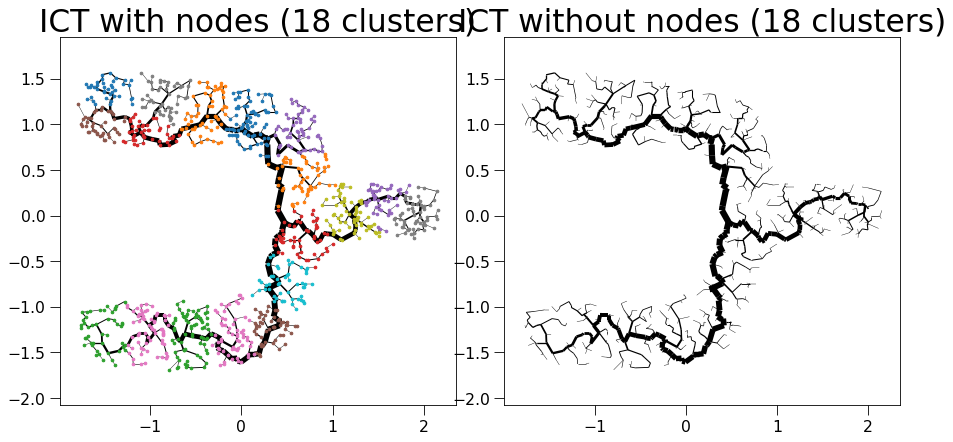

sklearn is done: 0.10030531883239746
My own part is done: 0.0006563663482666016


  0%|          | 0/19 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/379 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/379 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 379 -> 333
update Arr 333 -> 294
update Arr 294 -> 261
update Arr 261 -> 235
update Arr 235 -> 211
update Arr 211 -> 186
update Arr 186 -> 167
update Arr 167 -> 150
update Arr 150 -> 127
update Arr 127 -> 114
update Arr 114 -> 102
update Arr 102 -> 89
update Arr 89 -> 76
update Arr 76 -> 65
update Arr 65 -> 62
update Arr 62 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/390 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/390 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 390 -> 338
update Arr 338 -> 302
update Arr 302 -> 267
update Arr 267 -> 241
update Arr 241 -> 215
update Arr 215 -> 191
update Arr 191 -> 171
update Arr 171 -> 155
update Arr 155 -> 138
update Arr 138 -> 124
update Arr 124 -> 109
update Arr 109 -> 97
update Arr 97 -> 85
update Arr 85 -> 75
update Arr 75 -> 64
update Arr 64 -> 59
update Arr 59 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/298 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/298 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 298 -> 258
update Arr 258 -> 225
update Arr 225 -> 202
update Arr 202 -> 181
update Arr 181 -> 156
update Arr 156 -> 140
update Arr 140 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 85
update Arr 85 -> 75
update Arr 75 -> 66
update Arr 66 -> 55
update Arr 55 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 410 -> 371
update Arr 371 -> 318
update Arr 318 -> 288
update Arr 288 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 167
update Arr 167 -> 148
update Arr 148 -> 132
update Arr 132 -> 116
update Arr 116 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/499 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/499 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 499 -> 445
update Arr 445 -> 402
update Arr 402 -> 359
update Arr 359 -> 325
update Arr 325 -> 293
update Arr 293 -> 266
update Arr 266 -> 240
update Arr 240 -> 209
update Arr 209 -> 189
update Arr 189 -> 170
update Arr 170 -> 154
update Arr 154 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 85
update Arr 85 -> 79
update Arr 79 -> 76
update Arr 76 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
Final k: 11


create edgeId array:   0%|          | 0/317 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/317 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 317 -> 273
update Arr 273 -> 240
update Arr 240 -> 215
update Arr 215 -> 189
update Arr 189 -> 168
update Arr 168 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 65
update Arr 65 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
update Arr 52 -> 47
update Arr 47 -> 46
update Arr 46 -> 46
Final k: 11


create edgeId array:   0%|          | 0/299 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/299 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 299 -> 265
update Arr 265 -> 235
update Arr 235 -> 210
update Arr 210 -> 188
update Arr 188 -> 169
update Arr 169 -> 153
update Arr 153 -> 136
update Arr 136 -> 114
update Arr 114 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 52
update Arr 52 -> 49
update Arr 49 -> 46
Final k: 11


create edgeId array:   0%|          | 0/352 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/352 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 352 -> 309
update Arr 309 -> 273
update Arr 273 -> 245
update Arr 245 -> 222
update Arr 222 -> 196
update Arr 196 -> 172
update Arr 172 -> 154
update Arr 154 -> 139
update Arr 139 -> 125
update Arr 125 -> 111
update Arr 111 -> 96
update Arr 96 -> 82
update Arr 82 -> 74
update Arr 74 -> 63
update Arr 63 -> 59
update Arr 59 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/325 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/325 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 325 -> 293
update Arr 293 -> 249
update Arr 249 -> 223
update Arr 223 -> 193
update Arr 193 -> 175
update Arr 175 -> 154
update Arr 154 -> 131
update Arr 131 -> 116
update Arr 116 -> 103
update Arr 103 -> 90
update Arr 90 -> 74
update Arr 74 -> 67
update Arr 67 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/390 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/390 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 390 -> 354
update Arr 354 -> 313
update Arr 313 -> 283
update Arr 283 -> 253
update Arr 253 -> 228
update Arr 228 -> 199
update Arr 199 -> 177
update Arr 177 -> 150
update Arr 150 -> 134
update Arr 134 -> 118
update Arr 118 -> 99
update Arr 99 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
update Arr 59 -> 59
Final k: 11


create edgeId array:   0%|          | 0/301 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/301 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 301 -> 273
update Arr 273 -> 232
update Arr 232 -> 209
update Arr 209 -> 185
update Arr 185 -> 168
update Arr 168 -> 147
update Arr 147 -> 129
update Arr 129 -> 115
update Arr 115 -> 102
update Arr 102 -> 91
update Arr 91 -> 78
update Arr 78 -> 67
update Arr 67 -> 57
update Arr 57 -> 54
update Arr 54 -> 51
update Arr 51 -> 46
update Arr 46 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/439 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/439 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/64 [00:00<?, ?it/s]

update Arr 439 -> 397
update Arr 397 -> 344
update Arr 344 -> 310
update Arr 310 -> 272
update Arr 272 -> 245
update Arr 245 -> 218
update Arr 218 -> 190
update Arr 190 -> 161
update Arr 161 -> 143
update Arr 143 -> 128
update Arr 128 -> 111
update Arr 111 -> 91
update Arr 91 -> 80
update Arr 80 -> 74
update Arr 74 -> 70
update Arr 70 -> 67
update Arr 67 -> 65
update Arr 65 -> 64
Final k: 11


create edgeId array:   0%|          | 0/364 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/364 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 364 -> 324
update Arr 324 -> 283
update Arr 283 -> 252
update Arr 252 -> 226
update Arr 226 -> 200
update Arr 200 -> 177
update Arr 177 -> 157
update Arr 157 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 102
update Arr 102 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 65
update Arr 65 -> 61
update Arr 61 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/302 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/302 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 302 -> 261
update Arr 261 -> 229
update Arr 229 -> 206
update Arr 206 -> 185
update Arr 185 -> 167
update Arr 167 -> 145
update Arr 145 -> 127
update Arr 127 -> 113
update Arr 113 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 63
update Arr 63 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/352 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/352 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 352 -> 310
update Arr 310 -> 272
update Arr 272 -> 245
update Arr 245 -> 218
update Arr 218 -> 194
update Arr 194 -> 171
update Arr 171 -> 146
update Arr 146 -> 130
update Arr 130 -> 116
update Arr 116 -> 97
update Arr 97 -> 88
update Arr 88 -> 77
update Arr 77 -> 65
update Arr 65 -> 60
update Arr 60 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/283 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/283 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 283 -> 253
update Arr 253 -> 229
update Arr 229 -> 206
update Arr 206 -> 185
update Arr 185 -> 162
update Arr 162 -> 145
update Arr 145 -> 125
update Arr 125 -> 111
update Arr 111 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/304 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/304 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 304 -> 261
update Arr 261 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 150
update Arr 150 -> 135
update Arr 135 -> 116
update Arr 116 -> 105
update Arr 105 -> 91
update Arr 91 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 43
Final k: 11


create edgeId array:   0%|          | 0/409 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/409 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 409 -> 371
update Arr 371 -> 336
update Arr 336 -> 289
update Arr 289 -> 262
update Arr 262 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 153
update Arr 153 -> 137
update Arr 137 -> 121
update Arr 121 -> 108
update Arr 108 -> 95
update Arr 95 -> 81
update Arr 81 -> 70
update Arr 70 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 268 -> 239
update Arr 239 -> 214
update Arr 214 -> 194
update Arr 194 -> 176
update Arr 176 -> 154
update Arr 154 -> 134
update Arr 134 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 75
update Arr 75 -> 68
update Arr 68 -> 61
update Arr 61 -> 51
update Arr 51 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41


Patching the components together:   0%|          | 0/19 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1039 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1039 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1039 -> 1007
added 278 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1000
added 2 edges early
update Arr 1000 -> 999
added 524 edges early


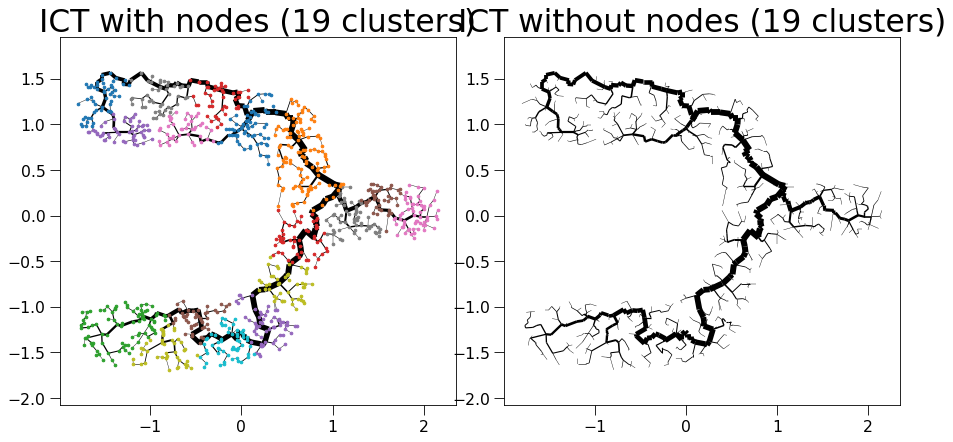

sklearn is done: 0.1118922233581543
My own part is done: 0.0009765625


  0%|          | 0/20 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/451 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/451 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 451 -> 402
update Arr 402 -> 355
update Arr 355 -> 315
update Arr 315 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 200
update Arr 200 -> 176
update Arr 176 -> 156
update Arr 156 -> 132
update Arr 132 -> 119
update Arr 119 -> 107
update Arr 107 -> 97
update Arr 97 -> 85
update Arr 85 -> 76
update Arr 76 -> 72
update Arr 72 -> 69
update Arr 69 -> 67
update Arr 67 -> 66
Final k: 11


create edgeId array:   0%|          | 0/378 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/378 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 378 -> 333
update Arr 333 -> 286
update Arr 286 -> 258
update Arr 258 -> 231
update Arr 231 -> 208
update Arr 208 -> 188
update Arr 188 -> 168
update Arr 168 -> 148
update Arr 148 -> 130
update Arr 130 -> 117
update Arr 117 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 69
update Arr 69 -> 63
update Arr 63 -> 61
update Arr 61 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 276 -> 239
update Arr 239 -> 205
update Arr 205 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 131
update Arr 131 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 79
update Arr 79 -> 68
update Arr 68 -> 60
update Arr 60 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 270 -> 231
update Arr 231 -> 192
update Arr 192 -> 172
update Arr 172 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 113
update Arr 113 -> 101
update Arr 101 -> 86
update Arr 86 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 44
update Arr 44 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
update Arr 40 -> 40
Final k: 11


create edgeId array:   0%|          | 0/383 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/383 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 383 -> 343
update Arr 343 -> 301
update Arr 301 -> 260
update Arr 260 -> 235
update Arr 235 -> 210
update Arr 210 -> 188
update Arr 188 -> 168
update Arr 168 -> 146
update Arr 146 -> 127
update Arr 127 -> 113
update Arr 113 -> 102
update Arr 102 -> 85
update Arr 85 -> 71
update Arr 71 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/288 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/288 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 288 -> 248
update Arr 248 -> 220
update Arr 220 -> 198
update Arr 198 -> 174
update Arr 174 -> 157
update Arr 157 -> 132
update Arr 132 -> 116
update Arr 116 -> 105
update Arr 105 -> 88
update Arr 88 -> 78
update Arr 78 -> 64
update Arr 64 -> 58
update Arr 58 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 236 -> 201
update Arr 201 -> 174
update Arr 174 -> 151
update Arr 151 -> 137
update Arr 137 -> 120
update Arr 120 -> 105
update Arr 105 -> 93
update Arr 93 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
Final k: 11


create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 300 -> 258
update Arr 258 -> 230
update Arr 230 -> 206
update Arr 206 -> 187
update Arr 187 -> 169
update Arr 169 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 108
update Arr 108 -> 95
update Arr 95 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 44
update Arr 44 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/365 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/365 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 365 -> 328
update Arr 328 -> 283
update Arr 283 -> 255
update Arr 255 -> 231
update Arr 231 -> 206
update Arr 206 -> 180
update Arr 180 -> 162
update Arr 162 -> 146
update Arr 146 -> 123
update Arr 123 -> 108
update Arr 108 -> 95
update Arr 95 -> 86
update Arr 86 -> 76
update Arr 76 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 261 -> 221
update Arr 221 -> 196
update Arr 196 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 126
update Arr 126 -> 110
update Arr 110 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/531 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/531 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 531 -> 482
update Arr 482 -> 426
update Arr 426 -> 385
update Arr 385 -> 345
update Arr 345 -> 310
update Arr 310 -> 278
update Arr 278 -> 245
update Arr 245 -> 218
update Arr 218 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 86
update Arr 86 -> 84
update Arr 84 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 237
update Arr 237 -> 212
update Arr 212 -> 190
update Arr 190 -> 172
update Arr 172 -> 151
update Arr 151 -> 131
update Arr 131 -> 116
update Arr 116 -> 105
update Arr 105 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 59
update Arr 59 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/331 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/331 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 331 -> 288
update Arr 288 -> 258
update Arr 258 -> 233
update Arr 233 -> 211
update Arr 211 -> 188
update Arr 188 -> 170
update Arr 170 -> 146
update Arr 146 -> 131
update Arr 131 -> 110
update Arr 110 -> 99
update Arr 99 -> 85
update Arr 85 -> 69
update Arr 69 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/372 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/372 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 372 -> 323
update Arr 323 -> 286
update Arr 286 -> 240
update Arr 240 -> 210
update Arr 210 -> 177
update Arr 177 -> 154
update Arr 154 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 96
update Arr 96 -> 85
update Arr 85 -> 75
update Arr 75 -> 64
update Arr 64 -> 61
update Arr 61 -> 58
update Arr 58 -> 56
update Arr 56 -> 55
Final k: 11


create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 410 -> 371
update Arr 371 -> 318
update Arr 318 -> 288
update Arr 288 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 167
update Arr 167 -> 148
update Arr 148 -> 132
update Arr 132 -> 116
update Arr 116 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 247 -> 222
update Arr 222 -> 197
update Arr 197 -> 178
update Arr 178 -> 160
update Arr 160 -> 142
update Arr 142 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 95
update Arr 95 -> 74
update Arr 74 -> 53
update Arr 53 -> 48
update Arr 48 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/492 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/492 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 492 -> 441
update Arr 441 -> 390
update Arr 390 -> 347
update Arr 347 -> 312
update Arr 312 -> 281
update Arr 281 -> 254
update Arr 254 -> 226
update Arr 226 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 144
update Arr 144 -> 130
update Arr 130 -> 117
update Arr 117 -> 97
update Arr 97 -> 87
update Arr 87 -> 80
update Arr 80 -> 77
update Arr 77 -> 74
update Arr 74 -> 72
update Arr 72 -> 71
Final k: 11


create edgeId array:   0%|          | 0/311 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/311 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 311 -> 276
update Arr 276 -> 239
update Arr 239 -> 213
update Arr 213 -> 192
update Arr 192 -> 169
update Arr 169 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 104
update Arr 104 -> 91
update Arr 91 -> 79
update Arr 79 -> 69
update Arr 69 -> 56
update Arr 56 -> 54
update Arr 54 -> 51
update Arr 51 -> 48
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 293 -> 252
update Arr 252 -> 215
update Arr 215 -> 195
update Arr 195 -> 172
update Arr 172 -> 145
update Arr 145 -> 127
update Arr 127 -> 112
update Arr 112 -> 97
update Arr 97 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 52
update Arr 52 -> 48
update Arr 48 -> 43
update Arr 43 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 160
update Arr 160 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 95
update Arr 95 -> 82
update Arr 82 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27


Patching the components together:   0%|          | 0/20 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1043 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1043 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1043 -> 1009
added 278 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 498 edges early


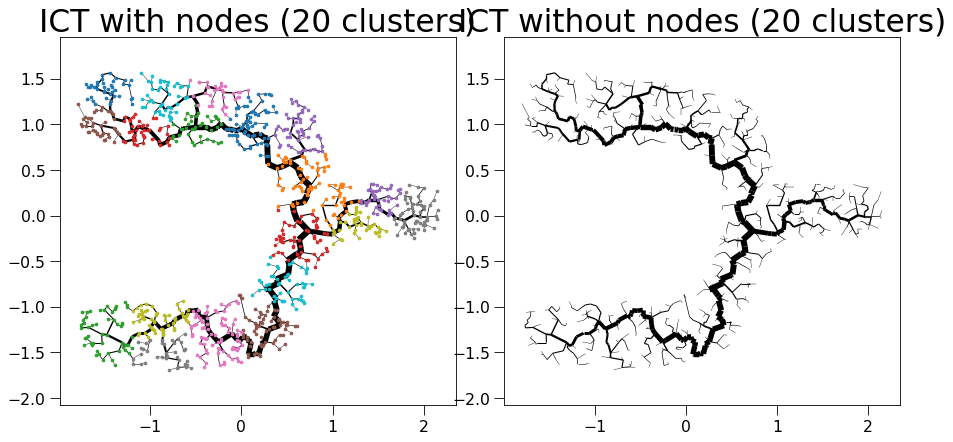

sklearn is done: 0.11351203918457031
My own part is done: 0.0011658668518066406


  0%|          | 0/21 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 476 -> 427
update Arr 427 -> 386
update Arr 386 -> 350
update Arr 350 -> 317
update Arr 317 -> 278
update Arr 278 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 186
update Arr 186 -> 169
update Arr 169 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 107
update Arr 107 -> 97
update Arr 97 -> 85
update Arr 85 -> 75
update Arr 75 -> 73
update Arr 73 -> 69
update Arr 69 -> 68
update Arr 68 -> 67
Final k: 11


create edgeId array:   0%|          | 0/387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 387 -> 338
update Arr 338 -> 304
update Arr 304 -> 274
update Arr 274 -> 249
update Arr 249 -> 224
update Arr 224 -> 199
update Arr 199 -> 175
update Arr 175 -> 158
update Arr 158 -> 140
update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 81
update Arr 81 -> 68
update Arr 68 -> 66
update Arr 66 -> 62
update Arr 62 -> 58
update Arr 58 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/439 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/439 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 439 -> 398
update Arr 398 -> 354
update Arr 354 -> 321
update Arr 321 -> 291
update Arr 291 -> 263
update Arr 263 -> 234
update Arr 234 -> 212
update Arr 212 -> 185
update Arr 185 -> 166
update Arr 166 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 101
update Arr 101 -> 86
update Arr 86 -> 76
update Arr 76 -> 74
update Arr 74 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/316 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/316 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 316 -> 278
update Arr 278 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 179
update Arr 179 -> 159
update Arr 159 -> 141
update Arr 141 -> 127
update Arr 127 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 74
update Arr 74 -> 65
update Arr 65 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 247 -> 215
update Arr 215 -> 192
update Arr 192 -> 173
update Arr 173 -> 154
update Arr 154 -> 136
update Arr 136 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 65
update Arr 65 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 274 -> 238
update Arr 238 -> 216
update Arr 216 -> 194
update Arr 194 -> 176
update Arr 176 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 59
update Arr 59 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/331 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/331 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 331 -> 294
update Arr 294 -> 265
update Arr 265 -> 233
update Arr 233 -> 204
update Arr 204 -> 182
update Arr 182 -> 161
update Arr 161 -> 143
update Arr 143 -> 127
update Arr 127 -> 115
update Arr 115 -> 102
update Arr 102 -> 84
update Arr 84 -> 73
update Arr 73 -> 65
update Arr 65 -> 60
update Arr 60 -> 56
update Arr 56 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 236
update Arr 236 -> 202
update Arr 202 -> 181
update Arr 181 -> 162
update Arr 162 -> 146
update Arr 146 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/451 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/451 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 451 -> 409
update Arr 409 -> 369
update Arr 369 -> 316
update Arr 316 -> 284
update Arr 284 -> 254
update Arr 254 -> 228
update Arr 228 -> 200
update Arr 200 -> 174
update Arr 174 -> 156
update Arr 156 -> 138
update Arr 138 -> 124
update Arr 124 -> 101
update Arr 101 -> 83
update Arr 83 -> 75
update Arr 75 -> 74
update Arr 74 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
Final k: 11


create edgeId array:   0%|          | 0/358 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/358 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 358 -> 319
update Arr 319 -> 267
update Arr 267 -> 235
update Arr 235 -> 212
update Arr 212 -> 186
update Arr 186 -> 167
update Arr 167 -> 150
update Arr 150 -> 133
update Arr 133 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 80
update Arr 80 -> 69
update Arr 69 -> 60
update Arr 60 -> 57
update Arr 57 -> 56
update Arr 56 -> 56
update Arr 56 -> 54
update Arr 54 -> 53
Final k: 11


create edgeId array:   0%|          | 0/334 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/334 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 334 -> 289
update Arr 289 -> 247
update Arr 247 -> 217
update Arr 217 -> 191
update Arr 191 -> 172
update Arr 172 -> 153
update Arr 153 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 93
update Arr 93 -> 71
update Arr 71 -> 61
update Arr 61 -> 57
update Arr 57 -> 53
update Arr 53 -> 48
update Arr 48 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 294 -> 266
update Arr 266 -> 228
update Arr 228 -> 204
update Arr 204 -> 185
update Arr 185 -> 164
update Arr 164 -> 145
update Arr 145 -> 130
update Arr 130 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 72
update Arr 72 -> 64
update Arr 64 -> 54
update Arr 54 -> 51
update Arr 51 -> 47
update Arr 47 -> 42
update Arr 42 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/248 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/248 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 248 -> 225
update Arr 225 -> 202
update Arr 202 -> 182
update Arr 182 -> 164
update Arr 164 -> 146
update Arr 146 -> 128
update Arr 128 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 76
update Arr 76 -> 69
update Arr 69 -> 61
update Arr 61 -> 50
update Arr 50 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 224
update Arr 224 -> 200
update Arr 200 -> 173
update Arr 173 -> 150
update Arr 150 -> 133
update Arr 133 -> 110
update Arr 110 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/317 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/317 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 317 -> 279
update Arr 279 -> 240
update Arr 240 -> 217
update Arr 217 -> 196
update Arr 196 -> 178
update Arr 178 -> 157
update Arr 157 -> 139
update Arr 139 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 85
update Arr 85 -> 71
update Arr 71 -> 58
update Arr 58 -> 56
update Arr 56 -> 53
update Arr 53 -> 50
Final k: 11


create edgeId array:   0%|          | 0/344 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/344 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 344 -> 306
update Arr 306 -> 264
update Arr 264 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 128
update Arr 128 -> 111
update Arr 111 -> 100
update Arr 100 -> 90
update Arr 90 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 56
update Arr 56 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/306 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/306 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 306 -> 266
update Arr 266 -> 234
update Arr 234 -> 207
update Arr 207 -> 187
update Arr 187 -> 169
update Arr 169 -> 149
update Arr 149 -> 133
update Arr 133 -> 117
update Arr 117 -> 104
update Arr 104 -> 85
update Arr 85 -> 66
update Arr 66 -> 56
update Arr 56 -> 53
update Arr 53 -> 48
update Arr 48 -> 45
update Arr 45 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 263 -> 238
update Arr 238 -> 202
update Arr 202 -> 183
update Arr 183 -> 165
update Arr 165 -> 148
update Arr 148 -> 132
update Arr 132 -> 115
update Arr 115 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 67
update Arr 67 -> 60
update Arr 60 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 223 -> 201
update Arr 201 -> 180
update Arr 180 -> 152
update Arr 152 -> 135
update Arr 135 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 251 -> 220
update Arr 220 -> 199
update Arr 199 -> 171
update Arr 171 -> 151
update Arr 151 -> 133
update Arr 133 -> 117
update Arr 117 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 250
update Arr 250 -> 205
update Arr 205 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 134
update Arr 134 -> 113
update Arr 113 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42


Patching the components together:   0%|          | 0/21 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1033 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1033 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1033 -> 1009
added 278 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1003
added 3 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 2 edges early
added 486 edges early


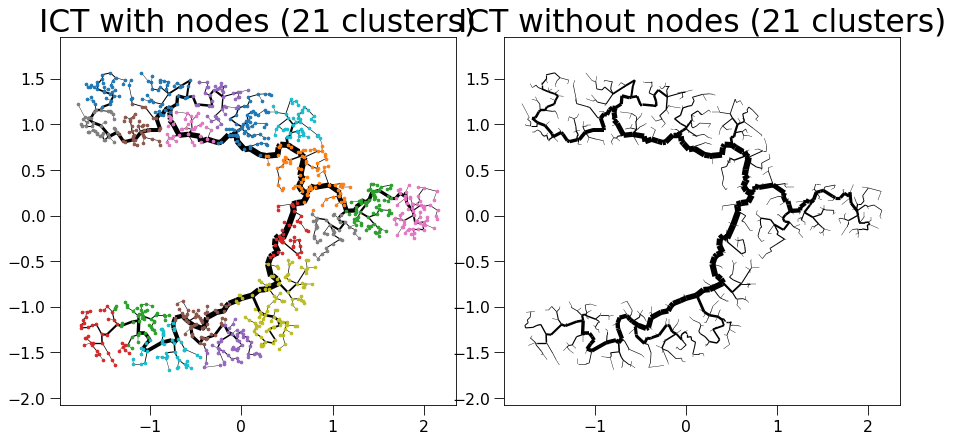

sklearn is done: 0.1367647647857666
My own part is done: 0.00141143798828125


  0%|          | 0/22 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/347 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/347 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 347 -> 308
update Arr 308 -> 277
update Arr 277 -> 245
update Arr 245 -> 220
update Arr 220 -> 197
update Arr 197 -> 177
update Arr 177 -> 151
update Arr 151 -> 133
update Arr 133 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 63
update Arr 63 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/304 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/304 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 304 -> 270
update Arr 270 -> 231
update Arr 231 -> 207
update Arr 207 -> 187
update Arr 187 -> 166
update Arr 166 -> 150
update Arr 150 -> 134
update Arr 134 -> 119
update Arr 119 -> 106
update Arr 106 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 286 -> 252
update Arr 252 -> 217
update Arr 217 -> 193
update Arr 193 -> 174
update Arr 174 -> 158
update Arr 158 -> 141
update Arr 141 -> 125
update Arr 125 -> 108
update Arr 108 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 60
update Arr 60 -> 49
update Arr 49 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 268 -> 238
update Arr 238 -> 213
update Arr 213 -> 188
update Arr 188 -> 169
update Arr 169 -> 146
update Arr 146 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/418 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/418 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 418 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 268
update Arr 268 -> 237
update Arr 237 -> 214
update Arr 214 -> 190
update Arr 190 -> 167
update Arr 167 -> 148
update Arr 148 -> 128
update Arr 128 -> 112
update Arr 112 -> 99
update Arr 99 -> 85
update Arr 85 -> 74
update Arr 74 -> 71
update Arr 71 -> 70
update Arr 70 -> 67
update Arr 67 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
Final k: 11


create edgeId array:   0%|          | 0/315 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/315 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 315 -> 270
update Arr 270 -> 236
update Arr 236 -> 211
update Arr 211 -> 188
update Arr 188 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 118
update Arr 118 -> 101
update Arr 101 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/284 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/284 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 284 -> 250
update Arr 250 -> 205
update Arr 205 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 134
update Arr 134 -> 113
update Arr 113 -> 101
update Arr 101 -> 91
update Arr 91 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/273 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/273 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 273 -> 246
update Arr 246 -> 214
update Arr 214 -> 189
update Arr 189 -> 170
update Arr 170 -> 143
update Arr 143 -> 126
update Arr 126 -> 114
update Arr 114 -> 100
update Arr 100 -> 84
update Arr 84 -> 74
update Arr 74 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 41
Final k: 11


create edgeId array:   0%|          | 0/411 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/411 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 411 -> 356
update Arr 356 -> 316
update Arr 316 -> 282
update Arr 282 -> 256
update Arr 256 -> 223
update Arr 223 -> 201
update Arr 201 -> 173
update Arr 173 -> 154
update Arr 154 -> 135
update Arr 135 -> 122
update Arr 122 -> 102
update Arr 102 -> 85
update Arr 85 -> 72
update Arr 72 -> 70
update Arr 70 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/278 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/278 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 278 -> 251
update Arr 251 -> 213
update Arr 213 -> 193
update Arr 193 -> 170
update Arr 170 -> 139
update Arr 139 -> 119
update Arr 119 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/287 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/287 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 287 -> 260
update Arr 260 -> 227
update Arr 227 -> 197
update Arr 197 -> 175
update Arr 175 -> 152
update Arr 152 -> 132
update Arr 132 -> 115
update Arr 115 -> 103
update Arr 103 -> 89
update Arr 89 -> 80
update Arr 80 -> 64
update Arr 64 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
update Arr 51 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 397 -> 353
update Arr 353 -> 291
update Arr 291 -> 261
update Arr 261 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 168
update Arr 168 -> 150
update Arr 150 -> 135
update Arr 135 -> 120
update Arr 120 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 267 -> 230
update Arr 230 -> 194
update Arr 194 -> 173
update Arr 173 -> 155
update Arr 155 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 484 -> 429
update Arr 429 -> 389
update Arr 389 -> 347
update Arr 347 -> 313
update Arr 313 -> 282
update Arr 282 -> 254
update Arr 254 -> 224
update Arr 224 -> 201
update Arr 201 -> 182
update Arr 182 -> 162
update Arr 162 -> 145
update Arr 145 -> 125
update Arr 125 -> 111
update Arr 111 -> 95
update Arr 95 -> 83
update Arr 83 -> 78
update Arr 78 -> 73
update Arr 73 -> 71
update Arr 71 -> 69
update Arr 69 -> 68
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 238 -> 206
update Arr 206 -> 180
update Arr 180 -> 163
update Arr 163 -> 146
update Arr 146 -> 131
update Arr 131 -> 114
update Arr 114 -> 101
update Arr 101 -> 88
update Arr 88 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 45
update Arr 45 -> 43
update Arr 43 -> 40
update Arr 40 -> 37
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 217 -> 185
update Arr 185 -> 165
update Arr 165 -> 149
update Arr 149 -> 132
update Arr 132 -> 113
update Arr 113 -> 101
update Arr 101 -> 81
update Arr 81 -> 70
update Arr 70 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 255 -> 225
update Arr 225 -> 204
update Arr 204 -> 176
update Arr 176 -> 156
update Arr 156 -> 138
update Arr 138 -> 122
update Arr 122 -> 107
update Arr 107 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 45
update Arr 45 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/394 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/394 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 394 -> 354
update Arr 354 -> 314
update Arr 314 -> 284
update Arr 284 -> 252
update Arr 252 -> 229
update Arr 229 -> 201
update Arr 201 -> 181
update Arr 181 -> 164
update Arr 164 -> 147
update Arr 147 -> 130
update Arr 130 -> 115
update Arr 115 -> 100
update Arr 100 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
update Arr 59 -> 59
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 224
update Arr 224 -> 200
update Arr 200 -> 173
update Arr 173 -> 150
update Arr 150 -> 133
update Arr 133 -> 110
update Arr 110 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 253 -> 220
update Arr 220 -> 194
update Arr 194 -> 174
update Arr 174 -> 155
update Arr 155 -> 137
update Arr 137 -> 117
update Arr 117 -> 100
update Arr 100 -> 87
update Arr 87 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 129
update Arr 129 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 291 -> 254
update Arr 254 -> 230
update Arr 230 -> 207
update Arr 207 -> 183
update Arr 183 -> 163
update Arr 163 -> 141
update Arr 141 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43


Patching the components together:   0%|          | 0/22 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1038 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1038 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1038 -> 1009
added 265 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 494 edges early


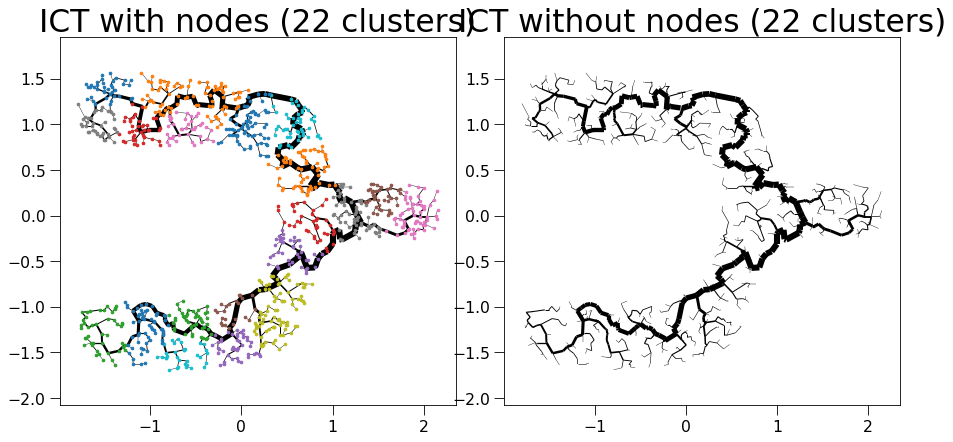

sklearn is done: 0.13227033615112305
My own part is done: 0.0006816387176513672


  0%|          | 0/23 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 453 -> 405
update Arr 405 -> 368
update Arr 368 -> 334
update Arr 334 -> 299
update Arr 299 -> 270
update Arr 270 -> 244
update Arr 244 -> 220
update Arr 220 -> 193
update Arr 193 -> 169
update Arr 169 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 106
update Arr 106 -> 91
update Arr 91 -> 81
update Arr 81 -> 74
update Arr 74 -> 71
update Arr 71 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
Final k: 11


create edgeId array:   0%|          | 0/331 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/331 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 331 -> 294
update Arr 294 -> 264
update Arr 264 -> 231
update Arr 231 -> 206
update Arr 206 -> 186
update Arr 186 -> 168
update Arr 168 -> 147
update Arr 147 -> 133
update Arr 133 -> 118
update Arr 118 -> 102
update Arr 102 -> 91
update Arr 91 -> 76
update Arr 76 -> 65
update Arr 65 -> 56
update Arr 56 -> 53
update Arr 53 -> 52
update Arr 52 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 254 -> 229
update Arr 229 -> 207
update Arr 207 -> 178
update Arr 178 -> 161
update Arr 161 -> 141
update Arr 141 -> 124
update Arr 124 -> 107
update Arr 107 -> 93
update Arr 93 -> 75
update Arr 75 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/281 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/281 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 281 -> 245
update Arr 245 -> 213
update Arr 213 -> 192
update Arr 192 -> 173
update Arr 173 -> 157
update Arr 157 -> 138
update Arr 138 -> 123
update Arr 123 -> 109
update Arr 109 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 47
update Arr 47 -> 46
update Arr 46 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 410 -> 371
update Arr 371 -> 318
update Arr 318 -> 288
update Arr 288 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 167
update Arr 167 -> 148
update Arr 148 -> 132
update Arr 132 -> 116
update Arr 116 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 233 -> 194
update Arr 194 -> 165
update Arr 165 -> 147
update Arr 147 -> 126
update Arr 126 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 55
update Arr 55 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 262 -> 237
update Arr 237 -> 201
update Arr 201 -> 175
update Arr 175 -> 159
update Arr 159 -> 137
update Arr 137 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 75
update Arr 75 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 46
update Arr 46 -> 43
update Arr 43 -> 40
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 235 -> 201
update Arr 201 -> 179
update Arr 179 -> 159
update Arr 159 -> 137
update Arr 137 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 74
update Arr 74 -> 66
update Arr 66 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
Final k: 11


create edgeId array:   0%|          | 0/317 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/317 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 317 -> 277
update Arr 277 -> 248
update Arr 248 -> 221
update Arr 221 -> 190
update Arr 190 -> 168
update Arr 168 -> 146
update Arr 146 -> 127
update Arr 127 -> 115
update Arr 115 -> 102
update Arr 102 -> 88
update Arr 88 -> 76
update Arr 76 -> 65
update Arr 65 -> 55
update Arr 55 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/316 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/316 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 316 -> 273
update Arr 273 -> 245
update Arr 245 -> 220
update Arr 220 -> 194
update Arr 194 -> 174
update Arr 174 -> 156
update Arr 156 -> 138
update Arr 138 -> 125
update Arr 125 -> 110
update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 73
update Arr 73 -> 63
update Arr 63 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 236 -> 208
update Arr 208 -> 185
update Arr 185 -> 165
update Arr 165 -> 147
update Arr 147 -> 132
update Arr 132 -> 117
update Arr 117 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 56
update Arr 56 -> 47
update Arr 47 -> 45
update Arr 45 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/351 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/351 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 351 -> 305
update Arr 305 -> 268
update Arr 268 -> 243
update Arr 243 -> 217
update Arr 217 -> 195
update Arr 195 -> 174
update Arr 174 -> 155
update Arr 155 -> 132
update Arr 132 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 77
update Arr 77 -> 66
update Arr 66 -> 61
update Arr 61 -> 57
update Arr 57 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
Final k: 11


create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 294 -> 254
update Arr 254 -> 228
update Arr 228 -> 207
update Arr 207 -> 186
update Arr 186 -> 166
update Arr 166 -> 148
update Arr 148 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 91
update Arr 91 -> 77
update Arr 77 -> 65
update Arr 65 -> 55
update Arr 55 -> 50
update Arr 50 -> 48
update Arr 48 -> 45
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 293 -> 252
update Arr 252 -> 215
update Arr 215 -> 195
update Arr 195 -> 172
update Arr 172 -> 145
update Arr 145 -> 127
update Arr 127 -> 112
update Arr 112 -> 97
update Arr 97 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 52
update Arr 52 -> 48
update Arr 48 -> 43
update Arr 43 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 252 -> 228
update Arr 228 -> 194
update Arr 194 -> 176
update Arr 176 -> 156
update Arr 156 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 87
update Arr 87 -> 79
update Arr 79 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 38
update Arr 38 -> 36
Final k: 11


create edgeId array:   0%|          | 0/271 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/271 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 271 -> 243
update Arr 243 -> 198
update Arr 198 -> 173
update Arr 173 -> 154
update Arr 154 -> 137
update Arr 137 -> 124
update Arr 124 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 73
update Arr 73 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 276 -> 249
update Arr 249 -> 209
update Arr 209 -> 188
update Arr 188 -> 165
update Arr 165 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 61
update Arr 61 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/332 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/332 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 332 -> 287
update Arr 287 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 175
update Arr 175 -> 156
update Arr 156 -> 133
update Arr 133 -> 120
update Arr 120 -> 108
update Arr 108 -> 96
update Arr 96 -> 85
update Arr 85 -> 73
update Arr 73 -> 62
update Arr 62 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 387 -> 338
update Arr 338 -> 304
update Arr 304 -> 274
update Arr 274 -> 249
update Arr 249 -> 224
update Arr 224 -> 199
update Arr 199 -> 175
update Arr 175 -> 158
update Arr 158 -> 140
update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 81
update Arr 81 -> 68
update Arr 68 -> 66
update Arr 66 -> 62
update Arr 62 -> 58
update Arr 58 -> 57
update Arr 57 -> 56
Final k: 11


create edgeId array:   0%|          | 0/307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 307 -> 265
update Arr 265 -> 233
update Arr 233 -> 209
update Arr 209 -> 186
update Arr 186 -> 169
update Arr 169 -> 146
update Arr 146 -> 130
update Arr 130 -> 118
update Arr 118 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 54
update Arr 54 -> 48
update Arr 48 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 218 -> 198
update Arr 198 -> 176
update Arr 176 -> 159
update Arr 159 -> 134
update Arr 134 -> 119
update Arr 119 -> 103
update Arr 103 -> 88
update Arr 88 -> 78
update Arr 78 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 143
update Arr 143 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/257 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/257 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 257 -> 224
update Arr 224 -> 201
update Arr 201 -> 182
update Arr 182 -> 158
update Arr 158 -> 142
update Arr 142 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 41
update Arr 41 -> 39
update Arr 39 -> 38


Patching the components together:   0%|          | 0/23 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1046 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1046 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1046 -> 1008
added 275 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 999
added 3 edges early
added 479 edges early


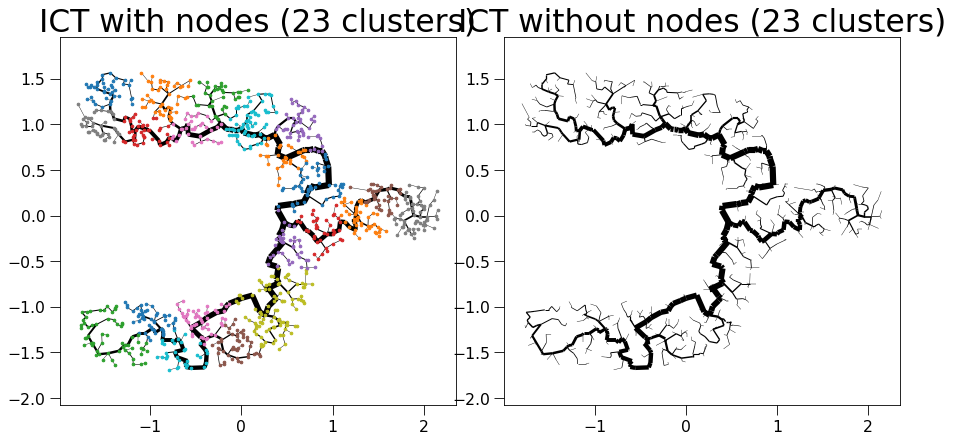

sklearn is done: 0.14685773849487305
My own part is done: 0.0011746883392333984


  0%|          | 0/24 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/304 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/304 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 304 -> 271
update Arr 271 -> 235
update Arr 235 -> 206
update Arr 206 -> 181
update Arr 181 -> 162
update Arr 162 -> 137
update Arr 137 -> 120
update Arr 120 -> 105
update Arr 105 -> 87
update Arr 87 -> 78
update Arr 78 -> 69
update Arr 69 -> 58
update Arr 58 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/310 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/310 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 310 -> 268
update Arr 268 -> 240
update Arr 240 -> 216
update Arr 216 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 143
update Arr 143 -> 123
update Arr 123 -> 106
update Arr 106 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 62
update Arr 62 -> 54
update Arr 54 -> 51
update Arr 51 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 243 -> 209
update Arr 209 -> 185
update Arr 185 -> 167
update Arr 167 -> 150
update Arr 150 -> 134
update Arr 134 -> 117
update Arr 117 -> 100
update Arr 100 -> 89
update Arr 89 -> 75
update Arr 75 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 234 -> 210
update Arr 210 -> 177
update Arr 177 -> 160
update Arr 160 -> 143
update Arr 143 -> 125
update Arr 125 -> 108
update Arr 108 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
Final k: 11


create edgeId array:   0%|          | 0/357 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/357 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 357 -> 309
update Arr 309 -> 271
update Arr 271 -> 243
update Arr 243 -> 217
update Arr 217 -> 197
update Arr 197 -> 178
update Arr 178 -> 161
update Arr 161 -> 145
update Arr 145 -> 131
update Arr 131 -> 117
update Arr 117 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 66
update Arr 66 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
Final k: 11


create edgeId array:   0%|          | 0/347 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/347 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 347 -> 313
update Arr 313 -> 265
update Arr 265 -> 235
update Arr 235 -> 207
update Arr 207 -> 185
update Arr 185 -> 166
update Arr 166 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 105
update Arr 105 -> 93
update Arr 93 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 56
update Arr 56 -> 55
update Arr 55 -> 53
update Arr 53 -> 52
update Arr 52 -> 52
Final k: 11


create edgeId array:   0%|          | 0/288 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/288 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 288 -> 243
update Arr 243 -> 210
update Arr 210 -> 187
update Arr 187 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 93
update Arr 93 -> 69
update Arr 69 -> 54
update Arr 54 -> 50
update Arr 50 -> 48
update Arr 48 -> 44
update Arr 44 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 50
update Arr 50 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/279 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/279 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 279 -> 243
update Arr 243 -> 212
update Arr 212 -> 189
update Arr 189 -> 169
update Arr 169 -> 151
update Arr 151 -> 128
update Arr 128 -> 106
update Arr 106 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 255 -> 225
update Arr 225 -> 204
update Arr 204 -> 176
update Arr 176 -> 156
update Arr 156 -> 138
update Arr 138 -> 122
update Arr 122 -> 107
update Arr 107 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 45
update Arr 45 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 230 -> 193
update Arr 193 -> 174
update Arr 174 -> 155
update Arr 155 -> 137
update Arr 137 -> 121
update Arr 121 -> 105
update Arr 105 -> 87
update Arr 87 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 40
update Arr 40 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/292 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/292 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 292 -> 261
update Arr 261 -> 235
update Arr 235 -> 206
update Arr 206 -> 183
update Arr 183 -> 166
update Arr 166 -> 146
update Arr 146 -> 118
update Arr 118 -> 106
update Arr 106 -> 95
update Arr 95 -> 75
update Arr 75 -> 65
update Arr 65 -> 58
update Arr 58 -> 50
update Arr 50 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 410 -> 371
update Arr 371 -> 318
update Arr 318 -> 288
update Arr 288 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 167
update Arr 167 -> 148
update Arr 148 -> 132
update Arr 132 -> 116
update Arr 116 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 233 -> 194
update Arr 194 -> 165
update Arr 165 -> 147
update Arr 147 -> 126
update Arr 126 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 55
update Arr 55 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/337 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/337 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 337 -> 297
update Arr 297 -> 258
update Arr 258 -> 234
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 121
update Arr 121 -> 104
update Arr 104 -> 86
update Arr 86 -> 78
update Arr 78 -> 68
update Arr 68 -> 60
update Arr 60 -> 56
update Arr 56 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 295 -> 256
update Arr 256 -> 222
update Arr 222 -> 198
update Arr 198 -> 177
update Arr 177 -> 160
update Arr 160 -> 138
update Arr 138 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 82
update Arr 82 -> 70
update Arr 70 -> 62
update Arr 62 -> 56
update Arr 56 -> 50
update Arr 50 -> 45
update Arr 45 -> 43
update Arr 43 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 224
update Arr 224 -> 200
update Arr 200 -> 173
update Arr 173 -> 150
update Arr 150 -> 133
update Arr 133 -> 110
update Arr 110 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/343 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/343 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 343 -> 305
update Arr 305 -> 264
update Arr 264 -> 239
update Arr 239 -> 210
update Arr 210 -> 183
update Arr 183 -> 165
update Arr 165 -> 145
update Arr 145 -> 127
update Arr 127 -> 110
update Arr 110 -> 98
update Arr 98 -> 86
update Arr 86 -> 72
update Arr 72 -> 65
update Arr 65 -> 61
update Arr 61 -> 61
update Arr 61 -> 57
update Arr 57 -> 52
update Arr 52 -> 52
update Arr 52 -> 51
Final k: 11


create edgeId array:   0%|          | 0/355 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/355 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 355 -> 318
update Arr 318 -> 285
update Arr 285 -> 258
update Arr 258 -> 223
update Arr 223 -> 201
update Arr 201 -> 180
update Arr 180 -> 159
update Arr 159 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 280 -> 240
update Arr 240 -> 218
update Arr 218 -> 196
update Arr 196 -> 175
update Arr 175 -> 154
update Arr 154 -> 139
update Arr 139 -> 120
update Arr 120 -> 108
update Arr 108 -> 96
update Arr 96 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 56
update Arr 56 -> 51
update Arr 51 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 267 -> 230
update Arr 230 -> 194
update Arr 194 -> 173
update Arr 173 -> 155
update Arr 155 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 172 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 105
update Arr 105 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 135
update Arr 135 -> 113
update Arr 113 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 61
update Arr 61 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 223 -> 187
update Arr 187 -> 157
update Arr 157 -> 138
update Arr 138 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33


Patching the components together:   0%|          | 0/24 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1046 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1046 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1046 -> 1008
added 266 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1005
added 3 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1001
added 4 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update

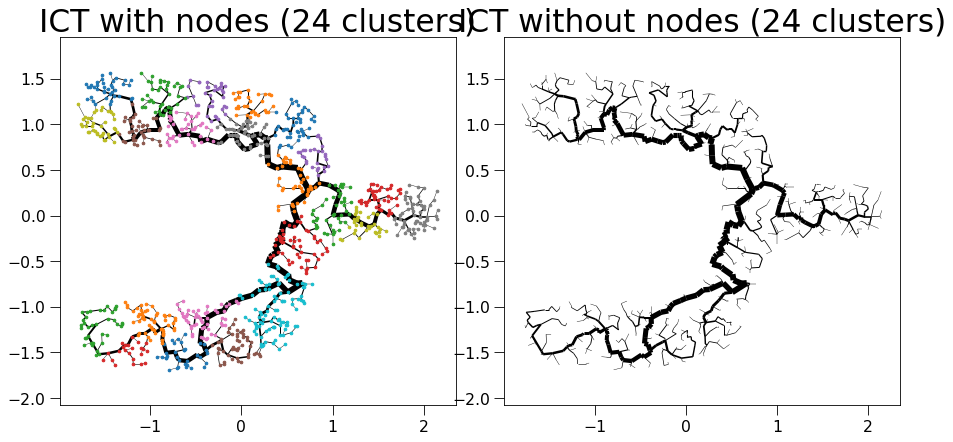

sklearn is done: 0.13913989067077637
My own part is done: 0.0011425018310546875


  0%|          | 0/25 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/322 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/322 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/48 [00:00<?, ?it/s]

update Arr 322 -> 280
update Arr 280 -> 246
update Arr 246 -> 216
update Arr 216 -> 189
update Arr 189 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 119
update Arr 119 -> 102
update Arr 102 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 58
update Arr 58 -> 54
update Arr 54 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
Final k: 11


create edgeId array:   0%|          | 0/329 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/329 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 329 -> 288
update Arr 288 -> 258
update Arr 258 -> 226
update Arr 226 -> 204
update Arr 204 -> 185
update Arr 185 -> 166
update Arr 166 -> 149
update Arr 149 -> 131
update Arr 131 -> 115
update Arr 115 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 61
update Arr 61 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 267 -> 230
update Arr 230 -> 194
update Arr 194 -> 173
update Arr 173 -> 155
update Arr 155 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/309 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/309 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 309 -> 274
update Arr 274 -> 239
update Arr 239 -> 212
update Arr 212 -> 189
update Arr 189 -> 167
update Arr 167 -> 142
update Arr 142 -> 125
update Arr 125 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 70
update Arr 70 -> 60
update Arr 60 -> 55
update Arr 55 -> 49
update Arr 49 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 253 -> 225
update Arr 225 -> 197
update Arr 197 -> 170
update Arr 170 -> 150
update Arr 150 -> 131
update Arr 131 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 70
update Arr 70 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/266 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/266 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 266 -> 235
update Arr 235 -> 206
update Arr 206 -> 187
update Arr 187 -> 158
update Arr 158 -> 143
update Arr 143 -> 126
update Arr 126 -> 111
update Arr 111 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 58
update Arr 58 -> 49
update Arr 49 -> 46
update Arr 46 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/349 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/349 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 349 -> 312
update Arr 312 -> 281
update Arr 281 -> 231
update Arr 231 -> 207
update Arr 207 -> 187
update Arr 187 -> 161
update Arr 161 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 91
update Arr 91 -> 79
update Arr 79 -> 65
update Arr 65 -> 56
update Arr 56 -> 54
update Arr 54 -> 52
update Arr 52 -> 50
update Arr 50 -> 49
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 233 -> 194
update Arr 194 -> 165
update Arr 165 -> 147
update Arr 147 -> 126
update Arr 126 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 55
update Arr 55 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 263 -> 232
update Arr 232 -> 194
update Arr 194 -> 176
update Arr 176 -> 150
update Arr 150 -> 133
update Arr 133 -> 120
update Arr 120 -> 105
update Arr 105 -> 95
update Arr 95 -> 84
update Arr 84 -> 75
update Arr 75 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 47
update Arr 47 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 319 -> 285
update Arr 285 -> 246
update Arr 246 -> 219
update Arr 219 -> 194
update Arr 194 -> 176
update Arr 176 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 111
update Arr 111 -> 94
update Arr 94 -> 83
update Arr 83 -> 71
update Arr 71 -> 60
update Arr 60 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/333 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/333 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 333 -> 293
update Arr 293 -> 257
update Arr 257 -> 222
update Arr 222 -> 196
update Arr 196 -> 178
update Arr 178 -> 157
update Arr 157 -> 141
update Arr 141 -> 124
update Arr 124 -> 108
update Arr 108 -> 97
update Arr 97 -> 84
update Arr 84 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 56
update Arr 56 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 291 -> 254
update Arr 254 -> 230
update Arr 230 -> 207
update Arr 207 -> 183
update Arr 183 -> 163
update Arr 163 -> 141
update Arr 141 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 253 -> 220
update Arr 220 -> 194
update Arr 194 -> 174
update Arr 174 -> 155
update Arr 155 -> 137
update Arr 137 -> 117
update Arr 117 -> 100
update Arr 100 -> 87
update Arr 87 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 194 -> 156
update Arr 156 -> 141
update Arr 141 -> 112
update Arr 112 -> 100
update Arr 100 -> 86
update Arr 86 -> 72
update Arr 72 -> 63
update Arr 63 -> 52
update Arr 52 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/387 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/387 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 387 -> 345
update Arr 345 -> 283
update Arr 283 -> 253
update Arr 253 -> 226
update Arr 226 -> 204
update Arr 204 -> 184
update Arr 184 -> 161
update Arr 161 -> 145
update Arr 145 -> 130
update Arr 130 -> 117
update Arr 117 -> 104
update Arr 104 -> 92
update Arr 92 -> 78
update Arr 78 -> 69
update Arr 69 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 59
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 254 -> 227
update Arr 227 -> 192
update Arr 192 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 244 -> 205
update Arr 205 -> 182
update Arr 182 -> 160
update Arr 160 -> 142
update Arr 142 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 88
update Arr 88 -> 72
update Arr 72 -> 63
update Arr 63 -> 53
update Arr 53 -> 46
update Arr 46 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 150
update Arr 150 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 86
update Arr 86 -> 72
update Arr 72 -> 55
update Arr 55 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 249 -> 216
update Arr 216 -> 196
update Arr 196 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 118
update Arr 118 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 50
update Arr 50 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 135
update Arr 135 -> 113
update Arr 113 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 61
update Arr 61 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/372 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/372 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/54 [00:00<?, ?it/s]

update Arr 372 -> 327
update Arr 327 -> 281
update Arr 281 -> 253
update Arr 253 -> 229
update Arr 229 -> 207
update Arr 207 -> 187
update Arr 187 -> 158
update Arr 158 -> 142
update Arr 142 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 64
update Arr 64 -> 60
update Arr 60 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
Final k: 11


create edgeId array:   0%|          | 0/261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 261 -> 230
update Arr 230 -> 203
update Arr 203 -> 183
update Arr 183 -> 165
update Arr 165 -> 148
update Arr 148 -> 131
update Arr 131 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 75
update Arr 75 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 46
update Arr 46 -> 43
update Arr 43 -> 40
Final k: 11


create edgeId array:   0%|          | 0/209 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/209 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 209 -> 178
update Arr 178 -> 152
update Arr 152 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 94
update Arr 94 -> 83
update Arr 83 -> 72
update Arr 72 -> 61
update Arr 61 -> 49
update Arr 49 -> 41
update Arr 41 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 129
update Arr 129 -> 113
update Arr 113 -> 100
update Arr 100 -> 88
update Arr 88 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 50
update Arr 50 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30


Patching the components together:   0%|          | 0/25 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1043 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1043 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1043 -> 1008
added 268 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
added 3 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update

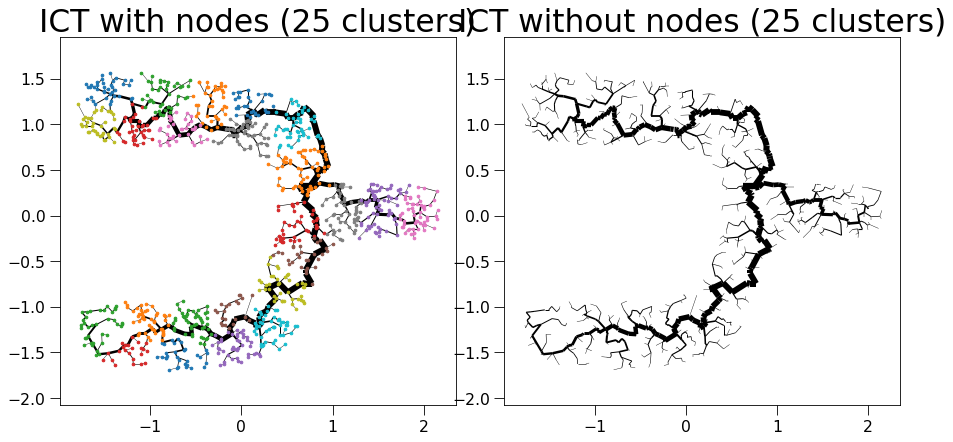

sklearn is done: 0.13940000534057617
My own part is done: 0.0012679100036621094


  0%|          | 0/26 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 244 -> 210
update Arr 210 -> 185
update Arr 185 -> 164
update Arr 164 -> 148
update Arr 148 -> 130
update Arr 130 -> 116
update Arr 116 -> 102
update Arr 102 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 293 -> 252
update Arr 252 -> 215
update Arr 215 -> 195
update Arr 195 -> 172
update Arr 172 -> 145
update Arr 145 -> 127
update Arr 127 -> 112
update Arr 112 -> 97
update Arr 97 -> 87
update Arr 87 -> 74
update Arr 74 -> 62
update Arr 62 -> 52
update Arr 52 -> 48
update Arr 48 -> 43
update Arr 43 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/278 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/278 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 278 -> 242
update Arr 242 -> 211
update Arr 211 -> 187
update Arr 187 -> 166
update Arr 166 -> 147
update Arr 147 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 47
update Arr 47 -> 45
update Arr 45 -> 43
update Arr 43 -> 41
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 286 -> 244
update Arr 244 -> 208
update Arr 208 -> 189
update Arr 189 -> 161
update Arr 161 -> 145
update Arr 145 -> 127
update Arr 127 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 234 -> 210
update Arr 210 -> 185
update Arr 185 -> 167
update Arr 167 -> 149
update Arr 149 -> 135
update Arr 135 -> 114
update Arr 114 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 69
update Arr 69 -> 59
update Arr 59 -> 48
update Arr 48 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 264 -> 239
update Arr 239 -> 213
update Arr 213 -> 186
update Arr 186 -> 164
update Arr 164 -> 145
update Arr 145 -> 128
update Arr 128 -> 112
update Arr 112 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 68
update Arr 68 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/281 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/281 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 281 -> 245
update Arr 245 -> 213
update Arr 213 -> 192
update Arr 192 -> 173
update Arr 173 -> 157
update Arr 157 -> 138
update Arr 138 -> 123
update Arr 123 -> 109
update Arr 109 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 47
update Arr 47 -> 46
update Arr 46 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/287 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/287 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 287 -> 246
update Arr 246 -> 221
update Arr 221 -> 197
update Arr 197 -> 175
update Arr 175 -> 158
update Arr 158 -> 134
update Arr 134 -> 121
update Arr 121 -> 106
update Arr 106 -> 95
update Arr 95 -> 79
update Arr 79 -> 65
update Arr 65 -> 59
update Arr 59 -> 52
update Arr 52 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 252 -> 227
update Arr 227 -> 198
update Arr 198 -> 177
update Arr 177 -> 154
update Arr 154 -> 139
update Arr 139 -> 123
update Arr 123 -> 111
update Arr 111 -> 98
update Arr 98 -> 79
update Arr 79 -> 62
update Arr 62 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
update Arr 37 -> 37
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 252 -> 209
update Arr 209 -> 185
update Arr 185 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 93
update Arr 93 -> 82
update Arr 82 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 291 -> 243
update Arr 243 -> 219
update Arr 219 -> 195
update Arr 195 -> 175
update Arr 175 -> 158
update Arr 158 -> 141
update Arr 141 -> 127
update Arr 127 -> 112
update Arr 112 -> 100
update Arr 100 -> 85
update Arr 85 -> 70
update Arr 70 -> 57
update Arr 57 -> 52
update Arr 52 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
Final k: 11


create edgeId array:   0%|          | 0/408 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/408 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 408 -> 360
update Arr 360 -> 311
update Arr 311 -> 281
update Arr 281 -> 253
update Arr 253 -> 223
update Arr 223 -> 201
update Arr 201 -> 182
update Arr 182 -> 164
update Arr 164 -> 144
update Arr 144 -> 130
update Arr 130 -> 117
update Arr 117 -> 104
update Arr 104 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 67
update Arr 67 -> 64
update Arr 64 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
Final k: 11


create edgeId array:   0%|          | 0/301 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/301 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 301 -> 272
update Arr 272 -> 244
update Arr 244 -> 219
update Arr 219 -> 196
update Arr 196 -> 176
update Arr 176 -> 159
update Arr 159 -> 138
update Arr 138 -> 119
update Arr 119 -> 107
update Arr 107 -> 90
update Arr 90 -> 80
update Arr 80 -> 66
update Arr 66 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/257 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/257 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 257 -> 224
update Arr 224 -> 201
update Arr 201 -> 182
update Arr 182 -> 158
update Arr 158 -> 142
update Arr 142 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/315 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/315 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 315 -> 270
update Arr 270 -> 236
update Arr 236 -> 211
update Arr 211 -> 188
update Arr 188 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 118
update Arr 118 -> 101
update Arr 101 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 270 -> 231
update Arr 231 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 136
update Arr 136 -> 120
update Arr 120 -> 98
update Arr 98 -> 88
update Arr 88 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 141
update Arr 141 -> 120
update Arr 120 -> 105
update Arr 105 -> 92
update Arr 92 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 31
update Arr 31 -> 30
update Arr 30 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 269 -> 243
update Arr 243 -> 219
update Arr 219 -> 199
update Arr 199 -> 172
update Arr 172 -> 151
update Arr 151 -> 131
update Arr 131 -> 116
update Arr 116 -> 105
update Arr 105 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 59
update Arr 59 -> 53
update Arr 53 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 143
update Arr 143 -> 122
update Arr 122 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 73
update Arr 73 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/204 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/204 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 204 -> 171
update Arr 171 -> 155
update Arr 155 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 79
update Arr 79 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 45
update Arr 45 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 269 -> 234
update Arr 234 -> 201
update Arr 201 -> 177
update Arr 177 -> 157
update Arr 157 -> 139
update Arr 139 -> 122
update Arr 122 -> 98
update Arr 98 -> 88
update Arr 88 -> 75
update Arr 75 -> 62
update Arr 62 -> 52
update Arr 52 -> 49
update Arr 49 -> 44
update Arr 44 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 242 -> 208
update Arr 208 -> 182
update Arr 182 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 113
update Arr 113 -> 98
update Arr 98 -> 86
update Arr 86 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/285 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/285 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 285 -> 247
update Arr 247 -> 210
update Arr 210 -> 188
update Arr 188 -> 166
update Arr 166 -> 140
update Arr 140 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 82
update Arr 82 -> 71
update Arr 71 -> 63
update Arr 63 -> 57
update Arr 57 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 129
update Arr 129 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/293 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/293 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 293 -> 260
update Arr 260 -> 234
update Arr 234 -> 211
update Arr 211 -> 186
update Arr 186 -> 169
update Arr 169 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 106
update Arr 106 -> 91
update Arr 91 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 55
update Arr 55 -> 50
update Arr 50 -> 47
update Arr 47 -> 46
update Arr 46 -> 45


Patching the components together:   0%|          | 0/26 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1050 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1050 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1050 -> 1007
added 267 edges early
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 471 edges early


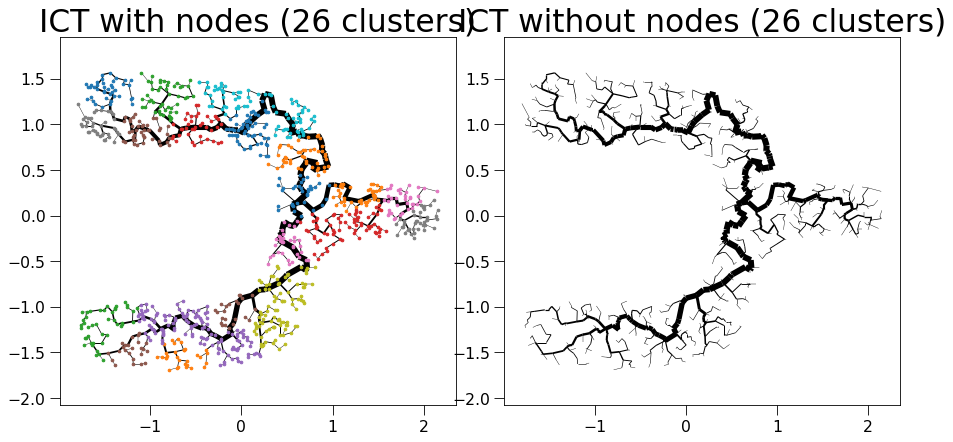

sklearn is done: 0.15383005142211914
My own part is done: 0.0010027885437011719


  0%|          | 0/27 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 141 -> 123
update Arr 123 -> 107
update Arr 107 -> 90
update Arr 90 -> 80
update Arr 80 -> 70
update Arr 70 -> 60
update Arr 60 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 203 -> 181
update Arr 181 -> 157
update Arr 157 -> 136
update Arr 136 -> 117
update Arr 117 -> 102
update Arr 102 -> 89
update Arr 89 -> 80
update Arr 80 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 236
update Arr 236 -> 202
update Arr 202 -> 181
update Arr 181 -> 162
update Arr 162 -> 146
update Arr 146 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 114
update Arr 114 -> 100
update Arr 100 -> 89
update Arr 89 -> 78
update Arr 78 -> 66
update Arr 66 -> 47
update Arr 47 -> 35
update Arr 35 -> 32
update Arr 32 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 276 -> 239
update Arr 239 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 129
update Arr 129 -> 113
update Arr 113 -> 98
update Arr 98 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 224
update Arr 224 -> 200
update Arr 200 -> 173
update Arr 173 -> 150
update Arr 150 -> 133
update Arr 133 -> 110
update Arr 110 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 213 -> 187
update Arr 187 -> 166
update Arr 166 -> 150
update Arr 150 -> 130
update Arr 130 -> 112
update Arr 112 -> 97
update Arr 97 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 61
update Arr 61 -> 46
update Arr 46 -> 37
update Arr 37 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 254 -> 209
update Arr 209 -> 189
update Arr 189 -> 163
update Arr 163 -> 146
update Arr 146 -> 132
update Arr 132 -> 119
update Arr 119 -> 104
update Arr 104 -> 94
update Arr 94 -> 74
update Arr 74 -> 63
update Arr 63 -> 55
update Arr 55 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 230 -> 191
update Arr 191 -> 166
update Arr 166 -> 145
update Arr 145 -> 130
update Arr 130 -> 116
update Arr 116 -> 101
update Arr 101 -> 89
update Arr 89 -> 80
update Arr 80 -> 70
update Arr 70 -> 61
update Arr 61 -> 49
update Arr 49 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 36
update Arr 36 -> 34
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 143
update Arr 143 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 247 -> 215
update Arr 215 -> 192
update Arr 192 -> 173
update Arr 173 -> 154
update Arr 154 -> 136
update Arr 136 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 65
update Arr 65 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 274 -> 235
update Arr 235 -> 202
update Arr 202 -> 181
update Arr 181 -> 162
update Arr 162 -> 143
update Arr 143 -> 127
update Arr 127 -> 114
update Arr 114 -> 98
update Arr 98 -> 88
update Arr 88 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 221
update Arr 221 -> 197
update Arr 197 -> 175
update Arr 175 -> 159
update Arr 159 -> 141
update Arr 141 -> 125
update Arr 125 -> 110
update Arr 110 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 219
update Arr 219 -> 195
update Arr 195 -> 176
update Arr 176 -> 155
update Arr 155 -> 136
update Arr 136 -> 122
update Arr 122 -> 104
update Arr 104 -> 87
update Arr 87 -> 78
update Arr 78 -> 63
update Arr 63 -> 53
update Arr 53 -> 50
update Arr 50 -> 46
update Arr 46 -> 41
update Arr 41 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 176 -> 145
update Arr 145 -> 130
update Arr 130 -> 117
update Arr 117 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 69
update Arr 69 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/297 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/297 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 297 -> 261
update Arr 261 -> 237
update Arr 237 -> 212
update Arr 212 -> 192
update Arr 192 -> 170
update Arr 170 -> 154
update Arr 154 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 94
update Arr 94 -> 85
update Arr 85 -> 72
update Arr 72 -> 61
update Arr 61 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 46
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 256 -> 217
update Arr 217 -> 197
update Arr 197 -> 178
update Arr 178 -> 157
update Arr 157 -> 139
update Arr 139 -> 125
update Arr 125 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 75
update Arr 75 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 38
update Arr 38 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 253 -> 219
update Arr 219 -> 197
update Arr 197 -> 175
update Arr 175 -> 158
update Arr 158 -> 143
update Arr 143 -> 128
update Arr 128 -> 115
update Arr 115 -> 98
update Arr 98 -> 87
update Arr 87 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 38
Final k: 11


create edgeId array:   0%|          | 0/326 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/326 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 326 -> 292
update Arr 292 -> 251
update Arr 251 -> 228
update Arr 228 -> 204
update Arr 204 -> 183
update Arr 183 -> 161
update Arr 161 -> 135
update Arr 135 -> 122
update Arr 122 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 67
update Arr 67 -> 59
update Arr 59 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 46
Final k: 11


create edgeId array:   0%|          | 0/257 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/257 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 257 -> 224
update Arr 224 -> 201
update Arr 201 -> 182
update Arr 182 -> 158
update Arr 158 -> 142
update Arr 142 -> 126
update Arr 126 -> 112
update Arr 112 -> 96
update Arr 96 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 158 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 99
update Arr 99 -> 82
update Arr 82 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 34
update Arr 34 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/308 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/308 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 308 -> 268
update Arr 268 -> 239
update Arr 239 -> 213
update Arr 213 -> 193
update Arr 193 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 117
update Arr 117 -> 101
update Arr 101 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 53
update Arr 53 -> 48
update Arr 48 -> 47
update Arr 47 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 388 -> 345
update Arr 345 -> 292
update Arr 292 -> 263
update Arr 263 -> 239
update Arr 239 -> 216
update Arr 216 -> 195
update Arr 195 -> 174
update Arr 174 -> 151
update Arr 151 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 94
update Arr 94 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 60
update Arr 60 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/298 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/298 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 298 -> 258
update Arr 258 -> 228
update Arr 228 -> 200
update Arr 200 -> 178
update Arr 178 -> 156
update Arr 156 -> 139
update Arr 139 -> 123
update Arr 123 -> 107
update Arr 107 -> 93
update Arr 93 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 269 -> 231
update Arr 231 -> 204
update Arr 204 -> 180
update Arr 180 -> 154
update Arr 154 -> 138
update Arr 138 -> 116
update Arr 116 -> 105
update Arr 105 -> 91
update Arr 91 -> 80
update Arr 80 -> 64
update Arr 64 -> 54
update Arr 54 -> 49
update Arr 49 -> 43
update Arr 43 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 175
update Arr 175 -> 159
update Arr 159 -> 138
update Arr 138 -> 123
update Arr 123 -> 108
update Arr 108 -> 96
update Arr 96 -> 75
update Arr 75 -> 63
update Arr 63 -> 56
update Arr 56 -> 48
update Arr 48 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 244 -> 209
update Arr 209 -> 184
update Arr 184 -> 163
update Arr 163 -> 145
update Arr 145 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36


Patching the components together:   0%|          | 0/27 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1045 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1045 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1045 -> 1009
added 265 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 438 edges early


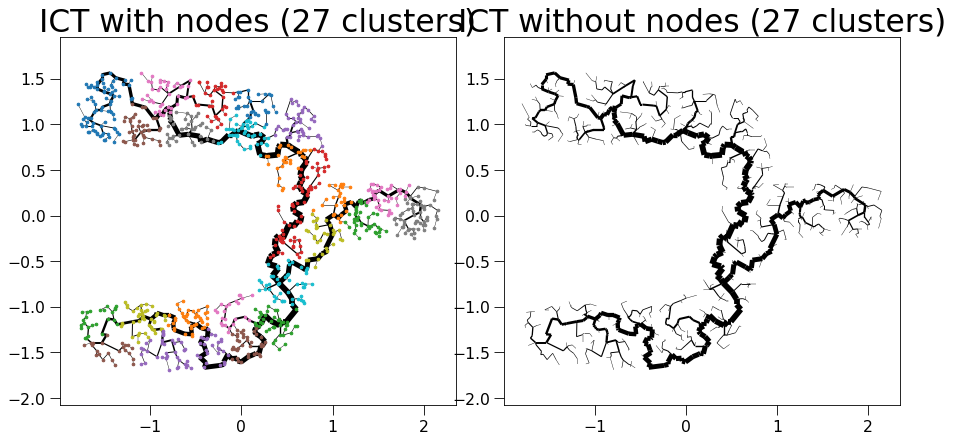

sklearn is done: 0.1502079963684082
My own part is done: 0.0007729530334472656


  0%|          | 0/28 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 244 -> 205
update Arr 205 -> 182
update Arr 182 -> 160
update Arr 160 -> 142
update Arr 142 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 88
update Arr 88 -> 72
update Arr 72 -> 63
update Arr 63 -> 53
update Arr 53 -> 46
update Arr 46 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 44
update Arr 44 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/215 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/215 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 215 -> 189
update Arr 189 -> 165
update Arr 165 -> 148
update Arr 148 -> 125
update Arr 125 -> 110
update Arr 110 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 57
update Arr 57 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 32
Final k: 11


create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 258 -> 232
update Arr 232 -> 195
update Arr 195 -> 165
update Arr 165 -> 148
update Arr 148 -> 132
update Arr 132 -> 114
update Arr 114 -> 98
update Arr 98 -> 84
update Arr 84 -> 69
update Arr 69 -> 61
update Arr 61 -> 51
update Arr 51 -> 47
update Arr 47 -> 43
update Arr 43 -> 38
update Arr 38 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/259 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/259 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 259 -> 221
update Arr 221 -> 198
update Arr 198 -> 178
update Arr 178 -> 158
update Arr 158 -> 141
update Arr 141 -> 124
update Arr 124 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 66
update Arr 66 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 40
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 135
update Arr 135 -> 113
update Arr 113 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 61
update Arr 61 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 236
update Arr 236 -> 202
update Arr 202 -> 181
update Arr 181 -> 162
update Arr 162 -> 146
update Arr 146 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 206 -> 186
update Arr 186 -> 167
update Arr 167 -> 139
update Arr 139 -> 121
update Arr 121 -> 107
update Arr 107 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 42
update Arr 42 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 272 -> 240
update Arr 240 -> 212
update Arr 212 -> 192
update Arr 192 -> 172
update Arr 172 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 103
update Arr 103 -> 88
update Arr 88 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 47
update Arr 47 -> 44
update Arr 44 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/254 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/254 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 254 -> 227
update Arr 227 -> 192
update Arr 192 -> 169
update Arr 169 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 87
update Arr 87 -> 76
update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/308 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/308 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 308 -> 272
update Arr 272 -> 244
update Arr 244 -> 215
update Arr 215 -> 189
update Arr 189 -> 169
update Arr 169 -> 149
update Arr 149 -> 133
update Arr 133 -> 120
update Arr 120 -> 104
update Arr 104 -> 92
update Arr 92 -> 81
update Arr 81 -> 69
update Arr 69 -> 58
update Arr 58 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 242 -> 208
update Arr 208 -> 184
update Arr 184 -> 167
update Arr 167 -> 151
update Arr 151 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 87
update Arr 87 -> 75
update Arr 75 -> 65
update Arr 65 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 247 -> 215
update Arr 215 -> 192
update Arr 192 -> 173
update Arr 173 -> 154
update Arr 154 -> 136
update Arr 136 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 65
update Arr 65 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 276 -> 245
update Arr 245 -> 207
update Arr 207 -> 185
update Arr 185 -> 162
update Arr 162 -> 145
update Arr 145 -> 130
update Arr 130 -> 113
update Arr 113 -> 96
update Arr 96 -> 85
update Arr 85 -> 75
update Arr 75 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 47
update Arr 47 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 274 -> 247
update Arr 247 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 145
update Arr 145 -> 125
update Arr 125 -> 107
update Arr 107 -> 94
update Arr 94 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/288 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/288 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 288 -> 260
update Arr 260 -> 229
update Arr 229 -> 205
update Arr 205 -> 186
update Arr 186 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 51
update Arr 51 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 233 -> 194
update Arr 194 -> 165
update Arr 165 -> 147
update Arr 147 -> 126
update Arr 126 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 55
update Arr 55 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 195 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 115
update Arr 115 -> 93
update Arr 93 -> 78
update Arr 78 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 217 -> 176
update Arr 176 -> 151
update Arr 151 -> 131
update Arr 131 -> 115
update Arr 115 -> 102
update Arr 102 -> 87
update Arr 87 -> 77
update Arr 77 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 251 -> 220
update Arr 220 -> 199
update Arr 199 -> 171
update Arr 171 -> 151
update Arr 151 -> 133
update Arr 133 -> 117
update Arr 117 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 295 -> 253
update Arr 253 -> 212
update Arr 212 -> 188
update Arr 188 -> 163
update Arr 163 -> 144
update Arr 144 -> 124
update Arr 124 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 71
update Arr 71 -> 61
update Arr 61 -> 52
update Arr 52 -> 47
update Arr 47 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 156
update Arr 156 -> 135
update Arr 135 -> 121
update Arr 121 -> 96
update Arr 96 -> 87
update Arr 87 -> 76
update Arr 76 -> 67
update Arr 67 -> 55
update Arr 55 -> 45
update Arr 45 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 184
update Arr 184 -> 159
update Arr 159 -> 143
update Arr 143 -> 121
update Arr 121 -> 104
update Arr 104 -> 85
update Arr 85 -> 77
update Arr 77 -> 65
update Arr 65 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/298 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/298 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 298 -> 268
update Arr 268 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 172
update Arr 172 -> 155
update Arr 155 -> 135
update Arr 135 -> 118
update Arr 118 -> 106
update Arr 106 -> 95
update Arr 95 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 53
update Arr 53 -> 49
update Arr 49 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 184
update Arr 184 -> 160
update Arr 160 -> 138
update Arr 138 -> 121
update Arr 121 -> 103
update Arr 103 -> 90
update Arr 90 -> 67
update Arr 67 -> 56
update Arr 56 -> 48
update Arr 48 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 262 -> 231
update Arr 231 -> 196
update Arr 196 -> 176
update Arr 176 -> 153
update Arr 153 -> 139
update Arr 139 -> 121
update Arr 121 -> 105
update Arr 105 -> 94
update Arr 94 -> 83
update Arr 83 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 47
update Arr 47 -> 43
update Arr 43 -> 38
update Arr 38 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 187 -> 166
update Arr 166 -> 134
update Arr 134 -> 116
update Arr 116 -> 101
update Arr 101 -> 82
update Arr 82 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 197 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 109
update Arr 109 -> 90
update Arr 90 -> 79
update Arr 79 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28


Patching the components together:   0%|          | 0/28 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1047 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1047 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1047 -> 1009
added 280 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1003
added 3 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 450 edges early


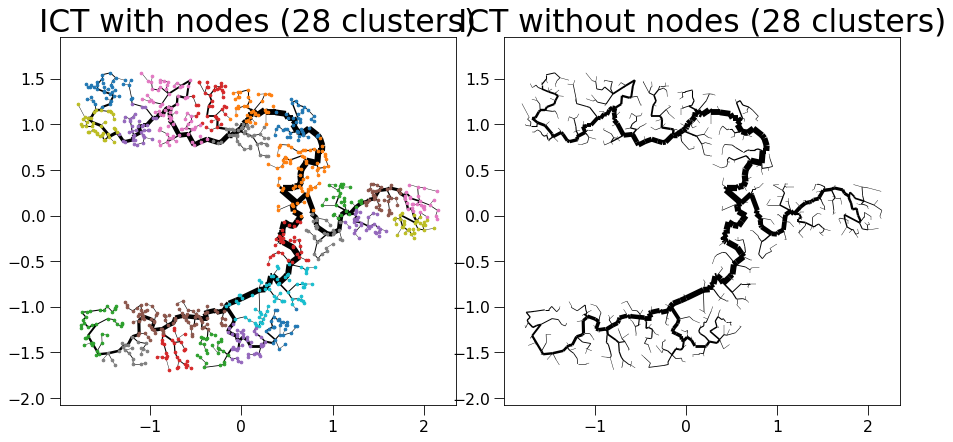

sklearn is done: 0.15776777267456055
My own part is done: 0.0010652542114257812


  0%|          | 0/29 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 219 -> 192
update Arr 192 -> 169
update Arr 169 -> 153
update Arr 153 -> 134
update Arr 134 -> 113
update Arr 113 -> 102
update Arr 102 -> 90
update Arr 90 -> 81
update Arr 81 -> 67
update Arr 67 -> 57
update Arr 57 -> 46
update Arr 46 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 252 -> 221
update Arr 221 -> 200
update Arr 200 -> 169
update Arr 169 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 76
update Arr 76 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/314 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/314 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 314 -> 274
update Arr 274 -> 248
update Arr 248 -> 216
update Arr 216 -> 194
update Arr 194 -> 176
update Arr 176 -> 159
update Arr 159 -> 142
update Arr 142 -> 129
update Arr 129 -> 115
update Arr 115 -> 103
update Arr 103 -> 87
update Arr 87 -> 76
update Arr 76 -> 69
update Arr 69 -> 61
update Arr 61 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/319 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/319 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 319 -> 285
update Arr 285 -> 259
update Arr 259 -> 235
update Arr 235 -> 213
update Arr 213 -> 193
update Arr 193 -> 172
update Arr 172 -> 151
update Arr 151 -> 134
update Arr 134 -> 119
update Arr 119 -> 103
update Arr 103 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 61
update Arr 61 -> 54
update Arr 54 -> 50
update Arr 50 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 68
update Arr 68 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 200 -> 161
update Arr 161 -> 142
update Arr 142 -> 125
update Arr 125 -> 109
update Arr 109 -> 92
update Arr 92 -> 82
update Arr 82 -> 74
update Arr 74 -> 61
update Arr 61 -> 45
update Arr 45 -> 36
update Arr 36 -> 34
update Arr 34 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 168 -> 149
update Arr 149 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 84
update Arr 84 -> 70
update Arr 70 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 205 -> 177
update Arr 177 -> 160
update Arr 160 -> 139
update Arr 139 -> 123
update Arr 123 -> 103
update Arr 103 -> 90
update Arr 90 -> 76
update Arr 76 -> 68
update Arr 68 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 231 -> 209
update Arr 209 -> 185
update Arr 185 -> 167
update Arr 167 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 83
update Arr 83 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/285 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/285 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 285 -> 242
update Arr 242 -> 212
update Arr 212 -> 188
update Arr 188 -> 169
update Arr 169 -> 153
update Arr 153 -> 137
update Arr 137 -> 118
update Arr 118 -> 100
update Arr 100 -> 87
update Arr 87 -> 71
update Arr 71 -> 61
update Arr 61 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 300 -> 252
update Arr 252 -> 224
update Arr 224 -> 202
update Arr 202 -> 182
update Arr 182 -> 162
update Arr 162 -> 147
update Arr 147 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 71
update Arr 71 -> 58
update Arr 58 -> 53
update Arr 53 -> 51
update Arr 51 -> 48
update Arr 48 -> 45
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 235 -> 203
update Arr 203 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
update Arr 142 -> 126
update Arr 126 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 75
update Arr 75 -> 65
update Arr 65 -> 58
update Arr 58 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 34
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 236 -> 199
update Arr 199 -> 178
update Arr 178 -> 161
update Arr 161 -> 143
update Arr 143 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 66
update Arr 66 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 236 -> 212
update Arr 212 -> 181
update Arr 181 -> 163
update Arr 163 -> 143
update Arr 143 -> 128
update Arr 128 -> 115
update Arr 115 -> 103
update Arr 103 -> 88
update Arr 88 -> 78
update Arr 78 -> 60
update Arr 60 -> 52
update Arr 52 -> 47
update Arr 47 -> 39
update Arr 39 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
update Arr 35 -> 35
Final k: 11


create edgeId array:   0%|          | 0/309 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/309 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/46 [00:00<?, ?it/s]

update Arr 309 -> 253
update Arr 253 -> 227
update Arr 227 -> 202
update Arr 202 -> 168
update Arr 168 -> 152
update Arr 152 -> 133
update Arr 133 -> 118
update Arr 118 -> 107
update Arr 107 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 61
update Arr 61 -> 56
update Arr 56 -> 56
update Arr 56 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 46
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 250 -> 223
update Arr 223 -> 200
update Arr 200 -> 176
update Arr 176 -> 155
update Arr 155 -> 139
update Arr 139 -> 124
update Arr 124 -> 110
update Arr 110 -> 99
update Arr 99 -> 84
update Arr 84 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 52
update Arr 52 -> 48
update Arr 48 -> 43
update Arr 43 -> 40
update Arr 40 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 50
update Arr 50 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 217 -> 185
update Arr 185 -> 165
update Arr 165 -> 149
update Arr 149 -> 132
update Arr 132 -> 113
update Arr 113 -> 101
update Arr 101 -> 81
update Arr 81 -> 70
update Arr 70 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 143
update Arr 143 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/323 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/323 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 323 -> 290
update Arr 290 -> 263
update Arr 263 -> 227
update Arr 227 -> 206
update Arr 206 -> 184
update Arr 184 -> 165
update Arr 165 -> 145
update Arr 145 -> 130
update Arr 130 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 51
update Arr 51 -> 50
update Arr 50 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 206
update Arr 206 -> 181
update Arr 181 -> 160
update Arr 160 -> 141
update Arr 141 -> 128
update Arr 128 -> 113
update Arr 113 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 197 -> 178
update Arr 178 -> 155
update Arr 155 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 101
update Arr 101 -> 83
update Arr 83 -> 73
update Arr 73 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/277 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/277 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 277 -> 237
update Arr 237 -> 214
update Arr 214 -> 189
update Arr 189 -> 171
update Arr 171 -> 152
update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 173
update Arr 173 -> 154
update Arr 154 -> 139
update Arr 139 -> 123
update Arr 123 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 132
update Arr 132 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 185 -> 158
update Arr 158 -> 135
update Arr 135 -> 106
update Arr 106 -> 96
update Arr 96 -> 75
update Arr 75 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
Final k: 11


create edgeId array:   0%|          | 0/237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 237 -> 207
update Arr 207 -> 179
update Arr 179 -> 159
update Arr 159 -> 144
update Arr 144 -> 124
update Arr 124 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 203 -> 184
update Arr 184 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 115
update Arr 115 -> 102
update Arr 102 -> 81
update Arr 81 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/209 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/209 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 209 -> 168
update Arr 168 -> 145
update Arr 145 -> 125
update Arr 125 -> 109
update Arr 109 -> 96
update Arr 96 -> 81
update Arr 81 -> 70
update Arr 70 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29


Patching the components together:   0%|          | 0/29 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1051 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1051 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1051 -> 1009
added 264 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 4 edges early
added 414 edges early


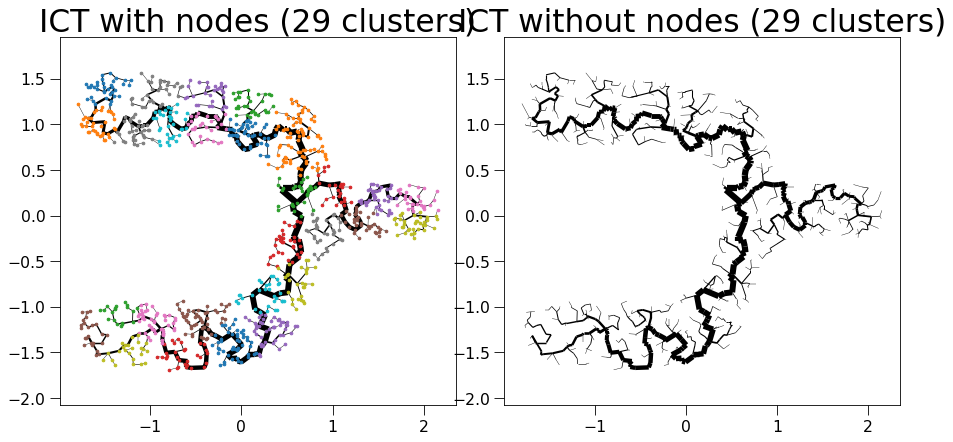

sklearn is done: 0.15772461891174316
My own part is done: 0.0013768672943115234


  0%|          | 0/30 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 203 -> 184
update Arr 184 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 115
update Arr 115 -> 102
update Arr 102 -> 81
update Arr 81 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 225 -> 191
update Arr 191 -> 169
update Arr 169 -> 150
update Arr 150 -> 133
update Arr 133 -> 116
update Arr 116 -> 103
update Arr 103 -> 91
update Arr 91 -> 81
update Arr 81 -> 67
update Arr 67 -> 60
update Arr 60 -> 44
update Arr 44 -> 41
update Arr 41 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 137
update Arr 137 -> 110
update Arr 110 -> 95
update Arr 95 -> 86
update Arr 86 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 276 -> 239
update Arr 239 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 129
update Arr 129 -> 113
update Arr 113 -> 98
update Arr 98 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 265 -> 235
update Arr 235 -> 212
update Arr 212 -> 190
update Arr 190 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 180 -> 160
update Arr 160 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 54
update Arr 54 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 228 -> 196
update Arr 196 -> 167
update Arr 167 -> 150
update Arr 150 -> 128
update Arr 128 -> 112
update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/315 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/315 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 315 -> 270
update Arr 270 -> 236
update Arr 236 -> 211
update Arr 211 -> 188
update Arr 188 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 118
update Arr 118 -> 101
update Arr 101 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 53
update Arr 53 -> 50
update Arr 50 -> 48
update Arr 48 -> 47
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 172
update Arr 172 -> 152
update Arr 152 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 80
update Arr 80 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 291 -> 251
update Arr 251 -> 227
update Arr 227 -> 200
update Arr 200 -> 178
update Arr 178 -> 161
update Arr 161 -> 137
update Arr 137 -> 118
update Arr 118 -> 106
update Arr 106 -> 86
update Arr 86 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 49
update Arr 49 -> 46
update Arr 46 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 263 -> 221
update Arr 221 -> 197
update Arr 197 -> 175
update Arr 175 -> 159
update Arr 159 -> 141
update Arr 141 -> 125
update Arr 125 -> 110
update Arr 110 -> 98
update Arr 98 -> 87
update Arr 87 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/282 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/282 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 282 -> 250
update Arr 250 -> 222
update Arr 222 -> 195
update Arr 195 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/215 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/215 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 215 -> 192
update Arr 192 -> 173
update Arr 173 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 73
update Arr 73 -> 64
update Arr 64 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 124
update Arr 124 -> 105
update Arr 105 -> 94
update Arr 94 -> 84
update Arr 84 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 27
update Arr 27 -> 22
update Arr 22 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 256 -> 225
update Arr 225 -> 202
update Arr 202 -> 173
update Arr 173 -> 147
update Arr 147 -> 133
update Arr 133 -> 117
update Arr 117 -> 104
update Arr 104 -> 83
update Arr 83 -> 72
update Arr 72 -> 60
update Arr 60 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 50
update Arr 50 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 136 -> 115
update Arr 115 -> 97
update Arr 97 -> 83
update Arr 83 -> 74
update Arr 74 -> 66
update Arr 66 -> 53
update Arr 53 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 388 -> 345
update Arr 345 -> 292
update Arr 292 -> 263
update Arr 263 -> 239
update Arr 239 -> 216
update Arr 216 -> 195
update Arr 195 -> 174
update Arr 174 -> 151
update Arr 151 -> 136
update Arr 136 -> 122
update Arr 122 -> 110
update Arr 110 -> 94
update Arr 94 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 60
update Arr 60 -> 58
update Arr 58 -> 57
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 210 -> 177
update Arr 177 -> 153
update Arr 153 -> 126
update Arr 126 -> 114
update Arr 114 -> 101
update Arr 101 -> 91
update Arr 91 -> 74
update Arr 74 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 178 -> 154
update Arr 154 -> 137
update Arr 137 -> 124
update Arr 124 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/279 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/279 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 279 -> 242
update Arr 242 -> 211
update Arr 211 -> 187
update Arr 187 -> 169
update Arr 169 -> 148
update Arr 148 -> 132
update Arr 132 -> 117
update Arr 117 -> 103
update Arr 103 -> 92
update Arr 92 -> 78
update Arr 78 -> 66
update Arr 66 -> 58
update Arr 58 -> 51
update Arr 51 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 187
update Arr 187 -> 166
update Arr 166 -> 146
update Arr 146 -> 129
update Arr 129 -> 112
update Arr 112 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 249 -> 216
update Arr 216 -> 196
update Arr 196 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 118
update Arr 118 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 50
update Arr 50 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 64
update Arr 64 -> 53
update Arr 53 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 193
update Arr 193 -> 170
update Arr 170 -> 134
update Arr 134 -> 119
update Arr 119 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 252 -> 221
update Arr 221 -> 200
update Arr 200 -> 169
update Arr 169 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 76
update Arr 76 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 173
update Arr 173 -> 154
update Arr 154 -> 139
update Arr 139 -> 123
update Arr 123 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 172
update Arr 172 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 75
update Arr 75 -> 58
update Arr 58 -> 51
update Arr 51 -> 38
update Arr 38 -> 36
update Arr 36 -> 31
update Arr 31 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 150
update Arr 150 -> 131
update Arr 131 -> 113
update Arr 113 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 66
update Arr 66 -> 54
update Arr 54 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 119
update Arr 119 -> 102
update Arr 102 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22


Patching the components together:   0%|          | 0/30 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/5 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1058 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1058 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1058 -> 1009
added 265 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1003
added 3 edges early
update Arr 1003 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 ->

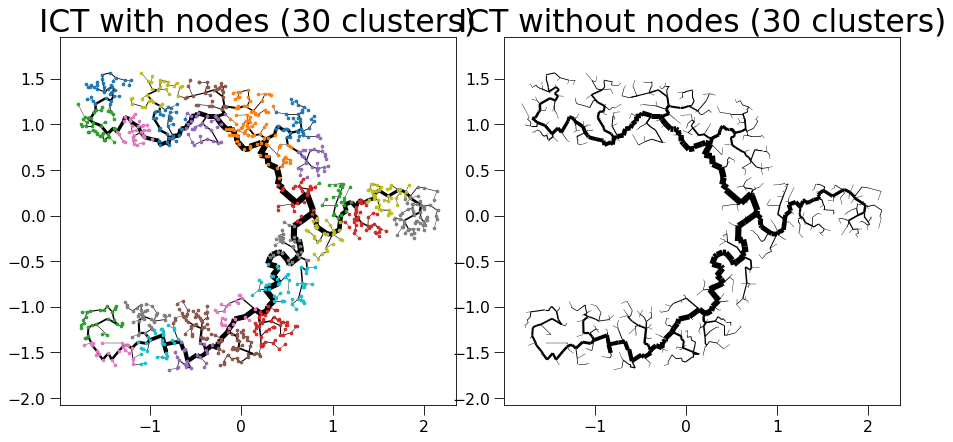

sklearn is done: 0.15743517875671387
My own part is done: 0.0013141632080078125


  0%|          | 0/31 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 143
update Arr 143 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 265 -> 235
update Arr 235 -> 212
update Arr 212 -> 190
update Arr 190 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 179
update Arr 179 -> 161
update Arr 161 -> 144
update Arr 144 -> 127
update Arr 127 -> 115
update Arr 115 -> 96
update Arr 96 -> 87
update Arr 87 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 162
update Arr 162 -> 146
update Arr 146 -> 125
update Arr 125 -> 113
update Arr 113 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 47
update Arr 47 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 269 -> 238
update Arr 238 -> 211
update Arr 211 -> 190
update Arr 190 -> 164
update Arr 164 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 96
update Arr 96 -> 75
update Arr 75 -> 66
update Arr 66 -> 58
update Arr 58 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 268 -> 235
update Arr 235 -> 211
update Arr 211 -> 191
update Arr 191 -> 173
update Arr 173 -> 154
update Arr 154 -> 133
update Arr 133 -> 118
update Arr 118 -> 102
update Arr 102 -> 91
update Arr 91 -> 80
update Arr 80 -> 72
update Arr 72 -> 60
update Arr 60 -> 53
update Arr 53 -> 46
update Arr 46 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 128
update Arr 128 -> 112
update Arr 112 -> 90
update Arr 90 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 251 -> 220
update Arr 220 -> 199
update Arr 199 -> 171
update Arr 171 -> 151
update Arr 151 -> 133
update Arr 133 -> 117
update Arr 117 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 127
update Arr 127 -> 113
update Arr 113 -> 99
update Arr 99 -> 87
update Arr 87 -> 77
update Arr 77 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 291 -> 259
update Arr 259 -> 222
update Arr 222 -> 192
update Arr 192 -> 171
update Arr 171 -> 155
update Arr 155 -> 135
update Arr 135 -> 118
update Arr 118 -> 104
update Arr 104 -> 92
update Arr 92 -> 82
update Arr 82 -> 67
update Arr 67 -> 57
update Arr 57 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 228 -> 194
update Arr 194 -> 168
update Arr 168 -> 147
update Arr 147 -> 133
update Arr 133 -> 116
update Arr 116 -> 104
update Arr 104 -> 87
update Arr 87 -> 79
update Arr 79 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 233 -> 194
update Arr 194 -> 165
update Arr 165 -> 147
update Arr 147 -> 126
update Arr 126 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 55
update Arr 55 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 176 -> 145
update Arr 145 -> 130
update Arr 130 -> 117
update Arr 117 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 69
update Arr 69 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 236
update Arr 236 -> 202
update Arr 202 -> 181
update Arr 181 -> 162
update Arr 162 -> 146
update Arr 146 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 208 -> 184
update Arr 184 -> 167
update Arr 167 -> 148
update Arr 148 -> 128
update Arr 128 -> 116
update Arr 116 -> 103
update Arr 103 -> 92
update Arr 92 -> 80
update Arr 80 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 236 -> 207
update Arr 207 -> 180
update Arr 180 -> 143
update Arr 143 -> 126
update Arr 126 -> 110
update Arr 110 -> 97
update Arr 97 -> 80
update Arr 80 -> 69
update Arr 69 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 184 -> 155
update Arr 155 -> 137
update Arr 137 -> 118
update Arr 118 -> 107
update Arr 107 -> 91
update Arr 91 -> 69
update Arr 69 -> 57
update Arr 57 -> 48
update Arr 48 -> 39
update Arr 39 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 115
update Arr 115 -> 98
update Arr 98 -> 86
update Arr 86 -> 67
update Arr 67 -> 51
update Arr 51 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 253 -> 219
update Arr 219 -> 197
update Arr 197 -> 175
update Arr 175 -> 158
update Arr 158 -> 143
update Arr 143 -> 128
update Arr 128 -> 115
update Arr 115 -> 98
update Arr 98 -> 87
update Arr 87 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 38
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 247 -> 216
update Arr 216 -> 180
update Arr 180 -> 156
update Arr 156 -> 139
update Arr 139 -> 126
update Arr 126 -> 106
update Arr 106 -> 96
update Arr 96 -> 84
update Arr 84 -> 75
update Arr 75 -> 68
update Arr 68 -> 61
update Arr 61 -> 47
update Arr 47 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 210 -> 177
update Arr 177 -> 153
update Arr 153 -> 126
update Arr 126 -> 114
update Arr 114 -> 101
update Arr 101 -> 91
update Arr 91 -> 74
update Arr 74 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 119
update Arr 119 -> 102
update Arr 102 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 205 -> 167
update Arr 167 -> 147
update Arr 147 -> 128
update Arr 128 -> 107
update Arr 107 -> 89
update Arr 89 -> 76
update Arr 76 -> 65
update Arr 65 -> 56
update Arr 56 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 205 -> 179
update Arr 179 -> 149
update Arr 149 -> 132
update Arr 132 -> 119
update Arr 119 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 229 -> 204
update Arr 204 -> 180
update Arr 180 -> 163
update Arr 163 -> 142
update Arr 142 -> 125
update Arr 125 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 171 -> 154
update Arr 154 -> 130
update Arr 130 -> 116
update Arr 116 -> 104
update Arr 104 -> 93
update Arr 93 -> 82
update Arr 82 -> 65
update Arr 65 -> 58
update Arr 58 -> 46
update Arr 46 -> 38
update Arr 38 -> 31
update Arr 31 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/259 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/259 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 259 -> 232
update Arr 232 -> 208
update Arr 208 -> 182
update Arr 182 -> 159
update Arr 159 -> 140
update Arr 140 -> 125
update Arr 125 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 62
update Arr 62 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 172
update Arr 172 -> 152
update Arr 152 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 80
update Arr 80 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 170 -> 143
update Arr 143 -> 127
update Arr 127 -> 113
update Arr 113 -> 99
update Arr 99 -> 86
update Arr 86 -> 62
update Arr 62 -> 51
update Arr 51 -> 43
update Arr 43 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/308 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/308 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/44 [00:00<?, ?it/s]

update Arr 308 -> 270
update Arr 270 -> 227
update Arr 227 -> 206
update Arr 206 -> 186
update Arr 186 -> 169
update Arr 169 -> 150
update Arr 150 -> 129
update Arr 129 -> 116
update Arr 116 -> 104
update Arr 104 -> 92
update Arr 92 -> 81
update Arr 81 -> 69
update Arr 69 -> 58
update Arr 58 -> 54
update Arr 54 -> 50
update Arr 50 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28


Patching the components together:   0%|          | 0/31 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1055 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1055 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1055 -> 1008
added 268 edges early
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
added 3 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1001
added 3 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
up

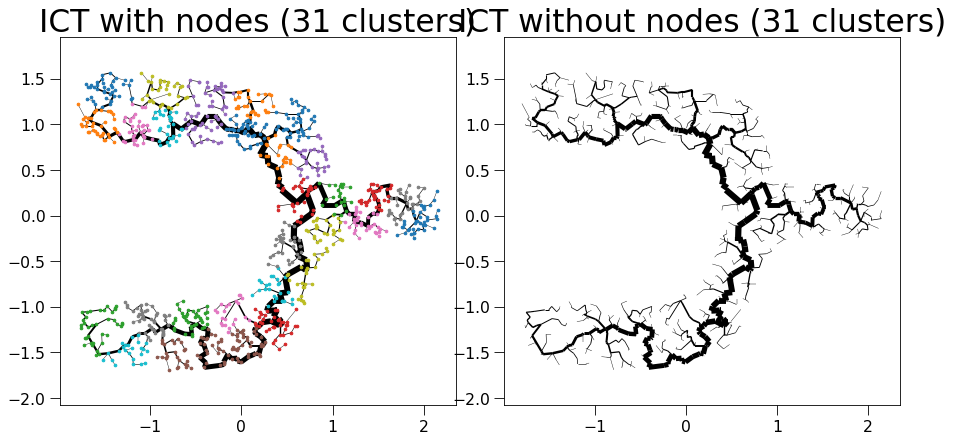

sklearn is done: 0.17221927642822266
My own part is done: 0.0008821487426757812


  0%|          | 0/32 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 50
update Arr 50 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/259 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/259 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 259 -> 233
update Arr 233 -> 198
update Arr 198 -> 177
update Arr 177 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 108
update Arr 108 -> 93
update Arr 93 -> 80
update Arr 80 -> 72
update Arr 72 -> 58
update Arr 58 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 172
update Arr 172 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 75
update Arr 75 -> 58
update Arr 58 -> 51
update Arr 51 -> 38
update Arr 38 -> 36
update Arr 36 -> 31
update Arr 31 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 213 -> 179
update Arr 179 -> 159
update Arr 159 -> 144
update Arr 144 -> 129
update Arr 129 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 74
update Arr 74 -> 67
update Arr 67 -> 57
update Arr 57 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 274 -> 247
update Arr 247 -> 207
update Arr 207 -> 188
update Arr 188 -> 169
update Arr 169 -> 146
update Arr 146 -> 129
update Arr 129 -> 111
update Arr 111 -> 98
update Arr 98 -> 81
update Arr 81 -> 72
update Arr 72 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 176 -> 157
update Arr 157 -> 123
update Arr 123 -> 111
update Arr 111 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 240 -> 209
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 151
update Arr 151 -> 135
update Arr 135 -> 120
update Arr 120 -> 101
update Arr 101 -> 90
update Arr 90 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 218 -> 175
update Arr 175 -> 148
update Arr 148 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 96
update Arr 96 -> 83
update Arr 83 -> 72
update Arr 72 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 44
update Arr 44 -> 38
update Arr 38 -> 37
update Arr 37 -> 33
update Arr 33 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 183 -> 155
update Arr 155 -> 137
update Arr 137 -> 124
update Arr 124 -> 105
update Arr 105 -> 93
update Arr 93 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 250 -> 219
update Arr 219 -> 182
update Arr 182 -> 162
update Arr 162 -> 143
update Arr 143 -> 127
update Arr 127 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 55
update Arr 55 -> 47
update Arr 47 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 221 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 231 -> 209
update Arr 209 -> 185
update Arr 185 -> 167
update Arr 167 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 83
update Arr 83 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 191 -> 156
update Arr 156 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 96
update Arr 96 -> 83
update Arr 83 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 225 -> 182
update Arr 182 -> 158
update Arr 158 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 92
update Arr 92 -> 81
update Arr 81 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 131
update Arr 131 -> 117
update Arr 117 -> 100
update Arr 100 -> 87
update Arr 87 -> 69
update Arr 69 -> 50
update Arr 50 -> 39
update Arr 39 -> 33
update Arr 33 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 234 -> 209
update Arr 209 -> 189
update Arr 189 -> 167
update Arr 167 -> 146
update Arr 146 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 94
update Arr 94 -> 85
update Arr 85 -> 75
update Arr 75 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 211 -> 183
update Arr 183 -> 162
update Arr 162 -> 144
update Arr 144 -> 129
update Arr 129 -> 112
update Arr 112 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 56
update Arr 56 -> 45
update Arr 45 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/259 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/259 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 259 -> 230
update Arr 230 -> 200
update Arr 200 -> 177
update Arr 177 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 48
update Arr 48 -> 43
update Arr 43 -> 43
update Arr 43 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 194 -> 172
update Arr 172 -> 155
update Arr 155 -> 140
update Arr 140 -> 124
update Arr 124 -> 107
update Arr 107 -> 92
update Arr 92 -> 76
update Arr 76 -> 68
update Arr 68 -> 61
update Arr 61 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 162
update Arr 162 -> 141
update Arr 141 -> 128
update Arr 128 -> 112
update Arr 112 -> 95
update Arr 95 -> 85
update Arr 85 -> 73
update Arr 73 -> 66
update Arr 66 -> 45
update Arr 45 -> 40
update Arr 40 -> 38
update Arr 38 -> 36
update Arr 36 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 181
update Arr 181 -> 162
update Arr 162 -> 147
update Arr 147 -> 131
update Arr 131 -> 115
update Arr 115 -> 99
update Arr 99 -> 82
update Arr 82 -> 69
update Arr 69 -> 59
update Arr 59 -> 49
update Arr 49 -> 44
update Arr 44 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 265 -> 235
update Arr 235 -> 212
update Arr 212 -> 190
update Arr 190 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 148 -> 130
update Arr 130 -> 102
update Arr 102 -> 89
update Arr 89 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 119
update Arr 119 -> 102
update Arr 102 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 172 -> 154
update Arr 154 -> 133
update Arr 133 -> 120
update Arr 120 -> 104
update Arr 104 -> 93
update Arr 93 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 151
update Arr 151 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 92
update Arr 92 -> 79
update Arr 79 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 37
update Arr 37 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 203 -> 184
update Arr 184 -> 162
update Arr 162 -> 147
update Arr 147 -> 133
update Arr 133 -> 115
update Arr 115 -> 102
update Arr 102 -> 81
update Arr 81 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 111
update Arr 111 -> 85
update Arr 85 -> 71
update Arr 71 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 175
update Arr 175 -> 155
update Arr 155 -> 132
update Arr 132 -> 114
update Arr 114 -> 100
update Arr 100 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/282 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/282 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/40 [00:00<?, ?it/s]

update Arr 282 -> 250
update Arr 250 -> 222
update Arr 222 -> 195
update Arr 195 -> 174
update Arr 174 -> 154
update Arr 154 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 55
update Arr 55 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 206 -> 173
update Arr 173 -> 156
update Arr 156 -> 132
update Arr 132 -> 117
update Arr 117 -> 102
update Arr 102 -> 92
update Arr 92 -> 72
update Arr 72 -> 61
update Arr 61 -> 55
update Arr 55 -> 42
update Arr 42 -> 40
update Arr 40 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 222 -> 185
update Arr 185 -> 164
update Arr 164 -> 143
update Arr 143 -> 127
update Arr 127 -> 115
update Arr 115 -> 100
update Arr 100 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31


Patching the components together:   0%|          | 0/32 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1052 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1052 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1052 -> 1007
added 262 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update

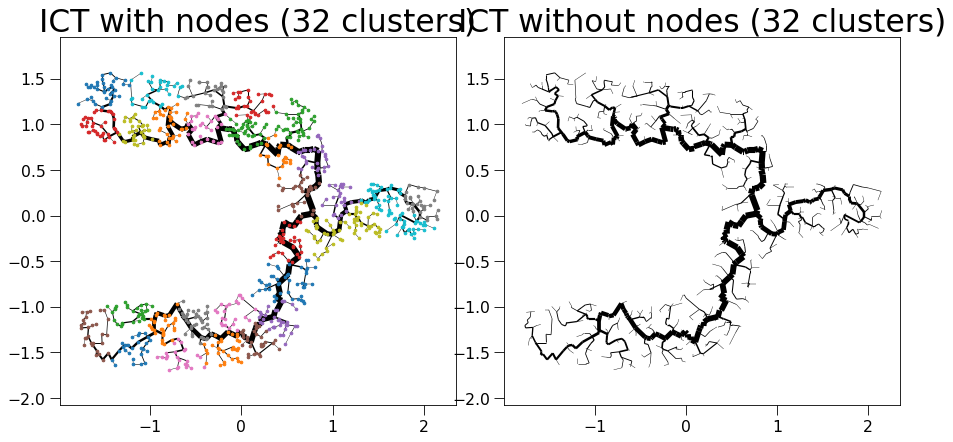

sklearn is done: 0.16649317741394043
My own part is done: 0.0013959407806396484


  0%|          | 0/33 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 177
update Arr 177 -> 147
update Arr 147 -> 126
update Arr 126 -> 112
update Arr 112 -> 99
update Arr 99 -> 87
update Arr 87 -> 75
update Arr 75 -> 59
update Arr 59 -> 49
update Arr 49 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 44
update Arr 44 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 210 -> 175
update Arr 175 -> 148
update Arr 148 -> 133
update Arr 133 -> 114
update Arr 114 -> 100
update Arr 100 -> 87
update Arr 87 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 267 -> 230
update Arr 230 -> 194
update Arr 194 -> 173
update Arr 173 -> 155
update Arr 155 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 185 -> 164
update Arr 164 -> 145
update Arr 145 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 82
update Arr 82 -> 73
update Arr 73 -> 60
update Arr 60 -> 53
update Arr 53 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 144
update Arr 144 -> 129
update Arr 129 -> 117
update Arr 117 -> 103
update Arr 103 -> 87
update Arr 87 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/410 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/410 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 410 -> 371
update Arr 371 -> 318
update Arr 318 -> 288
update Arr 288 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 167
update Arr 167 -> 148
update Arr 148 -> 132
update Arr 132 -> 116
update Arr 116 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 66
update Arr 66 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 166 -> 137
update Arr 137 -> 112
update Arr 112 -> 101
update Arr 101 -> 90
update Arr 90 -> 74
update Arr 74 -> 65
update Arr 65 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 150 -> 131
update Arr 131 -> 109
update Arr 109 -> 87
update Arr 87 -> 76
update Arr 76 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 178
update Arr 178 -> 154
update Arr 154 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 91
update Arr 91 -> 80
update Arr 80 -> 70
update Arr 70 -> 47
update Arr 47 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 240 -> 206
update Arr 206 -> 184
update Arr 184 -> 165
update Arr 165 -> 147
update Arr 147 -> 130
update Arr 130 -> 118
update Arr 118 -> 103
update Arr 103 -> 91
update Arr 91 -> 80
update Arr 80 -> 71
update Arr 71 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 256 -> 226
update Arr 226 -> 199
update Arr 199 -> 178
update Arr 178 -> 155
update Arr 155 -> 138
update Arr 138 -> 125
update Arr 125 -> 110
update Arr 110 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 63
update Arr 63 -> 52
update Arr 52 -> 45
update Arr 45 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 139
update Arr 139 -> 120
update Arr 120 -> 107
update Arr 107 -> 93
update Arr 93 -> 73
update Arr 73 -> 61
update Arr 61 -> 53
update Arr 53 -> 42
update Arr 42 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 108
update Arr 108 -> 96
update Arr 96 -> 76
update Arr 76 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 155
update Arr 155 -> 138
update Arr 138 -> 119
update Arr 119 -> 95
update Arr 95 -> 81
update Arr 81 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 246 -> 216
update Arr 216 -> 180
update Arr 180 -> 156
update Arr 156 -> 140
update Arr 140 -> 121
update Arr 121 -> 102
update Arr 102 -> 90
update Arr 90 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 139
update Arr 139 -> 126
update Arr 126 -> 107
update Arr 107 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 104
update Arr 104 -> 93
update Arr 93 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 47
update Arr 47 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/233 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/233 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 233 -> 190
update Arr 190 -> 166
update Arr 166 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 109
update Arr 109 -> 93
update Arr 93 -> 82
update Arr 82 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 180
update Arr 180 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 111
update Arr 111 -> 94
update Arr 94 -> 83
update Arr 83 -> 73
update Arr 73 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 249 -> 216
update Arr 216 -> 196
update Arr 196 -> 172
update Arr 172 -> 152
update Arr 152 -> 134
update Arr 134 -> 118
update Arr 118 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 50
update Arr 50 -> 46
update Arr 46 -> 44
update Arr 44 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 64
update Arr 64 -> 53
update Arr 53 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 195 -> 154
update Arr 154 -> 136
update Arr 136 -> 123
update Arr 123 -> 107
update Arr 107 -> 96
update Arr 96 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 175
update Arr 175 -> 155
update Arr 155 -> 132
update Arr 132 -> 114
update Arr 114 -> 100
update Arr 100 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 193 -> 175
update Arr 175 -> 142
update Arr 142 -> 128
update Arr 128 -> 112
update Arr 112 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 64
update Arr 64 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 143
update Arr 143 -> 122
update Arr 122 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 73
update Arr 73 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 75
update Arr 75 -> 63
update Arr 63 -> 54
update Arr 54 -> 45
update Arr 45 -> 37
update Arr 37 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 262 -> 227
update Arr 227 -> 198
update Arr 198 -> 179
update Arr 179 -> 161
update Arr 161 -> 145
update Arr 145 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 77
update Arr 77 -> 69
update Arr 69 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 229 -> 192
update Arr 192 -> 174
update Arr 174 -> 158
update Arr 158 -> 140
update Arr 140 -> 125
update Arr 125 -> 112
update Arr 112 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 60
update Arr 60 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 274 -> 247
update Arr 247 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 145
update Arr 145 -> 125
update Arr 125 -> 107
update Arr 107 -> 94
update Arr 94 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 185 -> 161
update Arr 161 -> 140
update Arr 140 -> 124
update Arr 124 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 73
update Arr 73 -> 62
update Arr 62 -> 53
update Arr 53 -> 41
update Arr 41 -> 37
update Arr 37 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 26


Patching the components together:   0%|          | 0/33 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1062 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1062 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1062 -> 1009
added 274 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1007
added 3 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
added 3 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
up

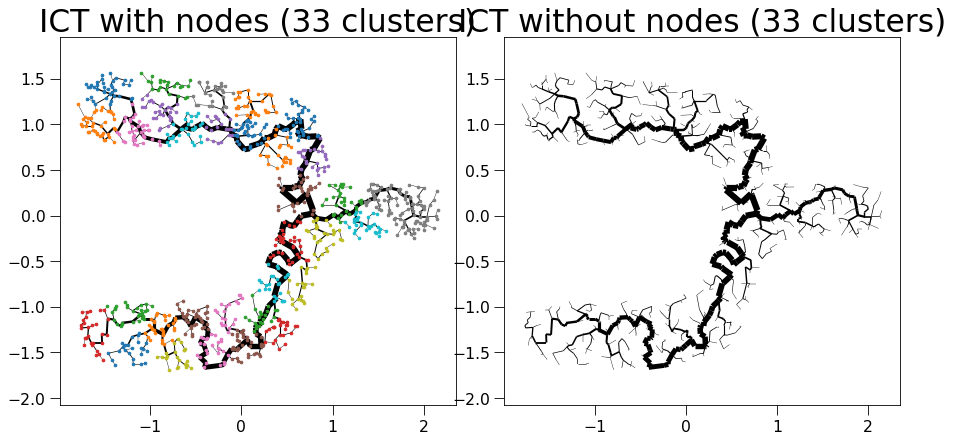

sklearn is done: 0.1768510341644287
My own part is done: 0.0014355182647705078


  0%|          | 0/34 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 246 -> 223
update Arr 223 -> 200
update Arr 200 -> 172
update Arr 172 -> 155
update Arr 155 -> 139
update Arr 139 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 50
update Arr 50 -> 44
update Arr 44 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 64
update Arr 64 -> 53
update Arr 53 -> 33
update Arr 33 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 151
update Arr 151 -> 129
update Arr 129 -> 115
update Arr 115 -> 97
update Arr 97 -> 88
update Arr 88 -> 74
update Arr 74 -> 63
update Arr 63 -> 49
update Arr 49 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 238
update Arr 238 -> 203
update Arr 203 -> 182
update Arr 182 -> 165
update Arr 165 -> 148
update Arr 148 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 95
update Arr 95 -> 81
update Arr 81 -> 68
update Arr 68 -> 53
update Arr 53 -> 42
update Arr 42 -> 41
update Arr 41 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 228 -> 196
update Arr 196 -> 167
update Arr 167 -> 150
update Arr 150 -> 128
update Arr 128 -> 112
update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 147
update Arr 147 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 206 -> 169
update Arr 169 -> 151
update Arr 151 -> 134
update Arr 134 -> 117
update Arr 117 -> 100
update Arr 100 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 53
update Arr 53 -> 42
update Arr 42 -> 39
update Arr 39 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
Final k: 11


create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 256 -> 221
update Arr 221 -> 198
update Arr 198 -> 175
update Arr 175 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 92
update Arr 92 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 56
update Arr 56 -> 50
update Arr 50 -> 45
update Arr 45 -> 43
update Arr 43 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 150 -> 131
update Arr 131 -> 113
update Arr 113 -> 99
update Arr 99 -> 88
update Arr 88 -> 77
update Arr 77 -> 65
update Arr 65 -> 59
update Arr 59 -> 47
update Arr 47 -> 35
update Arr 35 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/220 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/220 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 220 -> 193
update Arr 193 -> 174
update Arr 174 -> 150
update Arr 150 -> 136
update Arr 136 -> 120
update Arr 120 -> 109
update Arr 109 -> 99
update Arr 99 -> 86
update Arr 86 -> 76
update Arr 76 -> 69
update Arr 69 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 33
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 238 -> 206
update Arr 206 -> 186
update Arr 186 -> 165
update Arr 165 -> 147
update Arr 147 -> 130
update Arr 130 -> 118
update Arr 118 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 160
update Arr 160 -> 136
update Arr 136 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 81
update Arr 81 -> 72
update Arr 72 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/199 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/199 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 199 -> 161
update Arr 161 -> 137
update Arr 137 -> 121
update Arr 121 -> 106
update Arr 106 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 30
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 247 -> 212
update Arr 212 -> 190
update Arr 190 -> 168
update Arr 168 -> 151
update Arr 151 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 51
update Arr 51 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 37
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 164 -> 135
update Arr 135 -> 115
update Arr 115 -> 104
update Arr 104 -> 87
update Arr 87 -> 79
update Arr 79 -> 64
update Arr 64 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 247 -> 218
update Arr 218 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 133
update Arr 133 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 184 -> 150
update Arr 150 -> 119
update Arr 119 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 142
update Arr 142 -> 125
update Arr 125 -> 109
update Arr 109 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 55
update Arr 55 -> 45
update Arr 45 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 110
update Arr 110 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 50
update Arr 50 -> 41
update Arr 41 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 226 -> 178
update Arr 178 -> 159
update Arr 159 -> 144
update Arr 144 -> 128
update Arr 128 -> 116
update Arr 116 -> 100
update Arr 100 -> 87
update Arr 87 -> 77
update Arr 77 -> 65
update Arr 65 -> 55
update Arr 55 -> 46
update Arr 46 -> 44
update Arr 44 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 178 -> 154
update Arr 154 -> 137
update Arr 137 -> 124
update Arr 124 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 160 -> 142
update Arr 142 -> 124
update Arr 124 -> 112
update Arr 112 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 60
update Arr 60 -> 49
update Arr 49 -> 41
update Arr 41 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 183
update Arr 183 -> 164
update Arr 164 -> 138
update Arr 138 -> 125
update Arr 125 -> 107
update Arr 107 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 64
update Arr 64 -> 53
update Arr 53 -> 44
update Arr 44 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 177
update Arr 177 -> 155
update Arr 155 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 95
update Arr 95 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 54
update Arr 54 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/260 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/260 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 260 -> 229
update Arr 229 -> 204
update Arr 204 -> 181
update Arr 181 -> 157
update Arr 157 -> 138
update Arr 138 -> 124
update Arr 124 -> 110
update Arr 110 -> 98
update Arr 98 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 118
update Arr 118 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 163 -> 133
update Arr 133 -> 111
update Arr 111 -> 94
update Arr 94 -> 85
update Arr 85 -> 66
update Arr 66 -> 55
update Arr 55 -> 49
update Arr 49 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 172
update Arr 172 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 75
update Arr 75 -> 58
update Arr 58 -> 51
update Arr 51 -> 38
update Arr 38 -> 36
update Arr 36 -> 31
update Arr 31 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 175
update Arr 175 -> 155
update Arr 155 -> 132
update Arr 132 -> 114
update Arr 114 -> 100
update Arr 100 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 141
update Arr 141 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 237 -> 207
update Arr 207 -> 179
update Arr 179 -> 159
update Arr 159 -> 144
update Arr 144 -> 124
update Arr 124 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35


Patching the components together:   0%|          | 0/34 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1055 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1055 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1055 -> 1006
added 267 edges early
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 406 edges early


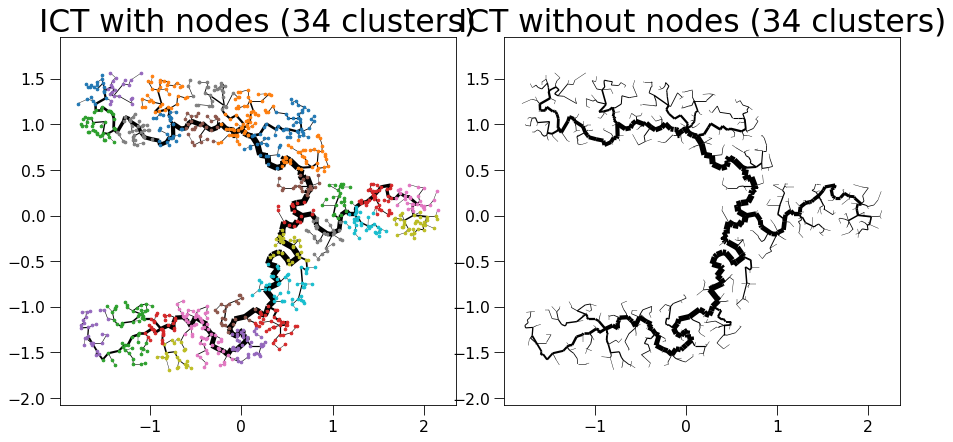

sklearn is done: 0.17770648002624512
My own part is done: 0.0009257793426513672


  0%|          | 0/35 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 172
update Arr 172 -> 156
update Arr 156 -> 138
update Arr 138 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 74
update Arr 74 -> 67
update Arr 67 -> 50
update Arr 50 -> 40
update Arr 40 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 176 -> 145
update Arr 145 -> 126
update Arr 126 -> 113
update Arr 113 -> 101
update Arr 101 -> 82
update Arr 82 -> 69
update Arr 69 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/247 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/247 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 247 -> 212
update Arr 212 -> 190
update Arr 190 -> 168
update Arr 168 -> 151
update Arr 151 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 51
update Arr 51 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 37
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 129 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 100
update Arr 100 -> 90
update Arr 90 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 184
update Arr 184 -> 159
update Arr 159 -> 143
update Arr 143 -> 121
update Arr 121 -> 104
update Arr 104 -> 85
update Arr 85 -> 77
update Arr 77 -> 65
update Arr 65 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/252 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/252 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 252 -> 221
update Arr 221 -> 200
update Arr 200 -> 169
update Arr 169 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 76
update Arr 76 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 165 -> 141
update Arr 141 -> 119
update Arr 119 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 31
update Arr 31 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 242 -> 206
update Arr 206 -> 181
update Arr 181 -> 160
update Arr 160 -> 141
update Arr 141 -> 128
update Arr 128 -> 113
update Arr 113 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 50
update Arr 50 -> 46
update Arr 46 -> 43
update Arr 43 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 226 -> 189
update Arr 189 -> 163
update Arr 163 -> 145
update Arr 145 -> 130
update Arr 130 -> 116
update Arr 116 -> 104
update Arr 104 -> 91
update Arr 91 -> 78
update Arr 78 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 171 -> 150
update Arr 150 -> 136
update Arr 136 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 185 -> 161
update Arr 161 -> 140
update Arr 140 -> 124
update Arr 124 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 73
update Arr 73 -> 62
update Arr 62 -> 53
update Arr 53 -> 41
update Arr 41 -> 37
update Arr 37 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
Final k: 11


create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 269 -> 239
update Arr 239 -> 211
update Arr 211 -> 190
update Arr 190 -> 164
update Arr 164 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 94
update Arr 94 -> 84
update Arr 84 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 42
update Arr 42 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/259 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/259 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 259 -> 229
update Arr 229 -> 206
update Arr 206 -> 183
update Arr 183 -> 158
update Arr 158 -> 143
update Arr 143 -> 127
update Arr 127 -> 112
update Arr 112 -> 99
update Arr 99 -> 82
update Arr 82 -> 74
update Arr 74 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 172 -> 143
update Arr 143 -> 126
update Arr 126 -> 114
update Arr 114 -> 103
update Arr 103 -> 91
update Arr 91 -> 80
update Arr 80 -> 72
update Arr 72 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 103
update Arr 103 -> 89
update Arr 89 -> 63
update Arr 63 -> 47
update Arr 47 -> 40
update Arr 40 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 235 -> 203
update Arr 203 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
update Arr 142 -> 126
update Arr 126 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 75
update Arr 75 -> 65
update Arr 65 -> 58
update Arr 58 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 34
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 147
update Arr 147 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 206 -> 186
update Arr 186 -> 167
update Arr 167 -> 139
update Arr 139 -> 121
update Arr 121 -> 107
update Arr 107 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 42
update Arr 42 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 53
update Arr 53 -> 38
update Arr 38 -> 34
update Arr 34 -> 24
update Arr 24 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 191 -> 163
update Arr 163 -> 147
update Arr 147 -> 118
update Arr 118 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 208 -> 189
update Arr 189 -> 166
update Arr 166 -> 142
update Arr 142 -> 120
update Arr 120 -> 109
update Arr 109 -> 90
update Arr 90 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 175 -> 158
update Arr 158 -> 136
update Arr 136 -> 119
update Arr 119 -> 103
update Arr 103 -> 89
update Arr 89 -> 80
update Arr 80 -> 67
update Arr 67 -> 57
update Arr 57 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 113
update Arr 113 -> 98
update Arr 98 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 222 -> 196
update Arr 196 -> 172
update Arr 172 -> 155
update Arr 155 -> 128
update Arr 128 -> 114
update Arr 114 -> 96
update Arr 96 -> 85
update Arr 85 -> 75
update Arr 75 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 33
Final k: 11


create edgeId array:   0%|          | 0/274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 274 -> 247
update Arr 247 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 145
update Arr 145 -> 125
update Arr 125 -> 107
update Arr 107 -> 94
update Arr 94 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 118
update Arr 118 -> 105
update Arr 105 -> 94
update Arr 94 -> 85
update Arr 85 -> 67
update Arr 67 -> 56
update Arr 56 -> 40
update Arr 40 -> 32
update Arr 32 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 124
update Arr 124 -> 106
update Arr 106 -> 91
update Arr 91 -> 82
update Arr 82 -> 64
update Arr 64 -> 48
update Arr 48 -> 41
update Arr 41 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 218 -> 195
update Arr 195 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 102
update Arr 102 -> 91
update Arr 91 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 138
update Arr 138 -> 120
update Arr 120 -> 109
update Arr 109 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 138
update Arr 138 -> 118
update Arr 118 -> 94
update Arr 94 -> 83
update Arr 83 -> 71
update Arr 71 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 178
update Arr 178 -> 154
update Arr 154 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 91
update Arr 91 -> 80
update Arr 80 -> 70
update Arr 70 -> 47
update Arr 47 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32


Patching the components together:   0%|          | 0/35 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1060 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1060 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1060 -> 1009
added 281 edges early
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 412 edges early


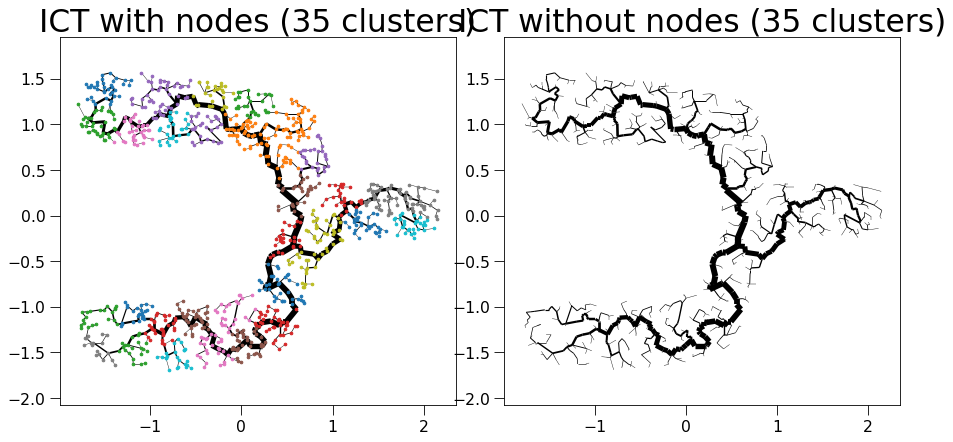

sklearn is done: 0.19519925117492676
My own part is done: 0.0012962818145751953


  0%|          | 0/36 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/263 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/263 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 263 -> 223
update Arr 223 -> 197
update Arr 197 -> 176
update Arr 176 -> 158
update Arr 158 -> 140
update Arr 140 -> 126
update Arr 126 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 63
update Arr 63 -> 53
update Arr 53 -> 44
update Arr 44 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 151
update Arr 151 -> 129
update Arr 129 -> 115
update Arr 115 -> 97
update Arr 97 -> 88
update Arr 88 -> 74
update Arr 74 -> 63
update Arr 63 -> 49
update Arr 49 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 255 -> 216
update Arr 216 -> 194
update Arr 194 -> 176
update Arr 176 -> 156
update Arr 156 -> 136
update Arr 136 -> 119
update Arr 119 -> 108
update Arr 108 -> 95
update Arr 95 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 53
update Arr 53 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 188 -> 155
update Arr 155 -> 139
update Arr 139 -> 118
update Arr 118 -> 103
update Arr 103 -> 86
update Arr 86 -> 71
update Arr 71 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 138
update Arr 138 -> 125
update Arr 125 -> 112
update Arr 112 -> 96
update Arr 96 -> 86
update Arr 86 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 240 -> 201
update Arr 201 -> 179
update Arr 179 -> 157
update Arr 157 -> 140
update Arr 140 -> 124
update Arr 124 -> 111
update Arr 111 -> 98
update Arr 98 -> 78
update Arr 78 -> 67
update Arr 67 -> 54
update Arr 54 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 213 -> 178
update Arr 178 -> 159
update Arr 159 -> 143
update Arr 143 -> 127
update Arr 127 -> 110
update Arr 110 -> 94
update Arr 94 -> 82
update Arr 82 -> 70
update Arr 70 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 139
update Arr 139 -> 125
update Arr 125 -> 110
update Arr 110 -> 96
update Arr 96 -> 83
update Arr 83 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 111
update Arr 111 -> 85
update Arr 85 -> 71
update Arr 71 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 162 -> 133
update Arr 133 -> 107
update Arr 107 -> 93
update Arr 93 -> 79
update Arr 79 -> 68
update Arr 68 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 229 -> 204
update Arr 204 -> 180
update Arr 180 -> 163
update Arr 163 -> 142
update Arr 142 -> 125
update Arr 125 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 194 -> 165
update Arr 165 -> 147
update Arr 147 -> 129
update Arr 129 -> 116
update Arr 116 -> 96
update Arr 96 -> 82
update Arr 82 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 114
update Arr 114 -> 98
update Arr 98 -> 89
update Arr 89 -> 77
update Arr 77 -> 58
update Arr 58 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 223 -> 190
update Arr 190 -> 165
update Arr 165 -> 147
update Arr 147 -> 133
update Arr 133 -> 118
update Arr 118 -> 101
update Arr 101 -> 90
update Arr 90 -> 80
update Arr 80 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 178
update Arr 178 -> 154
update Arr 154 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 91
update Arr 91 -> 80
update Arr 80 -> 70
update Arr 70 -> 47
update Arr 47 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 115
update Arr 115 -> 102
update Arr 102 -> 82
update Arr 82 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 39
update Arr 39 -> 31
update Arr 31 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 198 -> 175
update Arr 175 -> 155
update Arr 155 -> 132
update Arr 132 -> 114
update Arr 114 -> 100
update Arr 100 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 223 -> 189
update Arr 189 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 121
update Arr 121 -> 106
update Arr 106 -> 89
update Arr 89 -> 73
update Arr 73 -> 66
update Arr 66 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/202 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/202 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 202 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 115
update Arr 115 -> 104
update Arr 104 -> 88
update Arr 88 -> 74
update Arr 74 -> 58
update Arr 58 -> 50
update Arr 50 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 139
update Arr 139 -> 118
update Arr 118 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 69
update Arr 69 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 160
update Arr 160 -> 136
update Arr 136 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 81
update Arr 81 -> 72
update Arr 72 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 147
update Arr 147 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/236 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/236 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 236 -> 207
update Arr 207 -> 180
update Arr 180 -> 143
update Arr 143 -> 126
update Arr 126 -> 110
update Arr 110 -> 97
update Arr 97 -> 80
update Arr 80 -> 69
update Arr 69 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 117
update Arr 117 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 56
update Arr 56 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 82
update Arr 82 -> 72
update Arr 72 -> 65
update Arr 65 -> 47
update Arr 47 -> 35
update Arr 35 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 195 -> 175
update Arr 175 -> 151
update Arr 151 -> 132
update Arr 132 -> 117
update Arr 117 -> 102
update Arr 102 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 56
update Arr 56 -> 46
update Arr 46 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 197 -> 168
update Arr 168 -> 148
update Arr 148 -> 131
update Arr 131 -> 112
update Arr 112 -> 93
update Arr 93 -> 66
update Arr 66 -> 55
update Arr 55 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/260 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/260 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 260 -> 229
update Arr 229 -> 204
update Arr 204 -> 181
update Arr 181 -> 157
update Arr 157 -> 138
update Arr 138 -> 124
update Arr 124 -> 110
update Arr 110 -> 98
update Arr 98 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 100
update Arr 100 -> 90
update Arr 90 -> 77
update Arr 77 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 139
update Arr 139 -> 111
update Arr 111 -> 98
update Arr 98 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 130
update Arr 130 -> 116
update Arr 116 -> 102
update Arr 102 -> 90
update Arr 90 -> 75
update Arr 75 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 39
update Arr 39 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 176 -> 143
update Arr 143 -> 106
update Arr 106 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 162
update Arr 162 -> 145
update Arr 145 -> 131
update Arr 131 -> 116
update Arr 116 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 45
update Arr 45 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 107
update Arr 107 -> 90
update Arr 90 -> 79
update Arr 79 -> 70
update Arr 70 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18


Patching the components together:   0%|          | 0/36 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1061 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1061 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1061 -> 1009
added 271 edges early
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1005
added 4 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 999
added 410 edges early


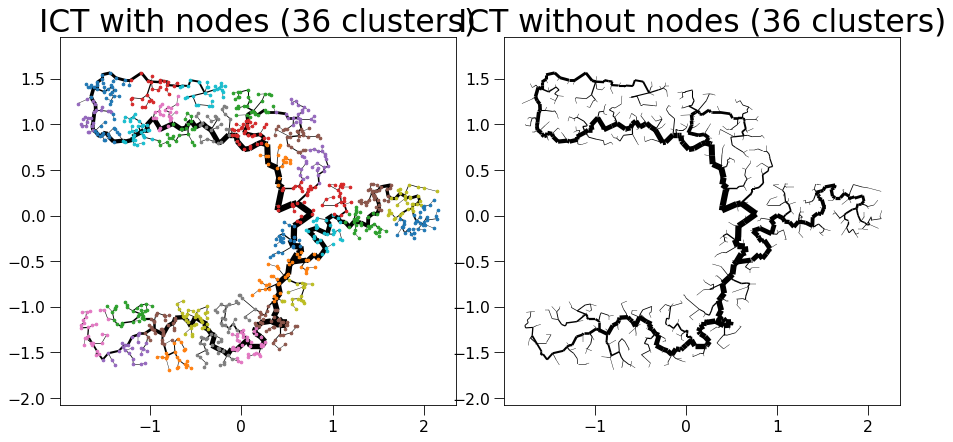

sklearn is done: 0.16958117485046387
My own part is done: 0.0009655952453613281


  0%|          | 0/36 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 131
update Arr 131 -> 112
update Arr 112 -> 91
update Arr 91 -> 80
update Arr 80 -> 72
update Arr 72 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 201 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 117
update Arr 117 -> 95
update Arr 95 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 170 -> 143
update Arr 143 -> 127
update Arr 127 -> 113
update Arr 113 -> 99
update Arr 99 -> 86
update Arr 86 -> 62
update Arr 62 -> 51
update Arr 51 -> 43
update Arr 43 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 222 -> 193
update Arr 193 -> 166
update Arr 166 -> 149
update Arr 149 -> 124
update Arr 124 -> 105
update Arr 105 -> 88
update Arr 88 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 240 -> 209
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 151
update Arr 151 -> 135
update Arr 135 -> 120
update Arr 120 -> 101
update Arr 101 -> 90
update Arr 90 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 112
update Arr 112 -> 91
update Arr 91 -> 79
update Arr 79 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 135
update Arr 135 -> 119
update Arr 119 -> 98
update Arr 98 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 68
update Arr 68 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 188 -> 156
update Arr 156 -> 140
update Arr 140 -> 125
update Arr 125 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 145
update Arr 145 -> 126
update Arr 126 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 65
update Arr 65 -> 58
update Arr 58 -> 44
update Arr 44 -> 31
update Arr 31 -> 29
update Arr 29 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 221 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 268 -> 238
update Arr 238 -> 215
update Arr 215 -> 192
update Arr 192 -> 167
update Arr 167 -> 147
update Arr 147 -> 130
update Arr 130 -> 114
update Arr 114 -> 103
update Arr 103 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 187 -> 148
update Arr 148 -> 133
update Arr 133 -> 116
update Arr 116 -> 105
update Arr 105 -> 95
update Arr 95 -> 78
update Arr 78 -> 70
update Arr 70 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 37
update Arr 37 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 119 -> 94
update Arr 94 -> 85
update Arr 85 -> 75
update Arr 75 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/283 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/283 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 283 -> 248
update Arr 248 -> 215
update Arr 215 -> 194
update Arr 194 -> 175
update Arr 175 -> 156
update Arr 156 -> 141
update Arr 141 -> 123
update Arr 123 -> 106
update Arr 106 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 56
update Arr 56 -> 47
update Arr 47 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/259 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/259 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 259 -> 225
update Arr 225 -> 202
update Arr 202 -> 183
update Arr 183 -> 166
update Arr 166 -> 148
update Arr 148 -> 134
update Arr 134 -> 111
update Arr 111 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 69
update Arr 69 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 42
update Arr 42 -> 38
update Arr 38 -> 37
update Arr 37 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 267 -> 240
update Arr 240 -> 217
update Arr 217 -> 196
update Arr 196 -> 178
update Arr 178 -> 159
update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 112
update Arr 112 -> 99
update Arr 99 -> 87
update Arr 87 -> 79
update Arr 79 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 155 -> 126
update Arr 126 -> 111
update Arr 111 -> 85
update Arr 85 -> 70
update Arr 70 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 36
update Arr 36 -> 29
update Arr 29 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 117
update Arr 117 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 56
update Arr 56 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 238 -> 209
update Arr 209 -> 180
update Arr 180 -> 159
update Arr 159 -> 144
update Arr 144 -> 129
update Arr 129 -> 114
update Arr 114 -> 97
update Arr 97 -> 78
update Arr 78 -> 67
update Arr 67 -> 54
update Arr 54 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 265 -> 236
update Arr 236 -> 192
update Arr 192 -> 171
update Arr 171 -> 151
update Arr 151 -> 137
update Arr 137 -> 117
update Arr 117 -> 102
update Arr 102 -> 86
update Arr 86 -> 78
update Arr 78 -> 67
update Arr 67 -> 57
update Arr 57 -> 49
update Arr 49 -> 45
update Arr 45 -> 40
update Arr 40 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 104
update Arr 104 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 123
update Arr 123 -> 93
update Arr 93 -> 81
update Arr 81 -> 72
update Arr 72 -> 61
update Arr 61 -> 55
update Arr 55 -> 44
update Arr 44 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 234 -> 201
update Arr 201 -> 176
update Arr 176 -> 151
update Arr 151 -> 135
update Arr 135 -> 118
update Arr 118 -> 107
update Arr 107 -> 95
update Arr 95 -> 83
update Arr 83 -> 71
update Arr 71 -> 64
update Arr 64 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 40
update Arr 40 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 135
update Arr 135 -> 113
update Arr 113 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 61
update Arr 61 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 221 -> 194
update Arr 194 -> 161
update Arr 161 -> 144
update Arr 144 -> 123
update Arr 123 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 66
update Arr 66 -> 52
update Arr 52 -> 45
update Arr 45 -> 41
update Arr 41 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 33
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 132
update Arr 132 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 160 -> 134
update Arr 134 -> 119
update Arr 119 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 87
update Arr 87 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 53
update Arr 53 -> 46
update Arr 46 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 141
update Arr 141 -> 126
update Arr 126 -> 111
update Arr 111 -> 98
update Arr 98 -> 86
update Arr 86 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 50
update Arr 50 -> 39
update Arr 39 -> 31
update Arr 31 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 192 -> 167
update Arr 167 -> 151
update Arr 151 -> 137
update Arr 137 -> 119
update Arr 119 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 44
update Arr 44 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 105
update Arr 105 -> 74
update Arr 74 -> 51
update Arr 51 -> 41
update Arr 41 -> 30
update Arr 30 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 158
update Arr 158 -> 139
update Arr 139 -> 111
update Arr 111 -> 98
update Arr 98 -> 89
update Arr 89 -> 73
update Arr 73 -> 62
update Arr 62 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 165
update Arr 165 -> 143
update Arr 143 -> 123
update Arr 123 -> 107
update Arr 107 -> 93
update Arr 93 -> 81
update Arr 81 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 95
update Arr 95 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16


Patching the components together:   0%|          | 0/36 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1062 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1062 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1062 -> 1009
added 270 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 999
added 2 edges early
added 382 edges early


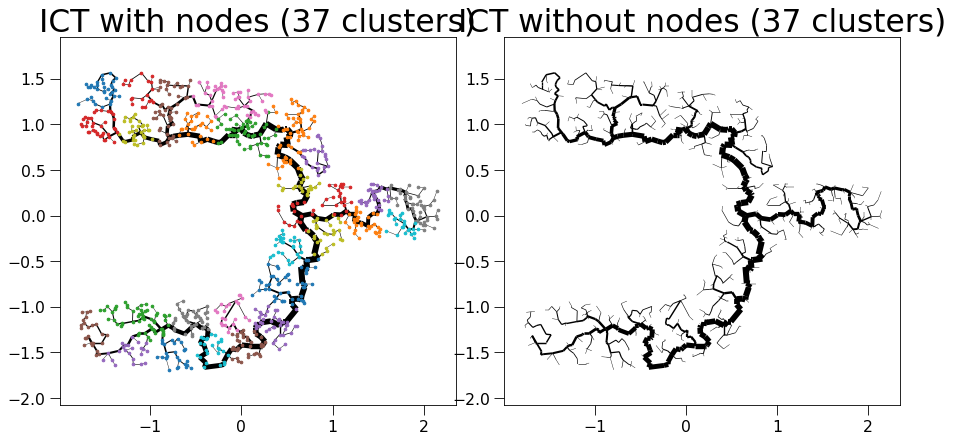

sklearn is done: 0.18016886711120605
My own part is done: 0.001604318618774414


  0%|          | 0/38 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 197 -> 178
update Arr 178 -> 160
update Arr 160 -> 141
update Arr 141 -> 117
update Arr 117 -> 90
update Arr 90 -> 79
update Arr 79 -> 69
update Arr 69 -> 56
update Arr 56 -> 46
update Arr 46 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 113
update Arr 113 -> 101
update Arr 101 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 46
update Arr 46 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 110
update Arr 110 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 54
update Arr 54 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 237 -> 207
update Arr 207 -> 179
update Arr 179 -> 159
update Arr 159 -> 144
update Arr 144 -> 124
update Arr 124 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 152
update Arr 152 -> 136
update Arr 136 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 79
update Arr 79 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 85
update Arr 85 -> 77
update Arr 77 -> 63
update Arr 63 -> 47
update Arr 47 -> 38
update Arr 38 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 197 -> 163
update Arr 163 -> 145
update Arr 145 -> 126
update Arr 126 -> 113
update Arr 113 -> 98
update Arr 98 -> 88
update Arr 88 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 50
update Arr 50 -> 42
update Arr 42 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 97
update Arr 97 -> 76
update Arr 76 -> 63
update Arr 63 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 75
update Arr 75 -> 63
update Arr 63 -> 54
update Arr 54 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 183 -> 155
update Arr 155 -> 137
update Arr 137 -> 124
update Arr 124 -> 105
update Arr 105 -> 93
update Arr 93 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 133
update Arr 133 -> 119
update Arr 119 -> 103
update Arr 103 -> 93
update Arr 93 -> 78
update Arr 78 -> 68
update Arr 68 -> 55
update Arr 55 -> 43
update Arr 43 -> 37
update Arr 37 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 172 -> 153
update Arr 153 -> 138
update Arr 138 -> 123
update Arr 123 -> 110
update Arr 110 -> 96
update Arr 96 -> 87
update Arr 87 -> 75
update Arr 75 -> 65
update Arr 65 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 134 -> 119
update Arr 119 -> 93
update Arr 93 -> 84
update Arr 84 -> 74
update Arr 74 -> 56
update Arr 56 -> 45
update Arr 45 -> 37
update Arr 37 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 66
update Arr 66 -> 58
update Arr 58 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 127
update Arr 127 -> 111
update Arr 111 -> 96
update Arr 96 -> 81
update Arr 81 -> 54
update Arr 54 -> 44
update Arr 44 -> 39
update Arr 39 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 246 -> 214
update Arr 214 -> 191
update Arr 191 -> 168
update Arr 168 -> 146
update Arr 146 -> 130
update Arr 130 -> 117
update Arr 117 -> 106
update Arr 106 -> 93
update Arr 93 -> 75
update Arr 75 -> 65
update Arr 65 -> 56
update Arr 56 -> 50
update Arr 50 -> 44
update Arr 44 -> 42
update Arr 42 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 268 -> 220
update Arr 220 -> 197
update Arr 197 -> 176
update Arr 176 -> 153
update Arr 153 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 41
update Arr 41 -> 40
update Arr 40 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 177 -> 152
update Arr 152 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 134
update Arr 134 -> 112
update Arr 112 -> 101
update Arr 101 -> 81
update Arr 81 -> 70
update Arr 70 -> 62
update Arr 62 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 206 -> 169
update Arr 169 -> 151
update Arr 151 -> 134
update Arr 134 -> 117
update Arr 117 -> 100
update Arr 100 -> 90
update Arr 90 -> 78
update Arr 78 -> 66
update Arr 66 -> 53
update Arr 53 -> 42
update Arr 42 -> 39
update Arr 39 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 246 -> 209
update Arr 209 -> 188
update Arr 188 -> 162
update Arr 162 -> 140
update Arr 140 -> 125
update Arr 125 -> 113
update Arr 113 -> 95
update Arr 95 -> 86
update Arr 86 -> 78
update Arr 78 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 83
update Arr 83 -> 66
update Arr 66 -> 52
update Arr 52 -> 45
update Arr 45 -> 34
update Arr 34 -> 30
update Arr 30 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 174 -> 145
update Arr 145 -> 117
update Arr 117 -> 102
update Arr 102 -> 92
update Arr 92 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 56
update Arr 56 -> 43
update Arr 43 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 162 -> 145
update Arr 145 -> 120
update Arr 120 -> 107
update Arr 107 -> 96
update Arr 96 -> 86
update Arr 86 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 28
update Arr 28 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 218 -> 197
update Arr 197 -> 174
update Arr 174 -> 149
update Arr 149 -> 133
update Arr 133 -> 117
update Arr 117 -> 104
update Arr 104 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 58
update Arr 58 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 206 -> 181
update Arr 181 -> 154
update Arr 154 -> 138
update Arr 138 -> 123
update Arr 123 -> 100
update Arr 100 -> 90
update Arr 90 -> 77
update Arr 77 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 168 -> 151
update Arr 151 -> 131
update Arr 131 -> 117
update Arr 117 -> 99
update Arr 99 -> 85
update Arr 85 -> 74
update Arr 74 -> 61
update Arr 61 -> 51
update Arr 51 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 135
update Arr 135 -> 116
update Arr 116 -> 105
update Arr 105 -> 92
update Arr 92 -> 78
update Arr 78 -> 69
update Arr 69 -> 56
update Arr 56 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 213 -> 178
update Arr 178 -> 159
update Arr 159 -> 143
update Arr 143 -> 127
update Arr 127 -> 110
update Arr 110 -> 94
update Arr 94 -> 82
update Arr 82 -> 70
update Arr 70 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 250 -> 219
update Arr 219 -> 177
update Arr 177 -> 159
update Arr 159 -> 141
update Arr 141 -> 125
update Arr 125 -> 110
update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 85
update Arr 85 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 44
update Arr 44 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 77
update Arr 77 -> 66
update Arr 66 -> 55
update Arr 55 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 120
update Arr 120 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 195 -> 162
update Arr 162 -> 142
update Arr 142 -> 125
update Arr 125 -> 101
update Arr 101 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/220 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/220 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 220 -> 187
update Arr 187 -> 169
update Arr 169 -> 149
update Arr 149 -> 125
update Arr 125 -> 109
update Arr 109 -> 95
update Arr 95 -> 82
update Arr 82 -> 69
update Arr 69 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 42
update Arr 42 -> 37
update Arr 37 -> 35
update Arr 35 -> 32
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 144
update Arr 144 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 92
update Arr 92 -> 82
update Arr 82 -> 65
update Arr 65 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 229 -> 204
update Arr 204 -> 180
update Arr 180 -> 163
update Arr 163 -> 142
update Arr 142 -> 125
update Arr 125 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 135
update Arr 135 -> 108
update Arr 108 -> 82
update Arr 82 -> 71
update Arr 71 -> 61
update Arr 61 -> 46
update Arr 46 -> 41
update Arr 41 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21


Patching the components together:   0%|          | 0/38 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1064 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1064 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1064 -> 1008
added 276 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1001
added 4 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 398 edges early


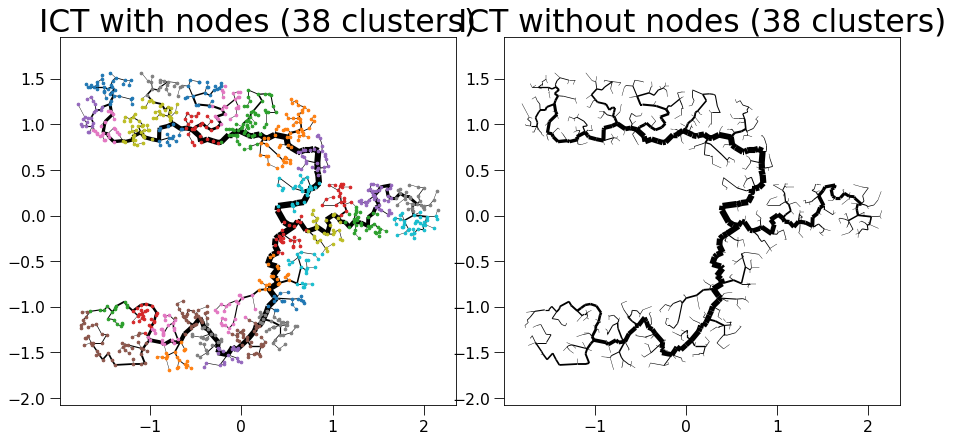

sklearn is done: 0.18724489212036133
My own part is done: 0.0015361309051513672


  0%|          | 0/39 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 131
update Arr 131 -> 98
update Arr 98 -> 78
update Arr 78 -> 65
update Arr 65 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 125
update Arr 125 -> 103
update Arr 103 -> 92
update Arr 92 -> 74
update Arr 74 -> 66
update Arr 66 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 206 -> 184
update Arr 184 -> 159
update Arr 159 -> 143
update Arr 143 -> 121
update Arr 121 -> 104
update Arr 104 -> 85
update Arr 85 -> 77
update Arr 77 -> 65
update Arr 65 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 91
update Arr 91 -> 79
update Arr 79 -> 70
update Arr 70 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 34
update Arr 34 -> 30
update Arr 30 -> 24
update Arr 24 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 205 -> 179
update Arr 179 -> 149
update Arr 149 -> 132
update Arr 132 -> 119
update Arr 119 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 74
update Arr 74 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 229 -> 199
update Arr 199 -> 170
update Arr 170 -> 154
update Arr 154 -> 138
update Arr 138 -> 123
update Arr 123 -> 108
update Arr 108 -> 95
update Arr 95 -> 80
update Arr 80 -> 71
update Arr 71 -> 59
update Arr 59 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 129 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/278 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/278 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 278 -> 238
update Arr 238 -> 215
update Arr 215 -> 190
update Arr 190 -> 165
update Arr 165 -> 146
update Arr 146 -> 128
update Arr 128 -> 114
update Arr 114 -> 101
update Arr 101 -> 87
update Arr 87 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 107
update Arr 107 -> 81
update Arr 81 -> 72
update Arr 72 -> 64
update Arr 64 -> 47
update Arr 47 -> 36
update Arr 36 -> 29
update Arr 29 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 141
update Arr 141 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/291 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/291 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 291 -> 259
update Arr 259 -> 222
update Arr 222 -> 192
update Arr 192 -> 171
update Arr 171 -> 155
update Arr 155 -> 135
update Arr 135 -> 118
update Arr 118 -> 104
update Arr 104 -> 92
update Arr 92 -> 82
update Arr 82 -> 67
update Arr 67 -> 57
update Arr 57 -> 50
update Arr 50 -> 47
update Arr 47 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 246 -> 208
update Arr 208 -> 172
update Arr 172 -> 149
update Arr 149 -> 132
update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 92
update Arr 92 -> 81
update Arr 81 -> 68
update Arr 68 -> 57
update Arr 57 -> 46
update Arr 46 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 218 -> 178
update Arr 178 -> 154
update Arr 154 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 91
update Arr 91 -> 80
update Arr 80 -> 70
update Arr 70 -> 47
update Arr 47 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 57
update Arr 57 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 26
update Arr 26 -> 23
update Arr 23 -> 15
update Arr 15 -> 14
update Arr 14 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 119
update Arr 119 -> 102
update Arr 102 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 75
update Arr 75 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 123
update Arr 123 -> 111
update Arr 111 -> 95
update Arr 95 -> 83
update Arr 83 -> 73
update Arr 73 -> 59
update Arr 59 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 225 -> 177
update Arr 177 -> 159
update Arr 159 -> 141
update Arr 141 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 77
update Arr 77 -> 65
update Arr 65 -> 57
update Arr 57 -> 43
update Arr 43 -> 40
update Arr 40 -> 36
update Arr 36 -> 34
update Arr 34 -> 31
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 164 -> 134
update Arr 134 -> 117
update Arr 117 -> 91
update Arr 91 -> 80
update Arr 80 -> 66
update Arr 66 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 88
update Arr 88 -> 64
update Arr 64 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 28
update Arr 28 -> 20
update Arr 20 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 267 -> 229
update Arr 229 -> 208
update Arr 208 -> 183
update Arr 183 -> 164
update Arr 164 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 95
update Arr 95 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 45
update Arr 45 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 39
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 100
update Arr 100 -> 83
update Arr 83 -> 70
update Arr 70 -> 62
update Arr 62 -> 45
update Arr 45 -> 36
update Arr 36 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 229 -> 204
update Arr 204 -> 180
update Arr 180 -> 163
update Arr 163 -> 142
update Arr 142 -> 125
update Arr 125 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 76
update Arr 76 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 34
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 150
update Arr 150 -> 132
update Arr 132 -> 119
update Arr 119 -> 106
update Arr 106 -> 92
update Arr 92 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 165 -> 141
update Arr 141 -> 119
update Arr 119 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 31
update Arr 31 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 120
update Arr 120 -> 103
update Arr 103 -> 92
update Arr 92 -> 80
update Arr 80 -> 72
update Arr 72 -> 59
update Arr 59 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/216 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/216 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 216 -> 182
update Arr 182 -> 165
update Arr 165 -> 148
update Arr 148 -> 126
update Arr 126 -> 112
update Arr 112 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 138
update Arr 138 -> 118
update Arr 118 -> 105
update Arr 105 -> 72
update Arr 72 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 108 -> 85
update Arr 85 -> 67
update Arr 67 -> 53
update Arr 53 -> 46
update Arr 46 -> 35
update Arr 35 -> 31
update Arr 31 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 44
update Arr 44 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 126 -> 113
update Arr 113 -> 95
update Arr 95 -> 83
update Arr 83 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 123
update Arr 123 -> 109
update Arr 109 -> 93
update Arr 93 -> 83
update Arr 83 -> 68
update Arr 68 -> 57
update Arr 57 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 132
update Arr 132 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 76
update Arr 76 -> 57
update Arr 57 -> 48
update Arr 48 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 152
update Arr 152 -> 129
update Arr 129 -> 105
update Arr 105 -> 93
update Arr 93 -> 74
update Arr 74 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 183 -> 159
update Arr 159 -> 143
update Arr 143 -> 126
update Arr 126 -> 113
update Arr 113 -> 98
update Arr 98 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28


Patching the components together:   0%|          | 0/39 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1068 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1068 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1068 -> 1008
added 275 edges early
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 403 edges early


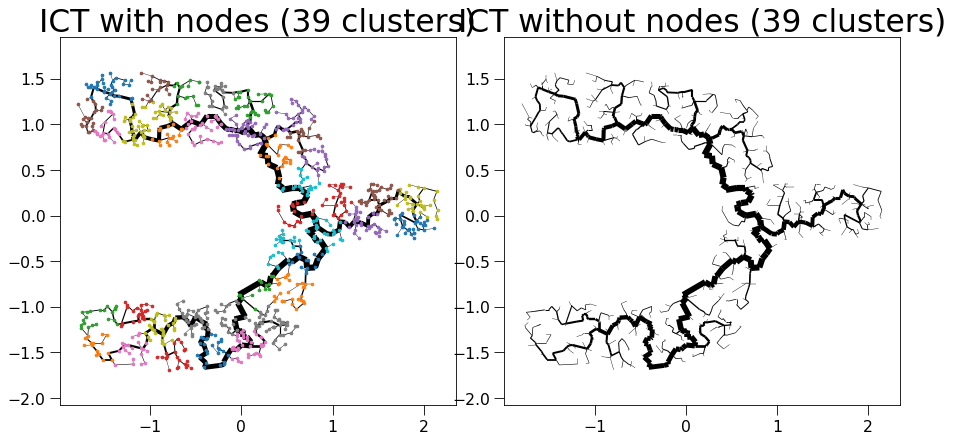

sklearn is done: 0.18724918365478516
My own part is done: 0.0014014244079589844


  0%|          | 0/40 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 228 -> 196
update Arr 196 -> 167
update Arr 167 -> 150
update Arr 150 -> 128
update Arr 128 -> 112
update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 185 -> 163
update Arr 163 -> 108
update Arr 108 -> 96
update Arr 96 -> 86
update Arr 86 -> 68
update Arr 68 -> 57
update Arr 57 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 153
update Arr 153 -> 137
update Arr 137 -> 118
update Arr 118 -> 106
update Arr 106 -> 92
update Arr 92 -> 81
update Arr 81 -> 66
update Arr 66 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 168 -> 152
update Arr 152 -> 136
update Arr 136 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 79
update Arr 79 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 92
update Arr 92 -> 81
update Arr 81 -> 71
update Arr 71 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 97
update Arr 97 -> 84
update Arr 84 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 27
update Arr 27 -> 24
update Arr 24 -> 24
update Arr 24 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 121 -> 107
update Arr 107 -> 90
update Arr 90 -> 75
update Arr 75 -> 59
update Arr 59 -> 49
update Arr 49 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 131
update Arr 131 -> 113
update Arr 113 -> 84
update Arr 84 -> 67
update Arr 67 -> 50
update Arr 50 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 53
update Arr 53 -> 38
update Arr 38 -> 34
update Arr 34 -> 24
update Arr 24 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 198 -> 173
update Arr 173 -> 150
update Arr 150 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 90
update Arr 90 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 53
update Arr 53 -> 44
update Arr 44 -> 33
update Arr 33 -> 27
update Arr 27 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 140 -> 107
update Arr 107 -> 94
update Arr 94 -> 84
update Arr 84 -> 72
update Arr 72 -> 56
update Arr 56 -> 47
update Arr 47 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
Final k: 11


create edgeId array:   0%|          | 0/246 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/246 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 246 -> 214
update Arr 214 -> 191
update Arr 191 -> 168
update Arr 168 -> 146
update Arr 146 -> 130
update Arr 130 -> 117
update Arr 117 -> 106
update Arr 106 -> 93
update Arr 93 -> 75
update Arr 75 -> 65
update Arr 65 -> 56
update Arr 56 -> 50
update Arr 50 -> 44
update Arr 44 -> 42
update Arr 42 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 187 -> 169
update Arr 169 -> 135
update Arr 135 -> 115
update Arr 115 -> 98
update Arr 98 -> 86
update Arr 86 -> 73
update Arr 73 -> 64
update Arr 64 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 165
update Arr 165 -> 142
update Arr 142 -> 126
update Arr 126 -> 108
update Arr 108 -> 94
update Arr 94 -> 79
update Arr 79 -> 67
update Arr 67 -> 53
update Arr 53 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 86
update Arr 86 -> 78
update Arr 78 -> 63
update Arr 63 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 90
update Arr 90 -> 74
update Arr 74 -> 62
update Arr 62 -> 47
update Arr 47 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 116
update Arr 116 -> 102
update Arr 102 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 181 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 107
update Arr 107 -> 94
update Arr 94 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 49
update Arr 49 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 105
update Arr 105 -> 95
update Arr 95 -> 82
update Arr 82 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 182 -> 162
update Arr 162 -> 125
update Arr 125 -> 112
update Arr 112 -> 97
update Arr 97 -> 83
update Arr 83 -> 74
update Arr 74 -> 64
update Arr 64 -> 55
update Arr 55 -> 44
update Arr 44 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 176
update Arr 176 -> 157
update Arr 157 -> 139
update Arr 139 -> 125
update Arr 125 -> 110
update Arr 110 -> 86
update Arr 86 -> 75
update Arr 75 -> 63
update Arr 63 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/278 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/278 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 278 -> 241
update Arr 241 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 146
update Arr 146 -> 131
update Arr 131 -> 112
update Arr 112 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 85
update Arr 85 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 44
update Arr 44 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 98
update Arr 98 -> 88
update Arr 88 -> 75
update Arr 75 -> 66
update Arr 66 -> 59
update Arr 59 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 123
update Arr 123 -> 103
update Arr 103 -> 87
update Arr 87 -> 78
update Arr 78 -> 65
update Arr 65 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 167 -> 143
update Arr 143 -> 123
update Arr 123 -> 104
update Arr 104 -> 94
update Arr 94 -> 80
update Arr 80 -> 70
update Arr 70 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 223 -> 191
update Arr 191 -> 162
update Arr 162 -> 146
update Arr 146 -> 130
update Arr 130 -> 114
update Arr 114 -> 101
update Arr 101 -> 87
update Arr 87 -> 71
update Arr 71 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 201 -> 163
update Arr 163 -> 146
update Arr 146 -> 131
update Arr 131 -> 116
update Arr 116 -> 99
update Arr 99 -> 80
update Arr 80 -> 71
update Arr 71 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 212 -> 172
update Arr 172 -> 149
update Arr 149 -> 133
update Arr 133 -> 114
update Arr 114 -> 100
update Arr 100 -> 86
update Arr 86 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 172 -> 140
update Arr 140 -> 123
update Arr 123 -> 106
update Arr 106 -> 93
update Arr 93 -> 79
update Arr 79 -> 63
update Arr 63 -> 54
update Arr 54 -> 48
update Arr 48 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 171 -> 155
update Arr 155 -> 140
update Arr 140 -> 123
update Arr 123 -> 109
update Arr 109 -> 99
update Arr 99 -> 81
update Arr 81 -> 72
update Arr 72 -> 64
update Arr 64 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 183 -> 164
update Arr 164 -> 144
update Arr 144 -> 127
update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 183 -> 155
update Arr 155 -> 137
update Arr 137 -> 124
update Arr 124 -> 105
update Arr 105 -> 93
update Arr 93 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 112
update Arr 112 -> 100
update Arr 100 -> 75
update Arr 75 -> 61
update Arr 61 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 136
update Arr 136 -> 118
update Arr 118 -> 92
update Arr 92 -> 80
update Arr 80 -> 71
update Arr 71 -> 64
update Arr 64 -> 52
update Arr 52 -> 41
update Arr 41 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 127
update Arr 127 -> 111
update Arr 111 -> 96
update Arr 96 -> 81
update Arr 81 -> 54
update Arr 54 -> 44
update Arr 44 -> 39
update Arr 39 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 113
update Arr 113 -> 98
update Arr 98 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20


Patching the components together:   0%|          | 0/40 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1070 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1070 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1070 -> 1009
added 274 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
added 2 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr

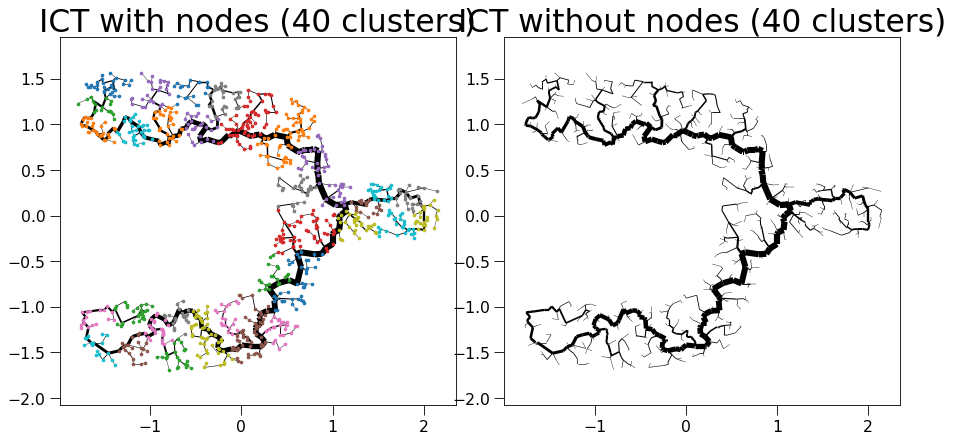

sklearn is done: 0.2147986888885498
My own part is done: 0.0010440349578857422


  0%|          | 0/41 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 104
update Arr 104 -> 93
update Arr 93 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 47
update Arr 47 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/106 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/106 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 106 -> 76
update Arr 76 -> 67
update Arr 67 -> 58
update Arr 58 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 137
update Arr 137 -> 113
update Arr 113 -> 102
update Arr 102 -> 89
update Arr 89 -> 79
update Arr 79 -> 55
update Arr 55 -> 49
update Arr 49 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 213 -> 183
update Arr 183 -> 164
update Arr 164 -> 144
update Arr 144 -> 128
update Arr 128 -> 110
update Arr 110 -> 98
update Arr 98 -> 85
update Arr 85 -> 77
update Arr 77 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 36
update Arr 36 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 139
update Arr 139 -> 125
update Arr 125 -> 103
update Arr 103 -> 91
update Arr 91 -> 74
update Arr 74 -> 64
update Arr 64 -> 56
update Arr 56 -> 47
update Arr 47 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 141
update Arr 141 -> 124
update Arr 124 -> 106
update Arr 106 -> 94
update Arr 94 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 85
update Arr 85 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/257 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/257 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 257 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 168
update Arr 168 -> 140
update Arr 140 -> 122
update Arr 122 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 53
update Arr 53 -> 44
update Arr 44 -> 43
update Arr 43 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 151 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 98
update Arr 98 -> 81
update Arr 81 -> 73
update Arr 73 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 77
update Arr 77 -> 60
update Arr 60 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 118
update Arr 118 -> 105
update Arr 105 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 53
update Arr 53 -> 48
update Arr 48 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 200 -> 163
update Arr 163 -> 139
update Arr 139 -> 119
update Arr 119 -> 106
update Arr 106 -> 93
update Arr 93 -> 84
update Arr 84 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 193 -> 169
update Arr 169 -> 150
update Arr 150 -> 129
update Arr 129 -> 112
update Arr 112 -> 98
update Arr 98 -> 82
update Arr 82 -> 73
update Arr 73 -> 64
update Arr 64 -> 52
update Arr 52 -> 36
update Arr 36 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 171 -> 152
update Arr 152 -> 132
update Arr 132 -> 118
update Arr 118 -> 100
update Arr 100 -> 86
update Arr 86 -> 77
update Arr 77 -> 66
update Arr 66 -> 51
update Arr 51 -> 45
update Arr 45 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 158
update Arr 158 -> 132
update Arr 132 -> 118
update Arr 118 -> 100
update Arr 100 -> 89
update Arr 89 -> 75
update Arr 75 -> 60
update Arr 60 -> 50
update Arr 50 -> 44
update Arr 44 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 140
update Arr 140 -> 116
update Arr 116 -> 104
update Arr 104 -> 88
update Arr 88 -> 78
update Arr 78 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 107
update Arr 107 -> 93
update Arr 93 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 183 -> 160
update Arr 160 -> 135
update Arr 135 -> 114
update Arr 114 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 174 -> 150
update Arr 150 -> 130
update Arr 130 -> 115
update Arr 115 -> 90
update Arr 90 -> 80
update Arr 80 -> 70
update Arr 70 -> 63
update Arr 63 -> 52
update Arr 52 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 125
update Arr 125 -> 111
update Arr 111 -> 97
update Arr 97 -> 85
update Arr 85 -> 67
update Arr 67 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 201 -> 164
update Arr 164 -> 147
update Arr 147 -> 130
update Arr 130 -> 118
update Arr 118 -> 102
update Arr 102 -> 88
update Arr 88 -> 78
update Arr 78 -> 67
update Arr 67 -> 54
update Arr 54 -> 44
update Arr 44 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 122
update Arr 122 -> 102
update Arr 102 -> 92
update Arr 92 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 222 -> 195
update Arr 195 -> 168
update Arr 168 -> 152
update Arr 152 -> 137
update Arr 137 -> 120
update Arr 120 -> 103
update Arr 103 -> 93
update Arr 93 -> 83
update Arr 83 -> 72
update Arr 72 -> 65
update Arr 65 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 117
update Arr 117 -> 105
update Arr 105 -> 91
update Arr 91 -> 82
update Arr 82 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 139
update Arr 139 -> 123
update Arr 123 -> 111
update Arr 111 -> 90
update Arr 90 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 38
update Arr 38 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 185 -> 159
update Arr 159 -> 142
update Arr 142 -> 121
update Arr 121 -> 108
update Arr 108 -> 96
update Arr 96 -> 86
update Arr 86 -> 75
update Arr 75 -> 67
update Arr 67 -> 60
update Arr 60 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 258 -> 212
update Arr 212 -> 191
update Arr 191 -> 171
update Arr 171 -> 150
update Arr 150 -> 133
update Arr 133 -> 114
update Arr 114 -> 100
update Arr 100 -> 87
update Arr 87 -> 76
update Arr 76 -> 62
update Arr 62 -> 51
update Arr 51 -> 44
update Arr 44 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 141 -> 124
update Arr 124 -> 98
update Arr 98 -> 83
update Arr 83 -> 75
update Arr 75 -> 57
update Arr 57 -> 46
update Arr 46 -> 38
update Arr 38 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 53
update Arr 53 -> 38
update Arr 38 -> 34
update Arr 34 -> 24
update Arr 24 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 99
update Arr 99 -> 86
update Arr 86 -> 68
update Arr 68 -> 55
update Arr 55 -> 44
update Arr 44 -> 35
update Arr 35 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 208 -> 169
update Arr 169 -> 151
update Arr 151 -> 136
update Arr 136 -> 115
update Arr 115 -> 103
update Arr 103 -> 93
update Arr 93 -> 79
update Arr 79 -> 67
update Arr 67 -> 58
update Arr 58 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 36
update Arr 36 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 240 -> 204
update Arr 204 -> 182
update Arr 182 -> 165
update Arr 165 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 41
update Arr 41 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 235 -> 210
update Arr 210 -> 183
update Arr 183 -> 156
update Arr 156 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 114
update Arr 114 -> 92
update Arr 92 -> 75
update Arr 75 -> 59
update Arr 59 -> 50
update Arr 50 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 75
update Arr 75 -> 66
update Arr 66 -> 51
update Arr 51 -> 41
update Arr 41 -> 31
update Arr 31 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 160 -> 144
update Arr 144 -> 128
update Arr 128 -> 115
update Arr 115 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 97
update Arr 97 -> 73
update Arr 73 -> 65
update Arr 65 -> 51
update Arr 51 -> 37
update Arr 37 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 126
update Arr 126 -> 101
update Arr 101 -> 84
update Arr 84 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21


Patching the components together:   0%|          | 0/41 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1073 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1073 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1073 -> 1009
added 285 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
up

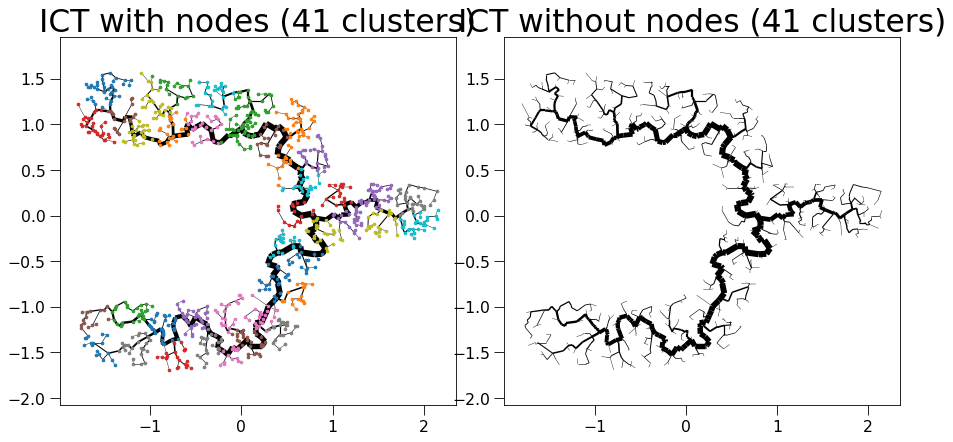

sklearn is done: 0.18903255462646484
My own part is done: 0.0015246868133544922


  0%|          | 0/42 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 150 -> 121
update Arr 121 -> 107
update Arr 107 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 57
update Arr 57 -> 51
update Arr 51 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 191 -> 152
update Arr 152 -> 125
update Arr 125 -> 104
update Arr 104 -> 85
update Arr 85 -> 76
update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 81
update Arr 81 -> 71
update Arr 71 -> 48
update Arr 48 -> 36
update Arr 36 -> 29
update Arr 29 -> 20
update Arr 20 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 235 -> 208
update Arr 208 -> 185
update Arr 185 -> 166
update Arr 166 -> 143
update Arr 143 -> 122
update Arr 122 -> 103
update Arr 103 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 124
update Arr 124 -> 112
update Arr 112 -> 95
update Arr 95 -> 81
update Arr 81 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 193 -> 157
update Arr 157 -> 139
update Arr 139 -> 122
update Arr 122 -> 109
update Arr 109 -> 96
update Arr 96 -> 83
update Arr 83 -> 70
update Arr 70 -> 60
update Arr 60 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 48
update Arr 48 -> 37
update Arr 37 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 86
update Arr 86 -> 54
update Arr 54 -> 46
update Arr 46 -> 33
update Arr 33 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 68
update Arr 68 -> 59
update Arr 59 -> 45
update Arr 45 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 17
update Arr 17 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 135
update Arr 135 -> 120
update Arr 120 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 146
update Arr 146 -> 125
update Arr 125 -> 113
update Arr 113 -> 100
update Arr 100 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/279 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/279 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 279 -> 242
update Arr 242 -> 215
update Arr 215 -> 192
update Arr 192 -> 168
update Arr 168 -> 144
update Arr 144 -> 129
update Arr 129 -> 116
update Arr 116 -> 105
update Arr 105 -> 93
update Arr 93 -> 82
update Arr 82 -> 73
update Arr 73 -> 60
update Arr 60 -> 52
update Arr 52 -> 52
update Arr 52 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 103
update Arr 103 -> 79
update Arr 79 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 129
update Arr 129 -> 104
update Arr 104 -> 93
update Arr 93 -> 84
update Arr 84 -> 73
update Arr 73 -> 62
update Arr 62 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 183 -> 164
update Arr 164 -> 144
update Arr 144 -> 127
update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 158 -> 137
update Arr 137 -> 111
update Arr 111 -> 97
update Arr 97 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 57
update Arr 57 -> 47
update Arr 47 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 83
update Arr 83 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 43
update Arr 43 -> 36
update Arr 36 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 57
update Arr 57 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 22
update Arr 22 -> 18
update Arr 18 -> 13
update Arr 13 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 179
update Arr 179 -> 155
update Arr 155 -> 139
update Arr 139 -> 124
update Arr 124 -> 108
update Arr 108 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 64
update Arr 64 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 61
update Arr 61 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 189 -> 150
update Arr 150 -> 133
update Arr 133 -> 115
update Arr 115 -> 102
update Arr 102 -> 89
update Arr 89 -> 73
update Arr 73 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 106
update Arr 106 -> 82
update Arr 82 -> 72
update Arr 72 -> 53
update Arr 53 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 97
update Arr 97 -> 84
update Arr 84 -> 75
update Arr 75 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 27
update Arr 27 -> 24
update Arr 24 -> 24
update Arr 24 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 133
update Arr 133 -> 102
update Arr 102 -> 92
update Arr 92 -> 82
update Arr 82 -> 63
update Arr 63 -> 52
update Arr 52 -> 38
update Arr 38 -> 33
update Arr 33 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 80
update Arr 80 -> 66
update Arr 66 -> 55
update Arr 55 -> 46
update Arr 46 -> 40
update Arr 40 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 162 -> 136
update Arr 136 -> 113
update Arr 113 -> 97
update Arr 97 -> 87
update Arr 87 -> 72
update Arr 72 -> 65
update Arr 65 -> 59
update Arr 59 -> 49
update Arr 49 -> 38
update Arr 38 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 208 -> 185
update Arr 185 -> 166
update Arr 166 -> 148
update Arr 148 -> 133
update Arr 133 -> 120
update Arr 120 -> 105
update Arr 105 -> 87
update Arr 87 -> 76
update Arr 76 -> 64
update Arr 64 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 33
update Arr 33 -> 32
update Arr 32 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 171 -> 152
update Arr 152 -> 131
update Arr 131 -> 119
update Arr 119 -> 107
update Arr 107 -> 97
update Arr 97 -> 88
update Arr 88 -> 74
update Arr 74 -> 61
update Arr 61 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 103
update Arr 103 -> 92
update Arr 92 -> 81
update Arr 81 -> 72
update Arr 72 -> 59
update Arr 59 -> 47
update Arr 47 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 150
update Arr 150 -> 132
update Arr 132 -> 119
update Arr 119 -> 106
update Arr 106 -> 92
update Arr 92 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 118
update Arr 118 -> 105
update Arr 105 -> 85
update Arr 85 -> 77
update Arr 77 -> 61
update Arr 61 -> 53
update Arr 53 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 241 -> 213
update Arr 213 -> 188
update Arr 188 -> 163
update Arr 163 -> 137
update Arr 137 -> 120
update Arr 120 -> 104
update Arr 104 -> 89
update Arr 89 -> 79
update Arr 79 -> 68
update Arr 68 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 180 -> 139
update Arr 139 -> 125
update Arr 125 -> 105
update Arr 105 -> 89
update Arr 89 -> 77
update Arr 77 -> 62
update Arr 62 -> 52
update Arr 52 -> 46
update Arr 46 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 243 -> 207
update Arr 207 -> 185
update Arr 185 -> 168
update Arr 168 -> 149
update Arr 149 -> 134
update Arr 134 -> 119
update Arr 119 -> 107
update Arr 107 -> 90
update Arr 90 -> 79
update Arr 79 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 43
update Arr 43 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 106
update Arr 106 -> 95
update Arr 95 -> 76
update Arr 76 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 131 -> 111
update Arr 111 -> 93
update Arr 93 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 30
update Arr 30 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 154
update Arr 154 -> 136
update Arr 136 -> 113
update Arr 113 -> 96
update Arr 96 -> 81
update Arr 81 -> 67
update Arr 67 -> 54
update Arr 54 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 133
update Arr 133 -> 117
update Arr 117 -> 102
update Arr 102 -> 92
update Arr 92 -> 82
update Arr 82 -> 73
update Arr 73 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 227 -> 198
update Arr 198 -> 177
update Arr 177 -> 154
update Arr 154 -> 133
update Arr 133 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 84
update Arr 84 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 155 -> 126
update Arr 126 -> 111
update Arr 111 -> 85
update Arr 85 -> 70
update Arr 70 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 36
update Arr 36 -> 29
update Arr 29 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 84
update Arr 84 -> 76
update Arr 76 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 103
update Arr 103 -> 89
update Arr 89 -> 63
update Arr 63 -> 47
update Arr 47 -> 40
update Arr 40 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18


Patching the components together:   0%|          | 0/42 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1075 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1075 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1075 -> 1009
added 279 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1006
added 3 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1000
added 3 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 410 edges early


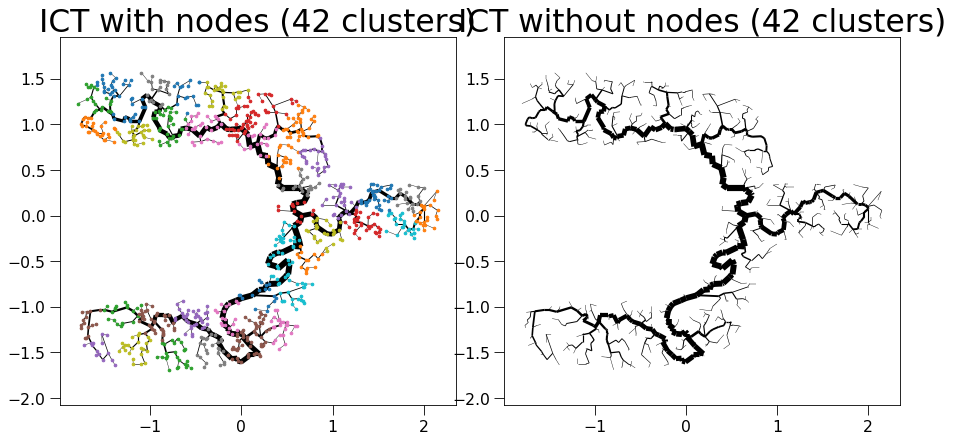

sklearn is done: 0.19709420204162598
My own part is done: 0.0013892650604248047


  0%|          | 0/42 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 117
update Arr 117 -> 105
update Arr 105 -> 91
update Arr 91 -> 82
update Arr 82 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 231 -> 195
update Arr 195 -> 173
update Arr 173 -> 156
update Arr 156 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 60
update Arr 60 -> 50
update Arr 50 -> 45
update Arr 45 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 18
update Arr 18 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 116
update Arr 116 -> 104
update Arr 104 -> 81
update Arr 81 -> 71
update Arr 71 -> 63
update Arr 63 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 96
update Arr 96 -> 85
update Arr 85 -> 74
update Arr 74 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 36
update Arr 36 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 223 -> 190
update Arr 190 -> 168
update Arr 168 -> 152
update Arr 152 -> 135
update Arr 135 -> 121
update Arr 121 -> 103
update Arr 103 -> 92
update Arr 92 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 42
update Arr 42 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 140
update Arr 140 -> 126
update Arr 126 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 67
update Arr 67 -> 55
update Arr 55 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 129
update Arr 129 -> 116
update Arr 116 -> 95
update Arr 95 -> 84
update Arr 84 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 166 -> 149
update Arr 149 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 91
update Arr 91 -> 77
update Arr 77 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 82
update Arr 82 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 50
update Arr 50 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 108
update Arr 108 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 57
update Arr 57 -> 49
update Arr 49 -> 38
update Arr 38 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 137
update Arr 137 -> 119
update Arr 119 -> 98
update Arr 98 -> 89
update Arr 89 -> 71
update Arr 71 -> 48
update Arr 48 -> 40
update Arr 40 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 85
update Arr 85 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 196 -> 161
update Arr 161 -> 139
update Arr 139 -> 120
update Arr 120 -> 108
update Arr 108 -> 96
update Arr 96 -> 74
update Arr 74 -> 54
update Arr 54 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 250 -> 227
update Arr 227 -> 199
update Arr 199 -> 178
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 125
update Arr 125 -> 111
update Arr 111 -> 92
update Arr 92 -> 78
update Arr 78 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 185 -> 166
update Arr 166 -> 140
update Arr 140 -> 126
update Arr 126 -> 109
update Arr 109 -> 98
update Arr 98 -> 82
update Arr 82 -> 68
update Arr 68 -> 61
update Arr 61 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 96
update Arr 96 -> 87
update Arr 87 -> 77
update Arr 77 -> 65
update Arr 65 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 77
update Arr 77 -> 66
update Arr 66 -> 55
update Arr 55 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 91
update Arr 91 -> 73
update Arr 73 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 54
update Arr 54 -> 43
update Arr 43 -> 39
update Arr 39 -> 32
update Arr 32 -> 29
update Arr 29 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 63
update Arr 63 -> 51
update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 242 -> 216
update Arr 216 -> 189
update Arr 189 -> 162
update Arr 162 -> 137
update Arr 137 -> 120
update Arr 120 -> 106
update Arr 106 -> 91
update Arr 91 -> 82
update Arr 82 -> 69
update Arr 69 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 119
update Arr 119 -> 84
update Arr 84 -> 66
update Arr 66 -> 56
update Arr 56 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 219 -> 194
update Arr 194 -> 176
update Arr 176 -> 155
update Arr 155 -> 135
update Arr 135 -> 111
update Arr 111 -> 94
update Arr 94 -> 83
update Arr 83 -> 70
update Arr 70 -> 60
update Arr 60 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 139
update Arr 139 -> 118
update Arr 118 -> 94
update Arr 94 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 217 -> 185
update Arr 185 -> 160
update Arr 160 -> 132
update Arr 132 -> 115
update Arr 115 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 58
update Arr 58 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 136 -> 112
update Arr 112 -> 100
update Arr 100 -> 83
update Arr 83 -> 75
update Arr 75 -> 64
update Arr 64 -> 56
update Arr 56 -> 44
update Arr 44 -> 35
update Arr 35 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 148 -> 134
update Arr 134 -> 119
update Arr 119 -> 107
update Arr 107 -> 97
update Arr 97 -> 83
update Arr 83 -> 74
update Arr 74 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 115
update Arr 115 -> 99
update Arr 99 -> 87
update Arr 87 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 178
update Arr 178 -> 156
update Arr 156 -> 138
update Arr 138 -> 124
update Arr 124 -> 110
update Arr 110 -> 98
update Arr 98 -> 84
update Arr 84 -> 74
update Arr 74 -> 59
update Arr 59 -> 50
update Arr 50 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 140
update Arr 140 -> 116
update Arr 116 -> 104
update Arr 104 -> 88
update Arr 88 -> 78
update Arr 78 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 86
update Arr 86 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 123
update Arr 123 -> 109
update Arr 109 -> 93
update Arr 93 -> 83
update Arr 83 -> 68
update Arr 68 -> 57
update Arr 57 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 192 -> 161
update Arr 161 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 99
update Arr 99 -> 85
update Arr 85 -> 68
update Arr 68 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 33
update Arr 33 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 65
update Arr 65 -> 53
update Arr 53 -> 42
update Arr 42 -> 38
update Arr 38 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 159 -> 142
update Arr 142 -> 126
update Arr 126 -> 109
update Arr 109 -> 98
update Arr 98 -> 87
update Arr 87 -> 69
update Arr 69 -> 56
update Arr 56 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 154
update Arr 154 -> 131
update Arr 131 -> 114
update Arr 114 -> 100
update Arr 100 -> 89
update Arr 89 -> 75
update Arr 75 -> 60
update Arr 60 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 142
update Arr 142 -> 120
update Arr 120 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 69
update Arr 69 -> 56
update Arr 56 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23


Patching the components together:   0%|          | 0/42 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1071 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1071 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1071 -> 1009
added 264 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
added 4 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1002
added 5 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 394 edges early


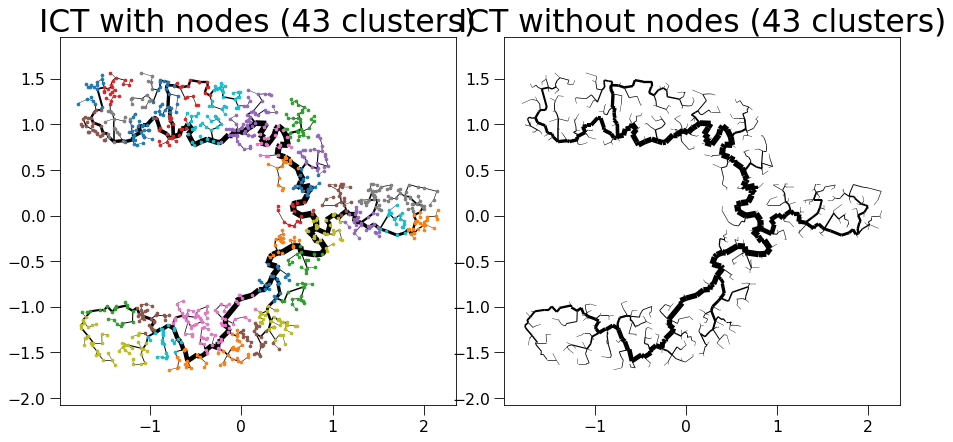

sklearn is done: 0.21696925163269043
My own part is done: 0.0017070770263671875


  0%|          | 0/44 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 128
update Arr 128 -> 113
update Arr 113 -> 102
update Arr 102 -> 87
update Arr 87 -> 78
update Arr 78 -> 60
update Arr 60 -> 49
update Arr 49 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 179
update Arr 179 -> 158
update Arr 158 -> 136
update Arr 136 -> 119
update Arr 119 -> 106
update Arr 106 -> 95
update Arr 95 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 41
update Arr 41 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 114
update Arr 114 -> 100
update Arr 100 -> 86
update Arr 86 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 45
update Arr 45 -> 37
update Arr 37 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 150 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 171
update Arr 171 -> 152
update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 107
update Arr 107 -> 97
update Arr 97 -> 88
update Arr 88 -> 77
update Arr 77 -> 66
update Arr 66 -> 58
update Arr 58 -> 48
update Arr 48 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 139
update Arr 139 -> 118
update Arr 118 -> 94
update Arr 94 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 62
update Arr 62 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 126
update Arr 126 -> 104
update Arr 104 -> 93
update Arr 93 -> 74
update Arr 74 -> 67
update Arr 67 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 35
update Arr 35 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 201 -> 182
update Arr 182 -> 164
update Arr 164 -> 140
update Arr 140 -> 110
update Arr 110 -> 93
update Arr 93 -> 83
update Arr 83 -> 73
update Arr 73 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 108
update Arr 108 -> 94
update Arr 94 -> 77
update Arr 77 -> 66
update Arr 66 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 102
update Arr 102 -> 92
update Arr 92 -> 80
update Arr 80 -> 67
update Arr 67 -> 51
update Arr 51 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 106
update Arr 106 -> 95
update Arr 95 -> 77
update Arr 77 -> 58
update Arr 58 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 117
update Arr 117 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 137
update Arr 137 -> 118
update Arr 118 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 54
update Arr 54 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 154 -> 112
update Arr 112 -> 101
update Arr 101 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 56
update Arr 56 -> 50
update Arr 50 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/242 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/242 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 242 -> 216
update Arr 216 -> 189
update Arr 189 -> 162
update Arr 162 -> 137
update Arr 137 -> 120
update Arr 120 -> 106
update Arr 106 -> 91
update Arr 91 -> 82
update Arr 82 -> 69
update Arr 69 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 112 -> 84
update Arr 84 -> 74
update Arr 74 -> 66
update Arr 66 -> 57
update Arr 57 -> 45
update Arr 45 -> 38
update Arr 38 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 94
update Arr 94 -> 75
update Arr 75 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 85
update Arr 85 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 102
update Arr 102 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 68
update Arr 68 -> 55
update Arr 55 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 213 -> 178
update Arr 178 -> 159
update Arr 159 -> 143
update Arr 143 -> 127
update Arr 127 -> 110
update Arr 110 -> 94
update Arr 94 -> 82
update Arr 82 -> 70
update Arr 70 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 183 -> 159
update Arr 159 -> 141
update Arr 141 -> 103
update Arr 103 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 66
update Arr 66 -> 58
update Arr 58 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 29
update Arr 29 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 110
update Arr 110 -> 98
update Arr 98 -> 82
update Arr 82 -> 68
update Arr 68 -> 59
update Arr 59 -> 47
update Arr 47 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 111
update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 79
update Arr 79 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 185 -> 163
update Arr 163 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 86
update Arr 86 -> 76
update Arr 76 -> 68
update Arr 68 -> 47
update Arr 47 -> 41
update Arr 41 -> 31
update Arr 31 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 203 -> 172
update Arr 172 -> 156
update Arr 156 -> 138
update Arr 138 -> 119
update Arr 119 -> 105
update Arr 105 -> 91
update Arr 91 -> 74
update Arr 74 -> 67
update Arr 67 -> 50
update Arr 50 -> 40
update Arr 40 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 140
update Arr 140 -> 121
update Arr 121 -> 101
update Arr 101 -> 87
update Arr 87 -> 78
update Arr 78 -> 65
update Arr 65 -> 55
update Arr 55 -> 44
update Arr 44 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 74
update Arr 74 -> 64
update Arr 64 -> 55
update Arr 55 -> 39
update Arr 39 -> 35
update Arr 35 -> 27
update Arr 27 -> 24
update Arr 24 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 98
update Arr 98 -> 87
update Arr 87 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 112
update Arr 112 -> 93
update Arr 93 -> 75
update Arr 75 -> 68
update Arr 68 -> 53
update Arr 53 -> 48
update Arr 48 -> 40
update Arr 40 -> 35
update Arr 35 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 95
update Arr 95 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 49
update Arr 49 -> 42
update Arr 42 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 100
update Arr 100 -> 83
update Arr 83 -> 70
update Arr 70 -> 62
update Arr 62 -> 45
update Arr 45 -> 36
update Arr 36 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 145
update Arr 145 -> 129
update Arr 129 -> 115
update Arr 115 -> 98
update Arr 98 -> 87
update Arr 87 -> 75
update Arr 75 -> 64
update Arr 64 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 168
update Arr 168 -> 149
update Arr 149 -> 128
update Arr 128 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 127
update Arr 127 -> 108
update Arr 108 -> 96
update Arr 96 -> 84
update Arr 84 -> 72
update Arr 72 -> 62
update Arr 62 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 240 -> 217
update Arr 217 -> 190
update Arr 190 -> 167
update Arr 167 -> 151
update Arr 151 -> 132
update Arr 132 -> 118
update Arr 118 -> 105
update Arr 105 -> 95
update Arr 95 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 56
update Arr 56 -> 49
update Arr 49 -> 44
update Arr 44 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 107
update Arr 107 -> 83
update Arr 83 -> 69
update Arr 69 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 77
update Arr 77 -> 66
update Arr 66 -> 55
update Arr 55 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 121
update Arr 121 -> 105
update Arr 105 -> 95
update Arr 95 -> 81
update Arr 81 -> 72
update Arr 72 -> 56
update Arr 56 -> 50
update Arr 50 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 106
update Arr 106 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 31
update Arr 31 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18


Patching the components together:   0%|          | 0/44 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1082 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1082 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1082 -> 1008
added 284 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1006
added 3 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 999
added 358 edges early


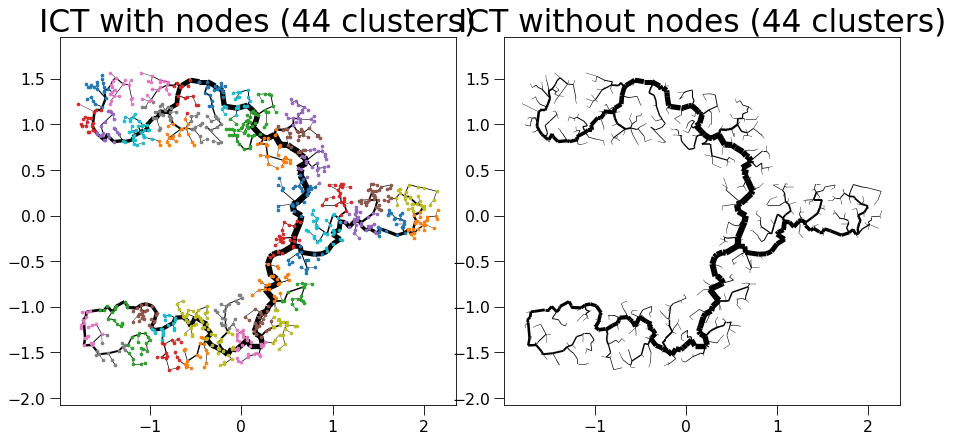

sklearn is done: 0.21434831619262695
My own part is done: 0.0011320114135742188


  0%|          | 0/45 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 138
update Arr 138 -> 122
update Arr 122 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/189 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/189 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 189 -> 161
update Arr 161 -> 144
update Arr 144 -> 126
update Arr 126 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 69
update Arr 69 -> 57
update Arr 57 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 100
update Arr 100 -> 84
update Arr 84 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 124
update Arr 124 -> 109
update Arr 109 -> 97
update Arr 97 -> 69
update Arr 69 -> 58
update Arr 58 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 191 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 112
update Arr 112 -> 97
update Arr 97 -> 88
update Arr 88 -> 71
update Arr 71 -> 63
update Arr 63 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 29
update Arr 29 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 94
update Arr 94 -> 84
update Arr 84 -> 74
update Arr 74 -> 63
update Arr 63 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 197 -> 179
update Arr 179 -> 154
update Arr 154 -> 134
update Arr 134 -> 116
update Arr 116 -> 104
update Arr 104 -> 90
update Arr 90 -> 76
update Arr 76 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 39
update Arr 39 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 121
update Arr 121 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 83
update Arr 83 -> 71
update Arr 71 -> 62
update Arr 62 -> 53
update Arr 53 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 75
update Arr 75 -> 66
update Arr 66 -> 47
update Arr 47 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 61
update Arr 61 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 83
update Arr 83 -> 73
update Arr 73 -> 65
update Arr 65 -> 50
update Arr 50 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 131
update Arr 131 -> 109
update Arr 109 -> 96
update Arr 96 -> 79
update Arr 79 -> 71
update Arr 71 -> 60
update Arr 60 -> 49
update Arr 49 -> 42
update Arr 42 -> 33
update Arr 33 -> 28
update Arr 28 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/276 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/276 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 276 -> 245
update Arr 245 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 155
update Arr 155 -> 140
update Arr 140 -> 125
update Arr 125 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 78
update Arr 78 -> 64
update Arr 64 -> 53
update Arr 53 -> 46
update Arr 46 -> 42
update Arr 42 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 73
update Arr 73 -> 61
update Arr 61 -> 48
update Arr 48 -> 41
update Arr 41 -> 34
update Arr 34 -> 28
update Arr 28 -> 21
update Arr 21 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 162 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 65
update Arr 65 -> 57
update Arr 57 -> 42
update Arr 42 -> 33
update Arr 33 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 106
update Arr 106 -> 95
update Arr 95 -> 76
update Arr 76 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 62
update Arr 62 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 228 -> 183
update Arr 183 -> 138
update Arr 138 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 68
update Arr 68 -> 54
update Arr 54 -> 42
update Arr 42 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 229 -> 204
update Arr 204 -> 179
update Arr 179 -> 156
update Arr 156 -> 136
update Arr 136 -> 120
update Arr 120 -> 107
update Arr 107 -> 97
update Arr 97 -> 88
update Arr 88 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 141 -> 124
update Arr 124 -> 98
update Arr 98 -> 83
update Arr 83 -> 75
update Arr 75 -> 57
update Arr 57 -> 46
update Arr 46 -> 38
update Arr 38 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 200 -> 176
update Arr 176 -> 157
update Arr 157 -> 139
update Arr 139 -> 125
update Arr 125 -> 110
update Arr 110 -> 86
update Arr 86 -> 75
update Arr 75 -> 63
update Arr 63 -> 55
update Arr 55 -> 45
update Arr 45 -> 40
update Arr 40 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 180 -> 149
update Arr 149 -> 134
update Arr 134 -> 108
update Arr 108 -> 93
update Arr 93 -> 73
update Arr 73 -> 63
update Arr 63 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 183 -> 155
update Arr 155 -> 139
update Arr 139 -> 117
update Arr 117 -> 98
update Arr 98 -> 86
update Arr 86 -> 69
update Arr 69 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 192 -> 161
update Arr 161 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 99
update Arr 99 -> 85
update Arr 85 -> 68
update Arr 68 -> 59
update Arr 59 -> 48
update Arr 48 -> 41
update Arr 41 -> 33
update Arr 33 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 66
update Arr 66 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 99
update Arr 99 -> 88
update Arr 88 -> 75
update Arr 75 -> 61
update Arr 61 -> 49
update Arr 49 -> 41
update Arr 41 -> 32
update Arr 32 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 69
update Arr 69 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 103
update Arr 103 -> 92
update Arr 92 -> 82
update Arr 82 -> 69
update Arr 69 -> 59
update Arr 59 -> 50
update Arr 50 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 226 -> 193
update Arr 193 -> 163
update Arr 163 -> 141
update Arr 141 -> 126
update Arr 126 -> 109
update Arr 109 -> 93
update Arr 93 -> 83
update Arr 83 -> 74
update Arr 74 -> 63
update Arr 63 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 79
update Arr 79 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 42
update Arr 42 -> 38
update Arr 38 -> 28
update Arr 28 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 113
update Arr 113 -> 98
update Arr 98 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 141 -> 128
update Arr 128 -> 110
update Arr 110 -> 94
update Arr 94 -> 82
update Arr 82 -> 74
update Arr 74 -> 63
update Arr 63 -> 56
update Arr 56 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 114 -> 102
update Arr 102 -> 84
update Arr 84 -> 73
update Arr 73 -> 59
update Arr 59 -> 53
update Arr 53 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
update Arr 17 -> 17
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 172 -> 149
update Arr 149 -> 134
update Arr 134 -> 116
update Arr 116 -> 105
update Arr 105 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 53
update Arr 53 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 134
update Arr 134 -> 109
update Arr 109 -> 94
update Arr 94 -> 84
update Arr 84 -> 70
update Arr 70 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 63
update Arr 63 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 26
update Arr 26 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 135
update Arr 135 -> 121
update Arr 121 -> 104
update Arr 104 -> 94
update Arr 94 -> 80
update Arr 80 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 75
update Arr 75 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 185 -> 159
update Arr 159 -> 136
update Arr 136 -> 117
update Arr 117 -> 103
update Arr 103 -> 89
update Arr 89 -> 77
update Arr 77 -> 64
update Arr 64 -> 58
update Arr 58 -> 52
update Arr 52 -> 41
update Arr 41 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 145
update Arr 145 -> 124
update Arr 124 -> 110
update Arr 110 -> 92
update Arr 92 -> 80
update Arr 80 -> 65
update Arr 65 -> 55
update Arr 55 -> 48
update Arr 48 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 142
update Arr 142 -> 122
update Arr 122 -> 92
update Arr 92 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22


Patching the components together:   0%|          | 0/45 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1084 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1084 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1084 -> 1009
added 280 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1006
added 3 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 100

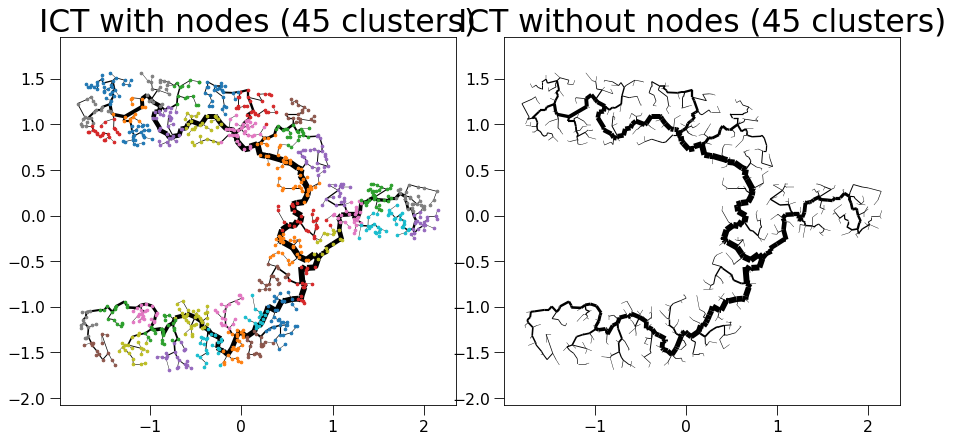

sklearn is done: 0.2243797779083252
My own part is done: 0.0011403560638427734


  0%|          | 0/46 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 127
update Arr 127 -> 113
update Arr 113 -> 99
update Arr 99 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 128
update Arr 128 -> 112
update Arr 112 -> 90
update Arr 90 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 122
update Arr 122 -> 107
update Arr 107 -> 96
update Arr 96 -> 86
update Arr 86 -> 70
update Arr 70 -> 58
update Arr 58 -> 48
update Arr 48 -> 41
update Arr 41 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 117
update Arr 117 -> 99
update Arr 99 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 58
update Arr 58 -> 47
update Arr 47 -> 41
update Arr 41 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 244 -> 210
update Arr 210 -> 183
update Arr 183 -> 166
update Arr 166 -> 141
update Arr 141 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 69
update Arr 69 -> 61
update Arr 61 -> 50
update Arr 50 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 54
update Arr 54 -> 47
update Arr 47 -> 35
update Arr 35 -> 26
update Arr 26 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 76
update Arr 76 -> 59
update Arr 59 -> 46
update Arr 46 -> 41
update Arr 41 -> 33
update Arr 33 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 119
update Arr 119 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 286 -> 257
update Arr 257 -> 232
update Arr 232 -> 209
update Arr 209 -> 188
update Arr 188 -> 169
update Arr 169 -> 148
update Arr 148 -> 128
update Arr 128 -> 112
update Arr 112 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 48
update Arr 48 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 61
update Arr 61 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/224 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/224 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 224 -> 201
update Arr 201 -> 174
update Arr 174 -> 157
update Arr 157 -> 140
update Arr 140 -> 125
update Arr 125 -> 112
update Arr 112 -> 98
update Arr 98 -> 87
update Arr 87 -> 79
update Arr 79 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/267 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/267 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 267 -> 230
update Arr 230 -> 194
update Arr 194 -> 173
update Arr 173 -> 155
update Arr 155 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 37
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 163 -> 133
update Arr 133 -> 119
update Arr 119 -> 86
update Arr 86 -> 74
update Arr 74 -> 65
update Arr 65 -> 51
update Arr 51 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 88
update Arr 88 -> 71
update Arr 71 -> 59
update Arr 59 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 91
update Arr 91 -> 80
update Arr 80 -> 71
update Arr 71 -> 58
update Arr 58 -> 51
update Arr 51 -> 39
update Arr 39 -> 33
update Arr 33 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 231 -> 192
update Arr 192 -> 173
update Arr 173 -> 156
update Arr 156 -> 134
update Arr 134 -> 121
update Arr 121 -> 106
update Arr 106 -> 89
update Arr 89 -> 80
update Arr 80 -> 71
update Arr 71 -> 60
update Arr 60 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 101
update Arr 101 -> 90
update Arr 90 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 116
update Arr 116 -> 93
update Arr 93 -> 71
update Arr 71 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 30
update Arr 30 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 47
update Arr 47 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 235 -> 213
update Arr 213 -> 185
update Arr 185 -> 165
update Arr 165 -> 147
update Arr 147 -> 127
update Arr 127 -> 113
update Arr 113 -> 99
update Arr 99 -> 81
update Arr 81 -> 71
update Arr 71 -> 59
update Arr 59 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 186 -> 158
update Arr 158 -> 141
update Arr 141 -> 124
update Arr 124 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 68
update Arr 68 -> 58
update Arr 58 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 106
update Arr 106 -> 90
update Arr 90 -> 81
update Arr 81 -> 70
update Arr 70 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 126
update Arr 126 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 107
update Arr 107 -> 90
update Arr 90 -> 79
update Arr 79 -> 70
update Arr 70 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 128
update Arr 128 -> 109
update Arr 109 -> 91
update Arr 91 -> 78
update Arr 78 -> 69
update Arr 69 -> 56
update Arr 56 -> 48
update Arr 48 -> 37
update Arr 37 -> 29
update Arr 29 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 158 -> 134
update Arr 134 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 77
update Arr 77 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 103
update Arr 103 -> 92
update Arr 92 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 185 -> 155
update Arr 155 -> 126
update Arr 126 -> 92
update Arr 92 -> 82
update Arr 82 -> 74
update Arr 74 -> 66
update Arr 66 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 44
update Arr 44 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 79
update Arr 79 -> 69
update Arr 69 -> 57
update Arr 57 -> 47
update Arr 47 -> 37
update Arr 37 -> 29
update Arr 29 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 118
update Arr 118 -> 101
update Arr 101 -> 84
update Arr 84 -> 64
update Arr 64 -> 57
update Arr 57 -> 43
update Arr 43 -> 32
update Arr 32 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 75
update Arr 75 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 146 -> 131
update Arr 131 -> 114
update Arr 114 -> 102
update Arr 102 -> 85
update Arr 85 -> 73
update Arr 73 -> 65
update Arr 65 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 65
update Arr 65 -> 54
update Arr 54 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 27
update Arr 27 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 62
update Arr 62 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/88 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/88 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 88 -> 64
update Arr 64 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 103
update Arr 103 -> 90
update Arr 90 -> 81
update Arr 81 -> 67
update Arr 67 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 130 -> 105
update Arr 105 -> 95
update Arr 95 -> 80
update Arr 80 -> 71
update Arr 71 -> 62
update Arr 62 -> 48
update Arr 48 -> 32
update Arr 32 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 108 -> 80
update Arr 80 -> 68
update Arr 68 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 86
update Arr 86 -> 74
update Arr 74 -> 61
update Arr 61 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 30
update Arr 30 -> 21
update Arr 21 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 111
update Arr 111 -> 96
update Arr 96 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 48
update Arr 48 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 114
update Arr 114 -> 100
update Arr 100 -> 82
update Arr 82 -> 68
update Arr 68 -> 49
update Arr 49 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 133
update Arr 133 -> 112
update Arr 112 -> 100
update Arr 100 -> 90
update Arr 90 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22


Patching the components together:   0%|          | 0/46 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1084 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1084 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1084 -> 1009
added 269 edges early
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
added 

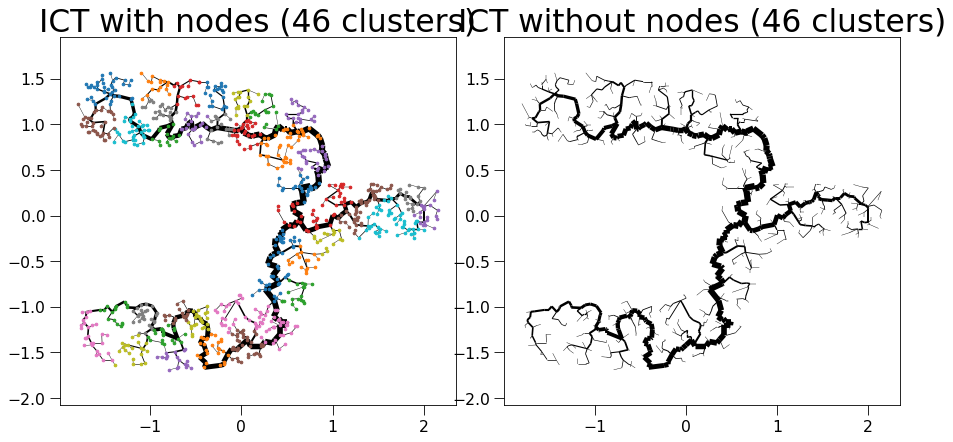

sklearn is done: 0.23151397705078125
My own part is done: 0.0015943050384521484


  0%|          | 0/44 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 107
update Arr 107 -> 83
update Arr 83 -> 69
update Arr 69 -> 58
update Arr 58 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 135
update Arr 135 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 67
update Arr 67 -> 59
update Arr 59 -> 47
update Arr 47 -> 39
update Arr 39 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/224 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/224 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 224 -> 197
update Arr 197 -> 169
update Arr 169 -> 146
update Arr 146 -> 132
update Arr 132 -> 119
update Arr 119 -> 104
update Arr 104 -> 90
update Arr 90 -> 76
update Arr 76 -> 64
update Arr 64 -> 51
update Arr 51 -> 44
update Arr 44 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 198 -> 169
update Arr 169 -> 134
update Arr 134 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 64
update Arr 64 -> 36
update Arr 36 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 153 -> 133
update Arr 133 -> 117
update Arr 117 -> 97
update Arr 97 -> 86
update Arr 86 -> 75
update Arr 75 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 251 -> 221
update Arr 221 -> 198
update Arr 198 -> 176
update Arr 176 -> 154
update Arr 154 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 43
update Arr 43 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 133
update Arr 133 -> 116
update Arr 116 -> 103
update Arr 103 -> 92
update Arr 92 -> 81
update Arr 81 -> 64
update Arr 64 -> 53
update Arr 53 -> 47
update Arr 47 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 86
update Arr 86 -> 78
update Arr 78 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 169 -> 144
update Arr 144 -> 125
update Arr 125 -> 98
update Arr 98 -> 83
update Arr 83 -> 69
update Arr 69 -> 58
update Arr 58 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 167 -> 141
update Arr 141 -> 126
update Arr 126 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 124
update Arr 124 -> 100
update Arr 100 -> 85
update Arr 85 -> 70
update Arr 70 -> 57
update Arr 57 -> 48
update Arr 48 -> 42
update Arr 42 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 193 -> 169
update Arr 169 -> 153
update Arr 153 -> 136
update Arr 136 -> 116
update Arr 116 -> 105
update Arr 105 -> 87
update Arr 87 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 54
update Arr 54 -> 43
update Arr 43 -> 37
update Arr 37 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 152
update Arr 152 -> 133
update Arr 133 -> 119
update Arr 119 -> 103
update Arr 103 -> 87
update Arr 87 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 54
update Arr 54 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/176 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/176 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 176 -> 143
update Arr 143 -> 106
update Arr 106 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 131 -> 119
update Arr 119 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 140
update Arr 140 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 87
update Arr 87 -> 77
update Arr 77 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 174 -> 152
update Arr 152 -> 135
update Arr 135 -> 120
update Arr 120 -> 100
update Arr 100 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 240 -> 209
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 151
update Arr 151 -> 135
update Arr 135 -> 120
update Arr 120 -> 101
update Arr 101 -> 90
update Arr 90 -> 74
update Arr 74 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 112
update Arr 112 -> 91
update Arr 91 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 40
update Arr 40 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 103
update Arr 103 -> 83
update Arr 83 -> 72
update Arr 72 -> 60
update Arr 60 -> 54
update Arr 54 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
update Arr 18 -> 18
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 115
update Arr 115 -> 88
update Arr 88 -> 74
update Arr 74 -> 61
update Arr 61 -> 52
update Arr 52 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 179 -> 162
update Arr 162 -> 144
update Arr 144 -> 119
update Arr 119 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 57
update Arr 57 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/196 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/196 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 196 -> 172
update Arr 172 -> 156
update Arr 156 -> 139
update Arr 139 -> 112
update Arr 112 -> 101
update Arr 101 -> 87
update Arr 87 -> 69
update Arr 69 -> 58
update Arr 58 -> 51
update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 67
update Arr 67 -> 59
update Arr 59 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 18
update Arr 18 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 86
update Arr 86 -> 73
update Arr 73 -> 62
update Arr 62 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 85
update Arr 85 -> 72
update Arr 72 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 140
update Arr 140 -> 125
update Arr 125 -> 111
update Arr 111 -> 100
update Arr 100 -> 83
update Arr 83 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 113
update Arr 113 -> 100
update Arr 100 -> 87
update Arr 87 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 131 -> 112
update Arr 112 -> 100
update Arr 100 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 38
update Arr 38 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 90
update Arr 90 -> 74
update Arr 74 -> 62
update Arr 62 -> 47
update Arr 47 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
Final k: 11


create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 221 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 133 -> 118
update Arr 118 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 56
update Arr 56 -> 45
update Arr 45 -> 37
update Arr 37 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 112
update Arr 112 -> 97
update Arr 97 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 29
update Arr 29 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 112
update Arr 112 -> 99
update Arr 99 -> 86
update Arr 86 -> 75
update Arr 75 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 118
update Arr 118 -> 104
update Arr 104 -> 86
update Arr 86 -> 71
update Arr 71 -> 64
update Arr 64 -> 47
update Arr 47 -> 41
update Arr 41 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 192 -> 169
update Arr 169 -> 152
update Arr 152 -> 131
update Arr 131 -> 119
update Arr 119 -> 103
update Arr 103 -> 90
update Arr 90 -> 78
update Arr 78 -> 69
update Arr 69 -> 59
update Arr 59 -> 53
update Arr 53 -> 46
update Arr 46 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 126
update Arr 126 -> 106
update Arr 106 -> 95
update Arr 95 -> 71
update Arr 71 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 118
update Arr 118 -> 106
update Arr 106 -> 93
update Arr 93 -> 83
update Arr 83 -> 70
update Arr 70 -> 61
update Arr 61 -> 55
update Arr 55 -> 43
update Arr 43 -> 37
update Arr 37 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 91
update Arr 91 -> 78
update Arr 78 -> 62
update Arr 62 -> 55
update Arr 55 -> 42
update Arr 42 -> 38
update Arr 38 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 95
update Arr 95 -> 84
update Arr 84 -> 75
update Arr 75 -> 68
update Arr 68 -> 47
update Arr 47 -> 34
update Arr 34 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 143
update Arr 143 -> 125
update Arr 125 -> 109
update Arr 109 -> 84
update Arr 84 -> 72
update Arr 72 -> 59
update Arr 59 -> 52
update Arr 52 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 107
update Arr 107 -> 86
update Arr 86 -> 75
update Arr 75 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 74
update Arr 74 -> 65
update Arr 65 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 31
update Arr 31 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14


Patching the components together:   0%|          | 0/44 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1073 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1073 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1073 -> 1009
added 273 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 100

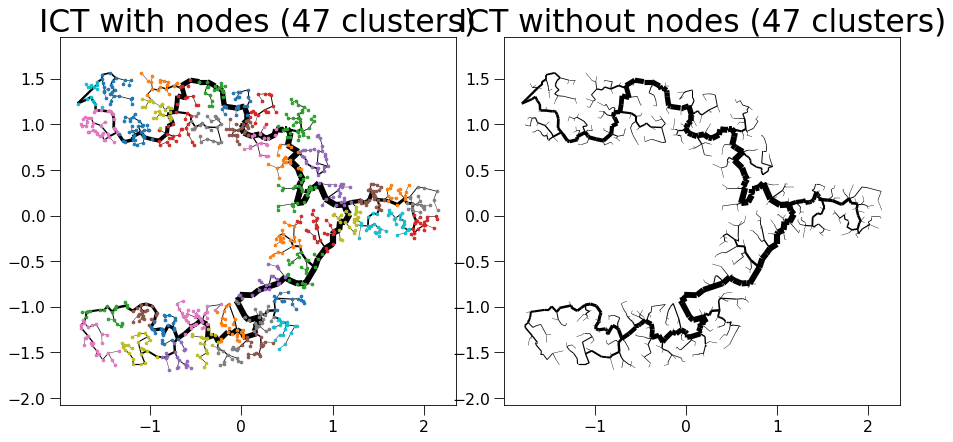

sklearn is done: 0.24373698234558105
My own part is done: 0.0015301704406738281


  0%|          | 0/44 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 112
update Arr 112 -> 99
update Arr 99 -> 74
update Arr 74 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 42
update Arr 42 -> 35
update Arr 35 -> 28
update Arr 28 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 89
update Arr 89 -> 77
update Arr 77 -> 69
update Arr 69 -> 56
update Arr 56 -> 44
update Arr 44 -> 35
update Arr 35 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 133 -> 115
update Arr 115 -> 101
update Arr 101 -> 73
update Arr 73 -> 62
update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 83
update Arr 83 -> 63
update Arr 63 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 33
update Arr 33 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 109
update Arr 109 -> 93
update Arr 93 -> 81
update Arr 81 -> 73
update Arr 73 -> 63
update Arr 63 -> 54
update Arr 54 -> 45
update Arr 45 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 264 -> 224
update Arr 224 -> 188
update Arr 188 -> 167
update Arr 167 -> 141
update Arr 141 -> 128
update Arr 128 -> 114
update Arr 114 -> 101
update Arr 101 -> 89
update Arr 89 -> 72
update Arr 72 -> 65
update Arr 65 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 36
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 213 -> 186
update Arr 186 -> 166
update Arr 166 -> 148
update Arr 148 -> 131
update Arr 131 -> 116
update Arr 116 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 68
update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 41
update Arr 41 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 62
update Arr 62 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 140
update Arr 140 -> 125
update Arr 125 -> 105
update Arr 105 -> 93
update Arr 93 -> 79
update Arr 79 -> 67
update Arr 67 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/272 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/272 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 272 -> 236
update Arr 236 -> 202
update Arr 202 -> 181
update Arr 181 -> 162
update Arr 162 -> 146
update Arr 146 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 156
update Arr 156 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 86
update Arr 86 -> 73
update Arr 73 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 37
update Arr 37 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 157 -> 141
update Arr 141 -> 125
update Arr 125 -> 110
update Arr 110 -> 99
update Arr 99 -> 84
update Arr 84 -> 76
update Arr 76 -> 68
update Arr 68 -> 53
update Arr 53 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 119
update Arr 119 -> 100
update Arr 100 -> 79
update Arr 79 -> 63
update Arr 63 -> 49
update Arr 49 -> 42
update Arr 42 -> 31
update Arr 31 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 107
update Arr 107 -> 93
update Arr 93 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 187 -> 156
update Arr 156 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 57
update Arr 57 -> 50
update Arr 50 -> 41
update Arr 41 -> 37
update Arr 37 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 98
update Arr 98 -> 87
update Arr 87 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 141
update Arr 141 -> 120
update Arr 120 -> 105
update Arr 105 -> 92
update Arr 92 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 52
update Arr 52 -> 45
update Arr 45 -> 31
update Arr 31 -> 30
update Arr 30 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 105
update Arr 105 -> 88
update Arr 88 -> 77
update Arr 77 -> 67
update Arr 67 -> 58
update Arr 58 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 97
update Arr 97 -> 76
update Arr 76 -> 63
update Arr 63 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 231 -> 195
update Arr 195 -> 173
update Arr 173 -> 156
update Arr 156 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 42
update Arr 42 -> 40
update Arr 40 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 154
update Arr 154 -> 137
update Arr 137 -> 117
update Arr 117 -> 95
update Arr 95 -> 86
update Arr 86 -> 76
update Arr 76 -> 68
update Arr 68 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 30
update Arr 30 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 235 -> 210
update Arr 210 -> 183
update Arr 183 -> 156
update Arr 156 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 106
update Arr 106 -> 91
update Arr 91 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 51
update Arr 51 -> 42
update Arr 42 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 128
update Arr 128 -> 111
update Arr 111 -> 95
update Arr 95 -> 84
update Arr 84 -> 72
update Arr 72 -> 64
update Arr 64 -> 55
update Arr 55 -> 46
update Arr 46 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 133
update Arr 133 -> 117
update Arr 117 -> 100
update Arr 100 -> 88
update Arr 88 -> 77
update Arr 77 -> 61
update Arr 61 -> 50
update Arr 50 -> 40
update Arr 40 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 118
update Arr 118 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 68
update Arr 68 -> 57
update Arr 57 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 160 -> 145
update Arr 145 -> 124
update Arr 124 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 75
update Arr 75 -> 62
update Arr 62 -> 51
update Arr 51 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 124
update Arr 124 -> 112
update Arr 112 -> 95
update Arr 95 -> 81
update Arr 81 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 48
update Arr 48 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 125
update Arr 125 -> 109
update Arr 109 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 117
update Arr 117 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 60
update Arr 60 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 180 -> 151
update Arr 151 -> 127
update Arr 127 -> 101
update Arr 101 -> 80
update Arr 80 -> 69
update Arr 69 -> 60
update Arr 60 -> 50
update Arr 50 -> 42
update Arr 42 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 106
update Arr 106 -> 91
update Arr 91 -> 76
update Arr 76 -> 66
update Arr 66 -> 57
update Arr 57 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 29
update Arr 29 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 173 -> 142
update Arr 142 -> 123
update Arr 123 -> 109
update Arr 109 -> 94
update Arr 94 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 183 -> 164
update Arr 164 -> 131
update Arr 131 -> 108
update Arr 108 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 51
update Arr 51 -> 44
update Arr 44 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 104
update Arr 104 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 81
update Arr 81 -> 71
update Arr 71 -> 60
update Arr 60 -> 44
update Arr 44 -> 34
update Arr 34 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 85
update Arr 85 -> 69
update Arr 69 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 118
update Arr 118 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 65
update Arr 65 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 120
update Arr 120 -> 107
update Arr 107 -> 94
update Arr 94 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 43
update Arr 43 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 78
update Arr 78 -> 65
update Arr 65 -> 48
update Arr 48 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 225 -> 191
update Arr 191 -> 168
update Arr 168 -> 151
update Arr 151 -> 132
update Arr 132 -> 114
update Arr 114 -> 98
update Arr 98 -> 83
update Arr 83 -> 75
update Arr 75 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 106
update Arr 106 -> 90
update Arr 90 -> 76
update Arr 76 -> 66
update Arr 66 -> 52
update Arr 52 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17


Patching the components together:   0%|          | 0/44 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1077 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1077 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1077 -> 1009
added 265 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1005
added 3 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1001
added 4 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 378 edges early


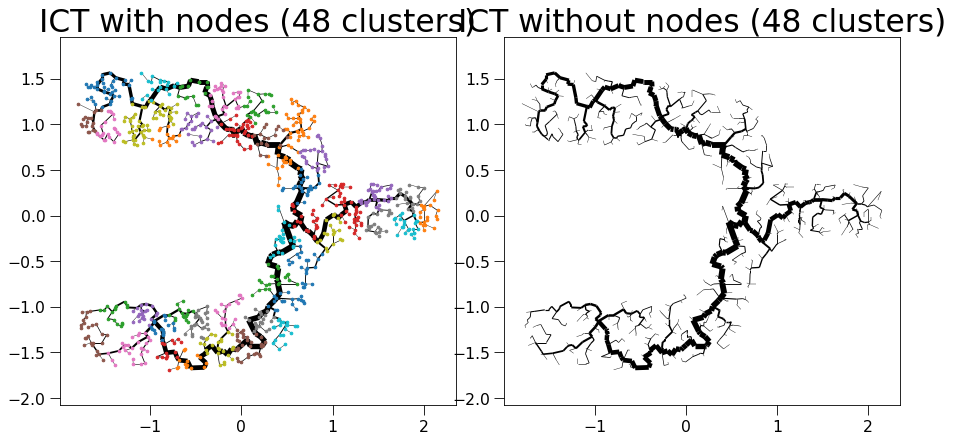

sklearn is done: 0.2066495418548584
My own part is done: 0.0011548995971679688


  0%|          | 0/44 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 91
update Arr 91 -> 77
update Arr 77 -> 66
update Arr 66 -> 57
update Arr 57 -> 47
update Arr 47 -> 37
update Arr 37 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 218 -> 197
update Arr 197 -> 178
update Arr 178 -> 156
update Arr 156 -> 138
update Arr 138 -> 123
update Arr 123 -> 110
update Arr 110 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 58
update Arr 58 -> 47
update Arr 47 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
Final k: 11


create edgeId array:   0%|          | 0/235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 235 -> 210
update Arr 210 -> 183
update Arr 183 -> 156
update Arr 156 -> 132
update Arr 132 -> 115
update Arr 115 -> 101
update Arr 101 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 48
update Arr 48 -> 43
update Arr 43 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 118
update Arr 118 -> 104
update Arr 104 -> 87
update Arr 87 -> 77
update Arr 77 -> 66
update Arr 66 -> 53
update Arr 53 -> 48
update Arr 48 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 181 -> 160
update Arr 160 -> 133
update Arr 133 -> 108
update Arr 108 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 64
update Arr 64 -> 57
update Arr 57 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 33
update Arr 33 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
update Arr 17 -> 14
Final k: 11


create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 249 -> 217
update Arr 217 -> 192
update Arr 192 -> 166
update Arr 166 -> 150
update Arr 150 -> 136
update Arr 136 -> 118
update Arr 118 -> 107
update Arr 107 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 60
update Arr 60 -> 53
update Arr 53 -> 45
update Arr 45 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 35
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 79
update Arr 79 -> 69
update Arr 69 -> 57
update Arr 57 -> 47
update Arr 47 -> 37
update Arr 37 -> 29
update Arr 29 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 113
update Arr 113 -> 89
update Arr 89 -> 78
update Arr 78 -> 70
update Arr 70 -> 61
update Arr 61 -> 54
update Arr 54 -> 42
update Arr 42 -> 34
update Arr 34 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 102
update Arr 102 -> 86
update Arr 86 -> 72
update Arr 72 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 33
update Arr 33 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 107
update Arr 107 -> 93
update Arr 93 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/201 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/201 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 201 -> 163
update Arr 163 -> 148
update Arr 148 -> 129
update Arr 129 -> 115
update Arr 115 -> 99
update Arr 99 -> 84
update Arr 84 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 106
update Arr 106 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 144
update Arr 144 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 92
update Arr 92 -> 82
update Arr 82 -> 65
update Arr 65 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 91
update Arr 91 -> 81
update Arr 81 -> 72
update Arr 72 -> 57
update Arr 57 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 148 -> 126
update Arr 126 -> 110
update Arr 110 -> 93
update Arr 93 -> 82
update Arr 82 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 120
update Arr 120 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 175 -> 151
update Arr 151 -> 137
update Arr 137 -> 120
update Arr 120 -> 106
update Arr 106 -> 92
update Arr 92 -> 80
update Arr 80 -> 71
update Arr 71 -> 58
update Arr 58 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 121
update Arr 121 -> 99
update Arr 99 -> 85
update Arr 85 -> 77
update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 173 -> 144
update Arr 144 -> 115
update Arr 115 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 106
update Arr 106 -> 89
update Arr 89 -> 78
update Arr 78 -> 65
update Arr 65 -> 52
update Arr 52 -> 46
update Arr 46 -> 40
update Arr 40 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 200 -> 161
update Arr 161 -> 143
update Arr 143 -> 129
update Arr 129 -> 110
update Arr 110 -> 98
update Arr 98 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 32
update Arr 32 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 158 -> 141
update Arr 141 -> 114
update Arr 114 -> 91
update Arr 91 -> 82
update Arr 82 -> 65
update Arr 65 -> 52
update Arr 52 -> 42
update Arr 42 -> 33
update Arr 33 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 165
update Arr 165 -> 143
update Arr 143 -> 126
update Arr 126 -> 108
update Arr 108 -> 94
update Arr 94 -> 84
update Arr 84 -> 65
update Arr 65 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 144
update Arr 144 -> 128
update Arr 128 -> 109
update Arr 109 -> 96
update Arr 96 -> 85
update Arr 85 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 47
update Arr 47 -> 34
update Arr 34 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 139 -> 113
update Arr 113 -> 93
update Arr 93 -> 77
update Arr 77 -> 61
update Arr 61 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 99
update Arr 99 -> 83
update Arr 83 -> 65
update Arr 65 -> 47
update Arr 47 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 110
update Arr 110 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 54
update Arr 54 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 134
update Arr 134 -> 114
update Arr 114 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 50
update Arr 50 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 23
update Arr 23 -> 23
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 167 -> 145
update Arr 145 -> 127
update Arr 127 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 172 -> 150
update Arr 150 -> 109
update Arr 109 -> 99
update Arr 99 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 104
update Arr 104 -> 93
update Arr 93 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 47
update Arr 47 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 134 -> 115
update Arr 115 -> 101
update Arr 101 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 162 -> 143
update Arr 143 -> 118
update Arr 118 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 67
update Arr 67 -> 58
update Arr 58 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 158 -> 135
update Arr 135 -> 113
update Arr 113 -> 96
update Arr 96 -> 83
update Arr 83 -> 65
update Arr 65 -> 57
update Arr 57 -> 46
update Arr 46 -> 40
update Arr 40 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 198 -> 168
update Arr 168 -> 149
update Arr 149 -> 128
update Arr 128 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 42
update Arr 42 -> 34
update Arr 34 -> 34
update Arr 34 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 129
update Arr 129 -> 113
update Arr 113 -> 102
update Arr 102 -> 85
update Arr 85 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 22
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 114
update Arr 114 -> 87
update Arr 87 -> 79
update Arr 79 -> 55
update Arr 55 -> 44
update Arr 44 -> 36
update Arr 36 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 87
update Arr 87 -> 71
update Arr 71 -> 61
update Arr 61 -> 41
update Arr 41 -> 37
update Arr 37 -> 27
update Arr 27 -> 25
update Arr 25 -> 18
update Arr 18 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 107
update Arr 107 -> 80
update Arr 80 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 203 -> 178
update Arr 178 -> 152
update Arr 152 -> 137
update Arr 137 -> 124
update Arr 124 -> 105
update Arr 105 -> 90
update Arr 90 -> 80
update Arr 80 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 145
update Arr 145 -> 128
update Arr 128 -> 107
update Arr 107 -> 95
update Arr 95 -> 86
update Arr 86 -> 70
update Arr 70 -> 61
update Arr 61 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 93
update Arr 93 -> 80
update Arr 80 -> 72
update Arr 72 -> 61
update Arr 61 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16


Patching the components together:   0%|          | 0/44 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1081 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1081 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1081 -> 1009
added 275 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1006
added 3 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
up

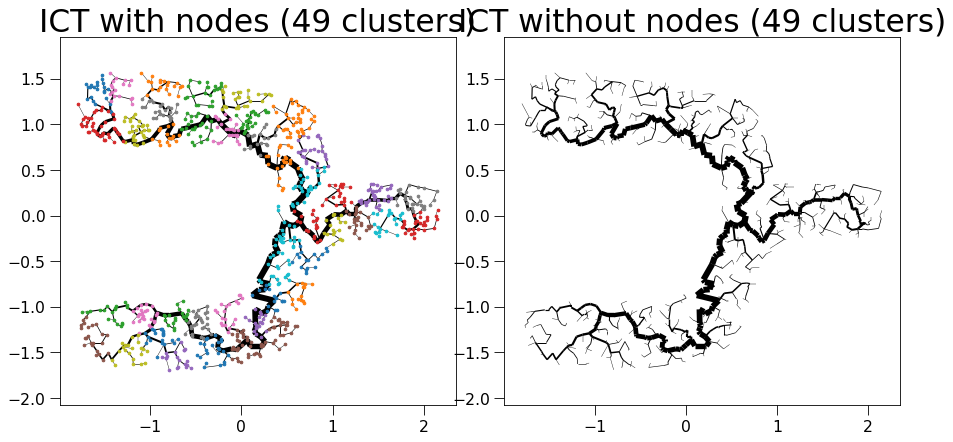

sklearn is done: 0.2225956916809082
My own part is done: 0.0011708736419677734


  0%|          | 0/48 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 142
update Arr 142 -> 129
update Arr 129 -> 114
update Arr 114 -> 99
update Arr 99 -> 89
update Arr 89 -> 76
update Arr 76 -> 65
update Arr 65 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 30
update Arr 30 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/214 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/214 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 214 -> 177
update Arr 177 -> 152
update Arr 152 -> 129
update Arr 129 -> 115
update Arr 115 -> 98
update Arr 98 -> 81
update Arr 81 -> 69
update Arr 69 -> 56
update Arr 56 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 137
update Arr 137 -> 121
update Arr 121 -> 107
update Arr 107 -> 95
update Arr 95 -> 82
update Arr 82 -> 72
update Arr 72 -> 57
update Arr 57 -> 45
update Arr 45 -> 38
update Arr 38 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 76
update Arr 76 -> 64
update Arr 64 -> 56
update Arr 56 -> 44
update Arr 44 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 18
update Arr 18 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 112
update Arr 112 -> 100
update Arr 100 -> 86
update Arr 86 -> 77
update Arr 77 -> 64
update Arr 64 -> 53
update Arr 53 -> 41
update Arr 41 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 125
update Arr 125 -> 111
update Arr 111 -> 97
update Arr 97 -> 85
update Arr 85 -> 67
update Arr 67 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 91
update Arr 91 -> 81
update Arr 81 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 35
update Arr 35 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 95
update Arr 95 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 49
update Arr 49 -> 42
update Arr 42 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 177 -> 155
update Arr 155 -> 124
update Arr 124 -> 111
update Arr 111 -> 95
update Arr 95 -> 85
update Arr 85 -> 75
update Arr 75 -> 67
update Arr 67 -> 46
update Arr 46 -> 40
update Arr 40 -> 30
update Arr 30 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 119
update Arr 119 -> 104
update Arr 104 -> 91
update Arr 91 -> 82
update Arr 82 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 114
update Arr 114 -> 101
update Arr 101 -> 83
update Arr 83 -> 70
update Arr 70 -> 63
update Arr 63 -> 53
update Arr 53 -> 40
update Arr 40 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 102
update Arr 102 -> 91
update Arr 91 -> 67
update Arr 67 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 126 -> 113
update Arr 113 -> 95
update Arr 95 -> 83
update Arr 83 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 99
update Arr 99 -> 85
update Arr 85 -> 70
update Arr 70 -> 61
update Arr 61 -> 50
update Arr 50 -> 40
update Arr 40 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 143 -> 125
update Arr 125 -> 111
update Arr 111 -> 99
update Arr 99 -> 83
update Arr 83 -> 75
update Arr 75 -> 65
update Arr 65 -> 53
update Arr 53 -> 45
update Arr 45 -> 36
update Arr 36 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 74
update Arr 74 -> 64
update Arr 64 -> 55
update Arr 55 -> 39
update Arr 39 -> 35
update Arr 35 -> 27
update Arr 27 -> 24
update Arr 24 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 106
update Arr 106 -> 92
update Arr 92 -> 79
update Arr 79 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 141
update Arr 141 -> 121
update Arr 121 -> 106
update Arr 106 -> 96
update Arr 96 -> 84
update Arr 84 -> 73
update Arr 73 -> 64
update Arr 64 -> 49
update Arr 49 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 195 -> 173
update Arr 173 -> 141
update Arr 141 -> 125
update Arr 125 -> 104
update Arr 104 -> 90
update Arr 90 -> 81
update Arr 81 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 145 -> 131
update Arr 131 -> 114
update Arr 114 -> 92
update Arr 92 -> 76
update Arr 76 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 84
update Arr 84 -> 72
update Arr 72 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 80
update Arr 80 -> 63
update Arr 63 -> 57
update Arr 57 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 157
update Arr 157 -> 138
update Arr 138 -> 125
update Arr 125 -> 108
update Arr 108 -> 91
update Arr 91 -> 81
update Arr 81 -> 71
update Arr 71 -> 64
update Arr 64 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 118
update Arr 118 -> 94
update Arr 94 -> 81
update Arr 81 -> 68
update Arr 68 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 93
update Arr 93 -> 83
update Arr 83 -> 63
update Arr 63 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 198 -> 169
update Arr 169 -> 134
update Arr 134 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 136 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 64
update Arr 64 -> 53
update Arr 53 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 108
update Arr 108 -> 90
update Arr 90 -> 77
update Arr 77 -> 69
update Arr 69 -> 59
update Arr 59 -> 50
update Arr 50 -> 39
update Arr 39 -> 32
update Arr 32 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/157 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/157 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 157 -> 133
update Arr 133 -> 120
update Arr 120 -> 107
update Arr 107 -> 90
update Arr 90 -> 78
update Arr 78 -> 70
update Arr 70 -> 59
update Arr 59 -> 46
update Arr 46 -> 32
update Arr 32 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 123
update Arr 123 -> 99
update Arr 99 -> 86
update Arr 86 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 62
update Arr 62 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 138
update Arr 138 -> 119
update Arr 119 -> 105
update Arr 105 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 44
update Arr 44 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 118
update Arr 118 -> 105
update Arr 105 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 53
update Arr 53 -> 48
update Arr 48 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 142 -> 115
update Arr 115 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 70
update Arr 70 -> 58
update Arr 58 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 169 -> 138
update Arr 138 -> 121
update Arr 121 -> 109
update Arr 109 -> 94
update Arr 94 -> 85
update Arr 85 -> 67
update Arr 67 -> 48
update Arr 48 -> 42
update Arr 42 -> 36
update Arr 36 -> 29
update Arr 29 -> 26
update Arr 26 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 85
update Arr 85 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 52
update Arr 52 -> 38
update Arr 38 -> 27
update Arr 27 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 178 -> 158
update Arr 158 -> 135
update Arr 135 -> 122
update Arr 122 -> 105
update Arr 105 -> 95
update Arr 95 -> 82
update Arr 82 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 46
update Arr 46 -> 38
update Arr 38 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 111
update Arr 111 -> 95
update Arr 95 -> 81
update Arr 81 -> 72
update Arr 72 -> 64
update Arr 64 -> 55
update Arr 55 -> 48
update Arr 48 -> 39
update Arr 39 -> 32
update Arr 32 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 111
update Arr 111 -> 88
update Arr 88 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 53
update Arr 53 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 132
update Arr 132 -> 119
update Arr 119 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 75
update Arr 75 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/97 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/97 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 97 -> 80
update Arr 80 -> 65
update Arr 65 -> 54
update Arr 54 -> 47
update Arr 47 -> 40
update Arr 40 -> 28
update Arr 28 -> 25
update Arr 25 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 113
update Arr 113 -> 97
update Arr 97 -> 69
update Arr 69 -> 55
update Arr 55 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 169 -> 150
update Arr 150 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 91
update Arr 91 -> 82
update Arr 82 -> 69
update Arr 69 -> 58
update Arr 58 -> 46
update Arr 46 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 102
update Arr 102 -> 83
update Arr 83 -> 69
update Arr 69 -> 60
update Arr 60 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 76
update Arr 76 -> 63
update Arr 63 -> 55
update Arr 55 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 19
update Arr 19 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 106
update Arr 106 -> 95
update Arr 95 -> 77
update Arr 77 -> 58
update Arr 58 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 107
update Arr 107 -> 93
update Arr 93 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18


Patching the components together:   0%|          | 0/48 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1079 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1079 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1079 -> 1009
added 276 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1000
added 3 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 332 edges early


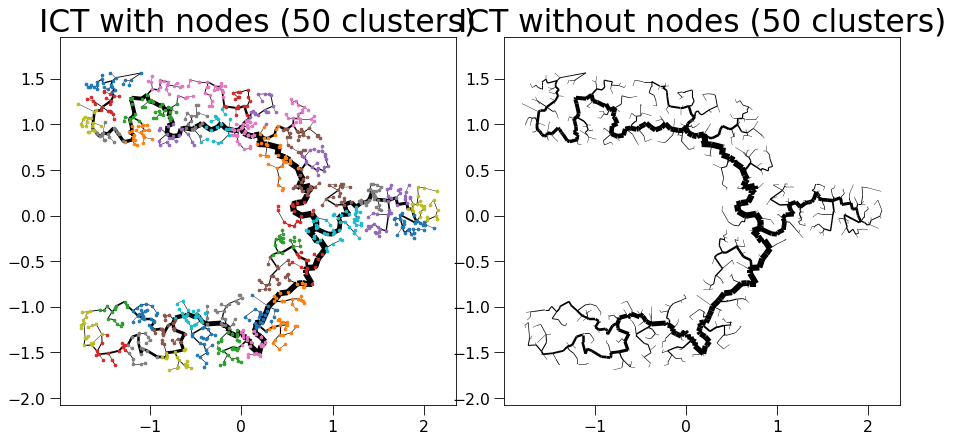

sklearn is done: 0.22392916679382324
My own part is done: 0.001361846923828125


  0%|          | 0/50 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 131
update Arr 131 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 80
update Arr 80 -> 72
update Arr 72 -> 62
update Arr 62 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 197 -> 177
update Arr 177 -> 144
update Arr 144 -> 130
update Arr 130 -> 118
update Arr 118 -> 105
update Arr 105 -> 95
update Arr 95 -> 80
update Arr 80 -> 64
update Arr 64 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 102
update Arr 102 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 53
update Arr 53 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 104
update Arr 104 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 54
update Arr 54 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 27
update Arr 27 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 27
update Arr 27 -> 22
update Arr 22 -> 17
update Arr 17 -> 13
update Arr 13 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 81
update Arr 81 -> 73
update Arr 73 -> 66
update Arr 66 -> 53
update Arr 53 -> 44
update Arr 44 -> 33
update Arr 33 -> 27
update Arr 27 -> 22
update Arr 22 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 61
update Arr 61 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 151 -> 130
update Arr 130 -> 113
update Arr 113 -> 96
update Arr 96 -> 84
update Arr 84 -> 76
update Arr 76 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 36
update Arr 36 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 122
update Arr 122 -> 102
update Arr 102 -> 91
update Arr 91 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 44
update Arr 44 -> 33
update Arr 33 -> 25
update Arr 25 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 89
update Arr 89 -> 78
update Arr 78 -> 62
update Arr 62 -> 53
update Arr 53 -> 37
update Arr 37 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 118
update Arr 118 -> 94
update Arr 94 -> 81
update Arr 81 -> 68
update Arr 68 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 100
update Arr 100 -> 82
update Arr 82 -> 73
update Arr 73 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 123 -> 99
update Arr 99 -> 82
update Arr 82 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 85
update Arr 85 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 185 -> 160
update Arr 160 -> 141
update Arr 141 -> 128
update Arr 128 -> 109
update Arr 109 -> 99
update Arr 99 -> 87
update Arr 87 -> 74
update Arr 74 -> 59
update Arr 59 -> 53
update Arr 53 -> 43
update Arr 43 -> 38
update Arr 38 -> 30
update Arr 30 -> 29
update Arr 29 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 75
update Arr 75 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 146
update Arr 146 -> 132
update Arr 132 -> 117
update Arr 117 -> 103
update Arr 103 -> 91
update Arr 91 -> 77
update Arr 77 -> 61
update Arr 61 -> 53
update Arr 53 -> 47
update Arr 47 -> 38
update Arr 38 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 64
update Arr 64 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 120
update Arr 120 -> 107
update Arr 107 -> 94
update Arr 94 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 43
update Arr 43 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 49
update Arr 49 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 20
update Arr 20 -> 18
update Arr 18 -> 13
update Arr 13 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 107
update Arr 107 -> 96
update Arr 96 -> 82
update Arr 82 -> 66
update Arr 66 -> 59
update Arr 59 -> 42
update Arr 42 -> 33
update Arr 33 -> 26
update Arr 26 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 142 -> 118
update Arr 118 -> 107
update Arr 107 -> 96
update Arr 96 -> 83
update Arr 83 -> 75
update Arr 75 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 184 -> 147
update Arr 147 -> 128
update Arr 128 -> 114
update Arr 114 -> 97
update Arr 97 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 58
update Arr 58 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 160 -> 144
update Arr 144 -> 128
update Arr 128 -> 115
update Arr 115 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 84
update Arr 84 -> 66
update Arr 66 -> 55
update Arr 55 -> 42
update Arr 42 -> 33
update Arr 33 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 103
update Arr 103 -> 92
update Arr 92 -> 79
update Arr 79 -> 71
update Arr 71 -> 62
update Arr 62 -> 50
update Arr 50 -> 42
update Arr 42 -> 33
update Arr 33 -> 28
update Arr 28 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 139
update Arr 139 -> 112
update Arr 112 -> 96
update Arr 96 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 49
update Arr 49 -> 40
update Arr 40 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 140
update Arr 140 -> 116
update Arr 116 -> 104
update Arr 104 -> 88
update Arr 88 -> 78
update Arr 78 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 90
update Arr 90 -> 73
update Arr 73 -> 59
update Arr 59 -> 52
update Arr 52 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 142
update Arr 142 -> 125
update Arr 125 -> 106
update Arr 106 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 58
update Arr 58 -> 41
update Arr 41 -> 33
update Arr 33 -> 21
update Arr 21 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 107
update Arr 107 -> 94
update Arr 94 -> 81
update Arr 81 -> 69
update Arr 69 -> 60
update Arr 60 -> 51
update Arr 51 -> 46
update Arr 46 -> 36
update Arr 36 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 172 -> 143
update Arr 143 -> 120
update Arr 120 -> 104
update Arr 104 -> 93
update Arr 93 -> 66
update Arr 66 -> 54
update Arr 54 -> 48
update Arr 48 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 100
update Arr 100 -> 86
update Arr 86 -> 69
update Arr 69 -> 57
update Arr 57 -> 49
update Arr 49 -> 38
update Arr 38 -> 33
update Arr 33 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 121
update Arr 121 -> 105
update Arr 105 -> 94
update Arr 94 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 31
update Arr 31 -> 25
update Arr 25 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 130
update Arr 130 -> 118
update Arr 118 -> 94
update Arr 94 -> 81
update Arr 81 -> 73
update Arr 73 -> 56
update Arr 56 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 115
update Arr 115 -> 103
update Arr 103 -> 85
update Arr 85 -> 77
update Arr 77 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 106
update Arr 106 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 45
update Arr 45 -> 34
update Arr 34 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 79
update Arr 79 -> 62
update Arr 62 -> 46
update Arr 46 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 116
update Arr 116 -> 96
update Arr 96 -> 84
update Arr 84 -> 68
update Arr 68 -> 56
update Arr 56 -> 46
update Arr 46 -> 38
update Arr 38 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 171 -> 155
update Arr 155 -> 131
update Arr 131 -> 117
update Arr 117 -> 106
update Arr 106 -> 94
update Arr 94 -> 85
update Arr 85 -> 73
update Arr 73 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 112 -> 90
update Arr 90 -> 74
update Arr 74 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 35
update Arr 35 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 33
update Arr 33 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 17
update Arr 17 -> 14
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 76
update Arr 76 -> 57
update Arr 57 -> 46
update Arr 46 -> 41
update Arr 41 -> 32
update Arr 32 -> 25
update Arr 25 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 104
update Arr 104 -> 85
update Arr 85 -> 73
update Arr 73 -> 66
update Arr 66 -> 55
update Arr 55 -> 46
update Arr 46 -> 38
update Arr 38 -> 29
update Arr 29 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 18
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 116
update Arr 116 -> 93
update Arr 93 -> 75
update Arr 75 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/50 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1093 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1093 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1093 -> 1008
added 273 edges early
update Arr 1008 -> 1007
update Arr 1007 -> 1005
added 4 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
added 2 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
up

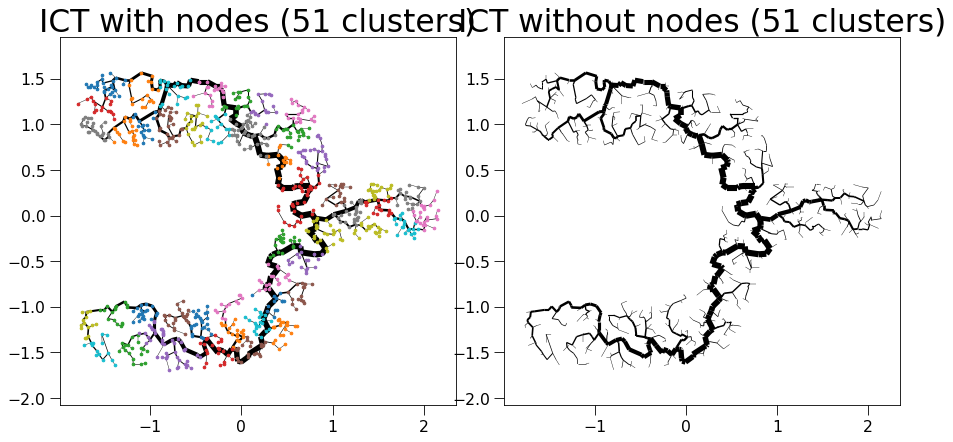

sklearn is done: 0.22327136993408203
My own part is done: 0.0017545223236083984


  0%|          | 0/49 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 61
update Arr 61 -> 54
update Arr 54 -> 49
update Arr 49 -> 40
update Arr 40 -> 32
update Arr 32 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 12
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 166 -> 140
update Arr 140 -> 125
update Arr 125 -> 108
update Arr 108 -> 95
update Arr 95 -> 77
update Arr 77 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 138
update Arr 138 -> 124
update Arr 124 -> 109
update Arr 109 -> 84
update Arr 84 -> 75
update Arr 75 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 108
update Arr 108 -> 94
update Arr 94 -> 77
update Arr 77 -> 66
update Arr 66 -> 59
update Arr 59 -> 46
update Arr 46 -> 40
update Arr 40 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 48
update Arr 48 -> 37
update Arr 37 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 112
update Arr 112 -> 97
update Arr 97 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 29
update Arr 29 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 122
update Arr 122 -> 107
update Arr 107 -> 91
update Arr 91 -> 66
update Arr 66 -> 50
update Arr 50 -> 40
update Arr 40 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 81
update Arr 81 -> 71
update Arr 71 -> 61
update Arr 61 -> 52
update Arr 52 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 41
update Arr 41 -> 36
update Arr 36 -> 28
update Arr 28 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
update Arr 18 -> 15
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 116
update Arr 116 -> 104
update Arr 104 -> 92
update Arr 92 -> 82
update Arr 82 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 123
update Arr 123 -> 100
update Arr 100 -> 89
update Arr 89 -> 77
update Arr 77 -> 63
update Arr 63 -> 56
update Arr 56 -> 43
update Arr 43 -> 35
update Arr 35 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 113
update Arr 113 -> 94
update Arr 94 -> 82
update Arr 82 -> 70
update Arr 70 -> 62
update Arr 62 -> 53
update Arr 53 -> 44
update Arr 44 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 174 -> 158
update Arr 158 -> 140
update Arr 140 -> 124
update Arr 124 -> 107
update Arr 107 -> 93
update Arr 93 -> 81
update Arr 81 -> 73
update Arr 73 -> 64
update Arr 64 -> 52
update Arr 52 -> 47
update Arr 47 -> 42
update Arr 42 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
Final k: 11


create edgeId array:   0%|          | 0/265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 265 -> 239
update Arr 239 -> 216
update Arr 216 -> 188
update Arr 188 -> 167
update Arr 167 -> 142
update Arr 142 -> 129
update Arr 129 -> 114
update Arr 114 -> 102
update Arr 102 -> 90
update Arr 90 -> 74
update Arr 74 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 41
update Arr 41 -> 39
update Arr 39 -> 38
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 198 -> 169
update Arr 169 -> 134
update Arr 134 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 71
update Arr 71 -> 52
update Arr 52 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 13
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 128 -> 101
update Arr 101 -> 82
update Arr 82 -> 73
update Arr 73 -> 64
update Arr 64 -> 55
update Arr 55 -> 39
update Arr 39 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 79
update Arr 79 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 84
update Arr 84 -> 73
update Arr 73 -> 65
update Arr 65 -> 52
update Arr 52 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 136 -> 119
update Arr 119 -> 105
update Arr 105 -> 90
update Arr 90 -> 77
update Arr 77 -> 69
update Arr 69 -> 50
update Arr 50 -> 45
update Arr 45 -> 35
update Arr 35 -> 30
update Arr 30 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 61
update Arr 61 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 126
update Arr 126 -> 114
update Arr 114 -> 99
update Arr 99 -> 83
update Arr 83 -> 66
update Arr 66 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 130
update Arr 130 -> 103
update Arr 103 -> 87
update Arr 87 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 120
update Arr 120 -> 94
update Arr 94 -> 80
update Arr 80 -> 71
update Arr 71 -> 63
update Arr 63 -> 53
update Arr 53 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 125
update Arr 125 -> 112
update Arr 112 -> 92
update Arr 92 -> 82
update Arr 82 -> 57
update Arr 57 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 31
update Arr 31 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 126
update Arr 126 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 43
update Arr 43 -> 36
update Arr 36 -> 28
update Arr 28 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 92
update Arr 92 -> 83
update Arr 83 -> 66
update Arr 66 -> 54
update Arr 54 -> 41
update Arr 41 -> 27
update Arr 27 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 116
update Arr 116 -> 105
update Arr 105 -> 95
update Arr 95 -> 75
update Arr 75 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/207 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/207 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 207 -> 179
update Arr 179 -> 155
update Arr 155 -> 139
update Arr 139 -> 124
update Arr 124 -> 108
update Arr 108 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 64
update Arr 64 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 31
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 67
update Arr 67 -> 54
update Arr 54 -> 44
update Arr 44 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 14
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 101
update Arr 101 -> 85
update Arr 85 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 51
update Arr 51 -> 46
update Arr 46 -> 36
update Arr 36 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 128
update Arr 128 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 131
update Arr 131 -> 118
update Arr 118 -> 100
update Arr 100 -> 90
update Arr 90 -> 71
update Arr 71 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 95
update Arr 95 -> 86
update Arr 86 -> 73
update Arr 73 -> 57
update Arr 57 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 100
update Arr 100 -> 82
update Arr 82 -> 73
update Arr 73 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 114
update Arr 114 -> 97
update Arr 97 -> 86
update Arr 86 -> 69
update Arr 69 -> 60
update Arr 60 -> 37
update Arr 37 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 152 -> 132
update Arr 132 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 77
update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 136
update Arr 136 -> 123
update Arr 123 -> 108
update Arr 108 -> 92
update Arr 92 -> 80
update Arr 80 -> 67
update Arr 67 -> 58
update Arr 58 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 91
update Arr 91 -> 78
update Arr 78 -> 70
update Arr 70 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 29
update Arr 29 -> 26
update Arr 26 -> 20
update Arr 20 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 64
update Arr 64 -> 51
update Arr 51 -> 39
update Arr 39 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 136 -> 121
update Arr 121 -> 98
update Arr 98 -> 87
update Arr 87 -> 77
update Arr 77 -> 66
update Arr 66 -> 58
update Arr 58 -> 51
update Arr 51 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 24
update Arr 24 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 132
update Arr 132 -> 117
update Arr 117 -> 101
update Arr 101 -> 91
update Arr 91 -> 75
update Arr 75 -> 65
update Arr 65 -> 57
update Arr 57 -> 49
update Arr 49 -> 42
update Arr 42 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 106
update Arr 106 -> 85
update Arr 85 -> 76
update Arr 76 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 138
update Arr 138 -> 119
update Arr 119 -> 105
update Arr 105 -> 89
update Arr 89 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 44
update Arr 44 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 114 -> 100
update Arr 100 -> 85
update Arr 85 -> 74
update Arr 74 -> 43
update Arr 43 -> 31
update Arr 31 -> 27
update Arr 27 -> 26
update Arr 26 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 110
update Arr 110 -> 93
update Arr 93 -> 84
update Arr 84 -> 75
update Arr 75 -> 65
update Arr 65 -> 54
update Arr 54 -> 42
update Arr 42 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 108
update Arr 108 -> 91
update Arr 91 -> 71
update Arr 71 -> 62
update Arr 62 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 68
update Arr 68 -> 60
update Arr 60 -> 44
update Arr 44 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14


Patching the components together:   0%|          | 0/49 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1080 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1080 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1080 -> 1009
added 256 edges early
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 100

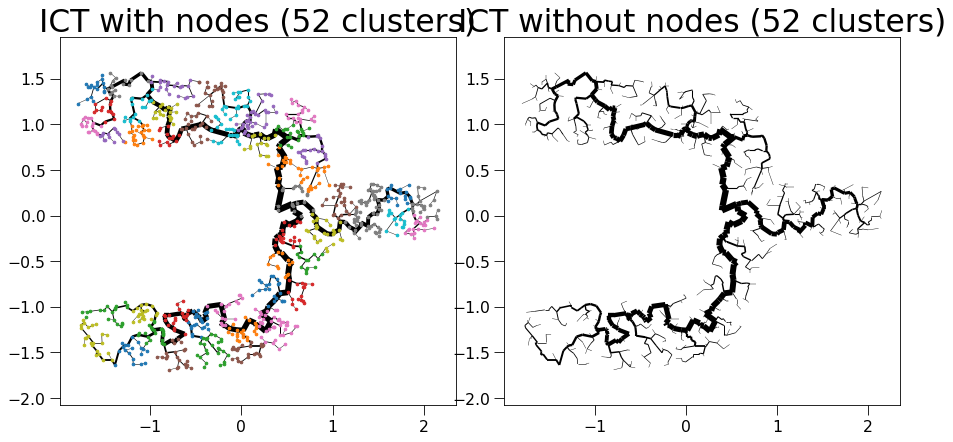

sklearn is done: 0.23903512954711914
My own part is done: 0.0016436576843261719


  0%|          | 0/49 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 228 -> 183
update Arr 183 -> 138
update Arr 138 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 68
update Arr 68 -> 54
update Arr 54 -> 42
update Arr 42 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 99
update Arr 99 -> 85
update Arr 85 -> 65
update Arr 65 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 230 -> 202
update Arr 202 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 127
update Arr 127 -> 110
update Arr 110 -> 96
update Arr 96 -> 86
update Arr 86 -> 72
update Arr 72 -> 58
update Arr 58 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 152 -> 124
update Arr 124 -> 109
update Arr 109 -> 91
update Arr 91 -> 76
update Arr 76 -> 68
update Arr 68 -> 56
update Arr 56 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 85
update Arr 85 -> 69
update Arr 69 -> 54
update Arr 54 -> 48
update Arr 48 -> 37
update Arr 37 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 93
update Arr 93 -> 73
update Arr 73 -> 66
update Arr 66 -> 55
update Arr 55 -> 44
update Arr 44 -> 38
update Arr 38 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 121
update Arr 121 -> 84
update Arr 84 -> 72
update Arr 72 -> 63
update Arr 63 -> 49
update Arr 49 -> 35
update Arr 35 -> 28
update Arr 28 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 65
update Arr 65 -> 56
update Arr 56 -> 44
update Arr 44 -> 39
update Arr 39 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 92
update Arr 92 -> 81
update Arr 81 -> 71
update Arr 71 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 71
update Arr 71 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 26
update Arr 26 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 141 -> 124
update Arr 124 -> 98
update Arr 98 -> 83
update Arr 83 -> 75
update Arr 75 -> 57
update Arr 57 -> 46
update Arr 46 -> 38
update Arr 38 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 66
update Arr 66 -> 55
update Arr 55 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 141
update Arr 141 -> 125
update Arr 125 -> 108
update Arr 108 -> 92
update Arr 92 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 218 -> 189
update Arr 189 -> 169
update Arr 169 -> 148
update Arr 148 -> 126
update Arr 126 -> 102
update Arr 102 -> 90
update Arr 90 -> 80
update Arr 80 -> 71
update Arr 71 -> 61
update Arr 61 -> 49
update Arr 49 -> 39
update Arr 39 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 125
update Arr 125 -> 109
update Arr 109 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 120
update Arr 120 -> 104
update Arr 104 -> 85
update Arr 85 -> 70
update Arr 70 -> 56
update Arr 56 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 118
update Arr 118 -> 93
update Arr 93 -> 79
update Arr 79 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 153 -> 135
update Arr 135 -> 105
update Arr 105 -> 94
update Arr 94 -> 81
update Arr 81 -> 72
update Arr 72 -> 65
update Arr 65 -> 56
update Arr 56 -> 47
update Arr 47 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 140 -> 120
update Arr 120 -> 103
update Arr 103 -> 92
update Arr 92 -> 80
update Arr 80 -> 72
update Arr 72 -> 59
update Arr 59 -> 46
update Arr 46 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/97 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/97 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 97 -> 74
update Arr 74 -> 66
update Arr 66 -> 54
update Arr 54 -> 38
update Arr 38 -> 34
update Arr 34 -> 30
update Arr 30 -> 25
update Arr 25 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 148
update Arr 148 -> 129
update Arr 129 -> 115
update Arr 115 -> 100
update Arr 100 -> 85
update Arr 85 -> 72
update Arr 72 -> 64
update Arr 64 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 129
update Arr 129 -> 111
update Arr 111 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 71
update Arr 71 -> 62
update Arr 62 -> 50
update Arr 50 -> 44
update Arr 44 -> 36
update Arr 36 -> 27
update Arr 27 -> 24
update Arr 24 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 144 -> 123
update Arr 123 -> 109
update Arr 109 -> 93
update Arr 93 -> 83
update Arr 83 -> 68
update Arr 68 -> 57
update Arr 57 -> 46
update Arr 46 -> 41
update Arr 41 -> 36
update Arr 36 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 101
update Arr 101 -> 86
update Arr 86 -> 71
update Arr 71 -> 64
update Arr 64 -> 54
update Arr 54 -> 44
update Arr 44 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 115
update Arr 115 -> 99
update Arr 99 -> 87
update Arr 87 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 90
update Arr 90 -> 78
update Arr 78 -> 58
update Arr 58 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 31
update Arr 31 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 115
update Arr 115 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 67
update Arr 67 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/92 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/92 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 92 -> 68
update Arr 68 -> 54
update Arr 54 -> 47
update Arr 47 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 16
update Arr 16 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 89
update Arr 89 -> 78
update Arr 78 -> 62
update Arr 62 -> 53
update Arr 53 -> 37
update Arr 37 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 134 -> 116
update Arr 116 -> 102
update Arr 102 -> 88
update Arr 88 -> 73
update Arr 73 -> 62
update Arr 62 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 116
update Arr 116 -> 102
update Arr 102 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
Final k: 11


create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 128 -> 102
update Arr 102 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 57
update Arr 57 -> 50
update Arr 50 -> 40
update Arr 40 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 66
update Arr 66 -> 56
update Arr 56 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 200 -> 181
update Arr 181 -> 153
update Arr 153 -> 135
update Arr 135 -> 118
update Arr 118 -> 100
update Arr 100 -> 87
update Arr 87 -> 69
update Arr 69 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 78
update Arr 78 -> 57
update Arr 57 -> 50
update Arr 50 -> 45
update Arr 45 -> 36
update Arr 36 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 53
update Arr 53 -> 46
update Arr 46 -> 36
update Arr 36 -> 23
update Arr 23 -> 20
update Arr 20 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 112
update Arr 112 -> 91
update Arr 91 -> 79
update Arr 79 -> 64
update Arr 64 -> 54
update Arr 54 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 116
update Arr 116 -> 95
update Arr 95 -> 76
update Arr 76 -> 64
update Arr 64 -> 58
update Arr 58 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 26
update Arr 26 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 160 -> 144
update Arr 144 -> 128
update Arr 128 -> 115
update Arr 115 -> 100
update Arr 100 -> 85
update Arr 85 -> 77
update Arr 77 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 48
update Arr 48 -> 42
update Arr 42 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/131 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/131 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 131 -> 108
update Arr 108 -> 92
update Arr 92 -> 82
update Arr 82 -> 66
update Arr 66 -> 58
update Arr 58 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 147 -> 118
update Arr 118 -> 105
update Arr 105 -> 93
update Arr 93 -> 82
update Arr 82 -> 74
update Arr 74 -> 53
update Arr 53 -> 48
update Arr 48 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 98
update Arr 98 -> 85
update Arr 85 -> 72
update Arr 72 -> 65
update Arr 65 -> 57
update Arr 57 -> 50
update Arr 50 -> 39
update Arr 39 -> 32
update Arr 32 -> 23
update Arr 23 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 56
update Arr 56 -> 50
update Arr 50 -> 41
update Arr 41 -> 31
update Arr 31 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/97 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/97 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 97 -> 80
update Arr 80 -> 66
update Arr 66 -> 56
update Arr 56 -> 47
update Arr 47 -> 37
update Arr 37 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 93
update Arr 93 -> 73
update Arr 73 -> 57
update Arr 57 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 31
update Arr 31 -> 23
update Arr 23 -> 21
update Arr 21 -> 16
update Arr 16 -> 16
update Arr 16 -> 15


Patching the components together:   0%|          | 0/49 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1090 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1090 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1090 -> 1009
added 286 edges early
update Arr 1009 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
added 2 edges early
update Arr 1003 -> 1001
added 3 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 3

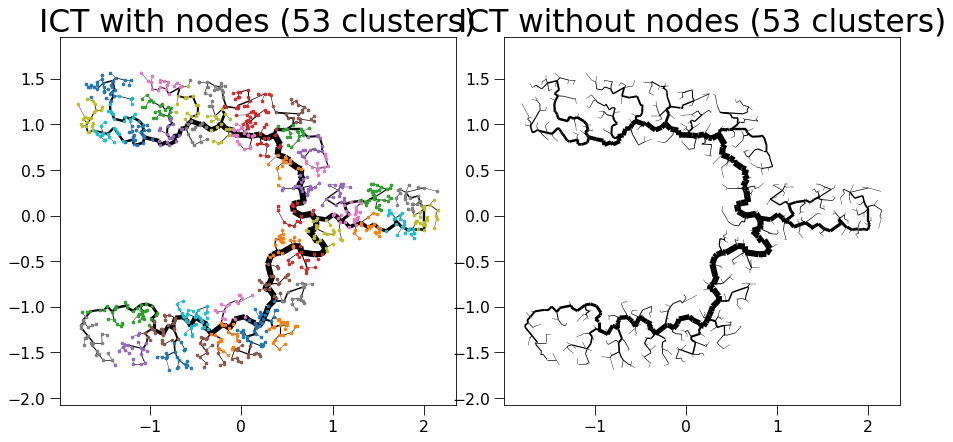

sklearn is done: 0.23255491256713867
My own part is done: 0.0011096000671386719


  0%|          | 0/51 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 109
update Arr 109 -> 82
update Arr 82 -> 74
update Arr 74 -> 64
update Arr 64 -> 56
update Arr 56 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 137
update Arr 137 -> 118
update Arr 118 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 54
update Arr 54 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 112
update Arr 112 -> 97
update Arr 97 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 29
update Arr 29 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 175 -> 148
update Arr 148 -> 132
update Arr 132 -> 114
update Arr 114 -> 102
update Arr 102 -> 89
update Arr 89 -> 77
update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 49
update Arr 49 -> 36
update Arr 36 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 96
update Arr 96 -> 83
update Arr 83 -> 67
update Arr 67 -> 56
update Arr 56 -> 45
update Arr 45 -> 37
update Arr 37 -> 30
update Arr 30 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 16
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 80
update Arr 80 -> 69
update Arr 69 -> 61
update Arr 61 -> 52
update Arr 52 -> 44
update Arr 44 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 140 -> 119
update Arr 119 -> 107
update Arr 107 -> 90
update Arr 90 -> 77
update Arr 77 -> 69
update Arr 69 -> 54
update Arr 54 -> 45
update Arr 45 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 104
update Arr 104 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 54
update Arr 54 -> 46
update Arr 46 -> 37
update Arr 37 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 93
update Arr 93 -> 84
update Arr 84 -> 74
update Arr 74 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 179 -> 137
update Arr 137 -> 120
update Arr 120 -> 101
update Arr 101 -> 88
update Arr 88 -> 70
update Arr 70 -> 58
update Arr 58 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/179 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/179 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 179 -> 160
update Arr 160 -> 143
update Arr 143 -> 128
update Arr 128 -> 97
update Arr 97 -> 88
update Arr 88 -> 76
update Arr 76 -> 68
update Arr 68 -> 51
update Arr 51 -> 41
update Arr 41 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 153
update Arr 153 -> 135
update Arr 135 -> 112
update Arr 112 -> 96
update Arr 96 -> 84
update Arr 84 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 49
update Arr 49 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 80
update Arr 80 -> 69
update Arr 69 -> 55
update Arr 55 -> 48
update Arr 48 -> 43
update Arr 43 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 92
update Arr 92 -> 81
update Arr 81 -> 71
update Arr 71 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 81
update Arr 81 -> 57
update Arr 57 -> 51
update Arr 51 -> 36
update Arr 36 -> 29
update Arr 29 -> 20
update Arr 20 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 38
update Arr 38 -> 30
update Arr 30 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 76
update Arr 76 -> 59
update Arr 59 -> 46
update Arr 46 -> 41
update Arr 41 -> 33
update Arr 33 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 15
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 65
update Arr 65 -> 54
update Arr 54 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 27
update Arr 27 -> 20
update Arr 20 -> 15
update Arr 15 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/32 [00:00<?, ?it/s]

update Arr 234 -> 190
update Arr 190 -> 145
update Arr 145 -> 127
update Arr 127 -> 115
update Arr 115 -> 98
update Arr 98 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 141
update Arr 141 -> 128
update Arr 128 -> 109
update Arr 109 -> 92
update Arr 92 -> 81
update Arr 81 -> 70
update Arr 70 -> 62
update Arr 62 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 83
update Arr 83 -> 75
update Arr 75 -> 64
update Arr 64 -> 53
update Arr 53 -> 39
update Arr 39 -> 32
update Arr 32 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 78
update Arr 78 -> 64
update Arr 64 -> 48
update Arr 48 -> 42
update Arr 42 -> 35
update Arr 35 -> 29
update Arr 29 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 98
update Arr 98 -> 85
update Arr 85 -> 75
update Arr 75 -> 62
update Arr 62 -> 53
update Arr 53 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 25
update Arr 25 -> 19
update Arr 19 -> 18
update Arr 18 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/214 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/214 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 214 -> 186
update Arr 186 -> 159
update Arr 159 -> 144
update Arr 144 -> 125
update Arr 125 -> 109
update Arr 109 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 42
update Arr 42 -> 40
update Arr 40 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 100
update Arr 100 -> 77
update Arr 77 -> 66
update Arr 66 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
Final k: 11


create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 187 -> 150
update Arr 150 -> 134
update Arr 134 -> 118
update Arr 118 -> 101
update Arr 101 -> 86
update Arr 86 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 137 -> 108
update Arr 108 -> 82
update Arr 82 -> 74
update Arr 74 -> 62
update Arr 62 -> 54
update Arr 54 -> 43
update Arr 43 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 75
update Arr 75 -> 58
update Arr 58 -> 41
update Arr 41 -> 33
update Arr 33 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 74
update Arr 74 -> 61
update Arr 61 -> 52
update Arr 52 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 16
update Arr 16 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 125
update Arr 125 -> 109
update Arr 109 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 79
update Arr 79 -> 71
update Arr 71 -> 51
update Arr 51 -> 37
update Arr 37 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 126
update Arr 126 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 104
update Arr 104 -> 73
update Arr 73 -> 64
update Arr 64 -> 57
update Arr 57 -> 46
update Arr 46 -> 38
update Arr 38 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 71
update Arr 71 -> 52
update Arr 52 -> 35
update Arr 35 -> 29
update Arr 29 -> 20
update Arr 20 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 70
update Arr 70 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 36
update Arr 36 -> 27
update Arr 27 -> 22
update Arr 22 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 99
update Arr 99 -> 88
update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 104
update Arr 104 -> 86
update Arr 86 -> 71
update Arr 71 -> 64
update Arr 64 -> 54
update Arr 54 -> 40
update Arr 40 -> 31
update Arr 31 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 164 -> 130
update Arr 130 -> 111
update Arr 111 -> 89
update Arr 89 -> 79
update Arr 79 -> 67
update Arr 67 -> 60
update Arr 60 -> 48
update Arr 48 -> 42
update Arr 42 -> 33
update Arr 33 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 133 -> 118
update Arr 118 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 56
update Arr 56 -> 45
update Arr 45 -> 37
update Arr 37 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 85
update Arr 85 -> 68
update Arr 68 -> 58
update Arr 58 -> 48
update Arr 48 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 58
update Arr 58 -> 40
update Arr 40 -> 33
update Arr 33 -> 26
update Arr 26 -> 23
update Arr 23 -> 19
update Arr 19 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 158 -> 135
update Arr 135 -> 116
update Arr 116 -> 99
update Arr 99 -> 86
update Arr 86 -> 71
update Arr 71 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/106 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/106 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 106 -> 95
update Arr 95 -> 86
update Arr 86 -> 61
update Arr 61 -> 53
update Arr 53 -> 43
update Arr 43 -> 32
update Arr 32 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 16
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 56
update Arr 56 -> 46
update Arr 46 -> 41
update Arr 41 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 15
update Arr 15 -> 14
update Arr 14 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 31
update Arr 31 -> 21
update Arr 21 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 116
update Arr 116 -> 102
update Arr 102 -> 87
update Arr 87 -> 73
update Arr 73 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 103
update Arr 103 -> 75
update Arr 75 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 38
update Arr 38 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 55
update Arr 55 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 15
update Arr 15 -> 13
update Arr 13 -> 12


Patching the components together:   0%|          | 0/51 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/4 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1093 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1093 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1093 -> 1009
added 281 edges early
update Arr 1009 -> 1008
update Arr 1008 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1001
added 4 edges early
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 365 edges early


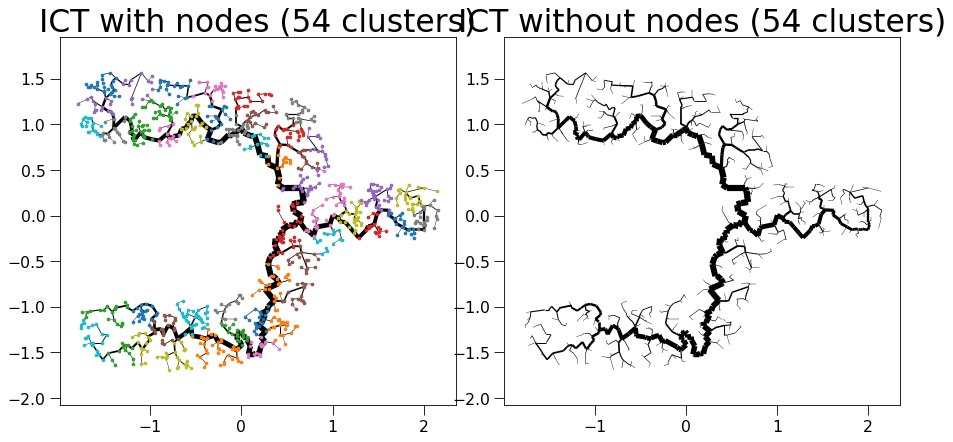

sklearn is done: 0.3255622386932373
My own part is done: 0.001546621322631836


  0%|          | 0/49 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 146 -> 122
update Arr 122 -> 105
update Arr 105 -> 88
update Arr 88 -> 75
update Arr 75 -> 56
update Arr 56 -> 47
update Arr 47 -> 36
update Arr 36 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 120
update Arr 120 -> 109
update Arr 109 -> 94
update Arr 94 -> 77
update Arr 77 -> 68
update Arr 68 -> 57
update Arr 57 -> 44
update Arr 44 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 141
update Arr 141 -> 125
update Arr 125 -> 108
update Arr 108 -> 92
update Arr 92 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 60
update Arr 60 -> 51
update Arr 51 -> 45
update Arr 45 -> 35
update Arr 35 -> 26
update Arr 26 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 85
update Arr 85 -> 74
update Arr 74 -> 67
update Arr 67 -> 57
update Arr 57 -> 51
update Arr 51 -> 40
update Arr 40 -> 31
update Arr 31 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 195 -> 170
update Arr 170 -> 152
update Arr 152 -> 138
update Arr 138 -> 114
update Arr 114 -> 99
update Arr 99 -> 78
update Arr 78 -> 70
update Arr 70 -> 58
update Arr 58 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 127
update Arr 127 -> 111
update Arr 111 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 113
update Arr 113 -> 100
update Arr 100 -> 87
update Arr 87 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/172 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/172 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 172 -> 150
update Arr 150 -> 109
update Arr 109 -> 99
update Arr 99 -> 83
update Arr 83 -> 71
update Arr 71 -> 63
update Arr 63 -> 54
update Arr 54 -> 47
update Arr 47 -> 42
update Arr 42 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 107
update Arr 107 -> 93
update Arr 93 -> 82
update Arr 82 -> 62
update Arr 62 -> 50
update Arr 50 -> 43
update Arr 43 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 177 -> 156
update Arr 156 -> 130
update Arr 130 -> 114
update Arr 114 -> 101
update Arr 101 -> 87
update Arr 87 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 139
update Arr 139 -> 102
update Arr 102 -> 90
update Arr 90 -> 78
update Arr 78 -> 68
update Arr 68 -> 58
update Arr 58 -> 49
update Arr 49 -> 42
update Arr 42 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 155 -> 134
update Arr 134 -> 115
update Arr 115 -> 99
update Arr 99 -> 87
update Arr 87 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 44
update Arr 44 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 83
update Arr 83 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 41
update Arr 41 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 19
update Arr 19 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 136 -> 108
update Arr 108 -> 90
update Arr 90 -> 75
update Arr 75 -> 68
update Arr 68 -> 42
update Arr 42 -> 35
update Arr 35 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 19
Final k: 11


create edgeId array:   0%|          | 0/214 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/214 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 214 -> 177
update Arr 177 -> 152
update Arr 152 -> 129
update Arr 129 -> 115
update Arr 115 -> 98
update Arr 98 -> 81
update Arr 81 -> 69
update Arr 69 -> 56
update Arr 56 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 88
update Arr 88 -> 71
update Arr 71 -> 59
update Arr 59 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 28
update Arr 28 -> 23
update Arr 23 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 158 -> 134
update Arr 134 -> 121
update Arr 121 -> 105
update Arr 105 -> 92
update Arr 92 -> 77
update Arr 77 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 158 -> 141
update Arr 141 -> 125
update Arr 125 -> 110
update Arr 110 -> 90
update Arr 90 -> 81
update Arr 81 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 87
update Arr 87 -> 68
update Arr 68 -> 61
update Arr 61 -> 55
update Arr 55 -> 47
update Arr 47 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 82
update Arr 82 -> 71
update Arr 71 -> 62
update Arr 62 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 28
update Arr 28 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 64
update Arr 64 -> 50
update Arr 50 -> 45
update Arr 45 -> 38
update Arr 38 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 89
update Arr 89 -> 72
update Arr 72 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 39
update Arr 39 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 61
update Arr 61 -> 41
update Arr 41 -> 33
update Arr 33 -> 28
update Arr 28 -> 27
update Arr 27 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/153 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/153 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 153 -> 131
update Arr 131 -> 116
update Arr 116 -> 105
update Arr 105 -> 88
update Arr 88 -> 77
update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 33
update Arr 33 -> 32
update Arr 32 -> 27
update Arr 27 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 173 -> 141
update Arr 141 -> 128
update Arr 128 -> 109
update Arr 109 -> 93
update Arr 93 -> 80
update Arr 80 -> 67
update Arr 67 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 90
update Arr 90 -> 78
update Arr 78 -> 69
update Arr 69 -> 61
update Arr 61 -> 45
update Arr 45 -> 39
update Arr 39 -> 31
update Arr 31 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 148 -> 126
update Arr 126 -> 109
update Arr 109 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 56
update Arr 56 -> 46
update Arr 46 -> 39
update Arr 39 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 163 -> 148
update Arr 148 -> 129
update Arr 129 -> 115
update Arr 115 -> 100
update Arr 100 -> 85
update Arr 85 -> 72
update Arr 72 -> 64
update Arr 64 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 177 -> 155
update Arr 155 -> 140
update Arr 140 -> 123
update Arr 123 -> 110
update Arr 110 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 48
update Arr 48 -> 42
update Arr 42 -> 33
update Arr 33 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/171 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/171 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 171 -> 150
update Arr 150 -> 135
update Arr 135 -> 107
update Arr 107 -> 94
update Arr 94 -> 70
update Arr 70 -> 63
update Arr 63 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 124
update Arr 124 -> 111
update Arr 111 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 50
update Arr 50 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 174 -> 145
update Arr 145 -> 117
update Arr 117 -> 102
update Arr 102 -> 92
update Arr 92 -> 82
update Arr 82 -> 70
update Arr 70 -> 63
update Arr 63 -> 56
update Arr 56 -> 43
update Arr 43 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/163 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/163 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 163 -> 148
update Arr 148 -> 126
update Arr 126 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 55
update Arr 55 -> 43
update Arr 43 -> 35
update Arr 35 -> 32
update Arr 32 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 87
update Arr 87 -> 75
update Arr 75 -> 65
update Arr 65 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 30
update Arr 30 -> 21
update Arr 21 -> 18
update Arr 18 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 89
update Arr 89 -> 76
update Arr 76 -> 60
update Arr 60 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 31
update Arr 31 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 125
update Arr 125 -> 111
update Arr 111 -> 98
update Arr 98 -> 83
update Arr 83 -> 74
update Arr 74 -> 66
update Arr 66 -> 51
update Arr 51 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 97
update Arr 97 -> 76
update Arr 76 -> 63
update Arr 63 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 64
update Arr 64 -> 36
update Arr 36 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/93 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/93 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 93 -> 75
update Arr 75 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 103
update Arr 103 -> 84
update Arr 84 -> 74
update Arr 74 -> 60
update Arr 60 -> 53
update Arr 53 -> 45
update Arr 45 -> 37
update Arr 37 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 83
update Arr 83 -> 72
update Arr 72 -> 64
update Arr 64 -> 56
update Arr 56 -> 50
update Arr 50 -> 43
update Arr 43 -> 35
update Arr 35 -> 31
update Arr 31 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 69
update Arr 69 -> 60
update Arr 60 -> 49
update Arr 49 -> 38
update Arr 38 -> 30
update Arr 30 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 102
update Arr 102 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 53
update Arr 53 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 110
update Arr 110 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 62
update Arr 62 -> 42
update Arr 42 -> 28
update Arr 28 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 115
update Arr 115 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 67
update Arr 67 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 109
update Arr 109 -> 84
update Arr 84 -> 72
update Arr 72 -> 49
update Arr 49 -> 40
update Arr 40 -> 34
update Arr 34 -> 29
update Arr 29 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/49 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1084 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1084 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1084 -> 1009
added 257 edges early
update Arr 1009 -> 1008
added 2 edges early
update Arr 1008 -> 1007
update Arr 1007 -> 1006
added 2 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 4 edges early
added 348 edges ear

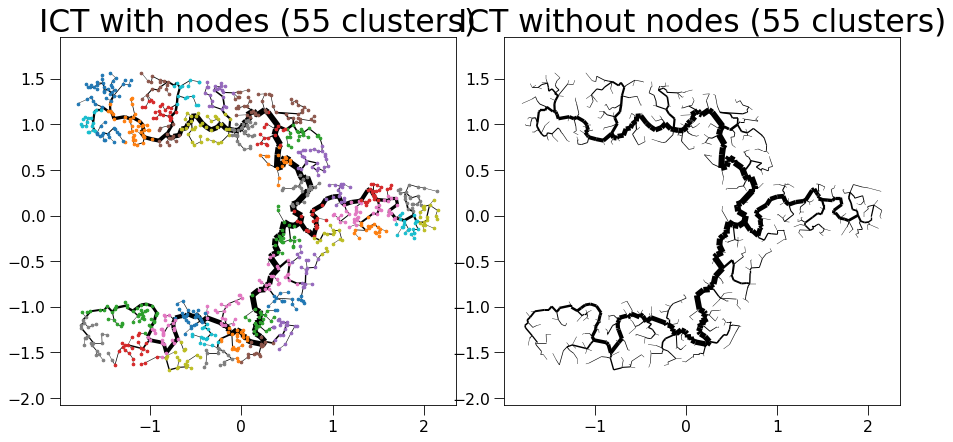

sklearn is done: 0.3405575752258301
My own part is done: 0.0014553070068359375


  0%|          | 0/51 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 86
update Arr 86 -> 72
update Arr 72 -> 63
update Arr 63 -> 53
update Arr 53 -> 40
update Arr 40 -> 26
update Arr 26 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 93
update Arr 93 -> 82
update Arr 82 -> 70
update Arr 70 -> 59
update Arr 59 -> 53
update Arr 53 -> 45
update Arr 45 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 183 -> 155
update Arr 155 -> 139
update Arr 139 -> 117
update Arr 117 -> 98
update Arr 98 -> 86
update Arr 86 -> 69
update Arr 69 -> 53
update Arr 53 -> 47
update Arr 47 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 108 -> 84
update Arr 84 -> 74
update Arr 74 -> 60
update Arr 60 -> 47
update Arr 47 -> 37
update Arr 37 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 138
update Arr 138 -> 117
update Arr 117 -> 106
update Arr 106 -> 94
update Arr 94 -> 78
update Arr 78 -> 66
update Arr 66 -> 54
update Arr 54 -> 40
update Arr 40 -> 32
update Arr 32 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 134 -> 112
update Arr 112 -> 100
update Arr 100 -> 82
update Arr 82 -> 66
update Arr 66 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 26
update Arr 26 -> 24
update Arr 24 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 113
update Arr 113 -> 98
update Arr 98 -> 89
update Arr 89 -> 75
update Arr 75 -> 68
update Arr 68 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 122
update Arr 122 -> 107
update Arr 107 -> 94
update Arr 94 -> 80
update Arr 80 -> 63
update Arr 63 -> 54
update Arr 54 -> 42
update Arr 42 -> 38
update Arr 38 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 83
update Arr 83 -> 66
update Arr 66 -> 52
update Arr 52 -> 45
update Arr 45 -> 34
update Arr 34 -> 30
update Arr 30 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 55
update Arr 55 -> 45
update Arr 45 -> 39
update Arr 39 -> 32
update Arr 32 -> 25
update Arr 25 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 185 -> 166
update Arr 166 -> 149
update Arr 149 -> 131
update Arr 131 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 78
update Arr 78 -> 68
update Arr 68 -> 55
update Arr 55 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 155 -> 138
update Arr 138 -> 111
update Arr 111 -> 100
update Arr 100 -> 82
update Arr 82 -> 67
update Arr 67 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 28
update Arr 28 -> 27
update Arr 27 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 192 -> 171
update Arr 171 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 104
update Arr 104 -> 87
update Arr 87 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 57
update Arr 57 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 16
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 122
update Arr 122 -> 105
update Arr 105 -> 95
update Arr 95 -> 85
update Arr 85 -> 65
update Arr 65 -> 56
update Arr 56 -> 47
update Arr 47 -> 40
update Arr 40 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 72
update Arr 72 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 100
update Arr 100 -> 82
update Arr 82 -> 73
update Arr 73 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 164 -> 140
update Arr 140 -> 126
update Arr 126 -> 112
update Arr 112 -> 98
update Arr 98 -> 85
update Arr 85 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 75
update Arr 75 -> 62
update Arr 62 -> 50
update Arr 50 -> 43
update Arr 43 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 133
update Arr 133 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 80
update Arr 80 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 109
update Arr 109 -> 95
update Arr 95 -> 82
update Arr 82 -> 70
update Arr 70 -> 59
update Arr 59 -> 45
update Arr 45 -> 38
update Arr 38 -> 31
update Arr 31 -> 27
update Arr 27 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/232 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/232 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/33 [00:00<?, ?it/s]

update Arr 232 -> 201
update Arr 201 -> 181
update Arr 181 -> 159
update Arr 159 -> 135
update Arr 135 -> 117
update Arr 117 -> 101
update Arr 101 -> 86
update Arr 86 -> 78
update Arr 78 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 121
update Arr 121 -> 102
update Arr 102 -> 87
update Arr 87 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 49
update Arr 49 -> 41
update Arr 41 -> 33
update Arr 33 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 228 -> 183
update Arr 183 -> 138
update Arr 138 -> 117
update Arr 117 -> 102
update Arr 102 -> 91
update Arr 91 -> 79
update Arr 79 -> 68
update Arr 68 -> 54
update Arr 54 -> 42
update Arr 42 -> 37
update Arr 37 -> 36
update Arr 36 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 18
update Arr 18 -> 16
update Arr 16 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 67
update Arr 67 -> 55
update Arr 55 -> 48
update Arr 48 -> 37
update Arr 37 -> 28
update Arr 28 -> 20
update Arr 20 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 156 -> 133
update Arr 133 -> 116
update Arr 116 -> 95
update Arr 95 -> 84
update Arr 84 -> 76
update Arr 76 -> 65
update Arr 65 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 37
update Arr 37 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 127 -> 101
update Arr 101 -> 90
update Arr 90 -> 69
update Arr 69 -> 62
update Arr 62 -> 52
update Arr 52 -> 43
update Arr 43 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 96
update Arr 96 -> 69
update Arr 69 -> 58
update Arr 58 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 18
update Arr 18 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 113
update Arr 113 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 114 -> 102
update Arr 102 -> 84
update Arr 84 -> 73
update Arr 73 -> 59
update Arr 59 -> 53
update Arr 53 -> 42
update Arr 42 -> 34
update Arr 34 -> 29
update Arr 29 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
update Arr 17 -> 17
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 100
update Arr 100 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/88 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/88 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 88 -> 60
update Arr 60 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
update Arr 15 -> 13
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 90
update Arr 90 -> 72
update Arr 72 -> 56
update Arr 56 -> 45
update Arr 45 -> 37
update Arr 37 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 115
update Arr 115 -> 98
update Arr 98 -> 78
update Arr 78 -> 70
update Arr 70 -> 56
update Arr 56 -> 48
update Arr 48 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 113
update Arr 113 -> 100
update Arr 100 -> 87
update Arr 87 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 23
update Arr 23 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 75
update Arr 75 -> 66
update Arr 66 -> 51
update Arr 51 -> 41
update Arr 41 -> 31
update Arr 31 -> 24
update Arr 24 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 64
update Arr 64 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 25
update Arr 25 -> 16
update Arr 16 -> 14
update Arr 14 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 112
update Arr 112 -> 97
update Arr 97 -> 84
update Arr 84 -> 74
update Arr 74 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 117
update Arr 117 -> 104
update Arr 104 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 48
update Arr 48 -> 37
update Arr 37 -> 30
update Arr 30 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/106 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/106 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 106 -> 81
update Arr 81 -> 70
update Arr 70 -> 59
update Arr 59 -> 46
update Arr 46 -> 31
update Arr 31 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 165 -> 148
update Arr 148 -> 130
update Arr 130 -> 108
update Arr 108 -> 94
update Arr 94 -> 85
update Arr 85 -> 74
update Arr 74 -> 67
update Arr 67 -> 56
update Arr 56 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 165 -> 140
update Arr 140 -> 116
update Arr 116 -> 104
update Arr 104 -> 88
update Arr 88 -> 78
update Arr 78 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 25
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 76
update Arr 76 -> 67
update Arr 67 -> 57
update Arr 57 -> 48
update Arr 48 -> 37
update Arr 37 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 83
update Arr 83 -> 69
update Arr 69 -> 54
update Arr 54 -> 45
update Arr 45 -> 34
update Arr 34 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 91
update Arr 91 -> 72
update Arr 72 -> 64
update Arr 64 -> 55
update Arr 55 -> 36
update Arr 36 -> 32
update Arr 32 -> 24
update Arr 24 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 84
update Arr 84 -> 72
update Arr 72 -> 60
update Arr 60 -> 54
update Arr 54 -> 48
update Arr 48 -> 42
update Arr 42 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 109
update Arr 109 -> 92
update Arr 92 -> 82
update Arr 82 -> 72
update Arr 72 -> 64
update Arr 64 -> 55
update Arr 55 -> 45
update Arr 45 -> 38
update Arr 38 -> 34
update Arr 34 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 133 -> 108
update Arr 108 -> 91
update Arr 91 -> 76
update Arr 76 -> 68
update Arr 68 -> 48
update Arr 48 -> 42
update Arr 42 -> 37
update Arr 37 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 112
update Arr 112 -> 97
update Arr 97 -> 83
update Arr 83 -> 70
update Arr 70 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 37
update Arr 37 -> 29
update Arr 29 -> 22
update Arr 22 -> 22
update Arr 22 -> 20
update Arr 20 -> 19


Patching the components together:   0%|          | 0/51 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1086 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1086 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1086 -> 1009
added 268 edges early
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1009
update Arr 1009 -> 1008
update Arr 1008 -> 1008
update Arr 1008 -> 1005
added 3 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1004
added 2 edges early
update Arr 1004 -> 1001
added 4 edges early
update Arr 1001 -> 1000
added 2 edges early
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 1000
update Arr 1000 -> 999
added 2 edges early
added 320 edges early


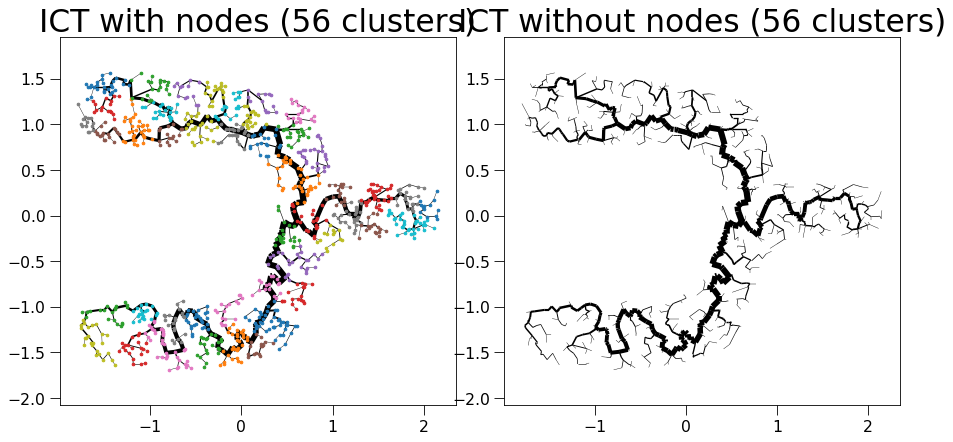

sklearn is done: 0.32293200492858887
My own part is done: 0.0015773773193359375


  0%|          | 0/49 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 85
update Arr 85 -> 56
update Arr 56 -> 45
update Arr 45 -> 36
update Arr 36 -> 27
update Arr 27 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 112 -> 89
update Arr 89 -> 80
update Arr 80 -> 67
update Arr 67 -> 57
update Arr 57 -> 45
update Arr 45 -> 40
update Arr 40 -> 31
update Arr 31 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
update Arr 19 -> 16
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 86
update Arr 86 -> 78
update Arr 78 -> 58
update Arr 58 -> 50
update Arr 50 -> 45
update Arr 45 -> 37
update Arr 37 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 117
update Arr 117 -> 106
update Arr 106 -> 87
update Arr 87 -> 78
update Arr 78 -> 67
update Arr 67 -> 55
update Arr 55 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 31
update Arr 31 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/169 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/169 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 169 -> 141
update Arr 141 -> 114
update Arr 114 -> 102
update Arr 102 -> 89
update Arr 89 -> 80
update Arr 80 -> 69
update Arr 69 -> 61
update Arr 61 -> 53
update Arr 53 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 132
update Arr 132 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 62
update Arr 62 -> 52
update Arr 52 -> 45
update Arr 45 -> 37
update Arr 37 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 133
update Arr 133 -> 119
update Arr 119 -> 97
update Arr 97 -> 86
update Arr 86 -> 68
update Arr 68 -> 59
update Arr 59 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 29
update Arr 29 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 168 -> 142
update Arr 142 -> 126
update Arr 126 -> 111
update Arr 111 -> 100
update Arr 100 -> 87
update Arr 87 -> 79
update Arr 79 -> 66
update Arr 66 -> 52
update Arr 52 -> 47
update Arr 47 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 118 -> 103
update Arr 103 -> 92
update Arr 92 -> 73
update Arr 73 -> 61
update Arr 61 -> 54
update Arr 54 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 96
update Arr 96 -> 81
update Arr 81 -> 70
update Arr 70 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 36
update Arr 36 -> 31
update Arr 31 -> 24
update Arr 24 -> 19
update Arr 19 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 124
update Arr 124 -> 111
update Arr 111 -> 87
update Arr 87 -> 78
update Arr 78 -> 59
update Arr 59 -> 53
update Arr 53 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 180 -> 154
update Arr 154 -> 138
update Arr 138 -> 118
update Arr 118 -> 93
update Arr 93 -> 82
update Arr 82 -> 71
update Arr 71 -> 63
update Arr 63 -> 50
update Arr 50 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 121
update Arr 121 -> 108
update Arr 108 -> 91
update Arr 91 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 55
update Arr 55 -> 48
update Arr 48 -> 41
update Arr 41 -> 35
update Arr 35 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 145 -> 126
update Arr 126 -> 106
update Arr 106 -> 95
update Arr 95 -> 71
update Arr 71 -> 62
update Arr 62 -> 53
update Arr 53 -> 47
update Arr 47 -> 41
update Arr 41 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/213 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/213 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 213 -> 175
update Arr 175 -> 155
update Arr 155 -> 136
update Arr 136 -> 121
update Arr 121 -> 107
update Arr 107 -> 85
update Arr 85 -> 71
update Arr 71 -> 57
update Arr 57 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 149 -> 122
update Arr 122 -> 108
update Arr 108 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 65
update Arr 65 -> 55
update Arr 55 -> 49
update Arr 49 -> 41
update Arr 41 -> 36
update Arr 36 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 71
update Arr 71 -> 52
update Arr 52 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 13
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 100
update Arr 100 -> 90
update Arr 90 -> 80
update Arr 80 -> 70
update Arr 70 -> 52
update Arr 52 -> 41
update Arr 41 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 18
Final k: 11


create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 110 -> 86
update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 59
update Arr 59 -> 46
update Arr 46 -> 38
update Arr 38 -> 31
update Arr 31 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 83
update Arr 83 -> 66
update Arr 66 -> 52
update Arr 52 -> 45
update Arr 45 -> 34
update Arr 34 -> 30
update Arr 30 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 95
update Arr 95 -> 69
update Arr 69 -> 52
update Arr 52 -> 42
update Arr 42 -> 38
update Arr 38 -> 30
update Arr 30 -> 27
update Arr 27 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 137
update Arr 137 -> 113
update Arr 113 -> 102
update Arr 102 -> 86
update Arr 86 -> 69
update Arr 69 -> 61
update Arr 61 -> 44
update Arr 44 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 76
update Arr 76 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 138 -> 122
update Arr 122 -> 105
update Arr 105 -> 95
update Arr 95 -> 73
update Arr 73 -> 65
update Arr 65 -> 58
update Arr 58 -> 42
update Arr 42 -> 37
update Arr 37 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 42
update Arr 42 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 113
update Arr 113 -> 101
update Arr 101 -> 84
update Arr 84 -> 71
update Arr 71 -> 60
update Arr 60 -> 54
update Arr 54 -> 44
update Arr 44 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/140 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/140 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 140 -> 125
update Arr 125 -> 89
update Arr 89 -> 74
update Arr 74 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 198 -> 169
update Arr 169 -> 134
update Arr 134 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 46
update Arr 46 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 111
update Arr 111 -> 100
update Arr 100 -> 81
update Arr 81 -> 57
update Arr 57 -> 48
update Arr 48 -> 41
update Arr 41 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 125
update Arr 125 -> 112
update Arr 112 -> 90
update Arr 90 -> 81
update Arr 81 -> 70
update Arr 70 -> 56
update Arr 56 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 86
update Arr 86 -> 73
update Arr 73 -> 62
update Arr 62 -> 54
update Arr 54 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 146 -> 126
update Arr 126 -> 103
update Arr 103 -> 90
update Arr 90 -> 77
update Arr 77 -> 58
update Arr 58 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 32
update Arr 32 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 122 -> 96
update Arr 96 -> 82
update Arr 82 -> 74
update Arr 74 -> 65
update Arr 65 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 26
update Arr 26 -> 22
update Arr 22 -> 20
update Arr 20 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 151 -> 132
update Arr 132 -> 113
update Arr 113 -> 102
update Arr 102 -> 92
update Arr 92 -> 82
update Arr 82 -> 69
update Arr 69 -> 59
update Arr 59 -> 51
update Arr 51 -> 44
update Arr 44 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 116 -> 101
update Arr 101 -> 90
update Arr 90 -> 74
update Arr 74 -> 67
update Arr 67 -> 54
update Arr 54 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 118
update Arr 118 -> 101
update Arr 101 -> 89
update Arr 89 -> 78
update Arr 78 -> 65
update Arr 65 -> 47
update Arr 47 -> 40
update Arr 40 -> 33
update Arr 33 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 115
update Arr 115 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 67
update Arr 67 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 132 -> 112
update Arr 112 -> 100
update Arr 100 -> 82
update Arr 82 -> 74
update Arr 74 -> 64
update Arr 64 -> 58
update Arr 58 -> 47
update Arr 47 -> 38
update Arr 38 -> 29
update Arr 29 -> 29
update Arr 29 -> 25
update Arr 25 -> 20
update Arr 20 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 36
update Arr 36 -> 29
update Arr 29 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/177 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/177 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 177 -> 156
update Arr 156 -> 130
update Arr 130 -> 114
update Arr 114 -> 101
update Arr 101 -> 87
update Arr 87 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 54
update Arr 54 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 78
update Arr 78 -> 65
update Arr 65 -> 48
update Arr 48 -> 36
update Arr 36 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 139 -> 117
update Arr 117 -> 94
update Arr 94 -> 85
update Arr 85 -> 65
update Arr 65 -> 59
update Arr 59 -> 47
update Arr 47 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 190 -> 155
update Arr 155 -> 134
update Arr 134 -> 119
update Arr 119 -> 108
update Arr 108 -> 96
update Arr 96 -> 85
update Arr 85 -> 74
update Arr 74 -> 64
update Arr 64 -> 55
update Arr 55 -> 49
update Arr 49 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 31
update Arr 31 -> 29
update Arr 29 -> 28
Final k: 11


create edgeId array:   0%|          | 0/139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 139 -> 116
update Arr 116 -> 100
update Arr 100 -> 88
update Arr 88 -> 73
update Arr 73 -> 65
update Arr 65 -> 52
update Arr 52 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 24
update Arr 24 -> 23
update Arr 23 -> 20
update Arr 20 -> 20
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 101
update Arr 101 -> 90
update Arr 90 -> 81
update Arr 81 -> 72
update Arr 72 -> 59
update Arr 59 -> 51
update Arr 51 -> 36
update Arr 36 -> 28
update Arr 28 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 76
update Arr 76 -> 64
update Arr 64 -> 56
update Arr 56 -> 49
update Arr 49 -> 39
update Arr 39 -> 32
update Arr 32 -> 25
update Arr 25 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 36
update Arr 36 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 95
update Arr 95 -> 86
update Arr 86 -> 73
update Arr 73 -> 57
update Arr 57 -> 44
update Arr 44 -> 37
update Arr 37 -> 31
update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17


Patching the components together:   0%|          | 0/49 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1086 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1086 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1086 -> 1009
added 281 edges early
update Arr 1009 -> 1007
added 2 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1004
update Arr 1004 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 1001
update Arr 1001 -> 999
added 2 edges early
added 349 edges early


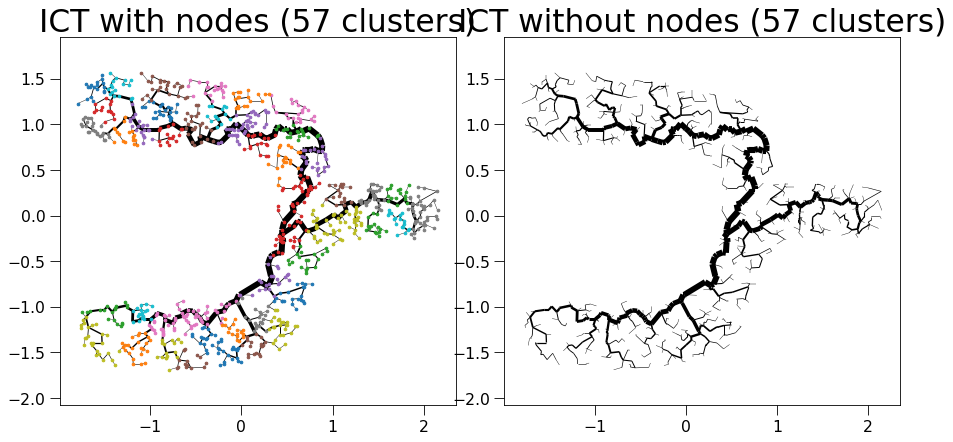

sklearn is done: 0.3437209129333496
My own part is done: 0.0020601749420166016


  0%|          | 0/50 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/141 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/141 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 141 -> 116
update Arr 116 -> 102
update Arr 102 -> 89
update Arr 89 -> 78
update Arr 78 -> 67
update Arr 67 -> 49
update Arr 49 -> 40
update Arr 40 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 68
update Arr 68 -> 59
update Arr 59 -> 46
update Arr 46 -> 39
update Arr 39 -> 32
update Arr 32 -> 27
update Arr 27 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 146 -> 126
update Arr 126 -> 106
update Arr 106 -> 93
update Arr 93 -> 78
update Arr 78 -> 70
update Arr 70 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 32
update Arr 32 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 128
update Arr 128 -> 113
update Arr 113 -> 96
update Arr 96 -> 81
update Arr 81 -> 62
update Arr 62 -> 48
update Arr 48 -> 43
update Arr 43 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/84 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/84 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 84 -> 63
update Arr 63 -> 53
update Arr 53 -> 43
update Arr 43 -> 31
update Arr 31 -> 23
update Arr 23 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 170 -> 145
update Arr 145 -> 127
update Arr 127 -> 114
update Arr 114 -> 97
update Arr 97 -> 86
update Arr 86 -> 70
update Arr 70 -> 62
update Arr 62 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 108
update Arr 108 -> 84
update Arr 84 -> 68
update Arr 68 -> 49
update Arr 49 -> 41
update Arr 41 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 18
Final k: 11


create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 119 -> 92
update Arr 92 -> 82
update Arr 82 -> 71
update Arr 71 -> 60
update Arr 60 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/124 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/124 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 124 -> 96
update Arr 96 -> 85
update Arr 85 -> 74
update Arr 74 -> 66
update Arr 66 -> 51
update Arr 51 -> 42
update Arr 42 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 162 -> 137
update Arr 137 -> 118
update Arr 118 -> 99
update Arr 99 -> 86
update Arr 86 -> 77
update Arr 77 -> 65
update Arr 65 -> 54
update Arr 54 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 24
update Arr 24 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 156 -> 133
update Arr 133 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 80
update Arr 80 -> 72
update Arr 72 -> 59
update Arr 59 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 164 -> 141
update Arr 141 -> 123
update Arr 123 -> 109
update Arr 109 -> 97
update Arr 97 -> 86
update Arr 86 -> 75
update Arr 75 -> 68
update Arr 68 -> 54
update Arr 54 -> 44
update Arr 44 -> 36
update Arr 36 -> 33
update Arr 33 -> 27
update Arr 27 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 155 -> 121
update Arr 121 -> 101
update Arr 101 -> 80
update Arr 80 -> 56
update Arr 56 -> 50
update Arr 50 -> 40
update Arr 40 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 76
update Arr 76 -> 64
update Arr 64 -> 52
update Arr 52 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 21
update Arr 21 -> 20
update Arr 20 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 61
update Arr 61 -> 55
update Arr 55 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 25
update Arr 25 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 94
update Arr 94 -> 83
update Arr 83 -> 62
update Arr 62 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 100
update Arr 100 -> 84
update Arr 84 -> 69
update Arr 69 -> 61
update Arr 61 -> 54
update Arr 54 -> 38
update Arr 38 -> 30
update Arr 30 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 103
update Arr 103 -> 79
update Arr 79 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 46
update Arr 46 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 178 -> 139
update Arr 139 -> 99
update Arr 99 -> 88
update Arr 88 -> 75
update Arr 75 -> 68
update Arr 68 -> 50
update Arr 50 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 26
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 212 -> 187
update Arr 187 -> 160
update Arr 160 -> 143
update Arr 143 -> 119
update Arr 119 -> 107
update Arr 107 -> 88
update Arr 88 -> 74
update Arr 74 -> 61
update Arr 61 -> 54
update Arr 54 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 149 -> 134
update Arr 134 -> 114
update Arr 114 -> 102
update Arr 102 -> 86
update Arr 86 -> 68
update Arr 68 -> 60
update Arr 60 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 160 -> 137
update Arr 137 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 70
update Arr 70 -> 59
update Arr 59 -> 49
update Arr 49 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 151 -> 127
update Arr 127 -> 111
update Arr 111 -> 92
update Arr 92 -> 83
update Arr 83 -> 71
update Arr 71 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 34
update Arr 34 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 23
update Arr 23 -> 21
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 65
update Arr 65 -> 52
update Arr 52 -> 45
update Arr 45 -> 39
update Arr 39 -> 34
update Arr 34 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/117 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/117 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 117 -> 101
update Arr 101 -> 84
update Arr 84 -> 74
update Arr 74 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 73
update Arr 73 -> 62
update Arr 62 -> 53
update Arr 53 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 21
update Arr 21 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 167 -> 147
update Arr 147 -> 126
update Arr 126 -> 108
update Arr 108 -> 89
update Arr 89 -> 78
update Arr 78 -> 61
update Arr 61 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 69
update Arr 69 -> 58
update Arr 58 -> 47
update Arr 47 -> 35
update Arr 35 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 88
update Arr 88 -> 73
update Arr 73 -> 57
update Arr 57 -> 47
update Arr 47 -> 40
update Arr 40 -> 36
update Arr 36 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/194 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/194 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 194 -> 156
update Arr 156 -> 137
update Arr 137 -> 123
update Arr 123 -> 110
update Arr 110 -> 97
update Arr 97 -> 81
update Arr 81 -> 73
update Arr 73 -> 59
update Arr 59 -> 52
update Arr 52 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 31
update Arr 31 -> 28
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 102
update Arr 102 -> 79
update Arr 79 -> 70
update Arr 70 -> 62
update Arr 62 -> 53
update Arr 53 -> 46
update Arr 46 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 129 -> 113
update Arr 113 -> 100
update Arr 100 -> 82
update Arr 82 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 40
update Arr 40 -> 36
update Arr 36 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 96
update Arr 96 -> 86
update Arr 86 -> 74
update Arr 74 -> 55
update Arr 55 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/105 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/105 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 105 -> 79
update Arr 79 -> 71
update Arr 71 -> 51
update Arr 51 -> 37
update Arr 37 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 165 -> 137
update Arr 137 -> 113
update Arr 113 -> 102
update Arr 102 -> 86
update Arr 86 -> 69
update Arr 69 -> 61
update Arr 61 -> 44
update Arr 44 -> 31
update Arr 31 -> 28
update Arr 28 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 67
update Arr 67 -> 56
update Arr 56 -> 41
update Arr 41 -> 36
update Arr 36 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 92
update Arr 92 -> 81
update Arr 81 -> 71
update Arr 71 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 76
update Arr 76 -> 59
update Arr 59 -> 50
update Arr 50 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 68
update Arr 68 -> 58
update Arr 58 -> 51
update Arr 51 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/107 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/107 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 107 -> 95
update Arr 95 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 45
update Arr 45 -> 34
update Arr 34 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 225 -> 191
update Arr 191 -> 159
update Arr 159 -> 133
update Arr 133 -> 119
update Arr 119 -> 99
update Arr 99 -> 89
update Arr 89 -> 76
update Arr 76 -> 65
update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 39
update Arr 39 -> 37
update Arr 37 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/100 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/100 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 100 -> 80
update Arr 80 -> 71
update Arr 71 -> 62
update Arr 62 -> 46
update Arr 46 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 87
update Arr 87 -> 78
update Arr 78 -> 58
update Arr 58 -> 47
update Arr 47 -> 36
update Arr 36 -> 30
update Arr 30 -> 26
update Arr 26 -> 21
update Arr 21 -> 18
update Arr 18 -> 15
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 91
update Arr 91 -> 78
update Arr 78 -> 66
update Arr 66 -> 51
update Arr 51 -> 46
update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 107
update Arr 107 -> 93
update Arr 93 -> 82
update Arr 82 -> 62
update Arr 62 -> 50
update Arr 50 -> 43
update Arr 43 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 75
update Arr 75 -> 64
update Arr 64 -> 56
update Arr 56 -> 46
update Arr 46 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 58
update Arr 58 -> 50
update Arr 50 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 19
update Arr 19 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 137 -> 112
update Arr 112 -> 77
update Arr 77 -> 64
update Arr 64 -> 55
update Arr 55 -> 44
update Arr 44 -> 34
update Arr 34 -> 27
update Arr 27 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 140
update Arr 140 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 70
update Arr 70 -> 59
update Arr 59 -> 43
update Arr 43 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 88
update Arr 88 -> 77
update Arr 77 -> 62
update Arr 62 -> 55
update Arr 55 -> 44
update Arr 44 -> 30
update Arr 30 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15


Patching the components together:   0%|          | 0/50 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1088 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1088 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1088 -> 1006
added 271 edges early
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
added 2 edges early
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1005
update Arr 1005 -> 1003
added 3 edges early
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1003
update Arr 1003 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
up

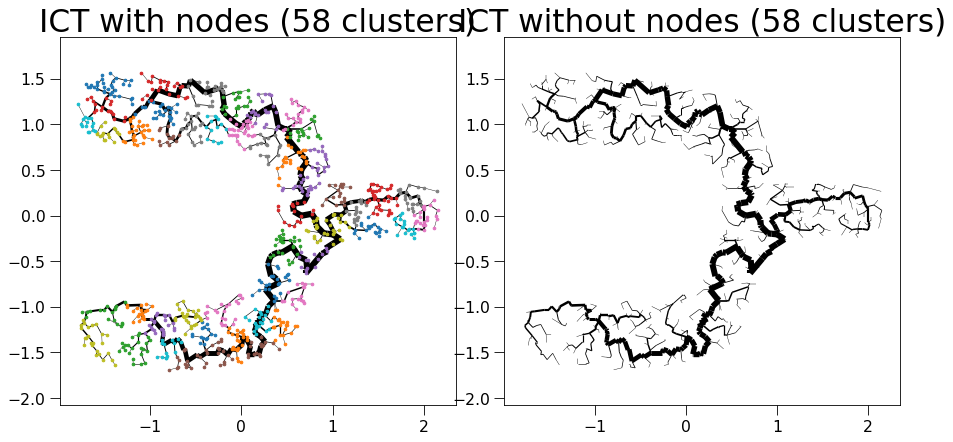

sklearn is done: 0.3269064426422119
My own part is done: 0.001323699951171875


  0%|          | 0/53 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 178 -> 151
update Arr 151 -> 128
update Arr 128 -> 112
update Arr 112 -> 101
update Arr 101 -> 89
update Arr 89 -> 67
update Arr 67 -> 55
update Arr 55 -> 49
update Arr 49 -> 37
update Arr 37 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 154 -> 123
update Arr 123 -> 96
update Arr 96 -> 80
update Arr 80 -> 68
update Arr 68 -> 60
update Arr 60 -> 53
update Arr 53 -> 46
update Arr 46 -> 34
update Arr 34 -> 32
update Arr 32 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 64
update Arr 64 -> 52
update Arr 52 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 125 -> 101
update Arr 101 -> 87
update Arr 87 -> 78
update Arr 78 -> 65
update Arr 65 -> 57
update Arr 57 -> 42
update Arr 42 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 152 -> 127
update Arr 127 -> 112
update Arr 112 -> 98
update Arr 98 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 55
update Arr 55 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/123 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/123 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 123 -> 107
update Arr 107 -> 90
update Arr 90 -> 79
update Arr 79 -> 70
update Arr 70 -> 51
update Arr 51 -> 44
update Arr 44 -> 39
update Arr 39 -> 30
update Arr 30 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 125
update Arr 125 -> 98
update Arr 98 -> 88
update Arr 88 -> 77
update Arr 77 -> 67
update Arr 67 -> 54
update Arr 54 -> 46
update Arr 46 -> 38
update Arr 38 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 144 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 74
update Arr 74 -> 63
update Arr 63 -> 54
update Arr 54 -> 42
update Arr 42 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 121
update Arr 121 -> 106
update Arr 106 -> 70
update Arr 70 -> 47
update Arr 47 -> 41
update Arr 41 -> 37
update Arr 37 -> 32
update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
Final k: 11


create edgeId array:   0%|          | 0/109 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/109 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 109 -> 92
update Arr 92 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 85
update Arr 85 -> 72
update Arr 72 -> 56
update Arr 56 -> 45
update Arr 45 -> 35
update Arr 35 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 16
update Arr 16 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 167 -> 138
update Arr 138 -> 119
update Arr 119 -> 103
update Arr 103 -> 91
update Arr 91 -> 74
update Arr 74 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 38
update Arr 38 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 65
update Arr 65 -> 53
update Arr 53 -> 47
update Arr 47 -> 36
update Arr 36 -> 29
update Arr 29 -> 22
update Arr 22 -> 18
update Arr 18 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 126 -> 109
update Arr 109 -> 83
update Arr 83 -> 66
update Arr 66 -> 58
update Arr 58 -> 48
update Arr 48 -> 42
update Arr 42 -> 34
update Arr 34 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 145 -> 114
update Arr 114 -> 93
update Arr 93 -> 84
update Arr 84 -> 75
update Arr 75 -> 64
update Arr 64 -> 54
update Arr 54 -> 42
update Arr 42 -> 37
update Arr 37 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/159 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/159 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 159 -> 129
update Arr 129 -> 116
update Arr 116 -> 103
update Arr 103 -> 92
update Arr 92 -> 80
update Arr 80 -> 70
update Arr 70 -> 59
update Arr 59 -> 48
update Arr 48 -> 39
update Arr 39 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/100 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/100 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 100 -> 80
update Arr 80 -> 71
update Arr 71 -> 62
update Arr 62 -> 46
update Arr 46 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 67
update Arr 67 -> 55
update Arr 55 -> 48
update Arr 48 -> 37
update Arr 37 -> 28
update Arr 28 -> 20
update Arr 20 -> 17
update Arr 17 -> 17
update Arr 17 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 190 -> 167
update Arr 167 -> 147
update Arr 147 -> 128
update Arr 128 -> 116
update Arr 116 -> 104
update Arr 104 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 54
update Arr 54 -> 47
update Arr 47 -> 41
update Arr 41 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 103 -> 90
update Arr 90 -> 78
update Arr 78 -> 65
update Arr 65 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 36
update Arr 36 -> 29
update Arr 29 -> 25
update Arr 25 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 79
update Arr 79 -> 66
update Arr 66 -> 57
update Arr 57 -> 50
update Arr 50 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 17
update Arr 17 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 118
update Arr 118 -> 104
update Arr 104 -> 94
update Arr 94 -> 81
update Arr 81 -> 71
update Arr 71 -> 62
update Arr 62 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 138 -> 117
update Arr 117 -> 100
update Arr 100 -> 82
update Arr 82 -> 73
update Arr 73 -> 61
update Arr 61 -> 55
update Arr 55 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/104 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/104 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 104 -> 94
update Arr 94 -> 72
update Arr 72 -> 58
update Arr 58 -> 39
update Arr 39 -> 29
update Arr 29 -> 25
update Arr 25 -> 23
update Arr 23 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 83
update Arr 83 -> 70
update Arr 70 -> 60
update Arr 60 -> 49
update Arr 49 -> 40
update Arr 40 -> 33
update Arr 33 -> 29
update Arr 29 -> 23
update Arr 23 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 164 -> 145
update Arr 145 -> 124
update Arr 124 -> 110
update Arr 110 -> 92
update Arr 92 -> 80
update Arr 80 -> 65
update Arr 65 -> 55
update Arr 55 -> 48
update Arr 48 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 24
Final k: 11


create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 212 -> 184
update Arr 184 -> 157
update Arr 157 -> 121
update Arr 121 -> 101
update Arr 101 -> 89
update Arr 89 -> 80
update Arr 80 -> 66
update Arr 66 -> 52
update Arr 52 -> 40
update Arr 40 -> 35
update Arr 35 -> 34
update Arr 34 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 160 -> 137
update Arr 137 -> 120
update Arr 120 -> 108
update Arr 108 -> 95
update Arr 95 -> 85
update Arr 85 -> 71
update Arr 71 -> 56
update Arr 56 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 35
update Arr 35 -> 29
update Arr 29 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
update Arr 23 -> 23
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 85
update Arr 85 -> 64
update Arr 64 -> 49
update Arr 49 -> 41
update Arr 41 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 62
update Arr 62 -> 51
update Arr 51 -> 43
update Arr 43 -> 39
update Arr 39 -> 32
update Arr 32 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 91
update Arr 91 -> 77
update Arr 77 -> 67
update Arr 67 -> 55
update Arr 55 -> 47
update Arr 47 -> 42
update Arr 42 -> 34
update Arr 34 -> 28
update Arr 28 -> 24
update Arr 24 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 69
update Arr 69 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 35
update Arr 35 -> 25
update Arr 25 -> 18
update Arr 18 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
update Arr 14 -> 14
Final k: 11


create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 95 -> 76
update Arr 76 -> 61
update Arr 61 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 28
update Arr 28 -> 19
update Arr 19 -> 17
update Arr 17 -> 15
update Arr 15 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 107
update Arr 107 -> 93
update Arr 93 -> 74
update Arr 74 -> 62
update Arr 62 -> 55
update Arr 55 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 104
update Arr 104 -> 93
update Arr 93 -> 81
update Arr 81 -> 65
update Arr 65 -> 53
update Arr 53 -> 48
update Arr 48 -> 41
update Arr 41 -> 32
update Arr 32 -> 25
update Arr 25 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 66
update Arr 66 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 30
update Arr 30 -> 27
update Arr 27 -> 22
update Arr 22 -> 16
update Arr 16 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 124
update Arr 124 -> 112
update Arr 112 -> 95
update Arr 95 -> 81
update Arr 81 -> 73
update Arr 73 -> 60
update Arr 60 -> 54
update Arr 54 -> 46
update Arr 46 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 27
update Arr 27 -> 22
update Arr 22 -> 16
update Arr 16 -> 13
update Arr 13 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 152 -> 132
update Arr 132 -> 118
update Arr 118 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 60
update Arr 60 -> 54
update Arr 54 -> 47
update Arr 47 -> 37
update Arr 37 -> 29
update Arr 29 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/76 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/76 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 76 -> 66
update Arr 66 -> 46
update Arr 46 -> 40
update Arr 40 -> 34
update Arr 34 -> 27
update Arr 27 -> 20
update Arr 20 -> 16
update Arr 16 -> 15
update Arr 15 -> 13
update Arr 13 -> 12
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 112
update Arr 112 -> 99
update Arr 99 -> 89
update Arr 89 -> 74
update Arr 74 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 120
update Arr 120 -> 104
update Arr 104 -> 94
update Arr 94 -> 83
update Arr 83 -> 74
update Arr 74 -> 65
update Arr 65 -> 51
update Arr 51 -> 45
update Arr 45 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 120 -> 93
update Arr 93 -> 83
update Arr 83 -> 63
update Arr 63 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
update Arr 24 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 83
update Arr 83 -> 66
update Arr 66 -> 52
update Arr 52 -> 45
update Arr 45 -> 34
update Arr 34 -> 30
update Arr 30 -> 21
update Arr 21 -> 20
update Arr 20 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 75
update Arr 75 -> 62
update Arr 62 -> 55
update Arr 55 -> 46
update Arr 46 -> 40
update Arr 40 -> 31
update Arr 31 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 161 -> 125
update Arr 125 -> 112
update Arr 112 -> 94
update Arr 94 -> 81
update Arr 81 -> 73
update Arr 73 -> 65
update Arr 65 -> 55
update Arr 55 -> 49
update Arr 49 -> 44
update Arr 44 -> 39
update Arr 39 -> 34
update Arr 34 -> 30
update Arr 30 -> 27
update Arr 27 -> 25
update Arr 25 -> 24
Final k: 11


create edgeId array:   0%|          | 0/154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 154 -> 136
update Arr 136 -> 115
update Arr 115 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 67
update Arr 67 -> 52
update Arr 52 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 29
update Arr 29 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 80
update Arr 80 -> 65
update Arr 65 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 38
update Arr 38 -> 29
update Arr 29 -> 24
update Arr 24 -> 21
update Arr 21 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/96 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/96 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 96 -> 73
update Arr 73 -> 62
update Arr 62 -> 53
update Arr 53 -> 48
update Arr 48 -> 38
update Arr 38 -> 32
update Arr 32 -> 23
update Arr 23 -> 21
update Arr 21 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 101 -> 75
update Arr 75 -> 52
update Arr 52 -> 46
update Arr 46 -> 41
update Arr 41 -> 35
update Arr 35 -> 29
update Arr 29 -> 22
update Arr 22 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 111 -> 95
update Arr 95 -> 69
update Arr 69 -> 52
update Arr 52 -> 41
update Arr 41 -> 34
update Arr 34 -> 27
update Arr 27 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 104
update Arr 104 -> 86
update Arr 86 -> 73
update Arr 73 -> 61
update Arr 61 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/127 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/127 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 127 -> 108
update Arr 108 -> 97
update Arr 97 -> 81
update Arr 81 -> 67
update Arr 67 -> 53
update Arr 53 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 20
update Arr 20 -> 18


Patching the components together:   0%|          | 0/53 [00:00<?, ?it/s]

Patching the components together:   0%|          | 0/3 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1089 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1089 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/999 [00:00<?, ?it/s]

update Arr 1089 -> 1007
added 263 edges early
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1007
update Arr 1007 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1006
update Arr 1006 -> 1005
update Arr 1005 -> 1004
added 2 edges early
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1004
update Arr 1004 -> 1003
added 2 edges early
update Arr 1003 -> 1002
added 2 edges early
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1002
update Arr 1002 -> 1001
update Arr 1001 -> 1001
update

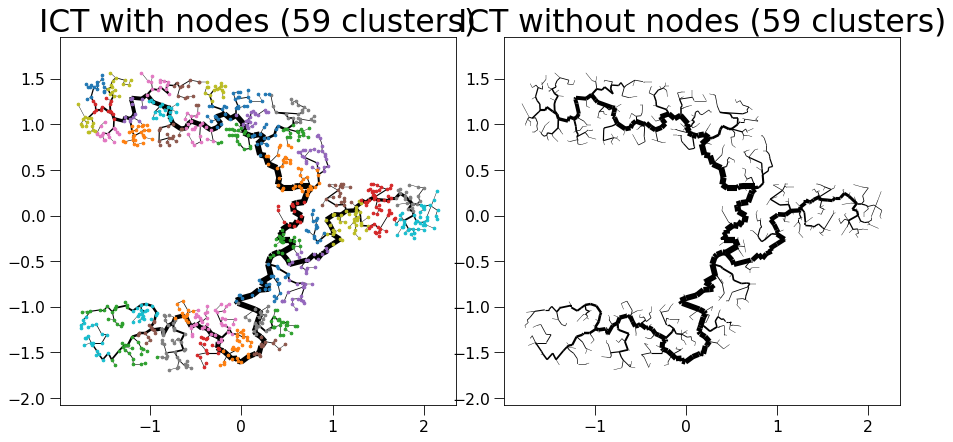

sklearn is done: 0.32239794731140137
My own part is done: 0.0014204978942871094


  0%|          | 0/51 [00:00<?, ?it/s]

Final k: 11


create edgeId array:   0%|          | 0/150 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/150 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 150 -> 131
update Arr 131 -> 119
update Arr 119 -> 105
update Arr 105 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 36
update Arr 36 -> 30
update Arr 30 -> 24
update Arr 24 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/214 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/214 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 214 -> 190
update Arr 190 -> 165
update Arr 165 -> 135
update Arr 135 -> 118
update Arr 118 -> 102
update Arr 102 -> 92
update Arr 92 -> 81
update Arr 81 -> 67
update Arr 67 -> 60
update Arr 60 -> 51
update Arr 51 -> 41
update Arr 41 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
Final k: 11


create edgeId array:   0%|          | 0/122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 122 -> 102
update Arr 102 -> 88
update Arr 88 -> 77
update Arr 77 -> 66
update Arr 66 -> 53
update Arr 53 -> 46
update Arr 46 -> 39
update Arr 39 -> 33
update Arr 33 -> 28
update Arr 28 -> 21
update Arr 21 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 181 -> 146
update Arr 146 -> 129
update Arr 129 -> 116
update Arr 116 -> 101
update Arr 101 -> 84
update Arr 84 -> 68
update Arr 68 -> 59
update Arr 59 -> 50
update Arr 50 -> 42
update Arr 42 -> 36
update Arr 36 -> 32
update Arr 32 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
Final k: 11


create edgeId array:   0%|          | 0/102 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/102 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/15 [00:00<?, ?it/s]

update Arr 102 -> 81
update Arr 81 -> 71
update Arr 71 -> 56
update Arr 56 -> 43
update Arr 43 -> 36
update Arr 36 -> 30
update Arr 30 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 15
Final k: 11


create edgeId array:   0%|          | 0/115 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/115 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 115 -> 89
update Arr 89 -> 79
update Arr 79 -> 62
update Arr 62 -> 55
update Arr 55 -> 45
update Arr 45 -> 36
update Arr 36 -> 32
update Arr 32 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/77 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/77 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 77 -> 67
update Arr 67 -> 57
update Arr 57 -> 48
update Arr 48 -> 40
update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 20
update Arr 20 -> 15
update Arr 15 -> 14
update Arr 14 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/86 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/86 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 86 -> 64
update Arr 64 -> 58
update Arr 58 -> 48
update Arr 48 -> 41
update Arr 41 -> 33
update Arr 33 -> 26
update Arr 26 -> 19
update Arr 19 -> 18
update Arr 18 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 121 -> 97
update Arr 97 -> 84
update Arr 84 -> 67
update Arr 67 -> 59
update Arr 59 -> 48
update Arr 48 -> 43
update Arr 43 -> 35
update Arr 35 -> 30
update Arr 30 -> 27
update Arr 27 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 135 -> 115
update Arr 115 -> 104
update Arr 104 -> 90
update Arr 90 -> 80
update Arr 80 -> 70
update Arr 70 -> 62
update Arr 62 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 32
update Arr 32 -> 30
update Arr 30 -> 27
update Arr 27 -> 24
update Arr 24 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/120 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/120 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/17 [00:00<?, ?it/s]

update Arr 120 -> 99
update Arr 99 -> 81
update Arr 81 -> 67
update Arr 67 -> 55
update Arr 55 -> 49
update Arr 49 -> 37
update Arr 37 -> 33
update Arr 33 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
Final k: 11


create edgeId array:   0%|          | 0/94 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/94 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 94 -> 73
update Arr 73 -> 66
update Arr 66 -> 50
update Arr 50 -> 44
update Arr 44 -> 31
update Arr 31 -> 25
update Arr 25 -> 24
update Arr 24 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 14
Final k: 11


create edgeId array:   0%|          | 0/129 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/129 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 129 -> 107
update Arr 107 -> 92
update Arr 92 -> 72
update Arr 72 -> 59
update Arr 59 -> 51
update Arr 51 -> 42
update Arr 42 -> 33
update Arr 33 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 156 -> 134
update Arr 134 -> 121
update Arr 121 -> 93
update Arr 93 -> 80
update Arr 80 -> 71
update Arr 71 -> 54
update Arr 54 -> 49
update Arr 49 -> 36
update Arr 36 -> 29
update Arr 29 -> 27
update Arr 27 -> 23
update Arr 23 -> 22
update Arr 22 -> 21
Final k: 11


create edgeId array:   0%|          | 0/219 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/219 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 219 -> 182
update Arr 182 -> 164
update Arr 164 -> 147
update Arr 147 -> 130
update Arr 130 -> 114
update Arr 114 -> 99
update Arr 99 -> 84
update Arr 84 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 34
update Arr 34 -> 32
update Arr 32 -> 31
Final k: 11


create edgeId array:   0%|          | 0/87 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/87 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 87 -> 77
update Arr 77 -> 68
update Arr 68 -> 58
update Arr 58 -> 49
update Arr 49 -> 41
update Arr 41 -> 34
update Arr 34 -> 22
update Arr 22 -> 17
update Arr 17 -> 16
update Arr 16 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 135 -> 106
update Arr 106 -> 91
update Arr 91 -> 75
update Arr 75 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 39
update Arr 39 -> 31
update Arr 31 -> 26
update Arr 26 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 19
Final k: 11


create edgeId array:   0%|          | 0/142 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/142 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 142 -> 126
update Arr 126 -> 108
update Arr 108 -> 93
update Arr 93 -> 78
update Arr 78 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 30
update Arr 30 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 20
Final k: 11


create edgeId array:   0%|          | 0/85 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/85 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13 [00:00<?, ?it/s]

update Arr 85 -> 66
update Arr 66 -> 52
update Arr 52 -> 47
update Arr 47 -> 41
update Arr 41 -> 34
update Arr 34 -> 27
update Arr 27 -> 23
update Arr 23 -> 19
update Arr 19 -> 16
update Arr 16 -> 14
update Arr 14 -> 13
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 193 -> 175
update Arr 175 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 93
update Arr 93 -> 83
update Arr 83 -> 68
update Arr 68 -> 60
update Arr 60 -> 40
update Arr 40 -> 38
update Arr 38 -> 35
update Arr 35 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
Final k: 11


create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/27 [00:00<?, ?it/s]

update Arr 193 -> 175
update Arr 175 -> 151
update Arr 151 -> 137
update Arr 137 -> 119
update Arr 119 -> 102
update Arr 102 -> 85
update Arr 85 -> 66
update Arr 66 -> 50
update Arr 50 -> 42
update Arr 42 -> 37
update Arr 37 -> 33
update Arr 33 -> 30
update Arr 30 -> 28
update Arr 28 -> 27
Final k: 11


create edgeId array:   0%|          | 0/161 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/161 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 161 -> 143
update Arr 143 -> 122
update Arr 122 -> 108
update Arr 108 -> 96
update Arr 96 -> 87
update Arr 87 -> 73
update Arr 73 -> 62
update Arr 62 -> 48
update Arr 48 -> 41
update Arr 41 -> 36
update Arr 36 -> 30
update Arr 30 -> 29
update Arr 29 -> 26
update Arr 26 -> 24
update Arr 24 -> 23
Final k: 11


create edgeId array:   0%|          | 0/143 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/143 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 143 -> 126
update Arr 126 -> 112
update Arr 112 -> 97
update Arr 97 -> 76
update Arr 76 -> 64
update Arr 64 -> 55
update Arr 55 -> 47
update Arr 47 -> 35
update Arr 35 -> 31
update Arr 31 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20
Final k: 11


create edgeId array:   0%|          | 0/149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 149 -> 131
update Arr 131 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 58
update Arr 58 -> 47
update Arr 47 -> 39
update Arr 39 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/125 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/125 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 125 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 71
update Arr 71 -> 54
update Arr 54 -> 41
update Arr 41 -> 31
update Arr 31 -> 28
update Arr 28 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 18
Final k: 11


create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 156 -> 141
update Arr 141 -> 128
update Arr 128 -> 110
update Arr 110 -> 87
update Arr 87 -> 72
update Arr 72 -> 58
update Arr 58 -> 50
update Arr 50 -> 44
update Arr 44 -> 35
update Arr 35 -> 32
update Arr 32 -> 25
update Arr 25 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
Final k: 11


create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 113 -> 90
update Arr 90 -> 65
update Arr 65 -> 57
update Arr 57 -> 36
update Arr 36 -> 32
update Arr 32 -> 26
update Arr 26 -> 22
update Arr 22 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
Final k: 11


create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

In [ ]:
for k in range(1, 61):
    cluster_centers, cluster_labels = k_means_pp(k, position, return_labels=True)

    if small_behavior == "remove":
        cluster_centers, cluster_labels, (position, ) = cfilter(cluster_centers, cluster_labels, t=min_cluster_size, position_likes=[position])
        number_of_nodes = len(position)
    if small_behavior == "reassign":
        cluster_centers, cluster_labels = cassign(cluster_centers, cluster_labels, position, t=min_cluster_size)

    sub_ICTs, components = calculate_sub_ICTs(position, cluster_centers, cluster_labels, t=min_cluster_size)


    # plot the ICT forest
    ICT_forest = nk.graph.Graph(n=len(position), weighted=True)
    distances = pairwise_distances(position, position)
    for component, sub_ICT in zip(components, sub_ICTs):
        for u, v, w in sub_ICT.iterEdgesWeights():
            nodeA = component[u]
            nodeB = component[v]
            ICT_forest.addEdge(nodeA, nodeB, distances[nodeA, nodeB])

    ICT_forest.indexEdges()

    G = patch_together(ICT_forest, position, bridges=4)

    ICT = calculate_ICT(G, algorithm_type=ICT_algorithm, cluster_centers=cluster_centers,
                                    zeros_stay_zeros=True, update_G=1.1)
    ICT.indexEdges()
    
    # Plot the ICT
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    plot_points(position, f"ICT with nodes ({k} clusters)", axs[0], labels=np.array(cluster_labels), node_size=5)
    axs[0].get_legend().remove()
    plot_graph(ICT, position, f"ICT with nodes ({k} clusters)", axs[0], node_size=0, edge_scale=0.5)
    plot_graph(ICT, position, f"ICT without nodes ({k} clusters)", axs[1], node_size=0, edge_scale=0.5)
    name = str(k)
    plt.tight_layout()
    plt.savefig(f"Output/Images/"+ name.zfill(5) + ".png")
    plt.show()